In [65]:
from functions1 import *

In [66]:
import sys, importlib
importlib.reload(sys.modules['functions1'])
from functions1 import *

comparar valores de EW calculados com e sim binning

Voronoi binning

**Analysing SN2010ev, in galaxy NGC 3244, which has redshift z=0.009213 ± 7.00e-6 (He)**

# Importing data

In [3]:
#import data
file_name="../SN2010ev.fits"
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


print(cube[0])
print(cube[0][200][300])

x_len=len(cube[0][0])
y_len=len(cube[0])

(3681, 341, 604)
[[     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]
 ...
 [     nan      nan      nan ... 69.65055      nan      nan]
 [     nan      nan      nan ... 68.30897      nan      nan]
 [     nan      nan      nan ...      nan      nan      nan]]
91.866684


In [4]:
#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) - CRPIX))

In [5]:
#testing function findWavelengths
result = findWavelengths(wave, 5000)
print("Closest elements:", result)

result = findWavelengths(wave, [5000,4000,6000])
print("Closest elements:", result)

Closest elements: (4999.6923828125, 201)
Closest elements: [(4999.6923828125, 201), (4748.4423828125, 0), (5999.6923828125, 1001)]


# Plotting cube images

## Plotting cube at Hα

In [6]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

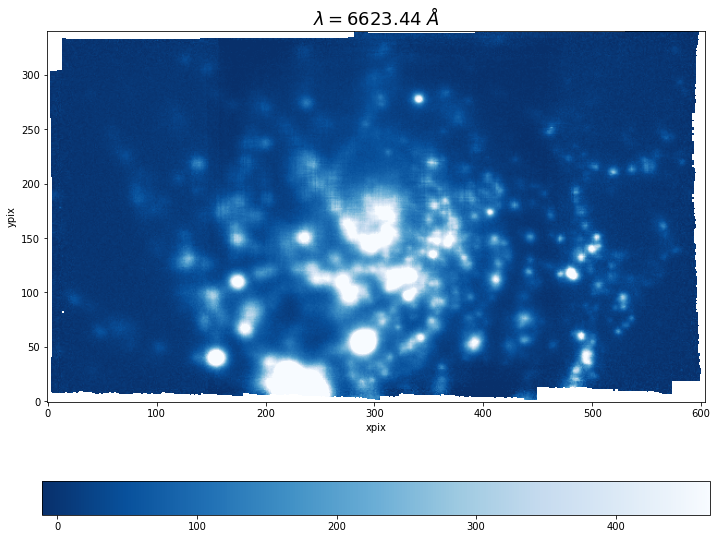

In [7]:
img_data=cube[index]

plot_image(img_data,wavelen, index, 'Blues_r')

In [8]:
print('Min:', np.nanmin(img_data))
print('Max:', np.nanmax(img_data))
print('Mean:', np.nanmean(img_data))
print('Stdev:', np.nanstd(img_data))

Min: -67.27145
Max: 6526.5054
Mean: 62.408295
Stdev: 175.11049


In [9]:
len(img_data.flatten())
y_len*x_len

205964

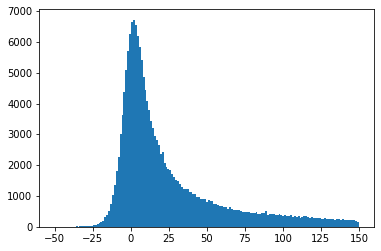

In [10]:
histogram = plt.hist(img_data.flatten(), bins='auto',range=[-50,150])

## Plotting cube at various wavelengths

In [11]:
W=5000
V=5510 #V (Visible/Green): ~551 nm
R=6580 #R (Red): ~658 nm

halpha=6563

xx=[W,V,R,halpha_obs]

selection=findWavelengths(wave, xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

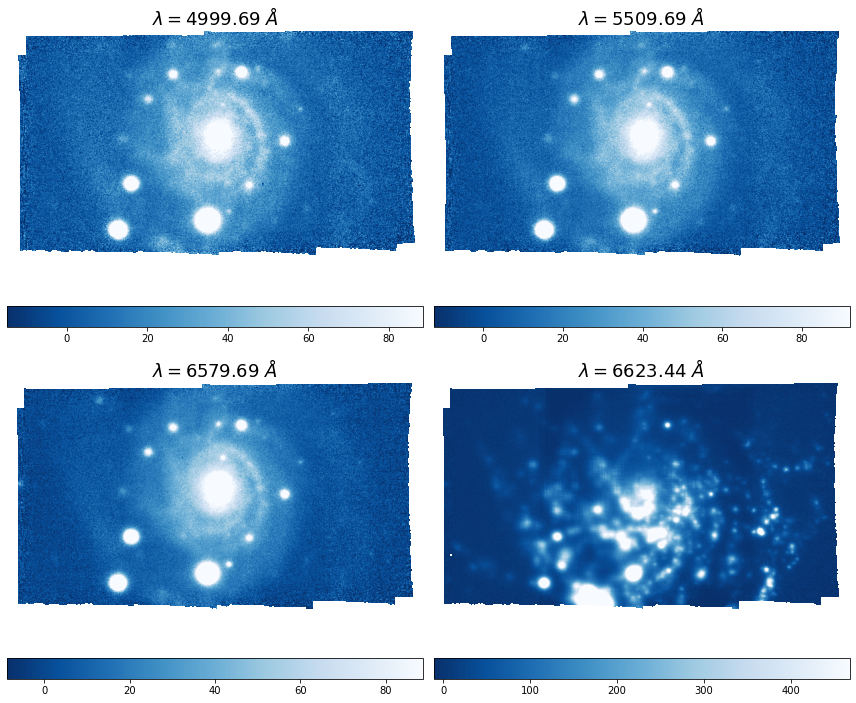

In [12]:
plot_image(cube[indices],wave[indices], indices, 'Blues_r')

## Making a gif around Halpha

In [13]:
xx=[halpha_obs-10,halpha_obs+10]

selection=findWavelengths(wave,xx)

waves=np.transpose(selection)[0]
indices=np.transpose(selection)[1]
indices = indices.astype(int)

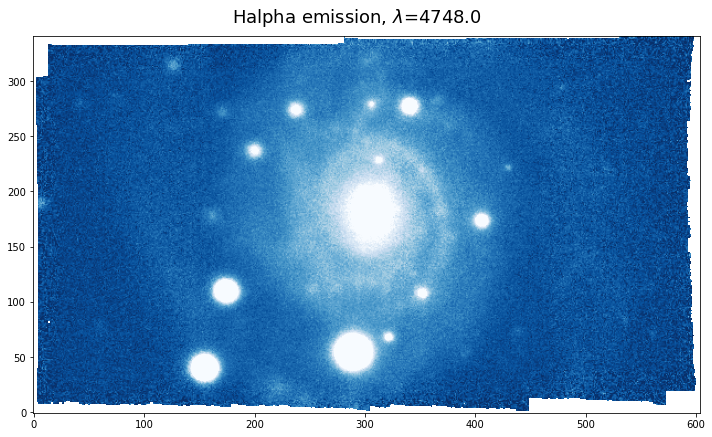

In [14]:


image_array = cube[indices[0]:indices[1]]



fig, ax = plt.subplots(figsize=(10, 8))


# Set the initial image
image=cube[indices[0]];
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)

im = ax.imshow(image, animated=True,cmap="Blues_r",origin='lower',clim=(lo,up))
plt.tight_layout()
def update(i):
    im.set_array(image_array[i])
    fig.suptitle("Halpha emission, $\lambda$="+str(round(wave[i],0)),fontsize=18,y=0.85)
    
    return im,


# Create the animation object
animation_fig = animation.FuncAnimation(fig, update, frames=len(image_array), interval=400, blit=True,repeat_delay=15,)

# Show the animation
plt.tight_layout()
plt.show()

animation_fig.save("im.gif")

In [15]:
from PIL import Image

im = []
for n in range(20):
    arr = np.random.randint(low = 0, high = 255, size = (300, 300, 3))
    im.append(Image.fromarray(arr.astype('uint8')))

im[0].save('im.gif', save_all=True, append_images=im[1:], optimize=False, duration=200, loop=0)

## Plotting median within a certain waveband

0 1
[4748.44238281 4749.69238281]


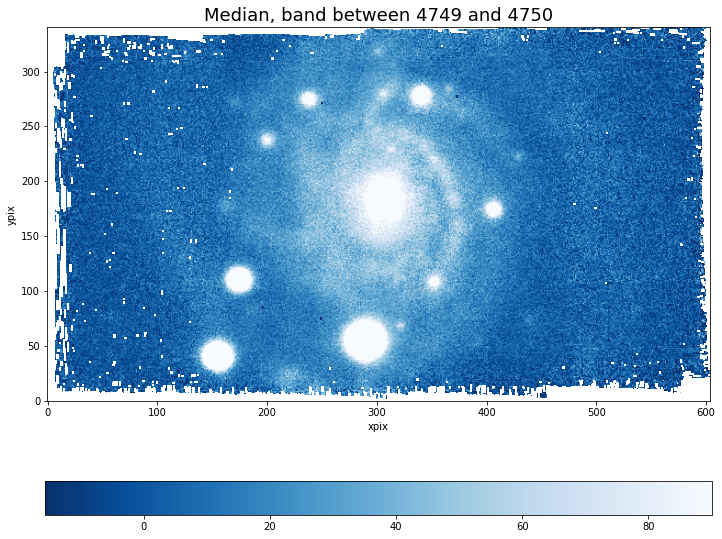

In [16]:
med=median(cube,wave,[4749,4750])


plot_image(med,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Median, band between 4749 and 4750')


#median(cube,wave,[np.max(wave),np.min(max)])


## Plotting average within a certain waveband

0 1
[4748.44238281 4749.69238281]


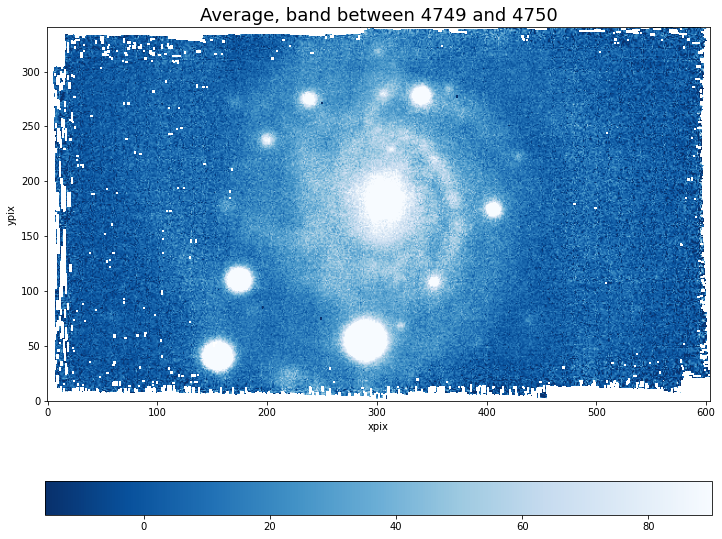

In [17]:
ave=average(cube,wave,[4749,4750])


plot_image(ave,wavelengths=[4749,4750],index=[4749,4750], colormap='Blues_r',title='Average, band between 4749 and 4750')


#ave(cube,wave,[np.max(wave),np.min(max)])


# Binning

## Binning 2x2

In [18]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

img_data=cube[index]

print("dimensions before binning: ", len(img_data),len(img_data[0]))

binned_data=binning(img_data,4)

print("dimensions after binning: ", len(binned_data),len(binned_data[0]))


dimensions before binning:  341 604
dimensions after binning:  86 151


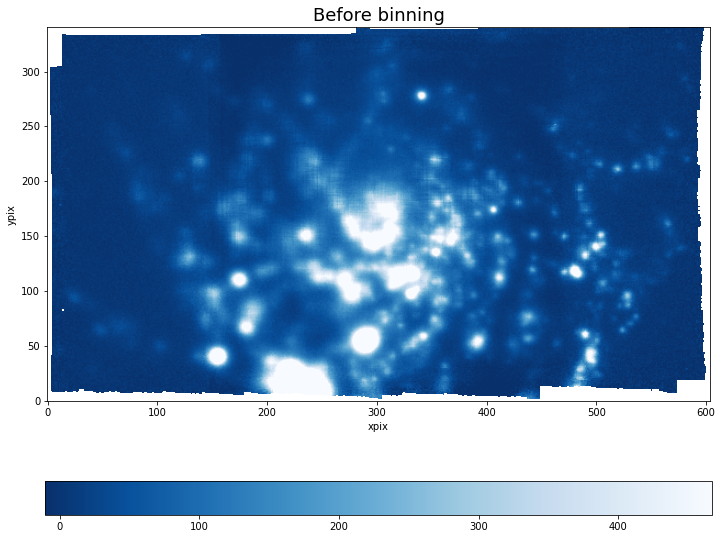

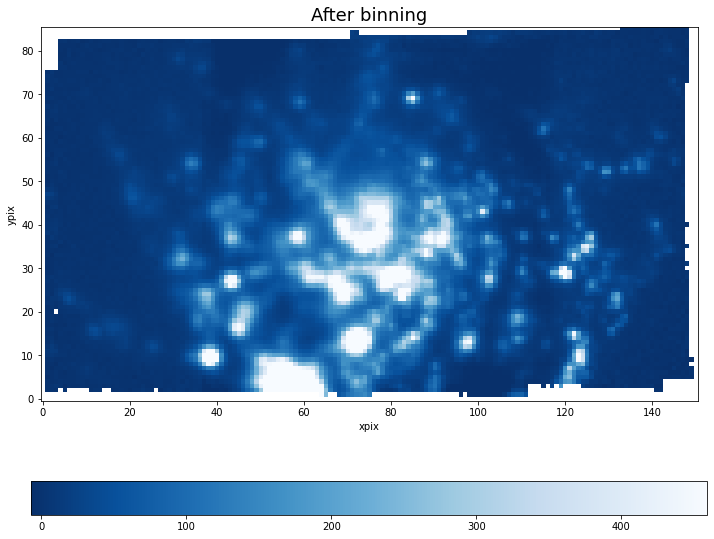

In [19]:
plot_image(img_data,wavelen, index, 'Blues_r', "Before binning")
plot_image(binned_data,wavelen, index, 'Blues_r',"After binning")

In [20]:
np.shape(cube)

(3681, 341, 604)

## Region w/ high SNR

Zoom in area of background signal

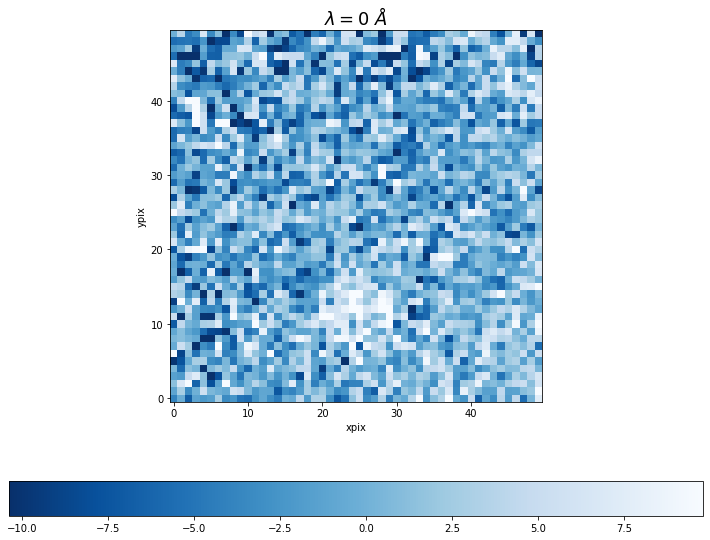

In [21]:
bg=img_data[270:320, 15:65]
plot_image(bg,0,0,'Blues_r')

In [22]:
# background noise
noise = np.nanstd(bg)

snr_map = img_data / noise
mean_snr = np.nanmean(snr_map)
threshold = 0.5 * mean_snr


square_size = 1000


#best square
best_square = None
best_snr = -np.inf  
best_coords = (0, 0)


h, w = image.shape
for y in range(0, h - square_size + 1, square_size):
    for x in range(0, w - square_size + 1, square_size):
        
        block = snr_map[y:y+square_size, x:x+square_size]

        block_mean_snr = np.mean(block)

        if block_mean_snr > best_snr:
            best_snr = block_mean_snr
            best_square = block
            best_coords = (y, x)

if best_square is not None:
    np.save("../best_snr_square.npy", best_square)
    print(f"Saved the best SNR square at {best_coords} with mean SNR {best_snr:.2f}")

best_square = np.load("../best_snr_square.npy")
print(best_square)

[[24.733227  23.659376  23.296698  ...  8.002031   6.8485003  6.3015223]
 [25.289423  24.369799  22.9598    ...  6.986258   6.1466255  7.6385193]
 [23.431923  22.804512  24.332674  ...  7.397483   7.678427   5.837128 ]
 ...
 [31.349007  31.20333   35.570824  ... 10.715965  10.636392  11.201308 ]
 [28.347382  27.447086  30.333021  ...  9.965655  11.025977  11.6718   ]
 [25.059385  26.852942  27.987513  ...  9.946177  11.049753  11.41961  ]]


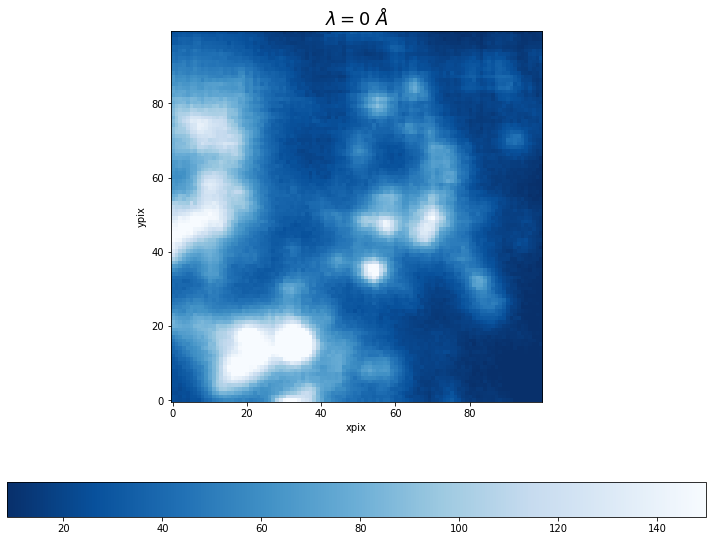

In [23]:
plot_image(best_square,0,0,'Blues_r')

## Binning of galaxy bulge

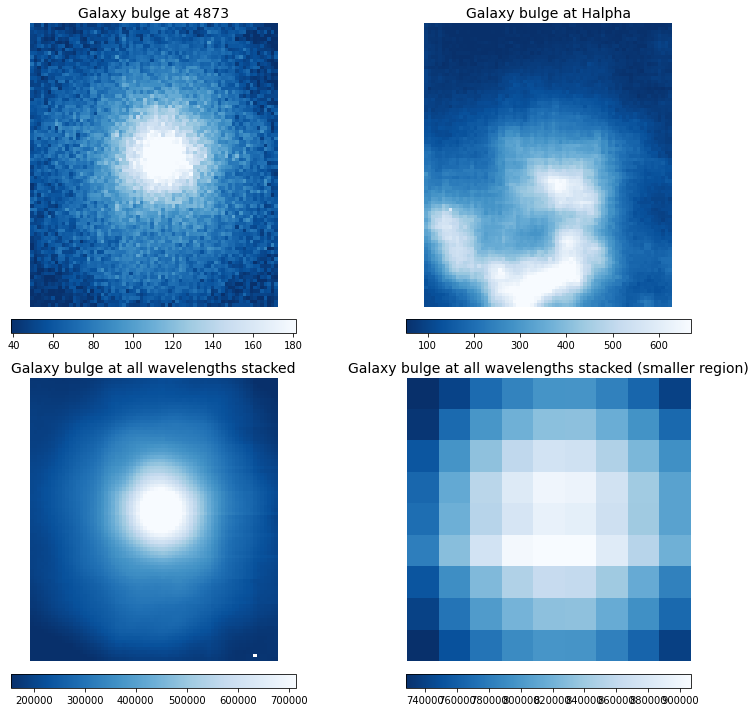

In [24]:
bulge=cube[:,140:220,270:340];
ebulge=ecube[:,140:220,270:340];

small_bulge=cube[:,178:187,302:311]
#small_bulge=cube[:,181:185,305:307]

images = [
    bulge[100],
    bulge[index], 
    stack_all(bulge),
    stack_all(small_bulge)
]

titles = [
    "Galaxy bulge at "+str(int(round(wave[100],0))),
    "Galaxy bulge at Halpha",
    "Galaxy bulge at all wavelengths stacked",
    "Galaxy bulge at all wavelengths stacked (smaller region)"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [25]:
stacked_bulge=stack(bulge,wave,number_images=10,central_wavelength=halpha_obs)
stacked_ebulge=stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs)

binned_bulge=binning(bulge[index],4)
ebinned_bulge=binning(ebulge[index],4)

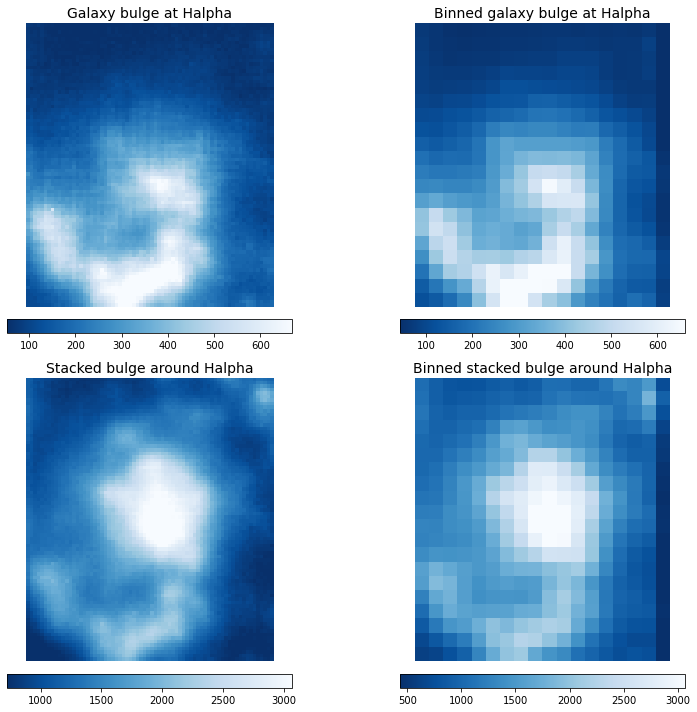

In [26]:
images = [
    bulge[index], 
    binned_bulge, 
    stacked_bulge, 
    binning(stacked_bulge, 4)
]

titles = [
    "Galaxy bulge at Halpha",
    "Binned galaxy bulge at Halpha",
    "Stacked bulge around Halpha",
    "Binned stacked bulge around Halpha"
]

plot_images(images, wavelengths=[0, 0, 0, 0], colormap='Blues_r', titles=titles)


In [27]:
binned_stacked_bulge=binning(stack(bulge,wave,number_images=10,central_wavelength=halpha_obs),4)
binned_stacked_ebulge=binning(stack(ebulge,wave,number_images=10,central_wavelength=halpha_obs),4)

print("Median SNR before binning = ",np.median(signaltonoise(stacked_bulge,stacked_ebulge)), "\nMedian SNR after stacking&binning = ",np.median(signaltonoise(binned_stacked_bulge,binned_stacked_ebulge)))
      

Median SNR before binning =  4.6879454 
Median SNR after stacking&binning =  4.642662903020382


so SNR is lower after binning?(*) could be because i am computing the same SNR for a bin for all the pixels that were collapsed

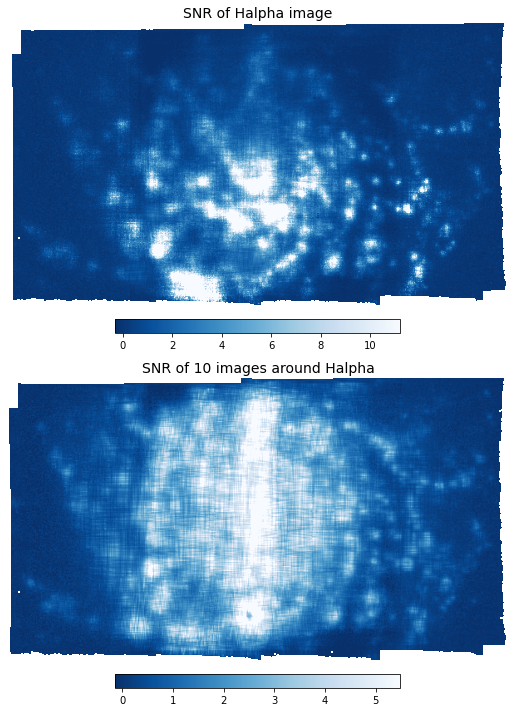

Average of SNR in the image is  1.5096688
Average of SNR in the image is  1.4523461
Median of SNR in the image is  0.4109841
Median of SNR in the image is  0.79283464

SNR gets worse on average, but not in median(**)


In [28]:
snr1=signaltonoise(cube[index],ecube[100])
#plot_image(snr,0,0,colormap='Blues_r',title="SNR of Halpha image")

stacked_galaxy=stack(cube,wave,number_images=10,central_wavelength=halpha_obs)
stacked_uncertainties=stack(ecube,wave,number_images=10,central_wavelength=halpha_obs)


snr2=signaltonoise(stacked_galaxy,stacked_uncertainties)

plot_images([snr1,snr2],wavelengths=[0, 0],colormap='Blues_r',titles=["SNR of Halpha image","SNR of 10 images around Halpha"])

print("Average of SNR in the image is ",np.nanmean(snr1))
print("Average of SNR in the image is ",np.nanmean(snr2))
print("Median of SNR in the image is ",np.nanmedian(snr1))
print("Median of SNR in the image is ",np.nanmedian(snr2))
print("\nSNR gets worse on average, but not in median(**)")

## Stacked galaxy bulge spetra

Text(0.5, 1.0, 'Median spectra of galaxy bulge')

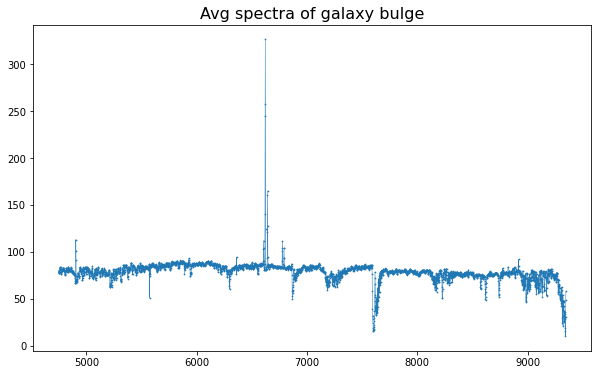

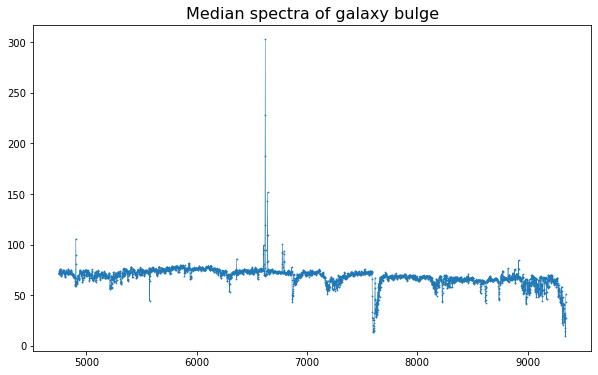

In [29]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(bulge),s=0.5)
plt.title("Avg spectra of galaxy bulge",fontsize=16)



plt.figure(figsize=(10,6))

median_bulge=median_spectra_of_region(bulge)
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)
plt.title("Median spectra of galaxy bulge",fontsize=16)




In [30]:
new_wave=wave/(1+z)
halpha_obs

6623.2630764

in x_obs we look for halpha_obs=6562.8*(1+z)

so in x_obs/(1+z) we look for 6562.8

Text(0.5, 1.0, 'Median spectra of smaller region of galaxy bulge')

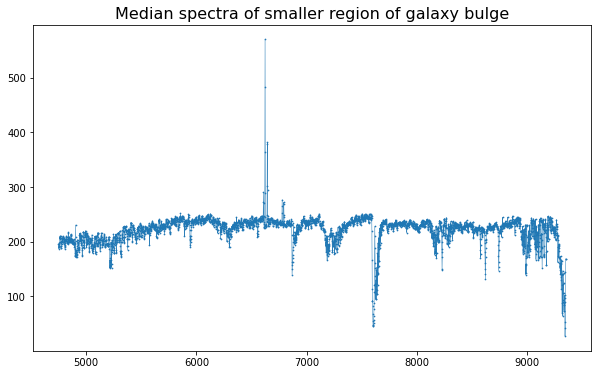

In [31]:
plt.figure(figsize=(10,6))



plt.plot(wave,median_spectra_of_region(small_bulge),linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_spectra_of_region(small_bulge),s=0.5)
plt.title("Median spectra of smaller region of galaxy bulge",fontsize=16)

#plt.xlim(halpha_obs-50,halpha_obs+50)

## Different galaxy regions

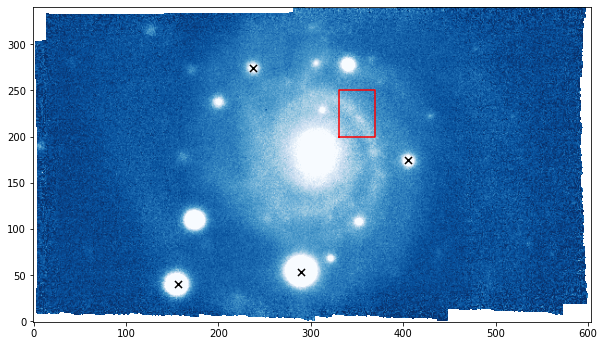

In [32]:
arm=cube[:,200:250,330:370]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [330, 330, 370, 370, 330]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline


star_x=[289,156,237,405]#175
star_y=[53,40,274,175]#110
plt.scatter(star_x,star_y,s=50,marker='x',c='black')


spectra at star (single pixel)

In [33]:
arr=np.transpose((star_x,star_y))
lbls = ["Star (single pixel spectra) at (x,y)= ({},{})".format(row[0], row[1]) for row in arr]

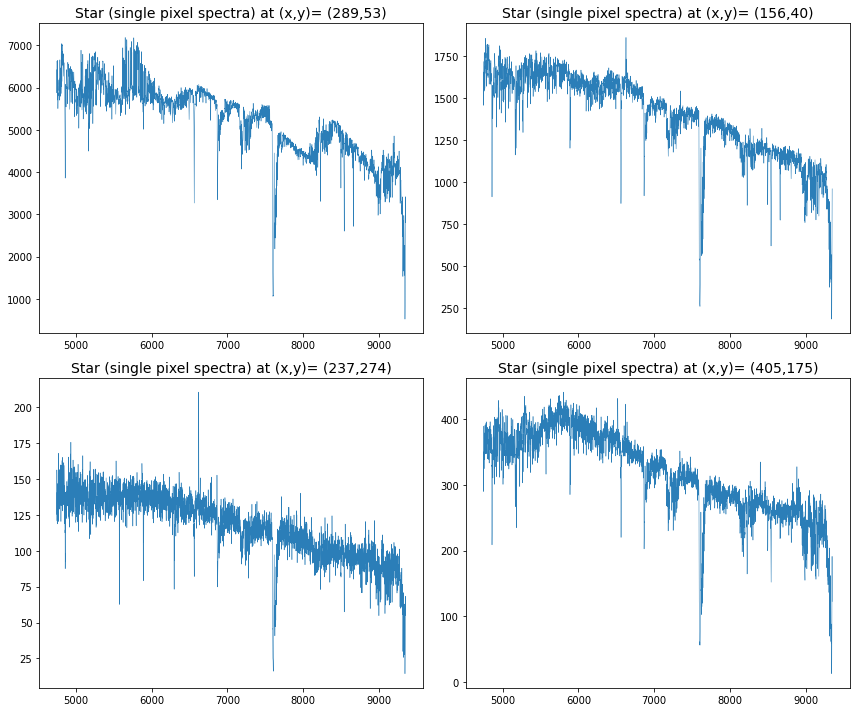

In [34]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = np.array(axes).reshape(-1)
    
for i in range(4):
    lo, up = np.nanpercentile(images[i], 2), np.nanpercentile(images[i], 98)
    im = axes[i].plot(wave,cube[:,star_y[i],star_x[i]],linewidth=0.5,alpha=0.95)
    axes[i].set_title(lbls[i], fontsize=14)
    
# Hide unused subplots if grid has extra slots
for j in range(4, len(axes)):
    axes[j].axis('off')
    
    

plt.tight_layout()
plt.show()


Text(0.5, 1.0, 'Median spectra of galaxy arm')

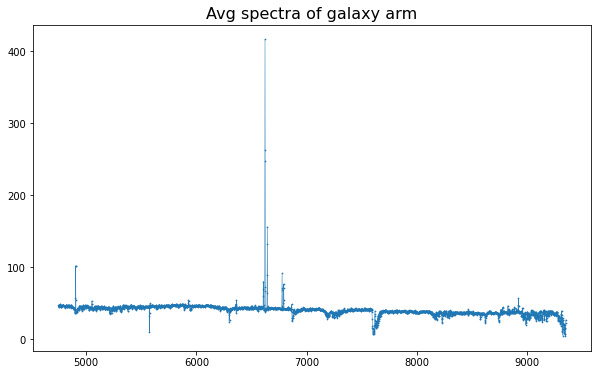

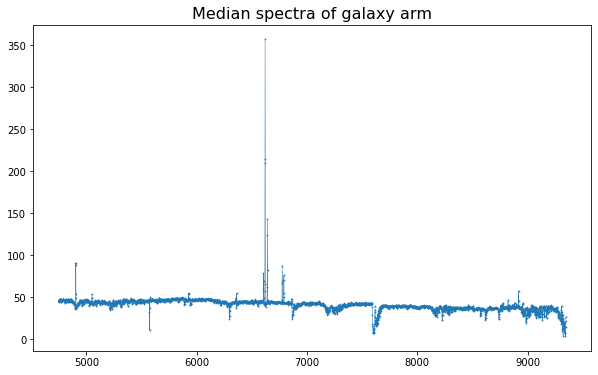

In [35]:
plt.figure(figsize=(10,6))

plt.plot(wave,avg_spectra_of_region(arm),linewidth=0.5,alpha=0.95)
plt.scatter(wave,avg_spectra_of_region(arm),s=0.5)
plt.title("Avg spectra of galaxy arm",fontsize=16)



plt.figure(figsize=(10,6))

median_arm=median_spectra_of_region(arm)
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy arm",fontsize=16)

Text(0.5, 1.0, 'Median spectra of galaxy bg')

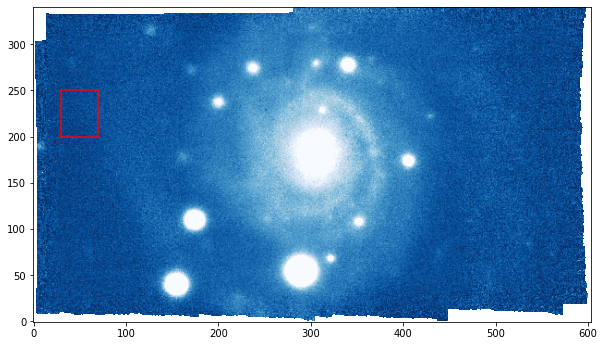

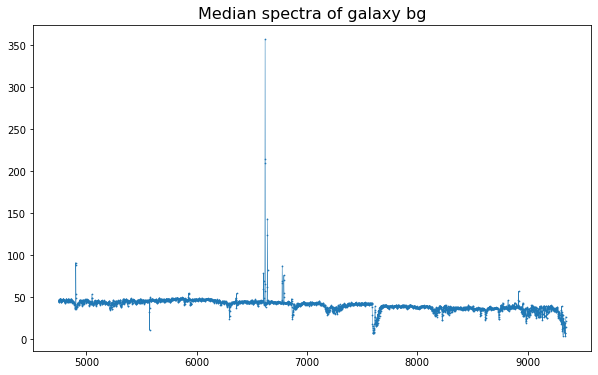

In [36]:
bg=cube[:,200:250,30:70]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [30, 30, 70, 70, 30]
y_coords = [200, 250, 250, 200, 200] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline




plt.figure(figsize=(10,6))

plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)
plt.title("Median spectra of galaxy bg",fontsize=16)

## Plotting uncertainty of spectra

In [37]:
uncertainty=ecube[:,200:250,30:70]
y_err=np.sqrt(np.median(uncertainty, axis=(1, 2)));

np.median(uncertainty[2])

88.63081

In [38]:
median_bg=median_spectra_of_region(bg)

y_err2=mad(median_bg)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 0.21641612


In [39]:
np.sqrt(y_err[2])

3.0682886

In [40]:
median_bg=median_spectra_of_region(bg)

Text(0.5, 1.0, 'Background spectra')

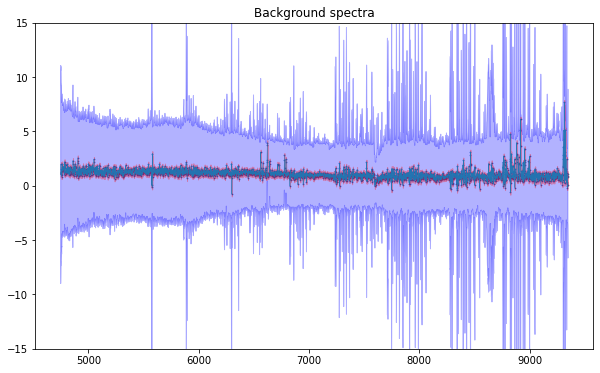

In [41]:
plt.figure(figsize=(10,6))

plt.plot(wave,median_bg,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bg,s=0.5)

plt.fill_between(wave,median_bg - y_err, median_bg + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bg - y_err2, median_bg + y_err2, color='red', alpha=0.3, label="Uncertainty")
plt.ylim(-15,15)

plt.title("Background spectra")

In [42]:
y_err2=mad(median_bulge)
print(y_err,y_err2)

[      nan 10.026817  9.414394 ...  6.174121  7.762108       nan] 3.808239


Text(0.5, 1.0, 'Bulge spectra')

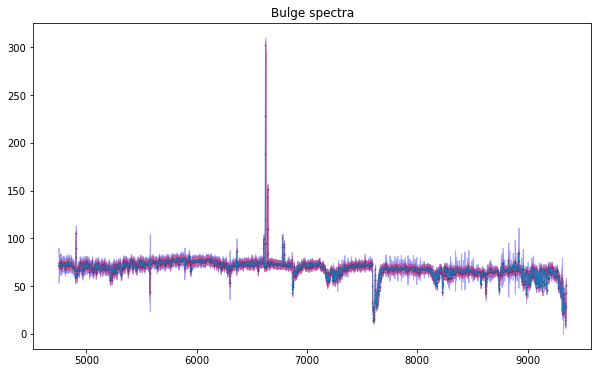

In [43]:
y_err=np.sqrt(np.median(ebulge, axis=(1, 2)));#median absolute deviaton=MAD

plt.figure(figsize=(10,6))

plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(wave,median_bulge - y_err2, median_bulge + y_err2, color='red', alpha=0.3, label="Uncertainty")
#plt.ylim(-15,15)
plt.title("Bulge spectra")

In [44]:
print("median snr of spectra is ",np.nanmedian(signaltonoise_spec(median_bulge,y_err)))

median snr of spectra is  13.528046


# EW

## EW - parametric

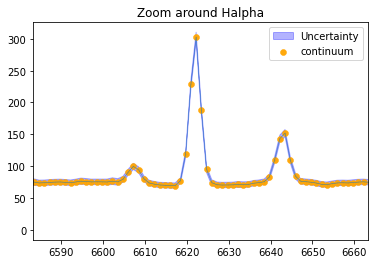

In [45]:
plt.plot(wave,median_bulge,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_bulge,s=0.5)

plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")

x_min, x_max= plt.xlim(halpha_obs-40,halpha_obs+40)
plt.title("Zoom around Halpha")
x_chopped,y_chopped=chop_data(wave,median_bulge,x_min,x_max)

plt.scatter(x_chopped,y_chopped,linewidth=0.5,alpha=0.95,color="orange",label="continuum")

plt.legend()

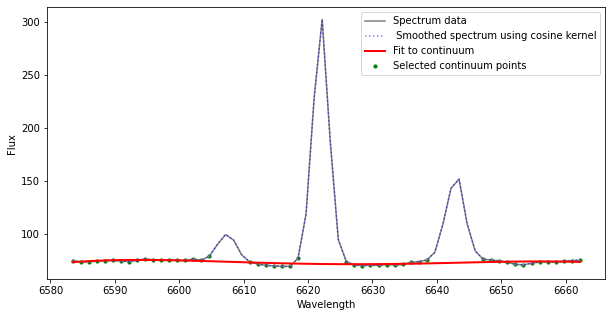

In [46]:
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

continuum_fit, x_continuum, y_continuum=continuum(x_chopped,y_smooth)

y_continuum_fit = continuum_fit(x_chopped)


plt.figure(figsize=(10, 5))
plt.plot(x_chopped, y_chopped, label="Spectrum data", color="gray")
plt.plot(x_chopped, y_smooth, label=" Smoothed spectrum using cosine kernel", color="blue", alpha=0.5,linestyle="dotted")
plt.plot(x_chopped, y_continuum_fit, label="Fit to continuum", color="red", linewidth=2)
plt.scatter(x_continuum, y_continuum, color="green", s=10, label="Selected continuum points")
plt.xlabel("Wavelength")
plt.ylabel("Flux")
plt.legend()
#plt.xlim(6400,6500)
plt.show()

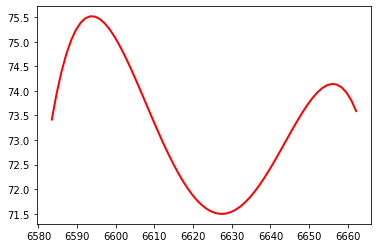

In [47]:
plt.plot(x_chopped, y_continuum_fit, label="Fitted Continuum (5th order)", color="red", linewidth=2)


Text(0.5, 1.0, 'Zoom around Halpha')

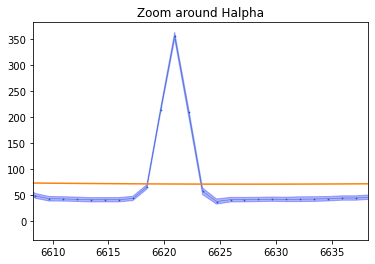

In [48]:
plt.plot(wave,median_arm,linewidth=0.5,alpha=0.95)
plt.scatter(wave,median_arm,s=0.5)

plt.fill_between(wave,median_arm - y_err, median_arm + y_err, color='blue', alpha=0.3, label="Uncertainty")
#plt.ylim(-5,100)
plt.xlim(halpha_obs-15,halpha_obs+15)
plt.plot(x_chopped,y_continuum_fit)
plt.title("Zoom around Halpha")

Fitted Amplitude (A): 273.64393394258764
Fitted Mean (mu): 6622.004933078535
Fitted Standard Deviation (sigma): 1.9796754082971693
Integral using Simpson's rule: 1277.3566


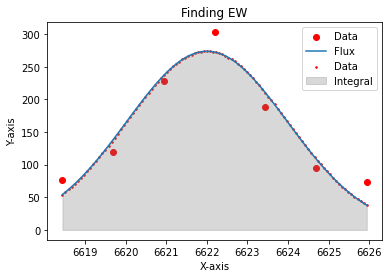

In [49]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6627)[1])

x = wave[bound1:bound2]
y = median_bulge[bound1:bound2]


initial_guess = initial_guess = [max(y), np.mean(x), np.std(x)]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])



# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")


##

xx = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

#integral
integral_simps = simps(y_fit, xx)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

plt.scatter(x, y, label="Data", color="red")
plt.plot(xx, y_fit, label="Flux")
plt.scatter(xx, y_fit, label="Data", color="red",s=2.4)
#plt.fill_between(wave,median_bulge - y_err, median_bulge + y_err, color='blue', alpha=0.3, label="Uncertainty")
plt.fill_between(xx, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


integrating smoothed spectra

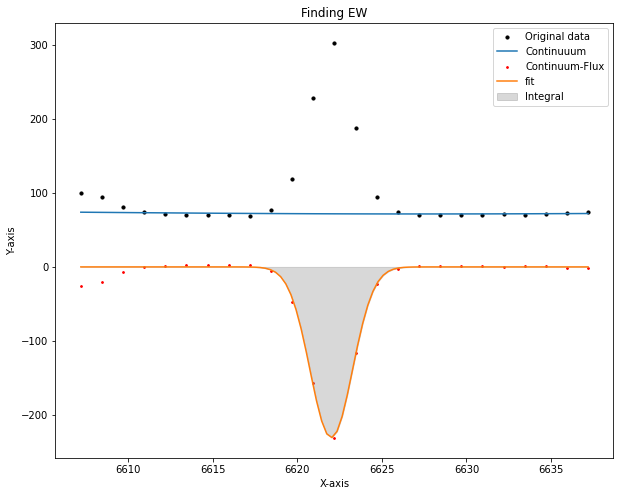

EW calculated through a parametric approach is ==  -19.954243283072405


In [67]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,continuum_fit,method=0,plots=True))

## fitting cont+peak together - parametric

EW calculated through a parametric approach is ==  -19.861811851022836


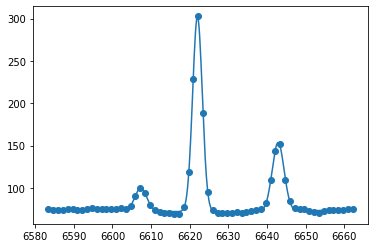

In [68]:
bound1=halpha_obs-40
bound2=halpha_obs+40

x,y=chop_data(wave,median_bulge,bound1,bound2)

    
print("EW calculated through a parametric approach is == ", EW_parametric(x,y,continuum_fit,plots=False,method=1))

## picking region

In [69]:
x1=300
x2=420
y1=120
y2=200

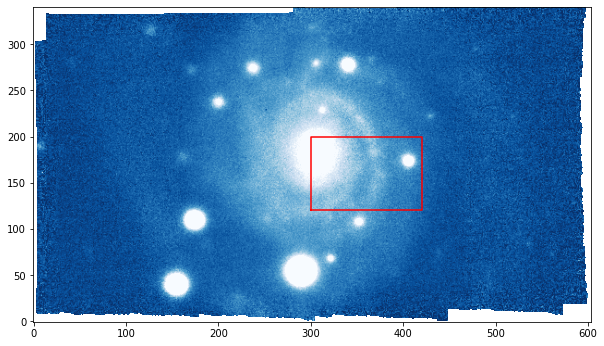

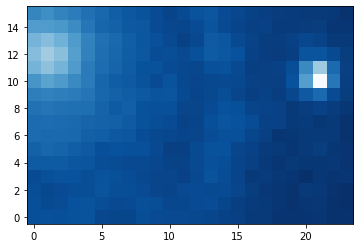

(8, 12)


In [70]:
region=cube[:,y1:y2,x1:x2]
           
i=findWavelengths(wave, R)[1]


lo,up = np.nanpercentile(cube[i],2),np.nanpercentile(cube[i],98)
plt.figure(figsize=(10, 8))
plt.imshow(cube[i],cmap='Blues_r',origin='lower',clim=(lo,up))


x_coords = [x1, x1, x2, x2, x1]
y_coords = [y1, y2, y2, y1, y1] 
plt.plot(x_coords, y_coords, 'r-', linewidth=1.5)  # Red outline

plt.show()

plt.imshow(binning(region[10], 5),"Blues_r",origin='lower');

plt.show()

print(np.shape(binning(region[10], 10)))

In [71]:
binned_region=[]

for w in range(0,len(wave)):
    binned_region.append(binning(region[w], 5))

In [72]:
print(np.shape(binned_region))

(3681, 16, 24)


In [73]:
halpha_obs

6623.2630764

In [74]:
binned_region=np.array(binned_region)

## EW map - parametric

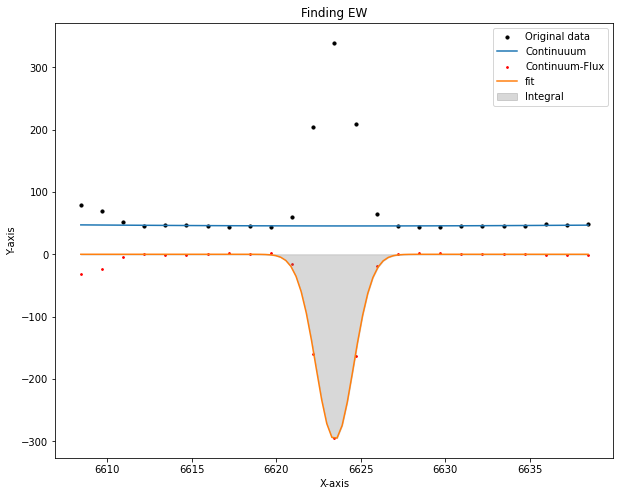

EW= -35.94532816251932  at (i,j)= 0 , 0


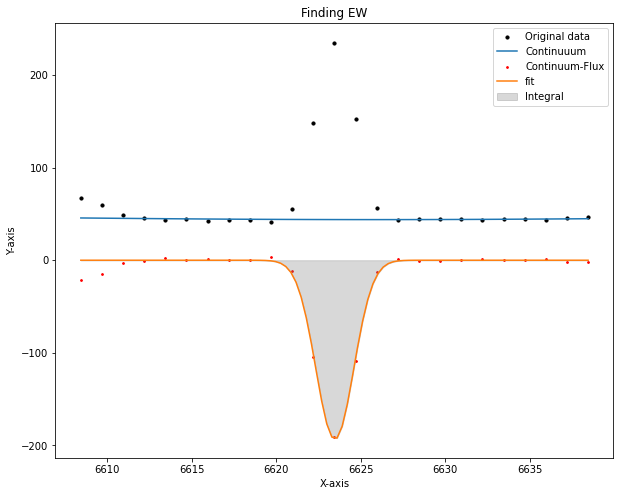

EW= -24.480761783896366  at (i,j)= 0 , 1


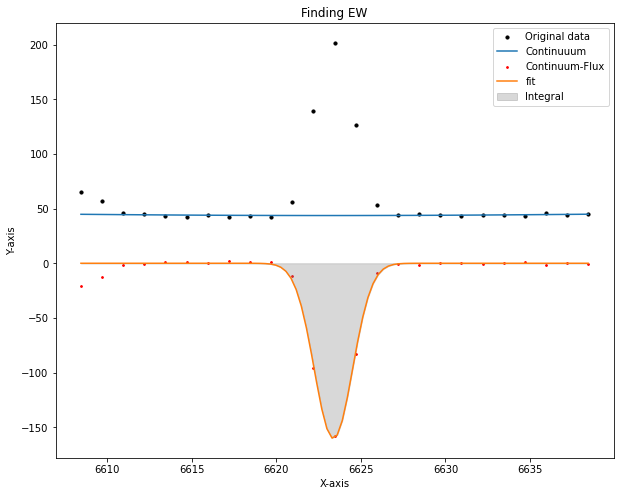

EW= -20.595485293178598  at (i,j)= 0 , 2


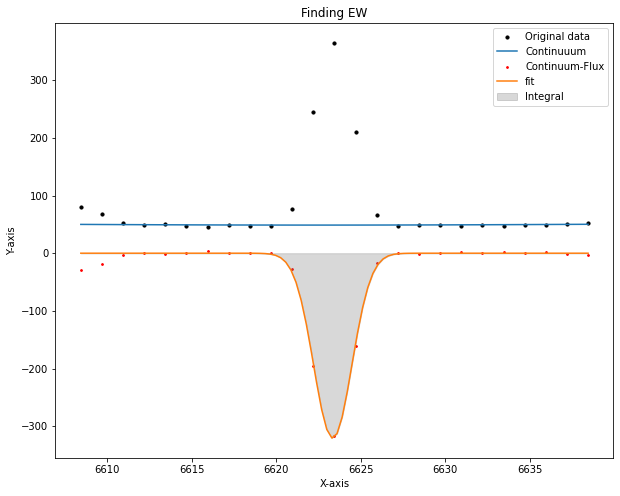

EW= -36.87523601650354  at (i,j)= 0 , 3


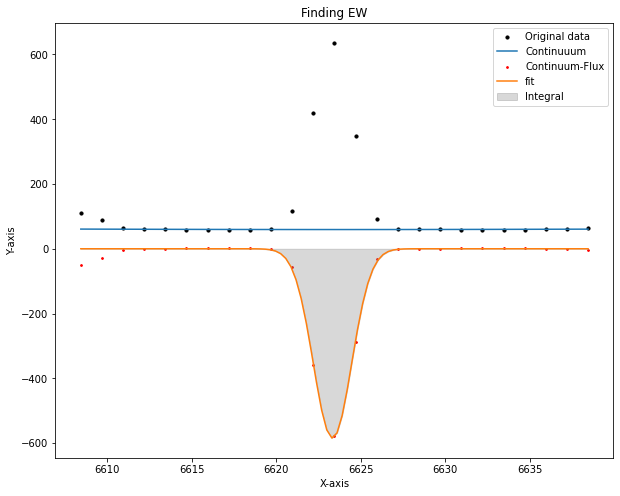

EW= -55.43435852063295  at (i,j)= 0 , 4


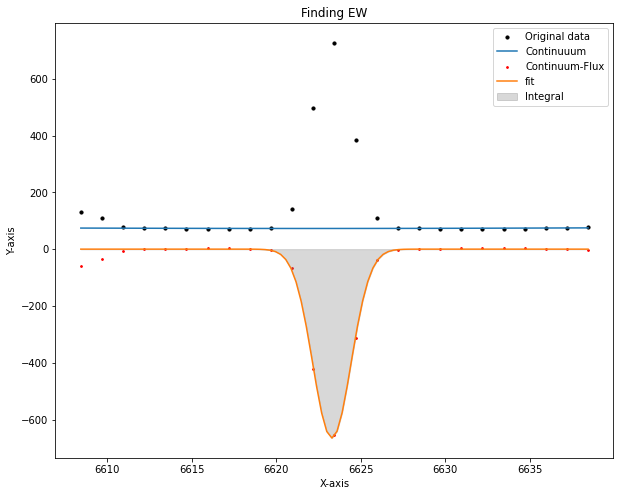

EW= -51.30377416296211  at (i,j)= 0 , 5


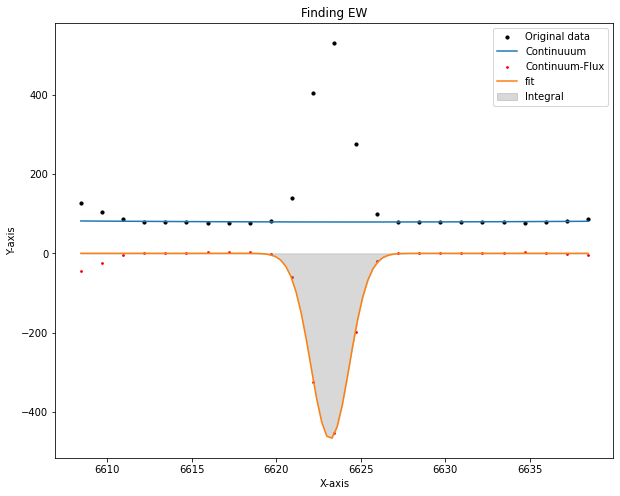

EW= -33.36935231729085  at (i,j)= 0 , 6


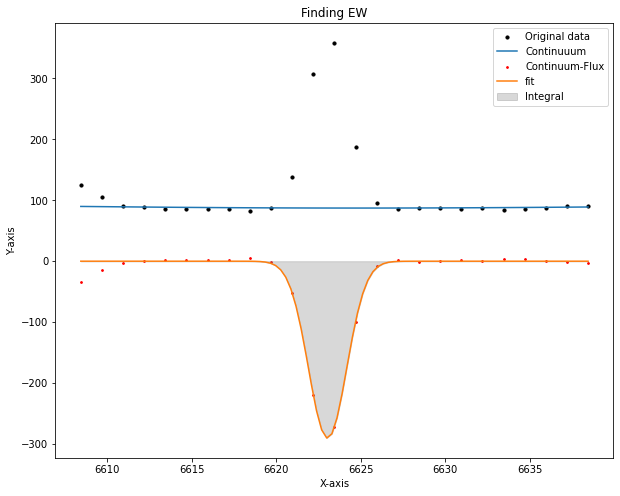

EW= -18.63615449987399  at (i,j)= 0 , 7


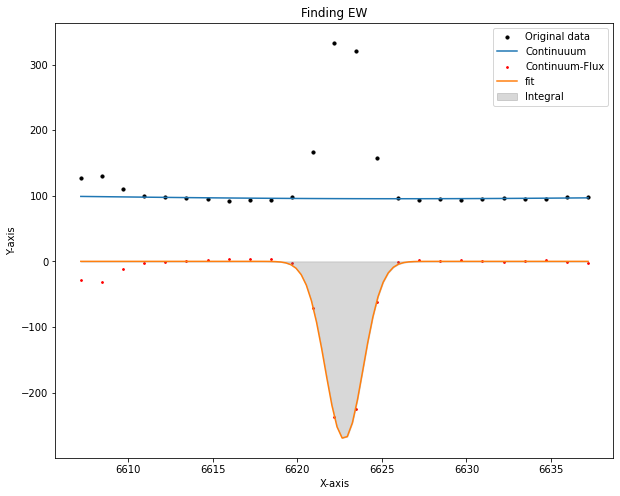

EW= -15.6715185039824  at (i,j)= 0 , 8


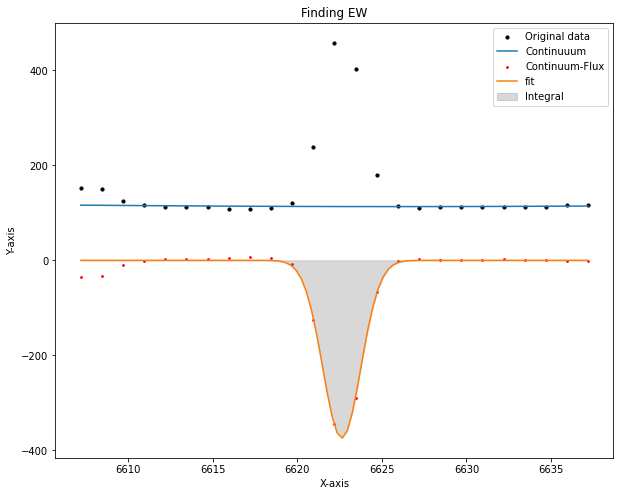

EW= -18.43703288526728  at (i,j)= 0 , 9


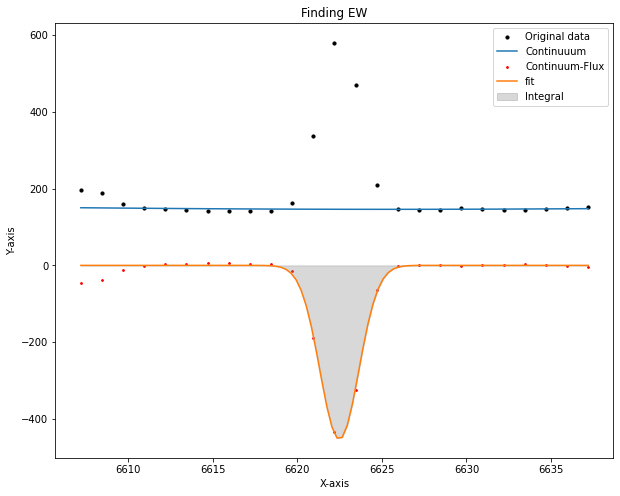

EW= -17.635139854999945  at (i,j)= 0 , 10


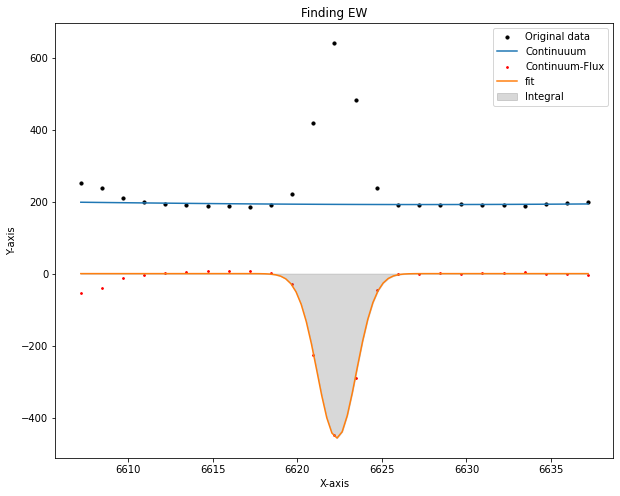

EW= -13.527361375229523  at (i,j)= 0 , 11


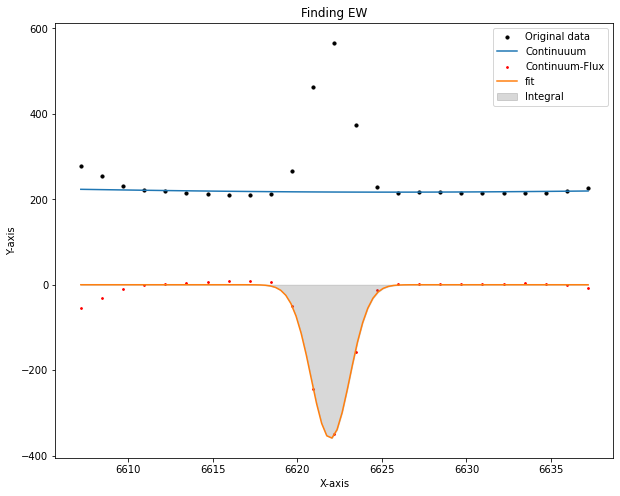

EW= -9.380695981981926  at (i,j)= 0 , 12


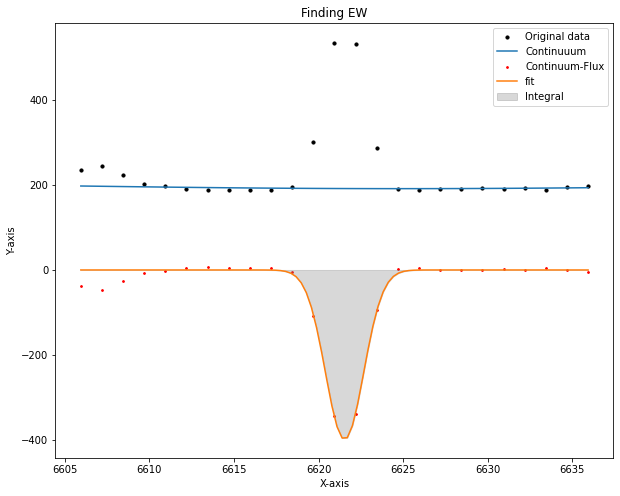

EW= -11.653414696866081  at (i,j)= 0 , 13


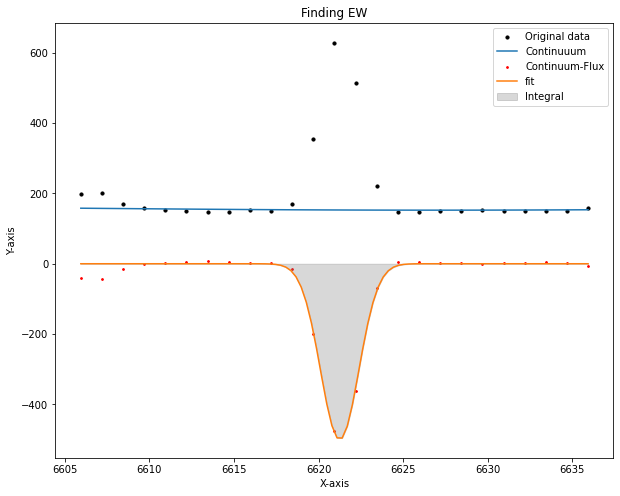

EW= -18.381340037415665  at (i,j)= 0 , 14


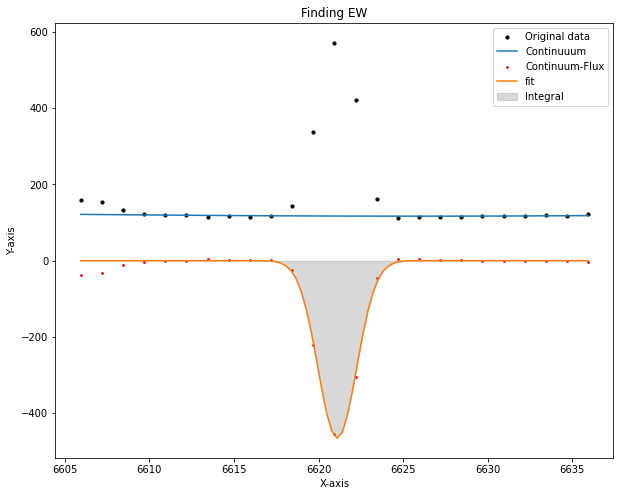

EW= -22.506036776081313  at (i,j)= 0 , 15


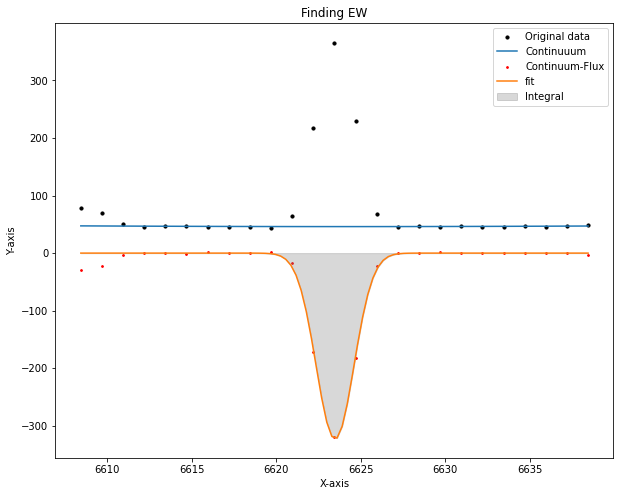

EW= -38.903621256471894  at (i,j)= 1 , 0


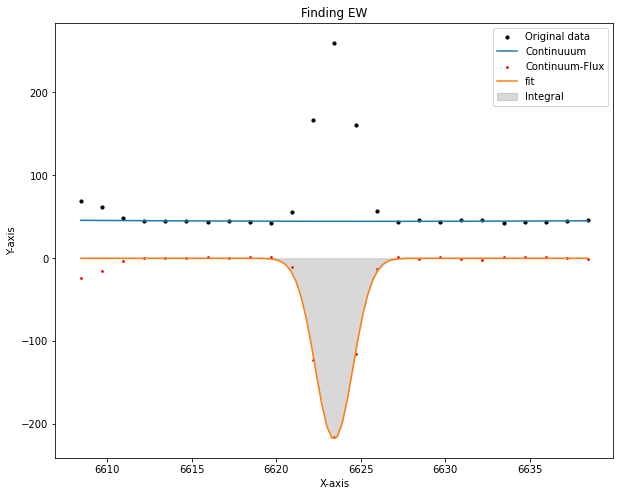

EW= -27.005182575053336  at (i,j)= 1 , 1


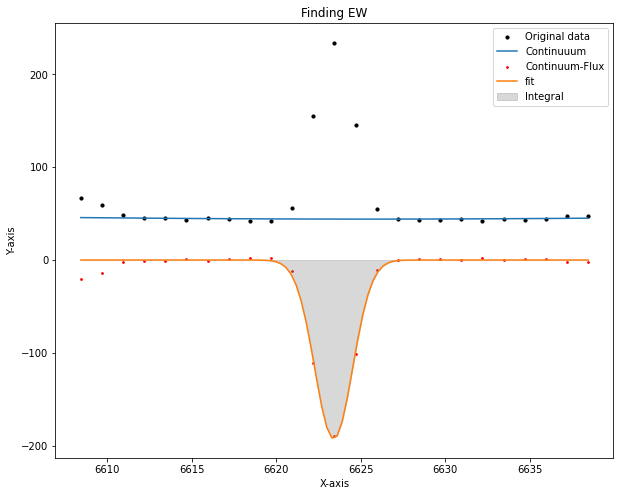

EW= -24.261016531685616  at (i,j)= 1 , 2


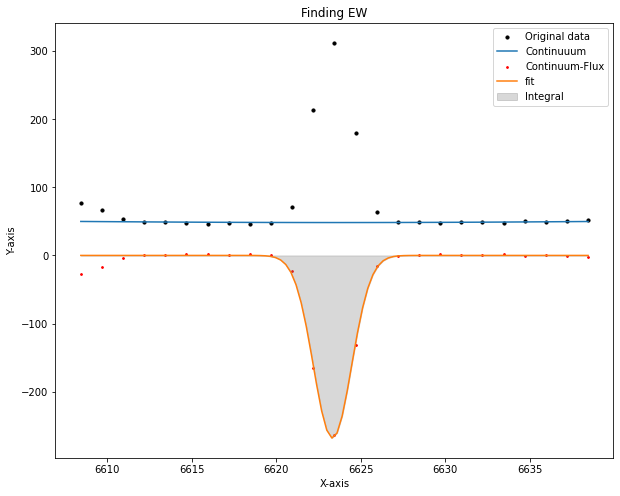

EW= -31.075972840426292  at (i,j)= 1 , 3


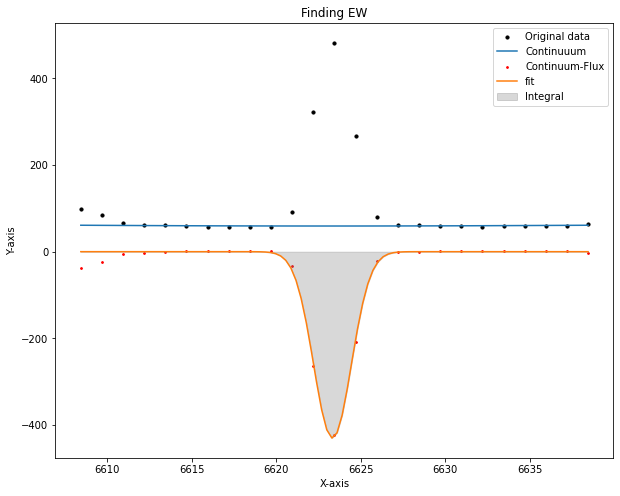

EW= -40.202945231926435  at (i,j)= 1 , 4


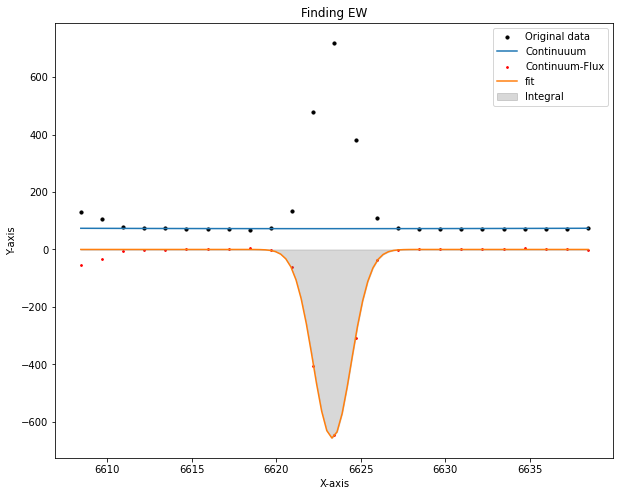

EW= -50.30832232856425  at (i,j)= 1 , 5


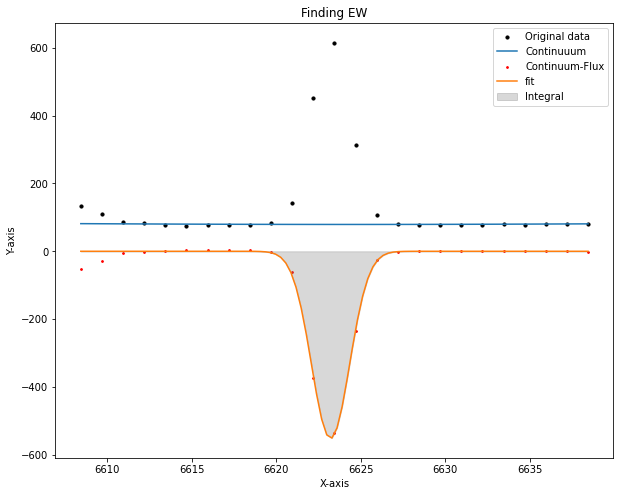

EW= -38.90421962050638  at (i,j)= 1 , 6


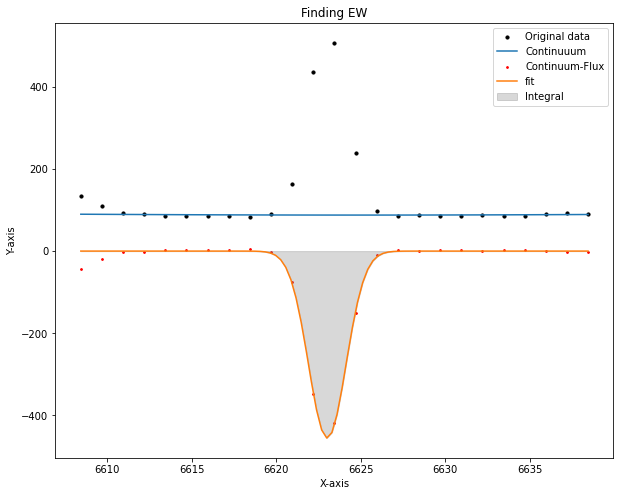

EW= -28.60453039141673  at (i,j)= 1 , 7


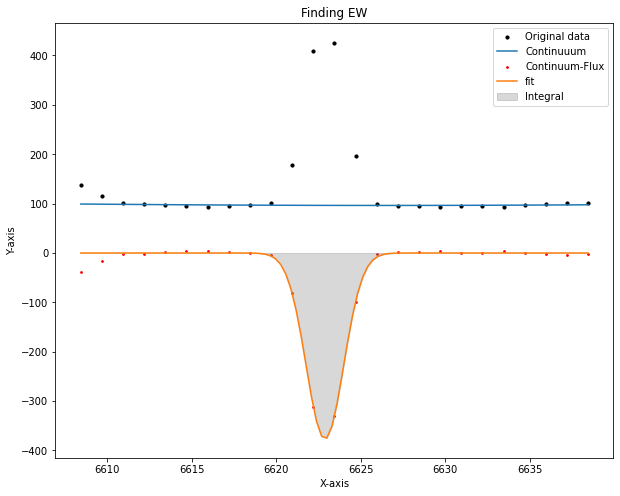

EW= -21.468114886728475  at (i,j)= 1 , 8


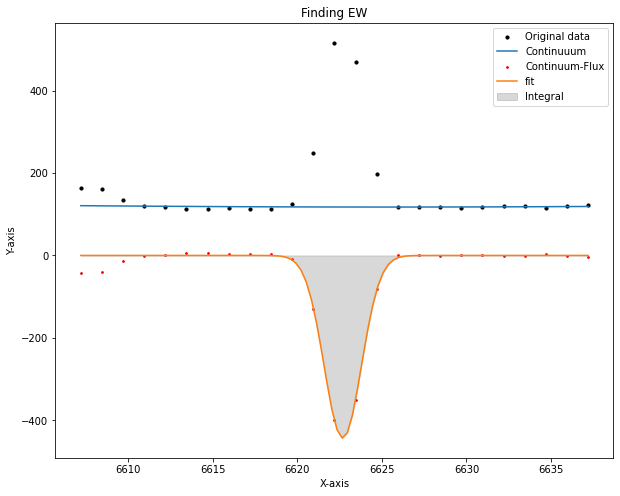

EW= -20.595499190723295  at (i,j)= 1 , 9


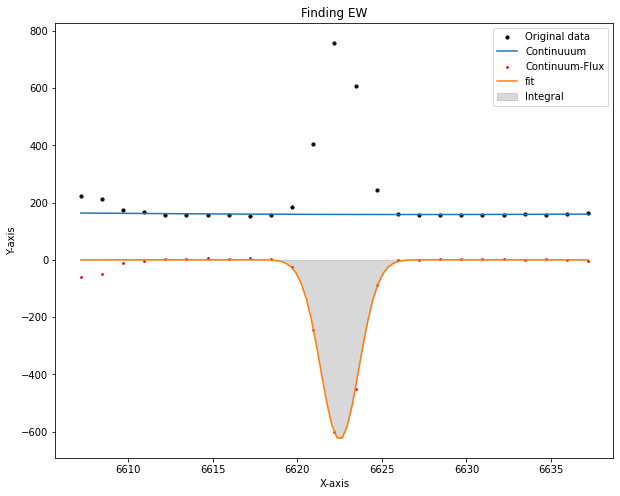

EW= -22.200819363256993  at (i,j)= 1 , 10


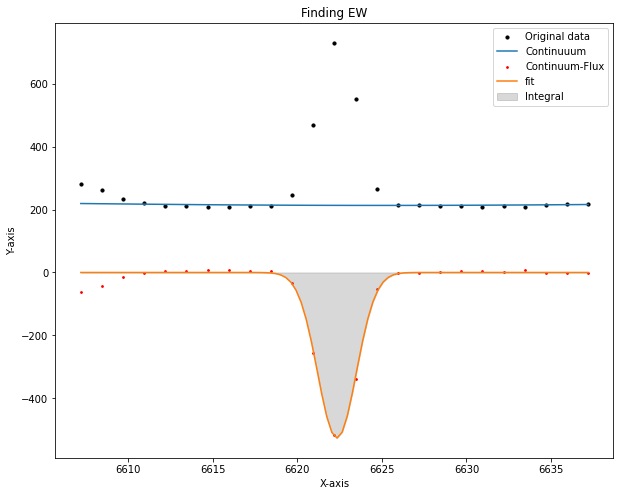

EW= -14.017429957770299  at (i,j)= 1 , 11


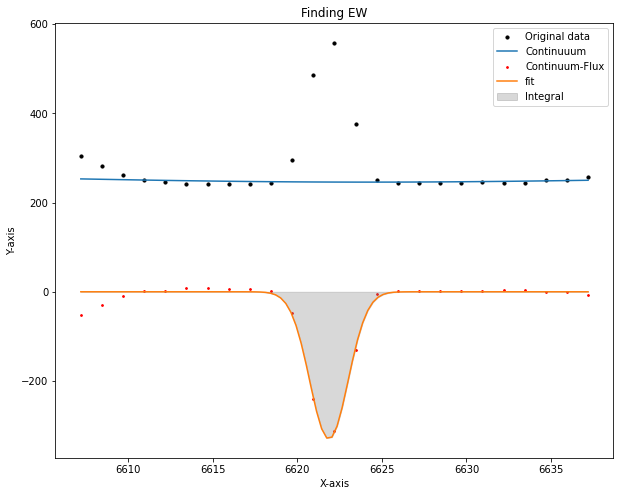

EW= -7.534749285687502  at (i,j)= 1 , 12


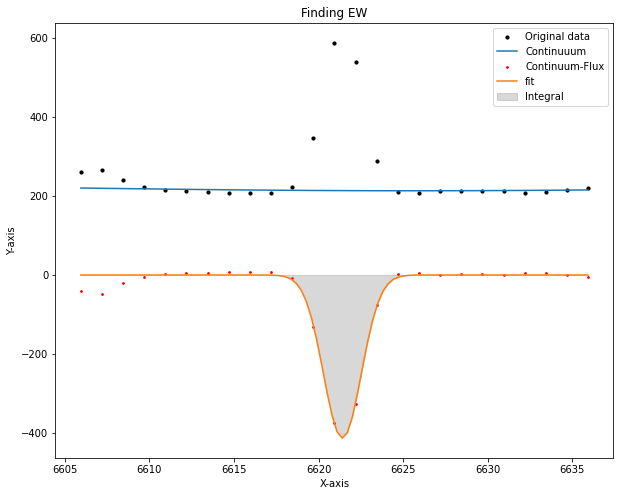

EW= -10.719168472661854  at (i,j)= 1 , 13


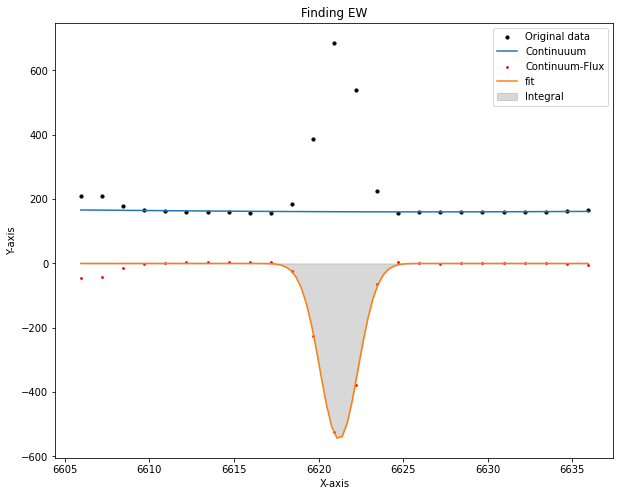

EW= -18.91323401842069  at (i,j)= 1 , 14


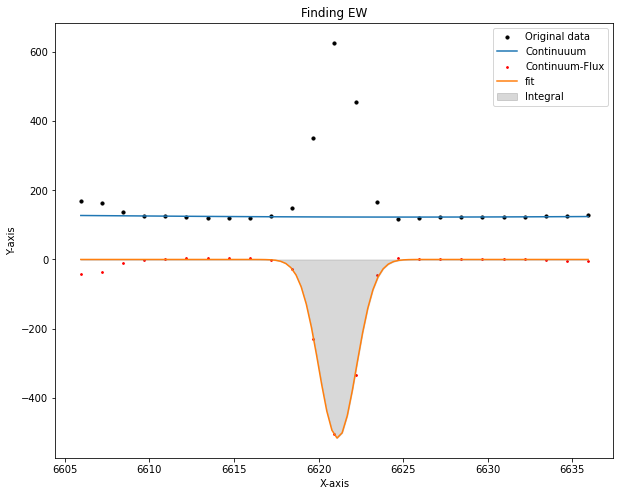

EW= -23.16536759100902  at (i,j)= 1 , 15


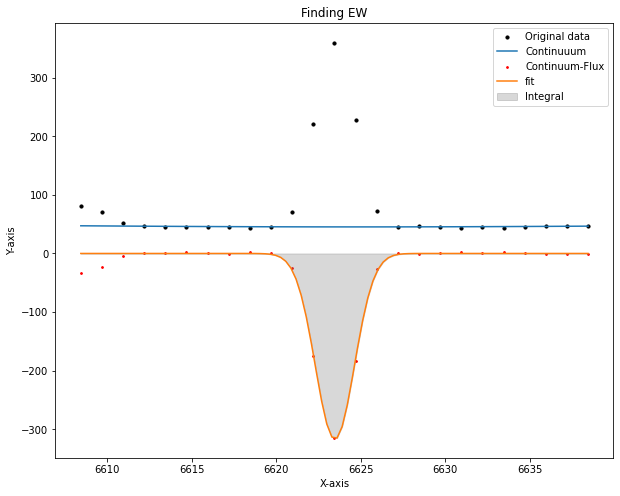

EW= -40.00463407664766  at (i,j)= 2 , 0


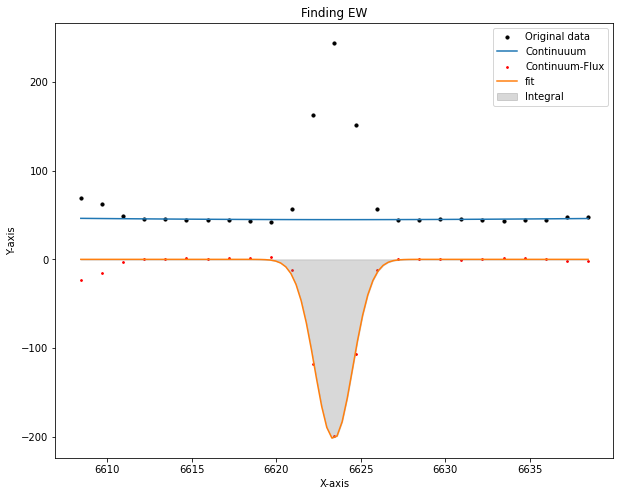

EW= -25.154248966014254  at (i,j)= 2 , 1


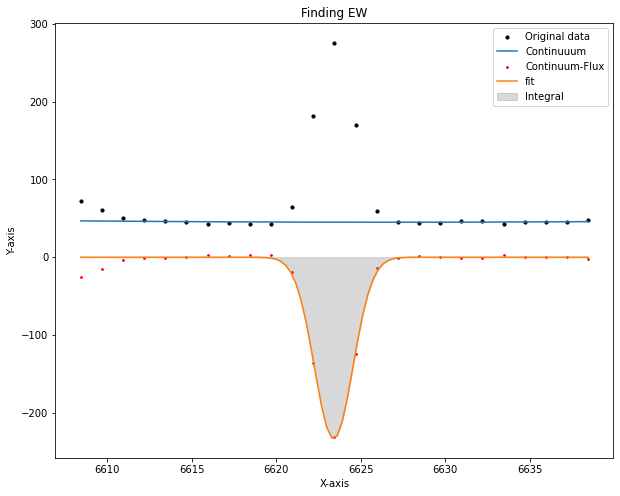

EW= -29.26756674860164  at (i,j)= 2 , 2


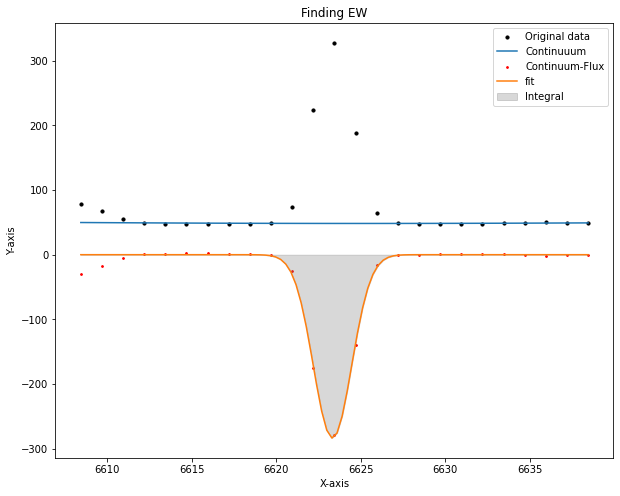

EW= -32.99115127688312  at (i,j)= 2 , 3


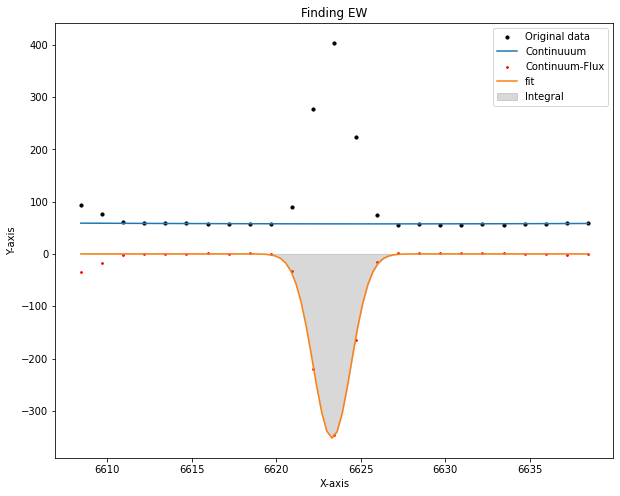

EW= -34.037551876346434  at (i,j)= 2 , 4


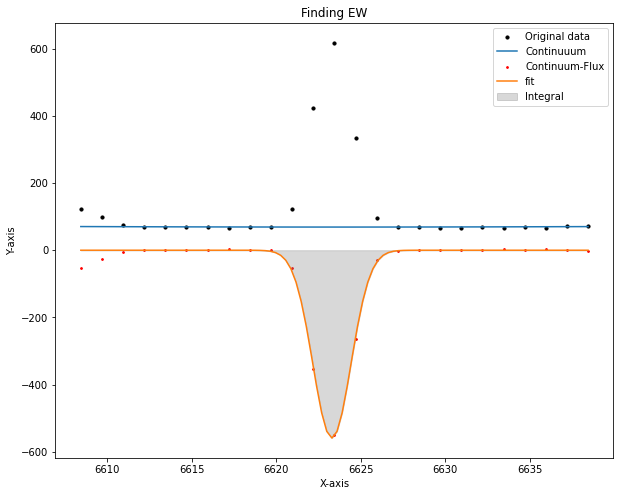

EW= -45.36649021191785  at (i,j)= 2 , 5


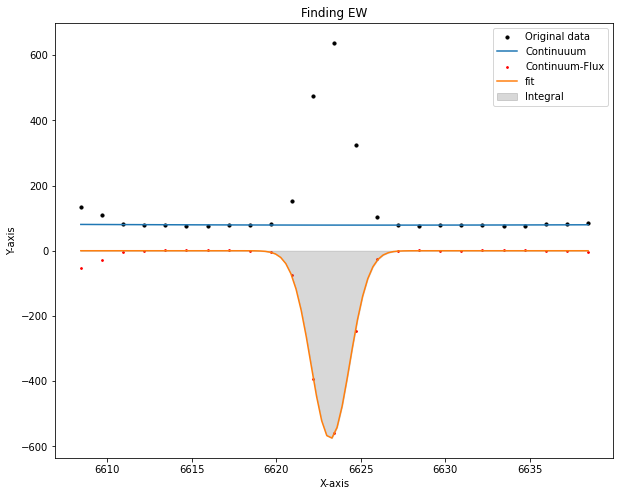

EW= -41.30809029301283  at (i,j)= 2 , 6


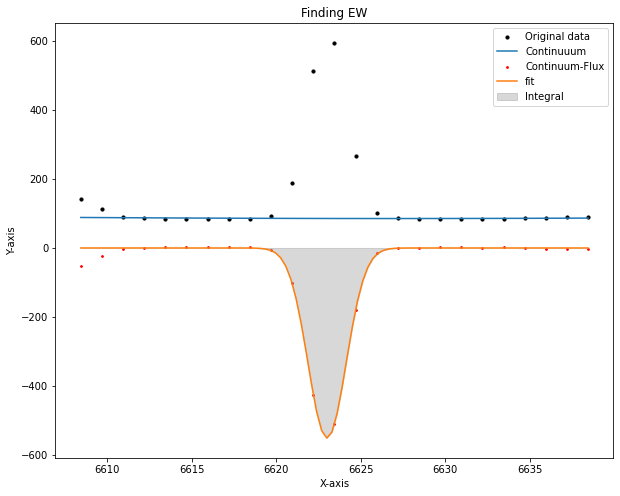

EW= -36.04297000878979  at (i,j)= 2 , 7


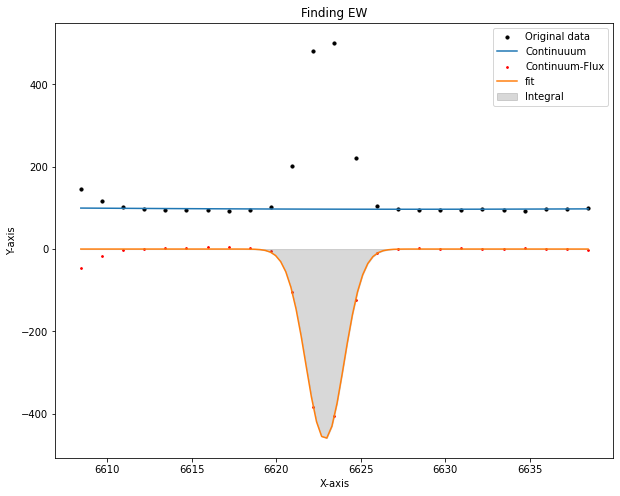

EW= -26.476734677771486  at (i,j)= 2 , 8


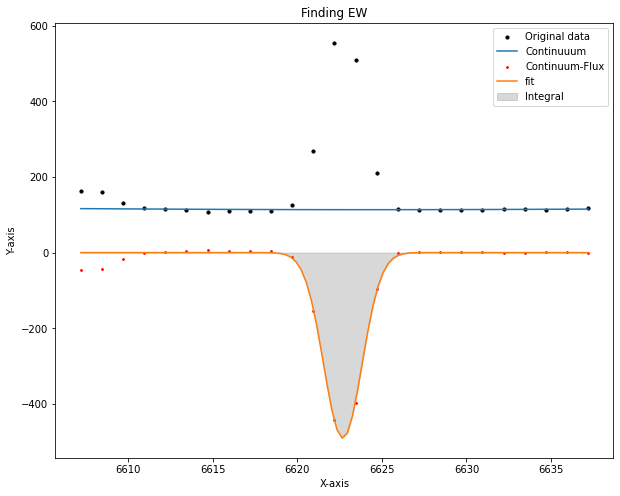

EW= -24.243496088984752  at (i,j)= 2 , 9


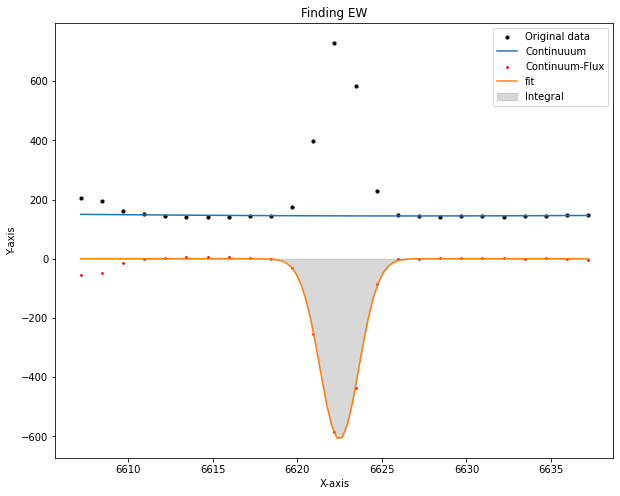

EW= -24.003671950206545  at (i,j)= 2 , 10


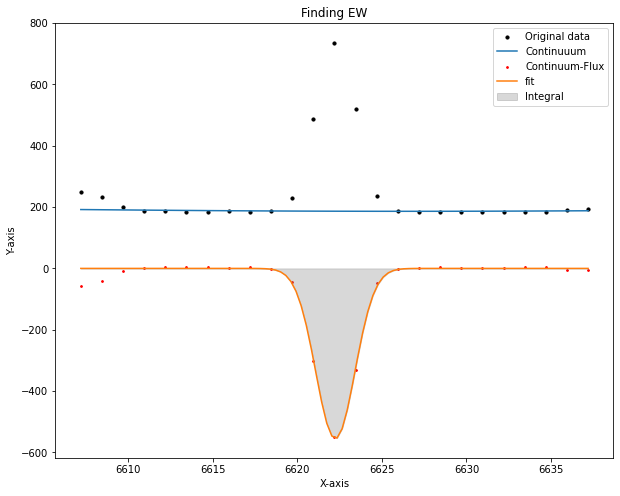

EW= -17.13125630167315  at (i,j)= 2 , 11


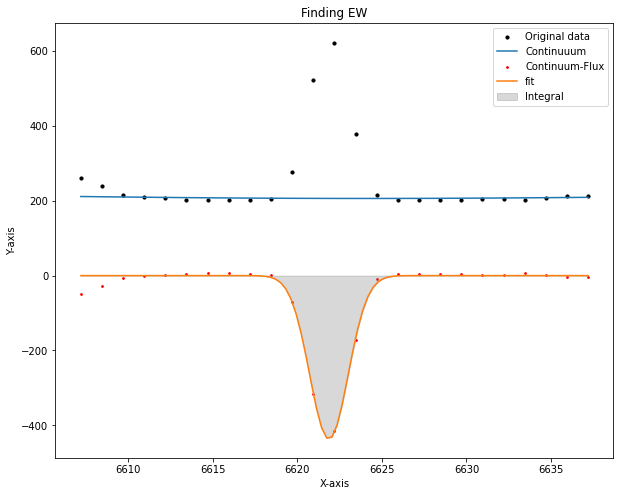

EW= -11.967041035121168  at (i,j)= 2 , 12


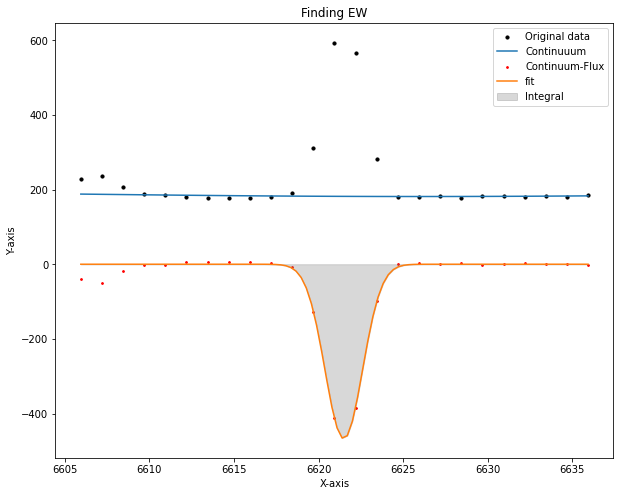

EW= -14.162606694529988  at (i,j)= 2 , 13


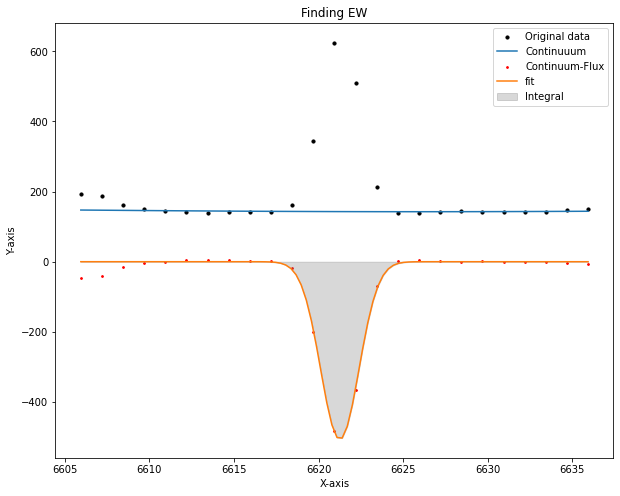

EW= -19.92312658210926  at (i,j)= 2 , 14


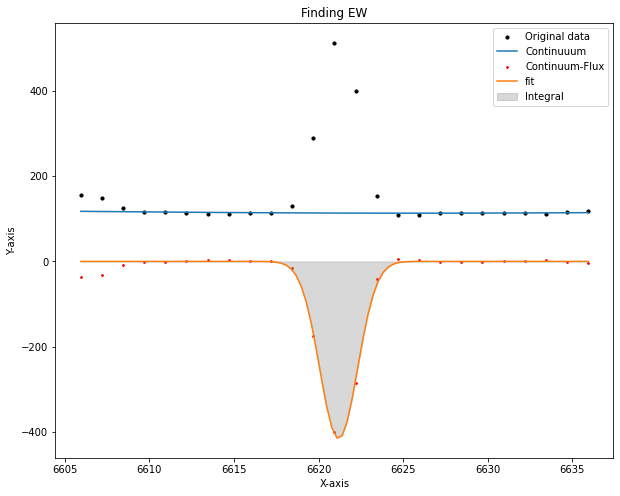

EW= -20.330107948759782  at (i,j)= 2 , 15


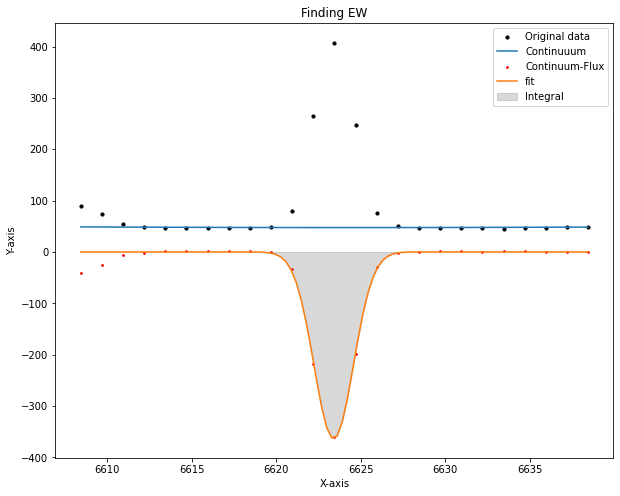

EW= -44.318909004720524  at (i,j)= 3 , 0


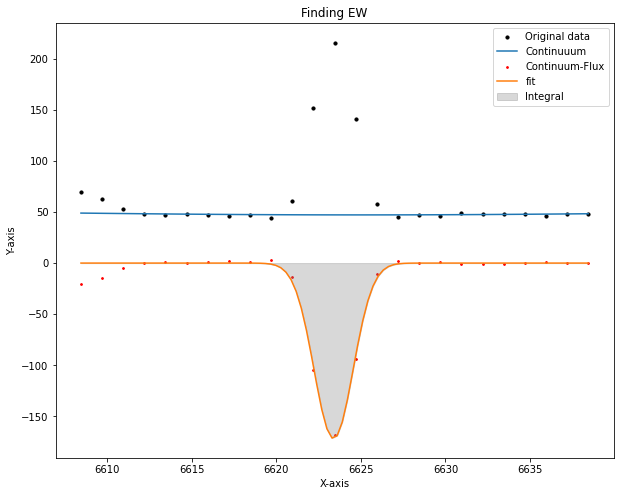

EW= -20.9219266316496  at (i,j)= 3 , 1


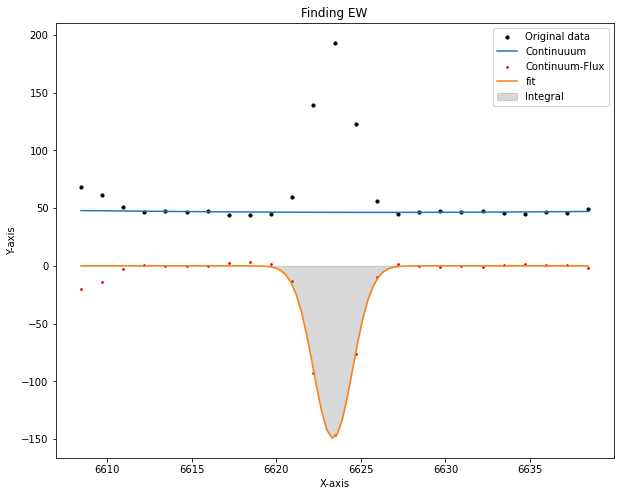

EW= -18.36211746445576  at (i,j)= 3 , 2


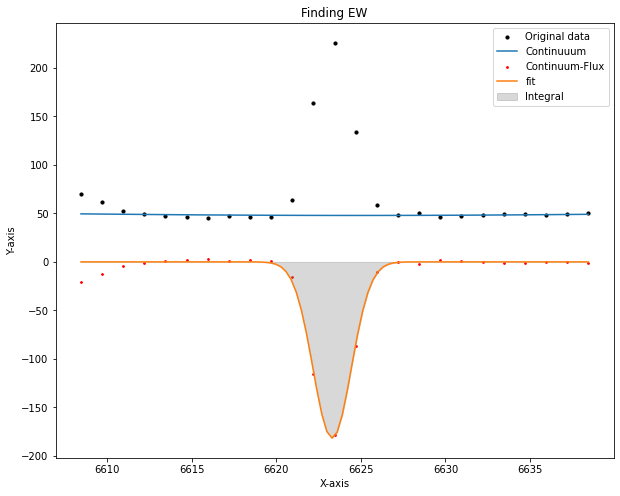

EW= -21.280392844926766  at (i,j)= 3 , 3


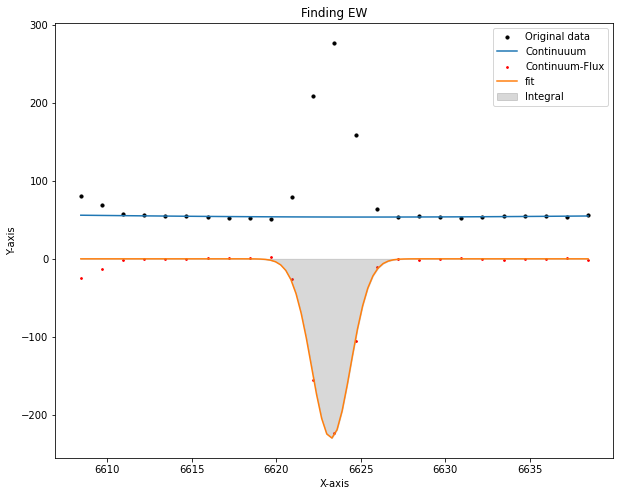

EW= -24.325099923643787  at (i,j)= 3 , 4


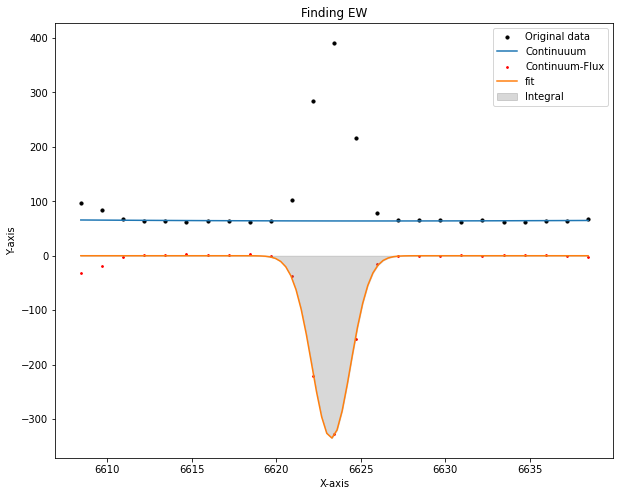

EW= -29.542307802548827  at (i,j)= 3 , 5


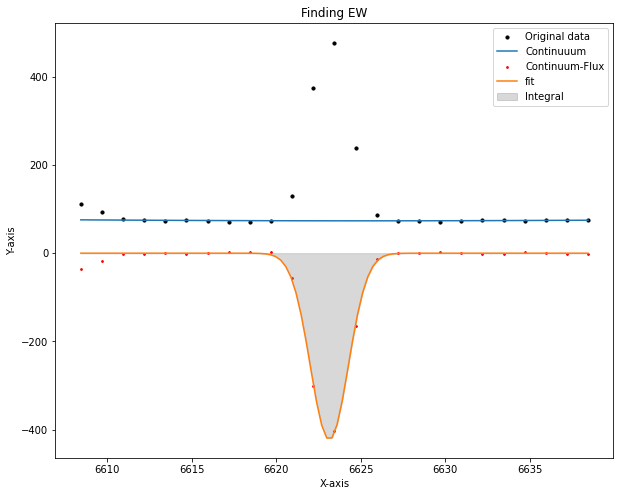

EW= -32.003077364160106  at (i,j)= 3 , 6


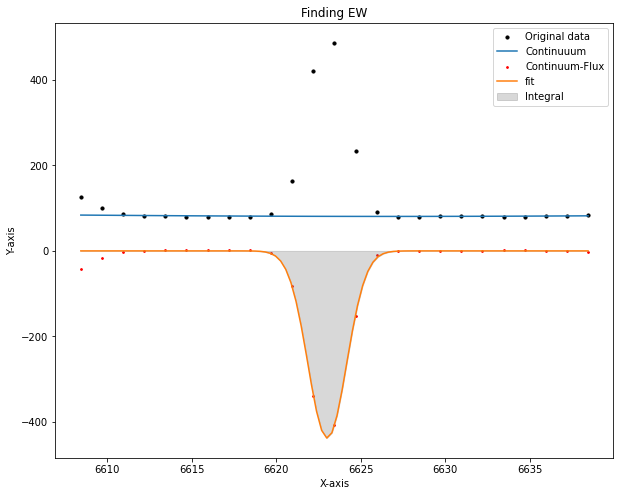

EW= -30.667715407557196  at (i,j)= 3 , 7


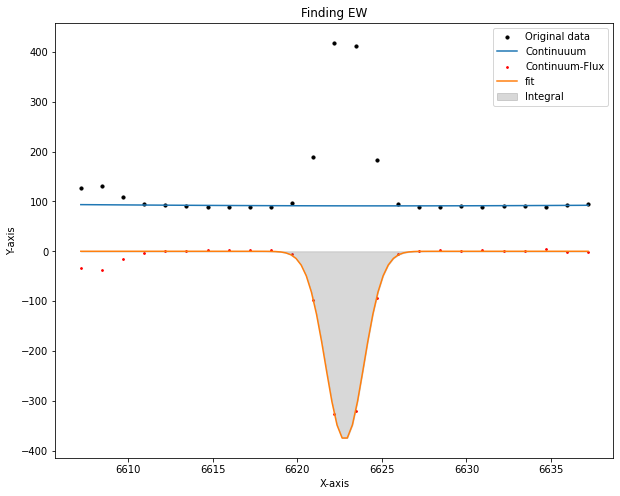

EW= -23.16123449980936  at (i,j)= 3 , 8


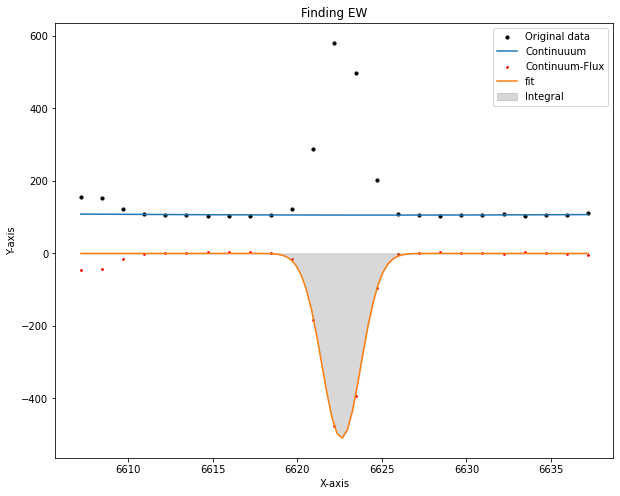

EW= -27.501955308856733  at (i,j)= 3 , 9


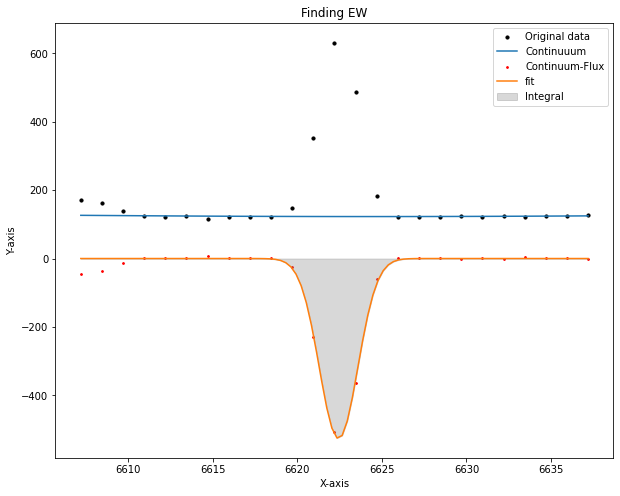

EW= -24.21249992647629  at (i,j)= 3 , 10


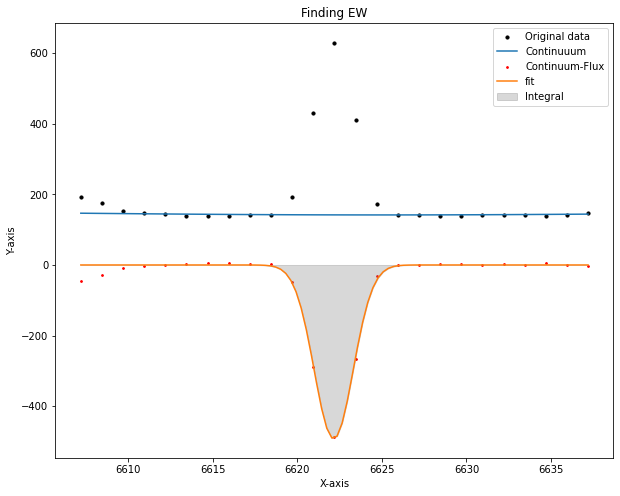

EW= -19.8145627505229  at (i,j)= 3 , 11


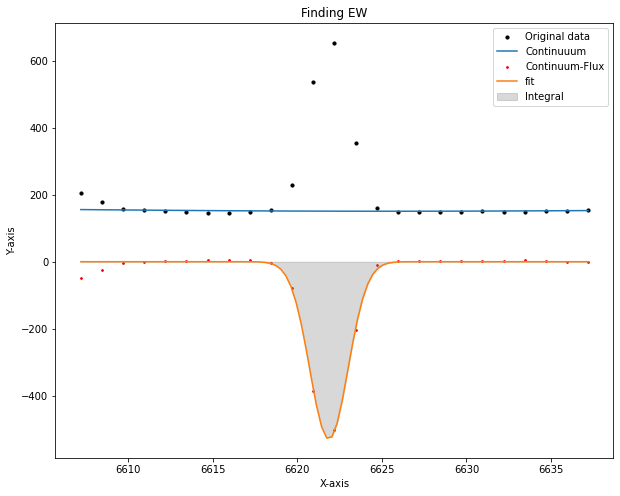

EW= -19.675788731363934  at (i,j)= 3 , 12


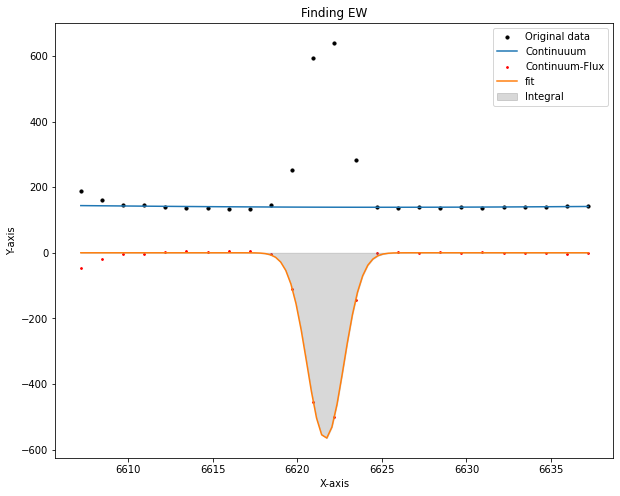

EW= -21.839492948920192  at (i,j)= 3 , 13


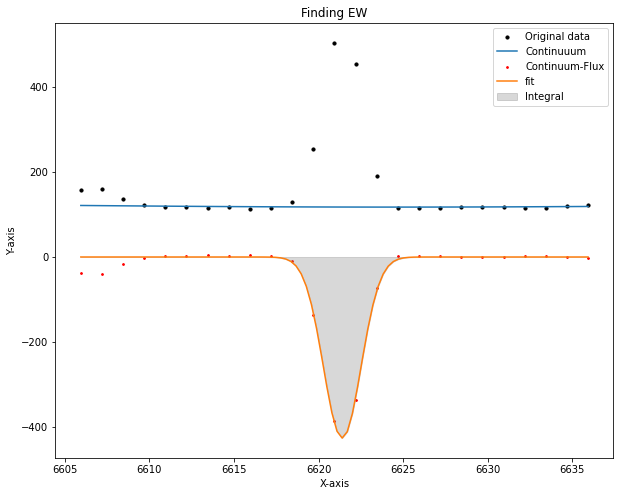

EW= -20.03467661451106  at (i,j)= 3 , 14


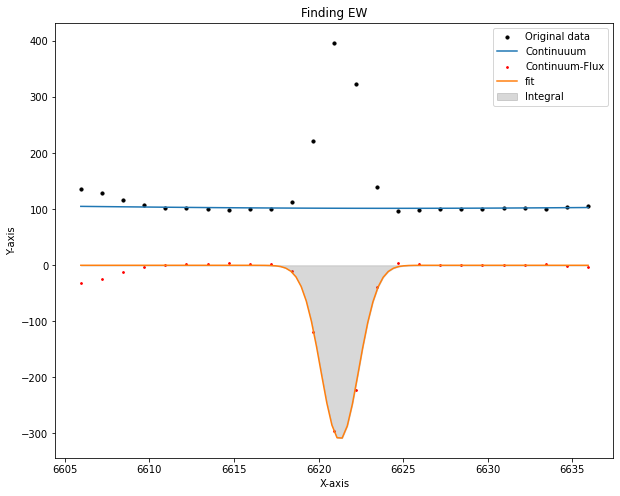

EW= -16.845065756268106  at (i,j)= 3 , 15


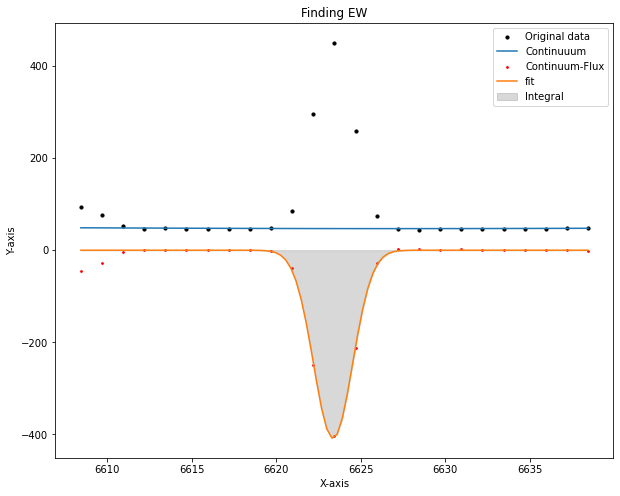

EW= -49.71704025714945  at (i,j)= 4 , 0


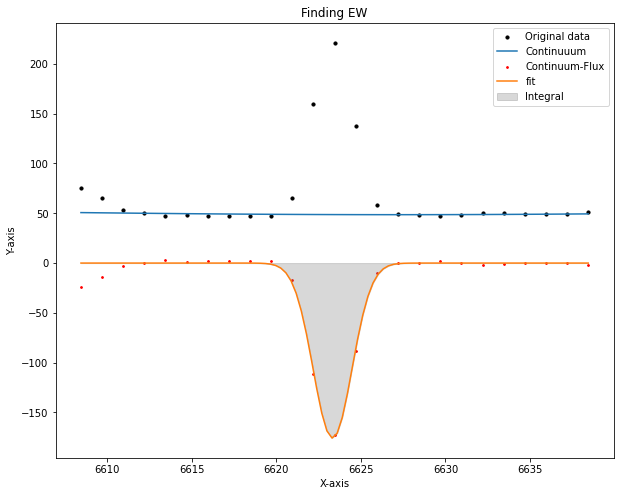

EW= -20.568528994579264  at (i,j)= 4 , 1


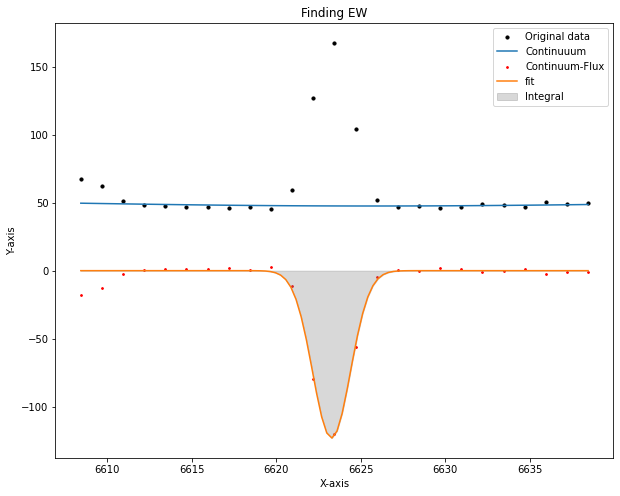

EW= -14.332194195855426  at (i,j)= 4 , 2


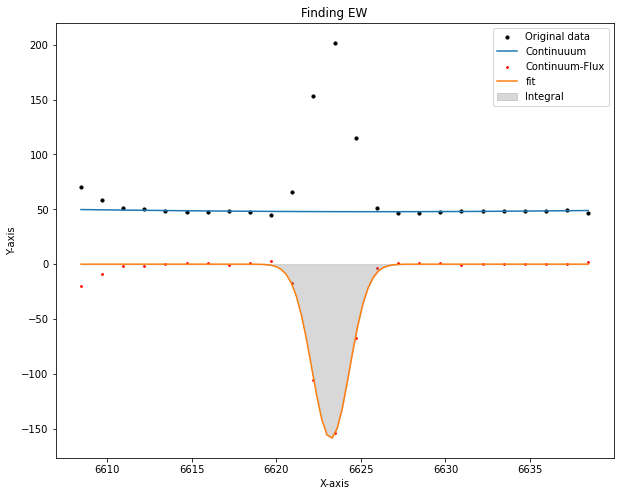

EW= -18.215509473524914  at (i,j)= 4 , 3


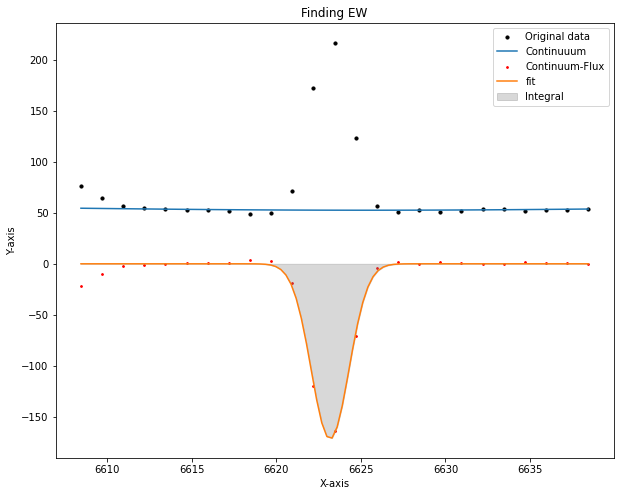

EW= -18.04027139245632  at (i,j)= 4 , 4


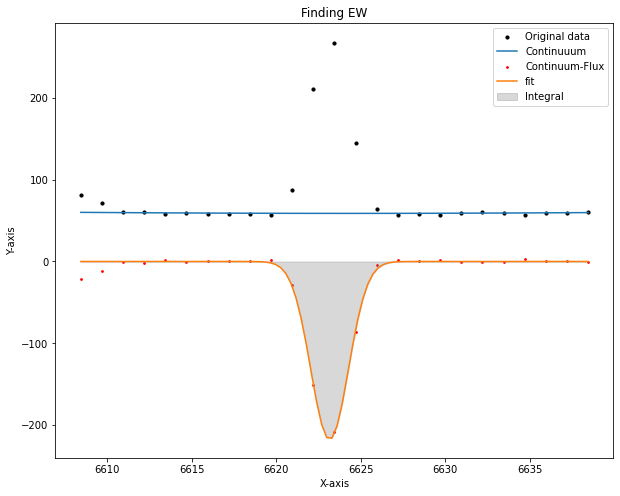

EW= -20.4396133445734  at (i,j)= 4 , 5


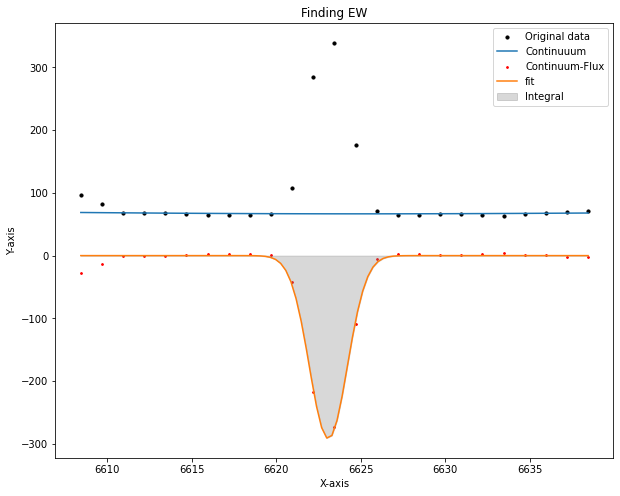

EW= -24.376417653579107  at (i,j)= 4 , 6


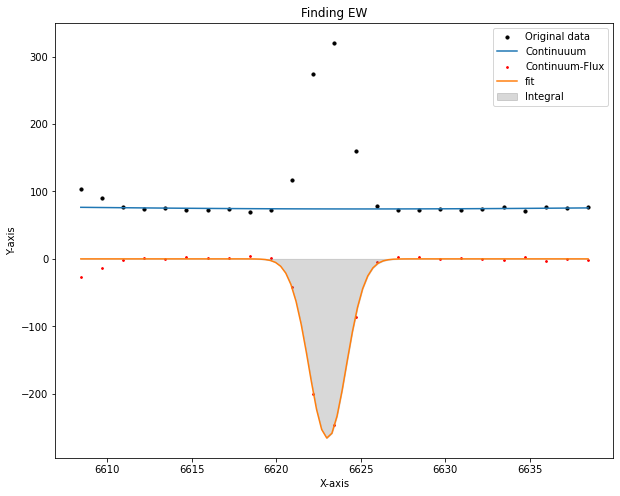

EW= -19.541027355296954  at (i,j)= 4 , 7


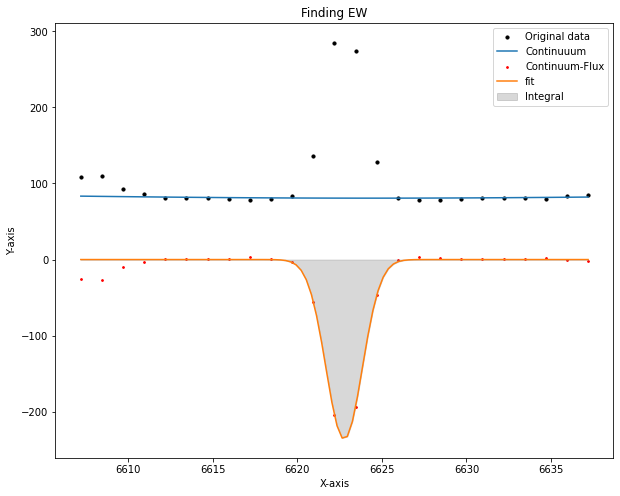

EW= -15.542823554993529  at (i,j)= 4 , 8


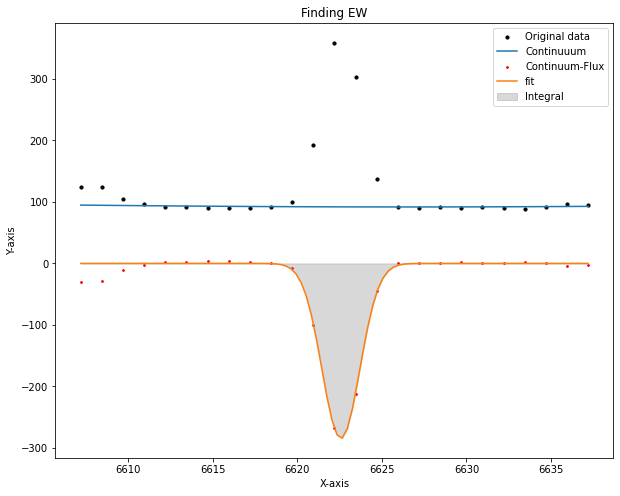

EW= -17.171031715984828  at (i,j)= 4 , 9


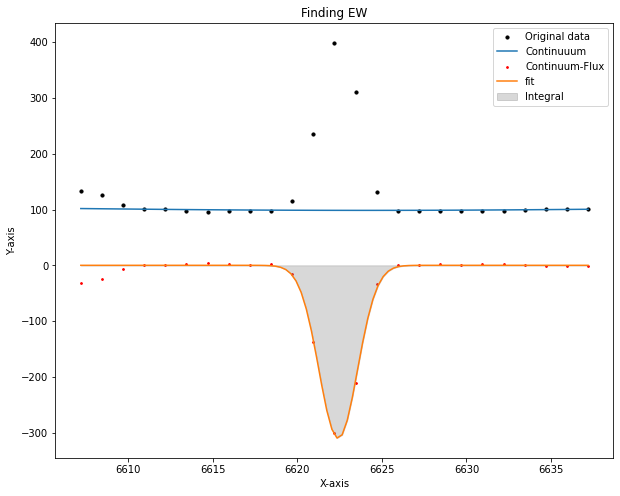

EW= -17.773472722814375  at (i,j)= 4 , 10


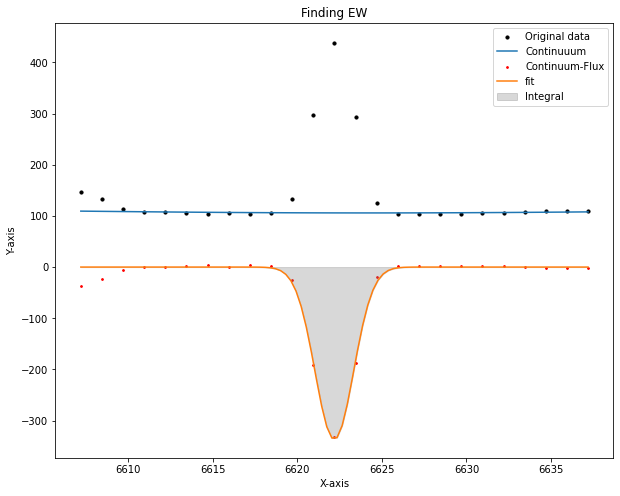

EW= -17.994253355174244  at (i,j)= 4 , 11


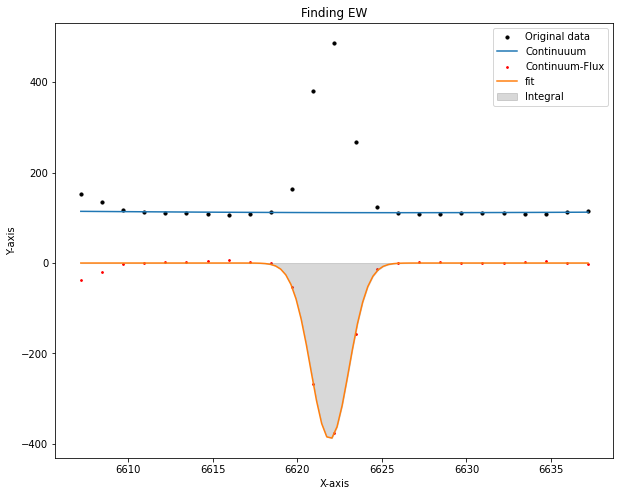

EW= -19.419343326530488  at (i,j)= 4 , 12


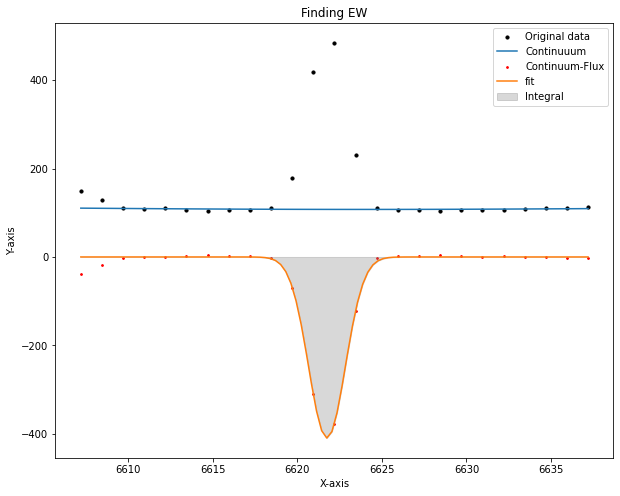

EW= -20.517955379613362  at (i,j)= 4 , 13


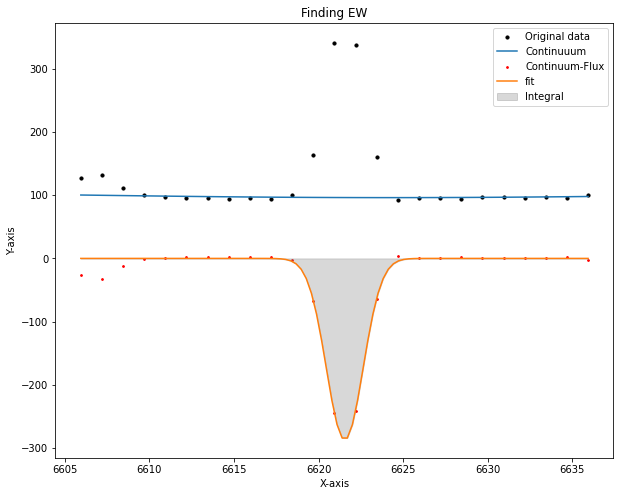

EW= -16.045537281593873  at (i,j)= 4 , 14


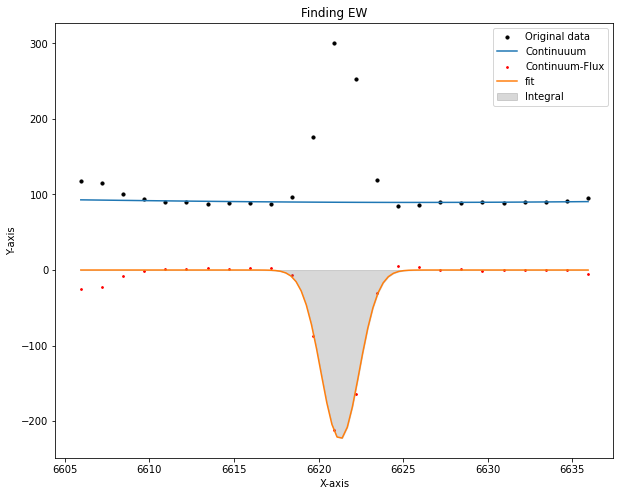

EW= -13.915637043687175  at (i,j)= 4 , 15


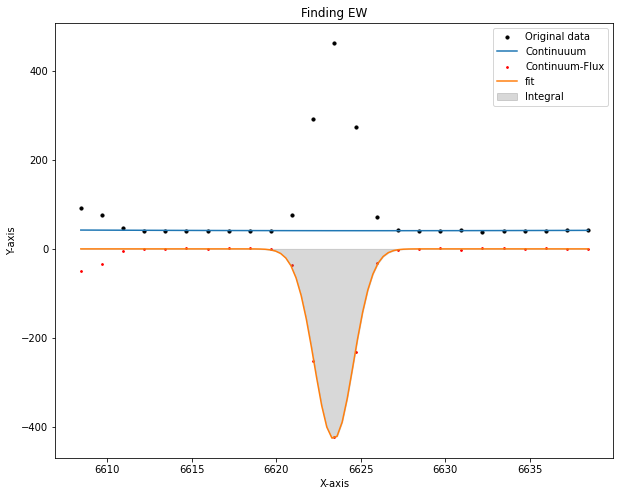

EW= -59.618243955128996  at (i,j)= 5 , 0


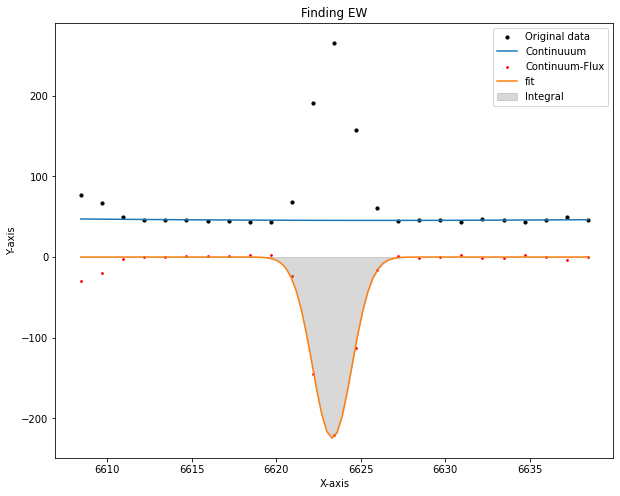

EW= -28.44777301115227  at (i,j)= 5 , 1


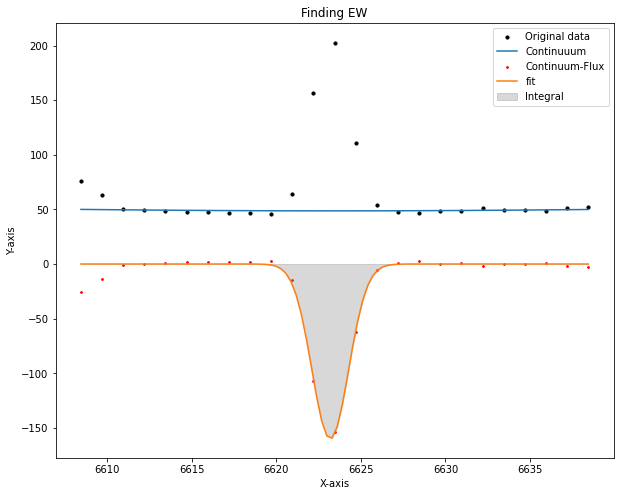

EW= -17.693932037160742  at (i,j)= 5 , 2


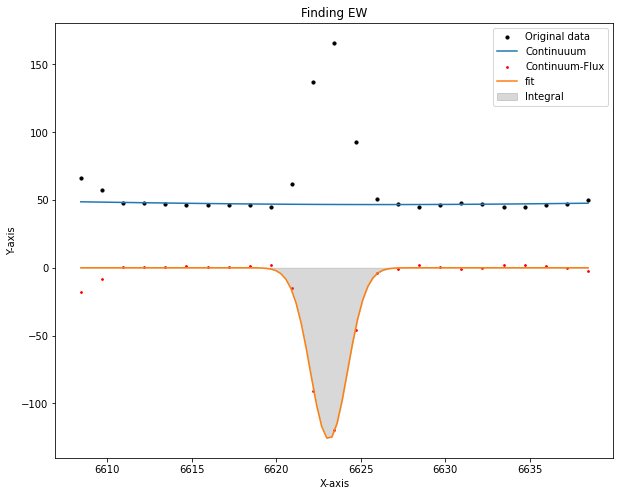

EW= -14.680660126579777  at (i,j)= 5 , 3


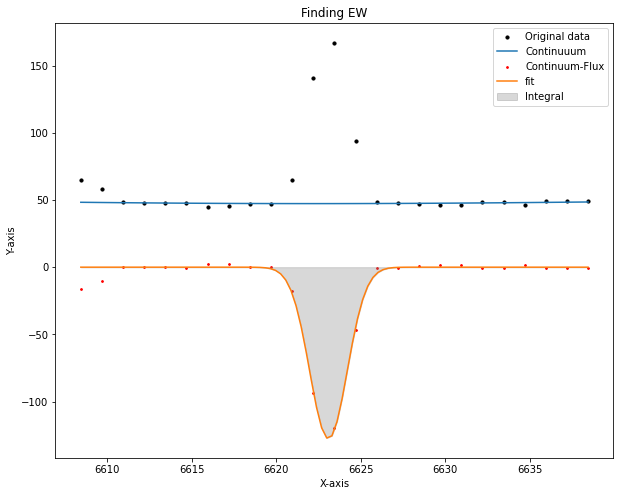

EW= -14.846423780136845  at (i,j)= 5 , 4


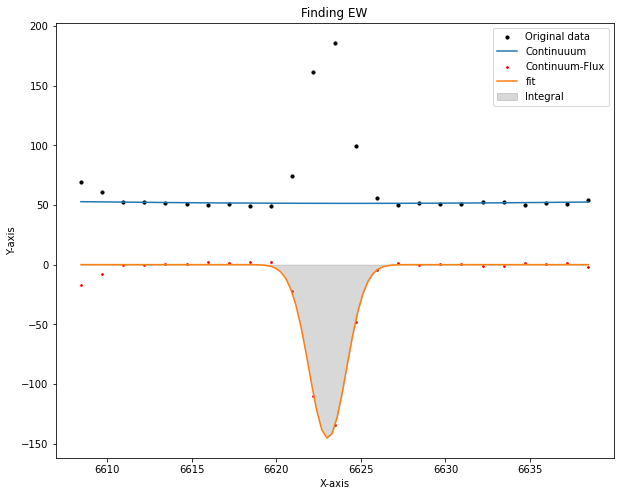

EW= -15.48525304098323  at (i,j)= 5 , 5


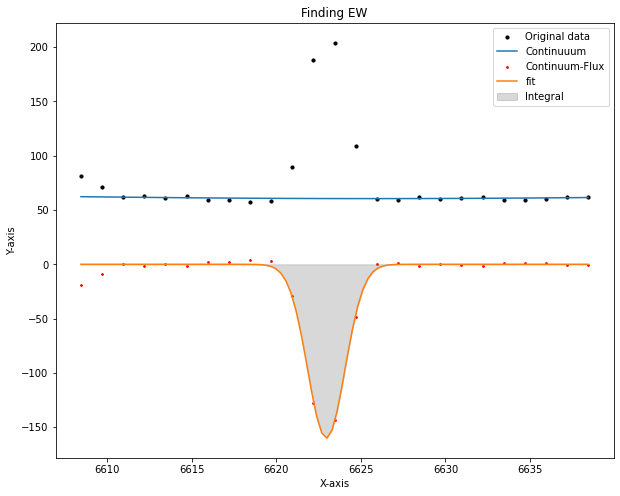

EW= -14.45405144285405  at (i,j)= 5 , 6


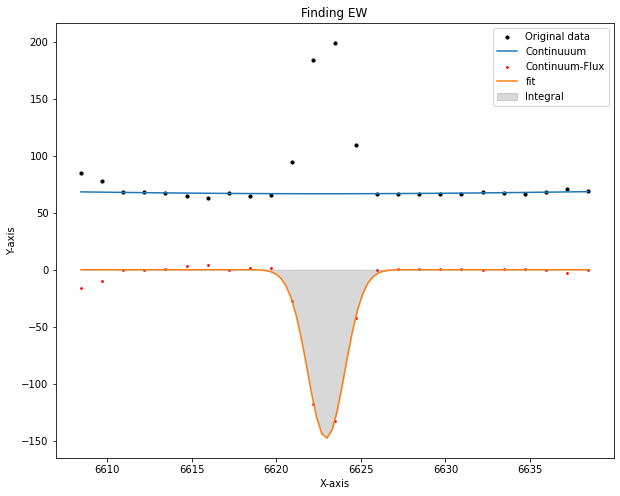

EW= -12.062053387821326  at (i,j)= 5 , 7


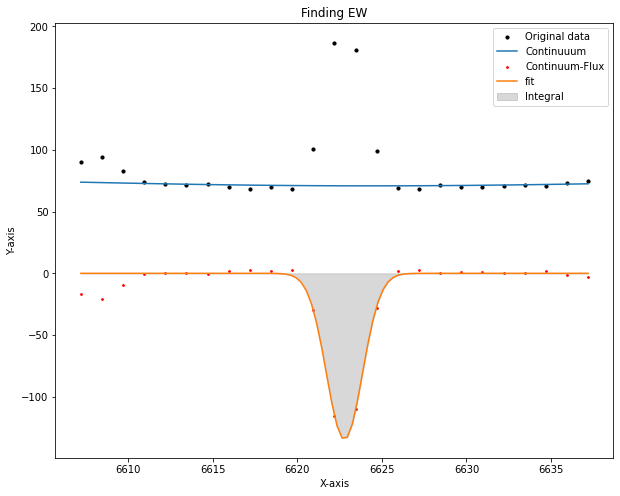

EW= -9.982878018182479  at (i,j)= 5 , 8


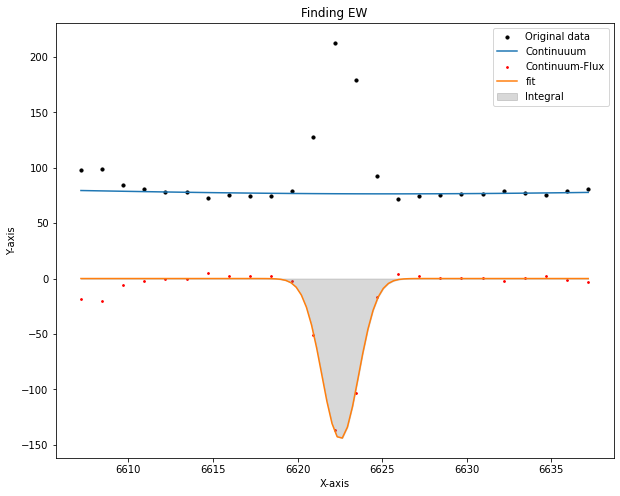

EW= -10.129439058149547  at (i,j)= 5 , 9


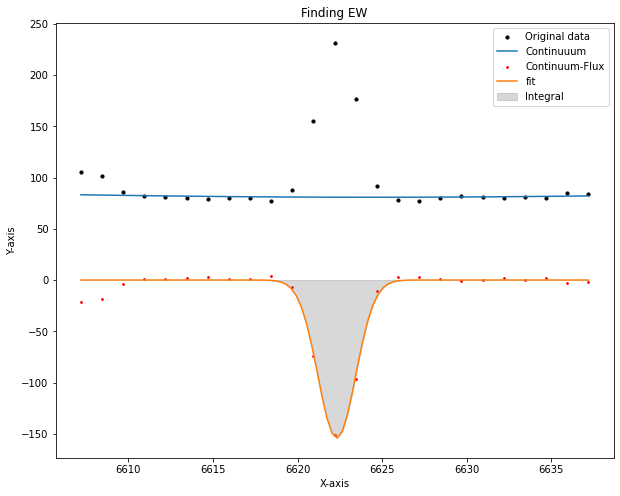

EW= -10.55723839569331  at (i,j)= 5 , 10


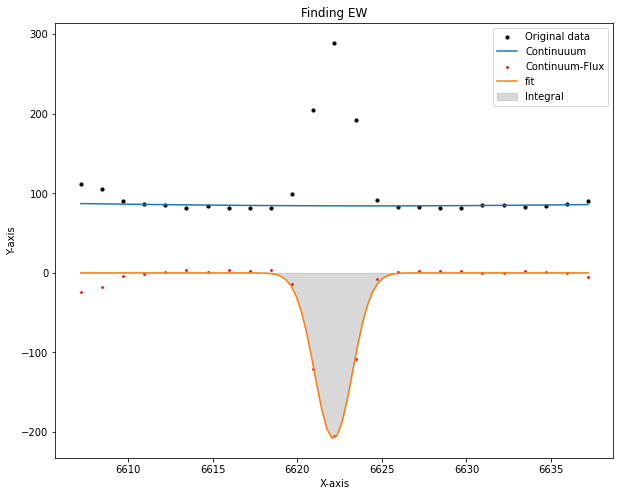

EW= -13.644131555438157  at (i,j)= 5 , 11


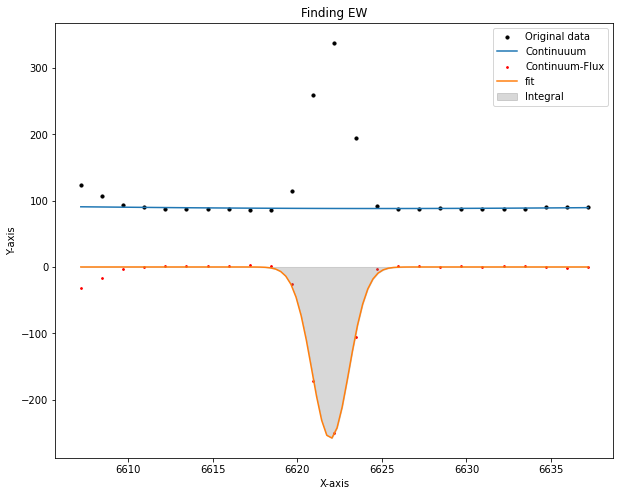

EW= -15.874674891541789  at (i,j)= 5 , 12


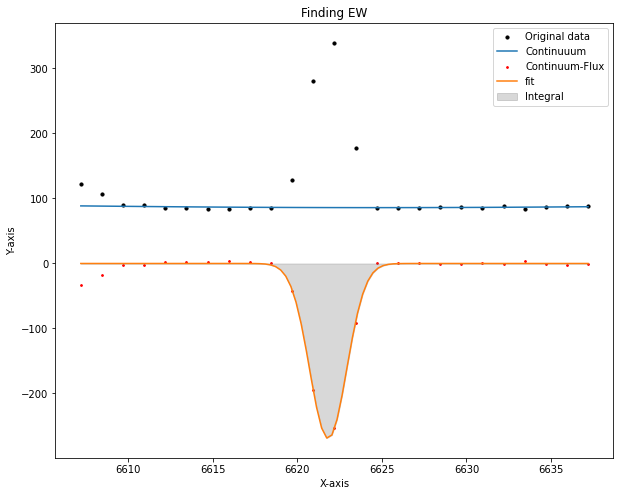

EW= -17.00010094886812  at (i,j)= 5 , 13


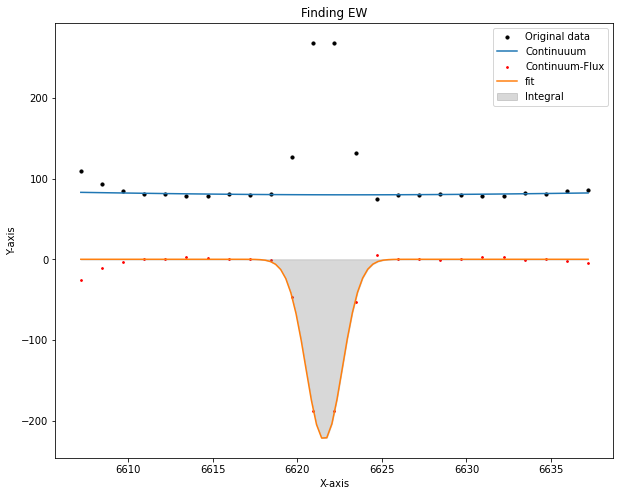

EW= -14.877604447737545  at (i,j)= 5 , 14


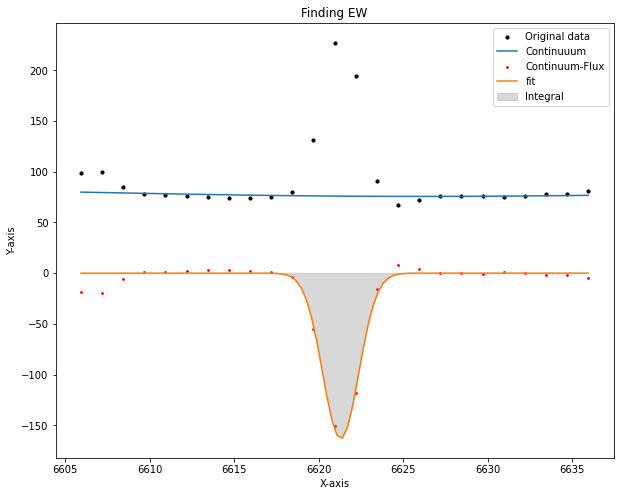

EW= -11.331755356328774  at (i,j)= 5 , 15


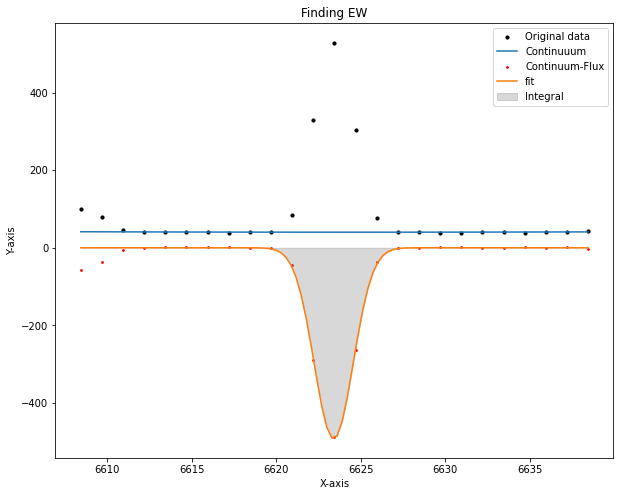

EW= -70.02838882407559  at (i,j)= 6 , 0


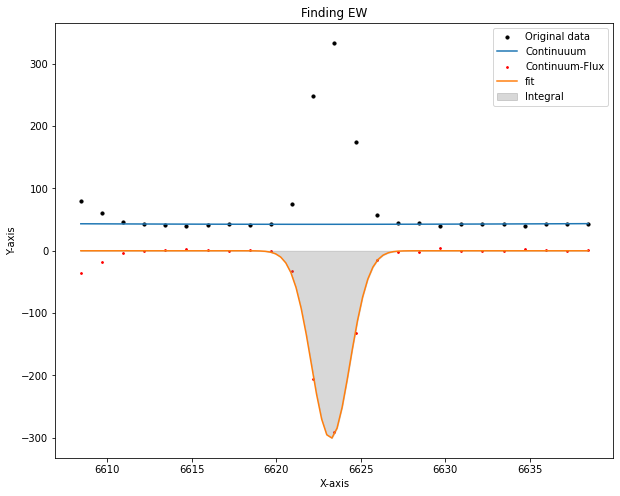

EW= -39.851710310619374  at (i,j)= 6 , 1


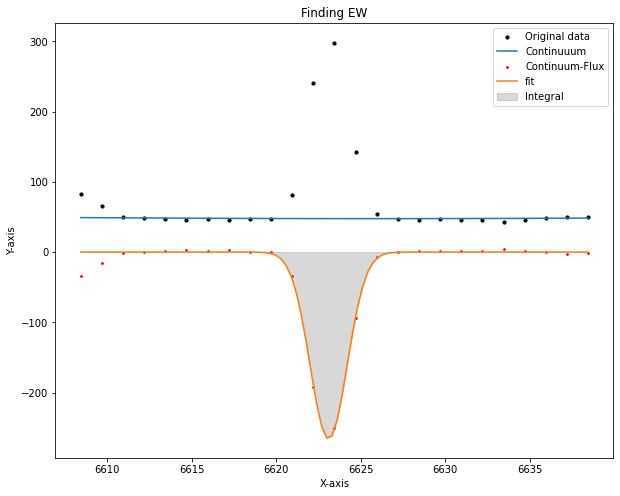

EW= -30.352531453911954  at (i,j)= 6 , 2


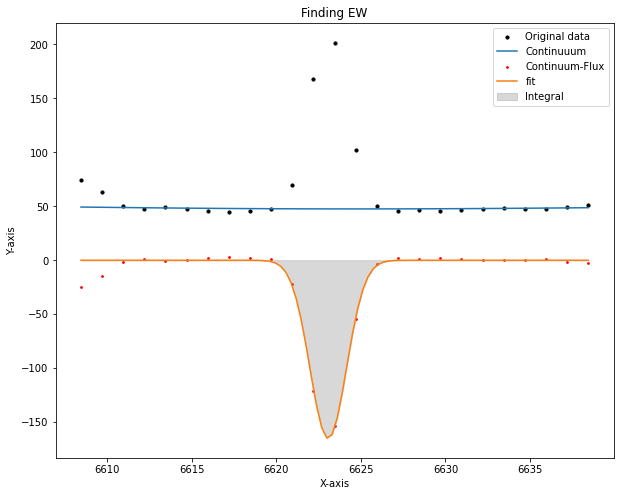

EW= -18.59766732253915  at (i,j)= 6 , 3


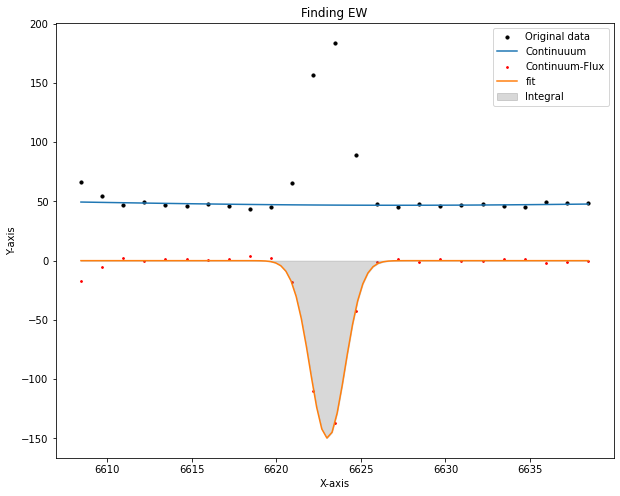

EW= -16.410950238246226  at (i,j)= 6 , 4


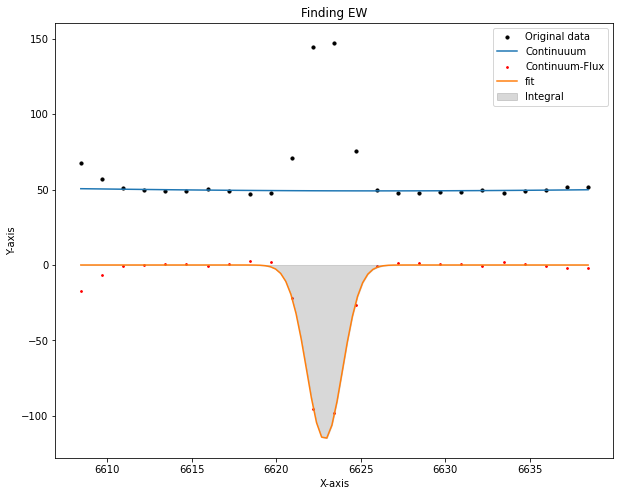

EW= -12.295898475018092  at (i,j)= 6 , 5


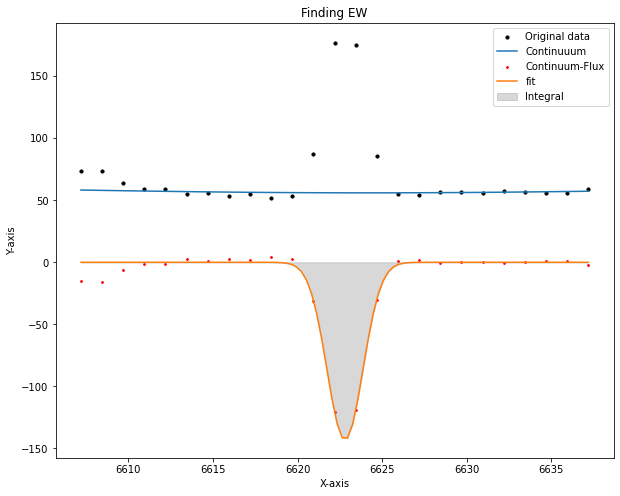

EW= -13.450622560841406  at (i,j)= 6 , 6


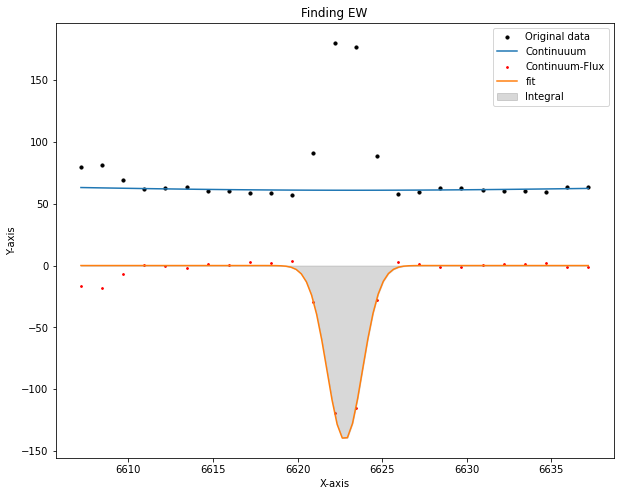

EW= -11.94743754573465  at (i,j)= 6 , 7


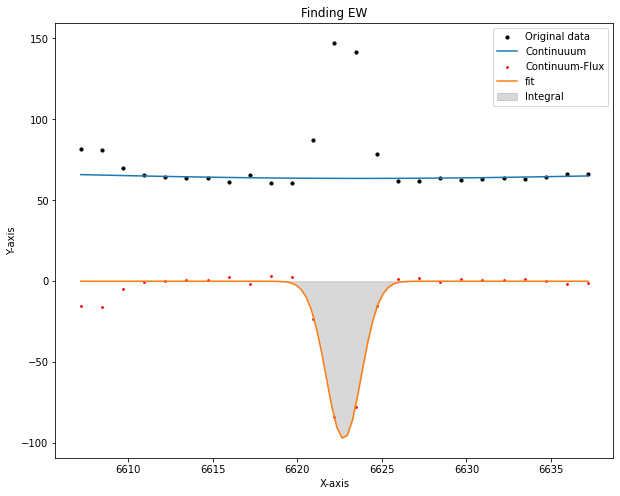

EW= -7.864864081977189  at (i,j)= 6 , 8


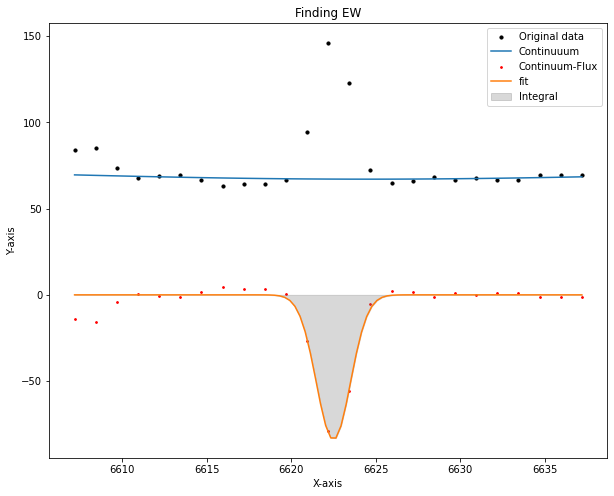

EW= -6.26755169064772  at (i,j)= 6 , 9


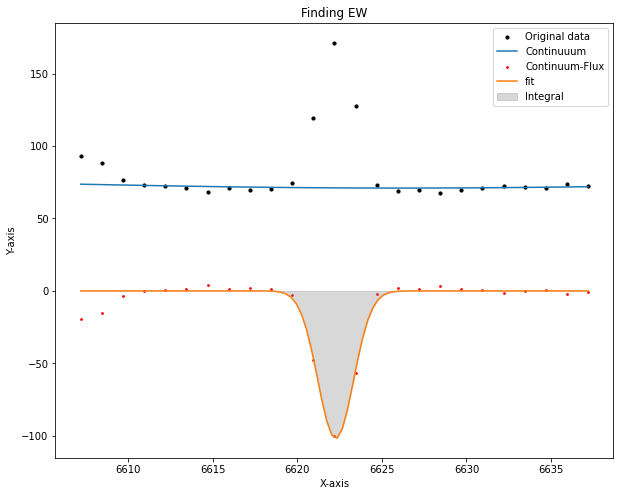

EW= -7.49036937904099  at (i,j)= 6 , 10


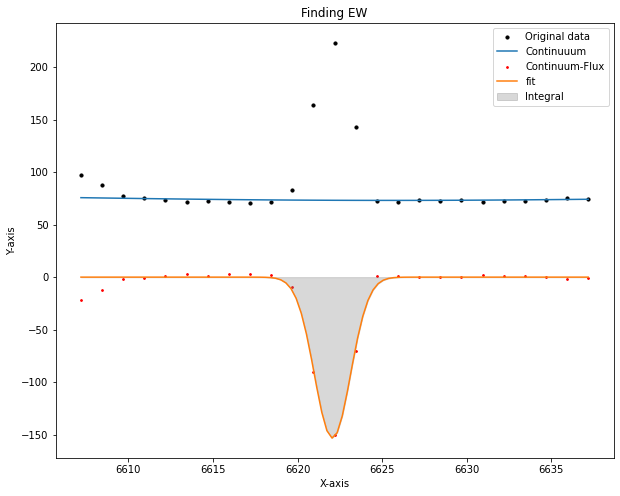

EW= -11.089640142124997  at (i,j)= 6 , 11


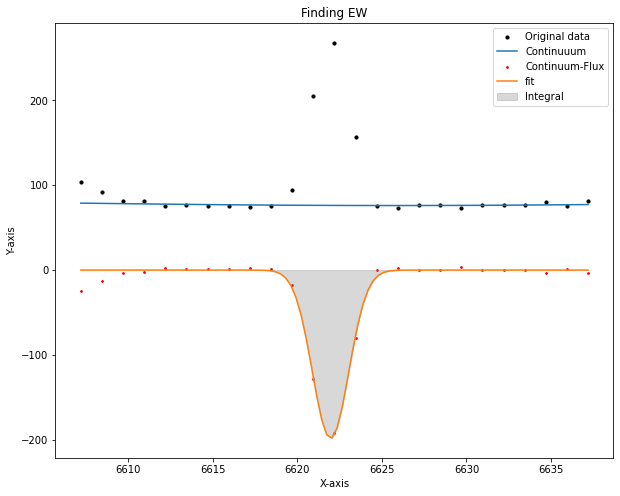

EW= -13.872316718987555  at (i,j)= 6 , 12


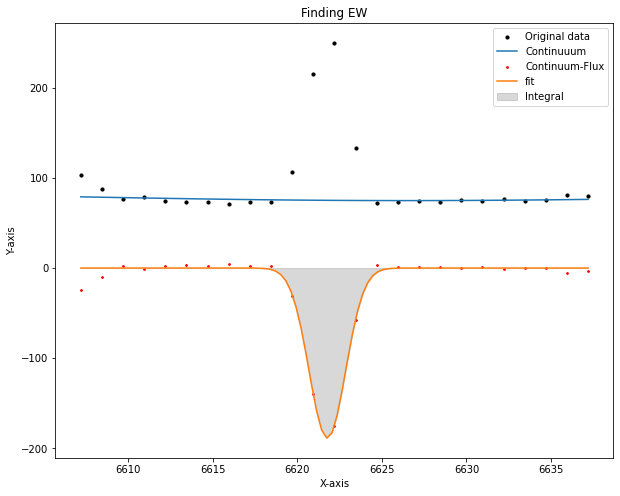

EW= -13.434020427019956  at (i,j)= 6 , 13


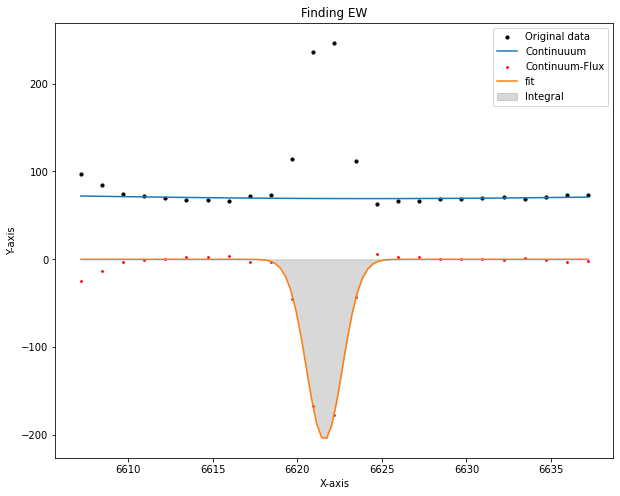

EW= -15.606139688984207  at (i,j)= 6 , 14


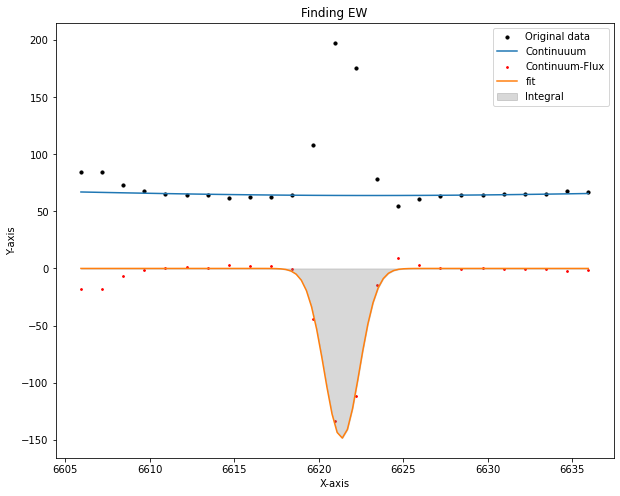

EW= -11.937260370247436  at (i,j)= 6 , 15


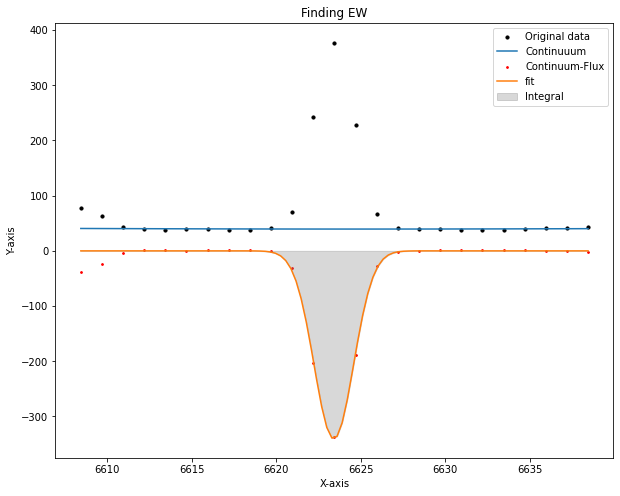

EW= -49.930403043314236  at (i,j)= 7 , 0


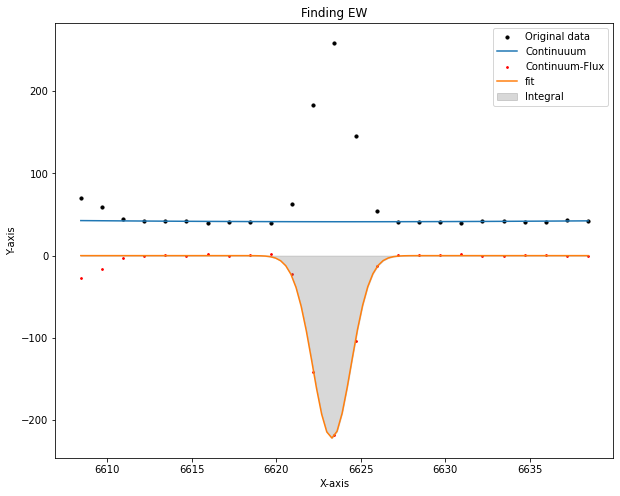

EW= -30.21990361529314  at (i,j)= 7 , 1


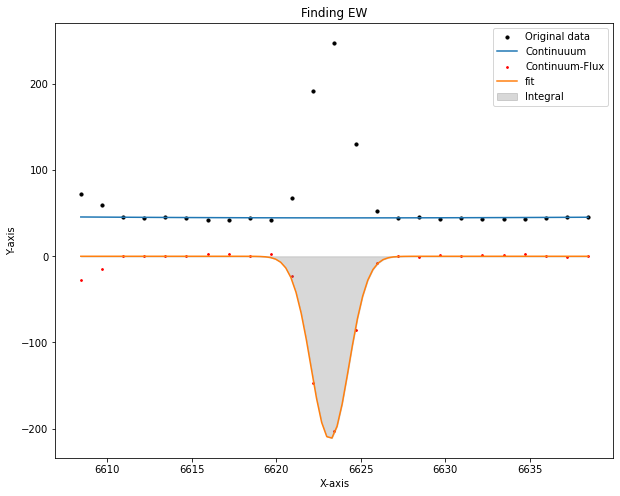

EW= -26.250766880136307  at (i,j)= 7 , 2


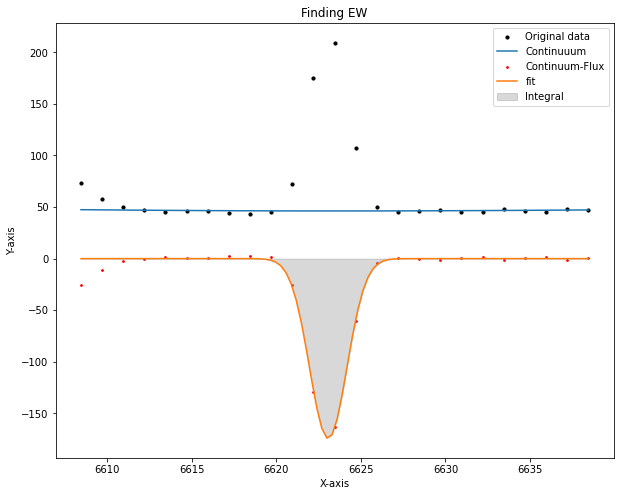

EW= -20.716618764192695  at (i,j)= 7 , 3


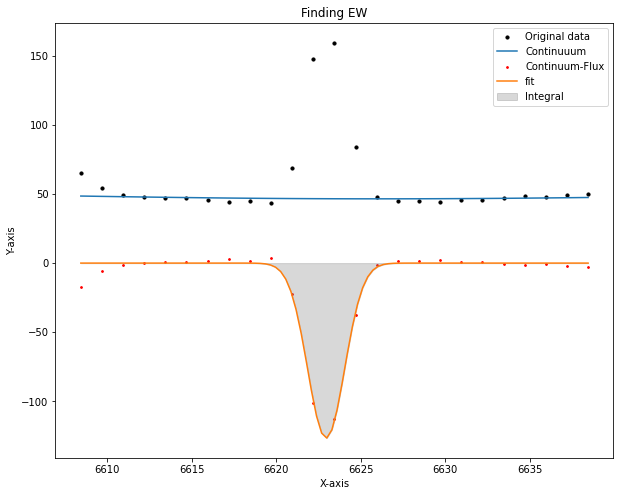

EW= -14.734060743220109  at (i,j)= 7 , 4


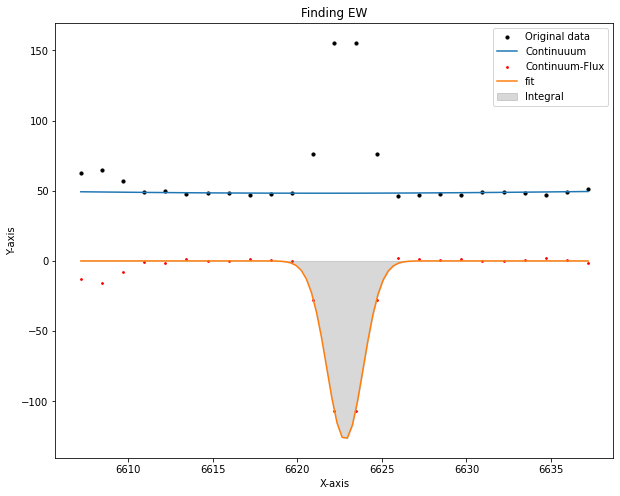

EW= -13.955409827605196  at (i,j)= 7 , 5


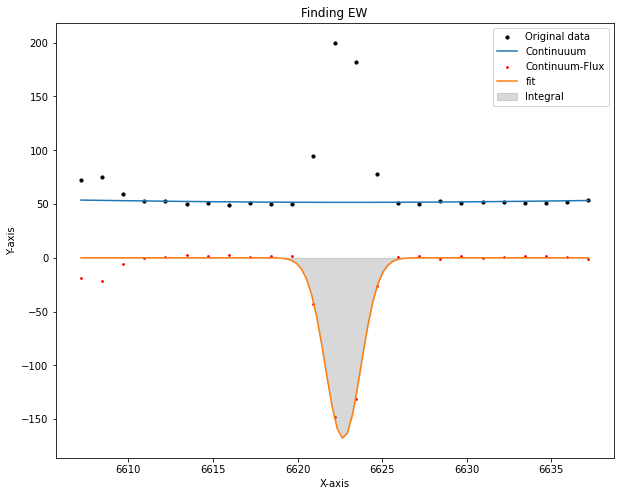

EW= -16.887900735219528  at (i,j)= 7 , 6


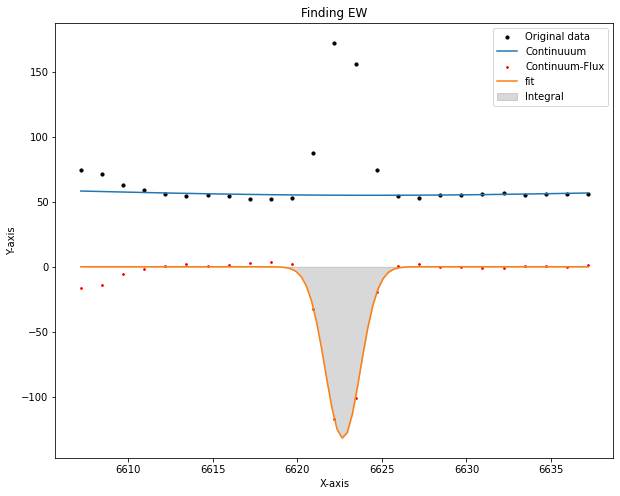

EW= -12.245562288288454  at (i,j)= 7 , 7


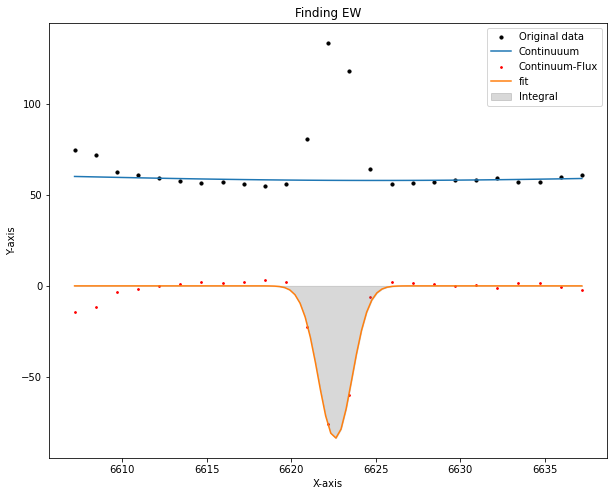

EW= -7.126674130617014  at (i,j)= 7 , 8


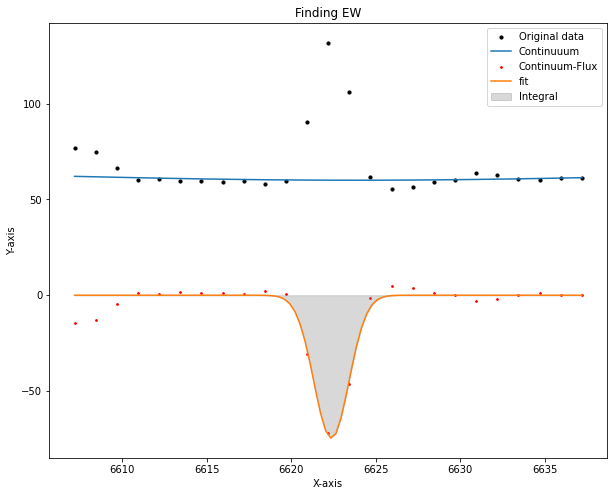

EW= -6.378765116668672  at (i,j)= 7 , 9


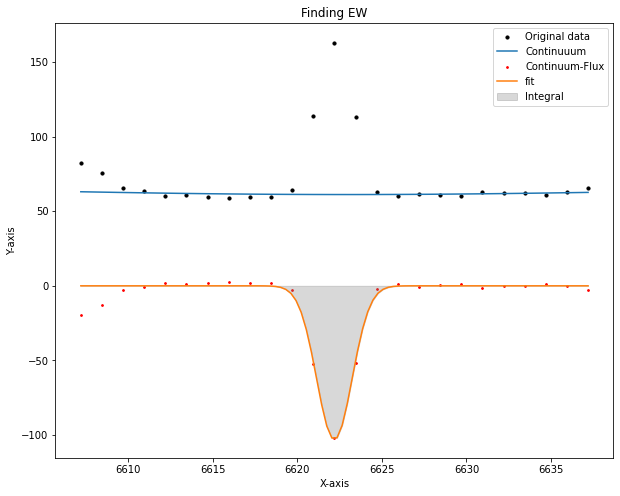

EW= -8.74532271793524  at (i,j)= 7 , 10


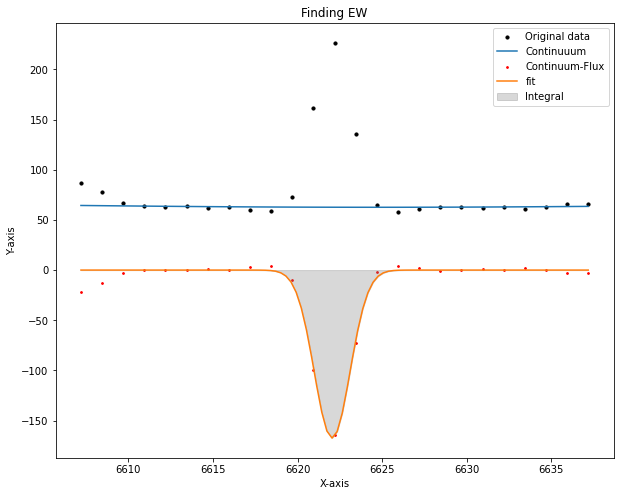

EW= -14.025018549624443  at (i,j)= 7 , 11


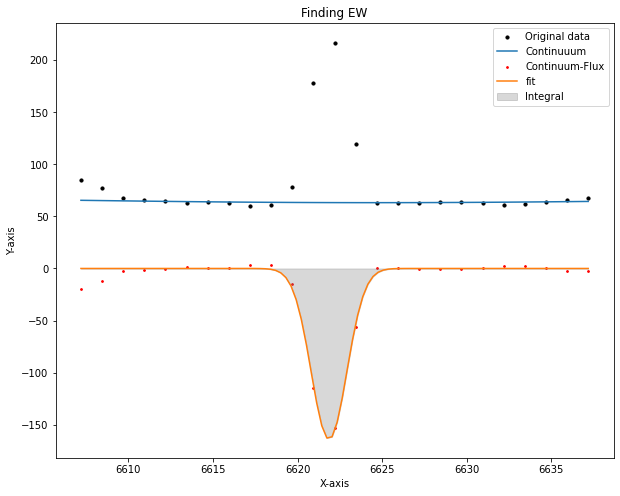

EW= -13.545818240992617  at (i,j)= 7 , 12


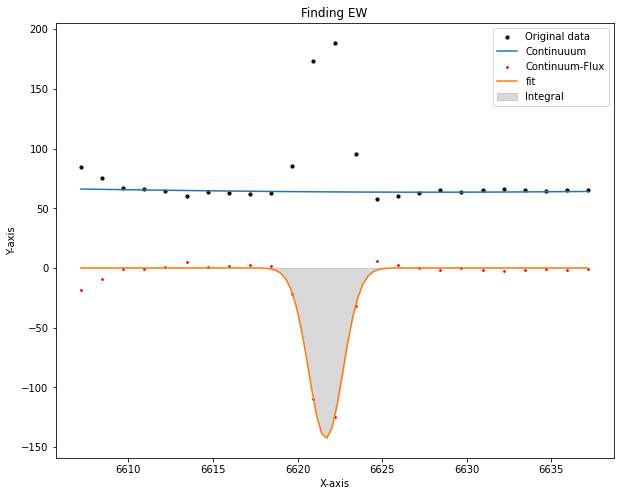

EW= -11.247170366359247  at (i,j)= 7 , 13


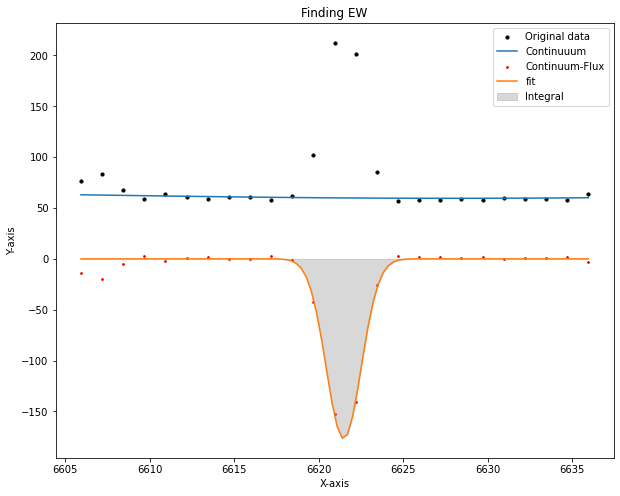

EW= -15.115249315342044  at (i,j)= 7 , 14


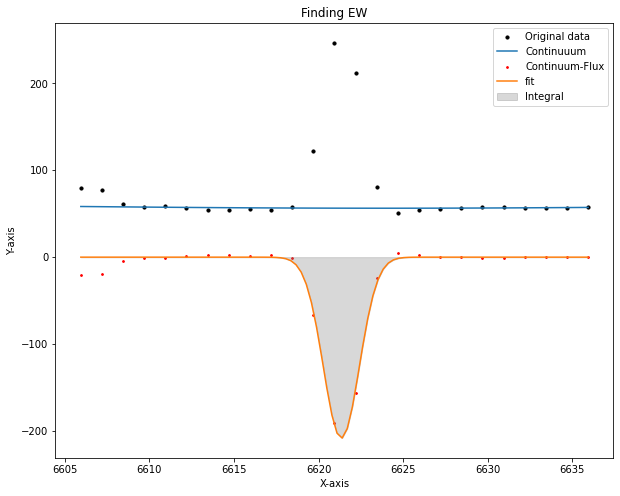

EW= -19.501716717355144  at (i,j)= 7 , 15


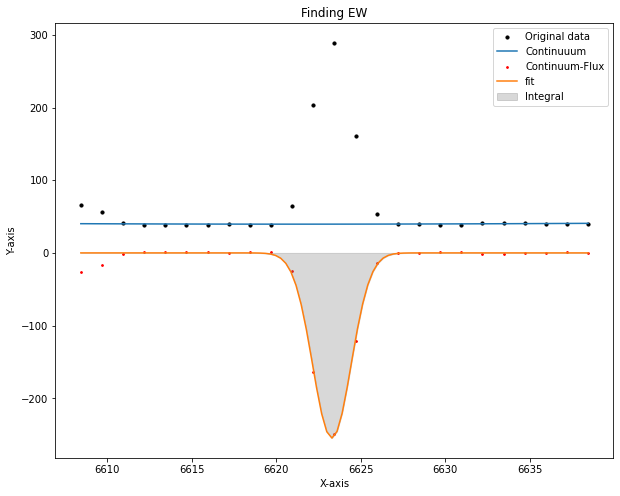

EW= -36.25529072861431  at (i,j)= 8 , 0


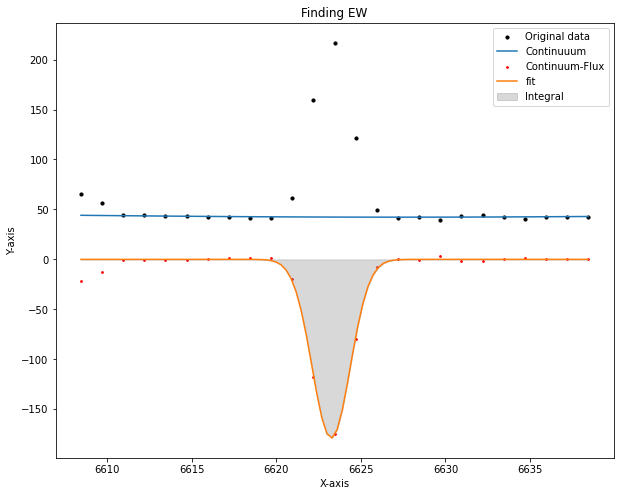

EW= -23.535564649373697  at (i,j)= 8 , 1


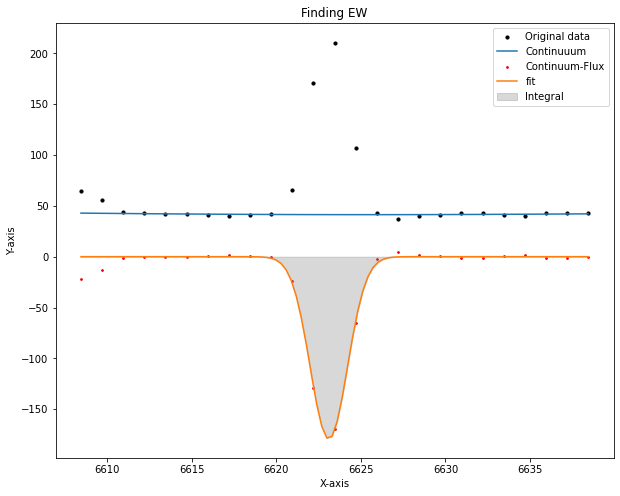

EW= -23.68333907728475  at (i,j)= 8 , 2


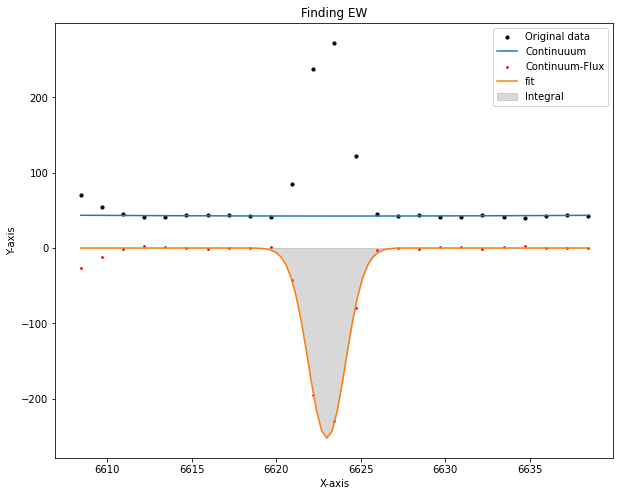

EW= -32.41362545447375  at (i,j)= 8 , 3


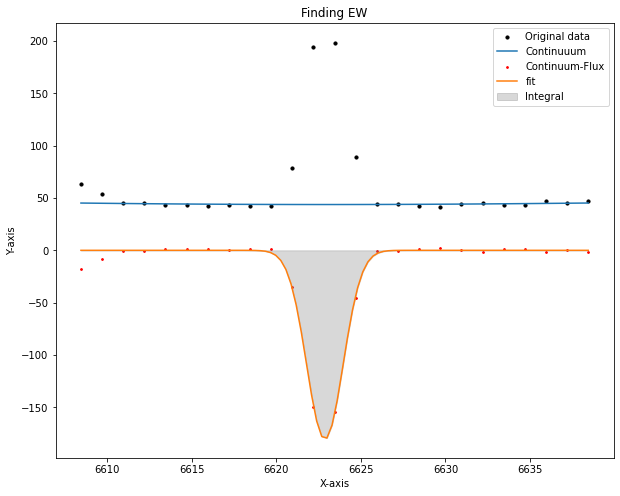

EW= -22.050197653715546  at (i,j)= 8 , 4


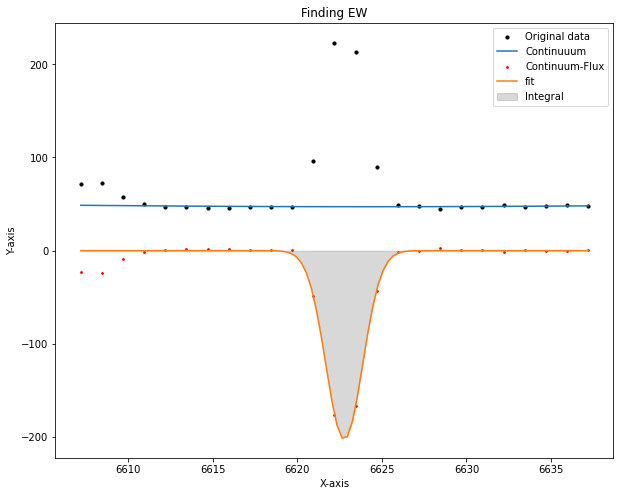

EW= -23.070950480097913  at (i,j)= 8 , 5


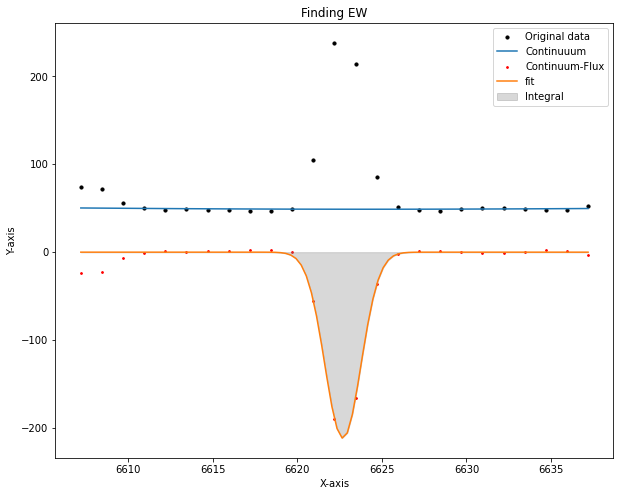

EW= -22.961351598794916  at (i,j)= 8 , 6


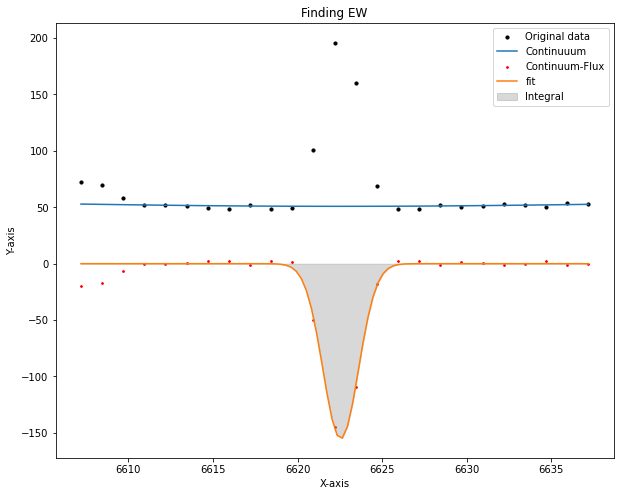

EW= -15.876142259121412  at (i,j)= 8 , 7


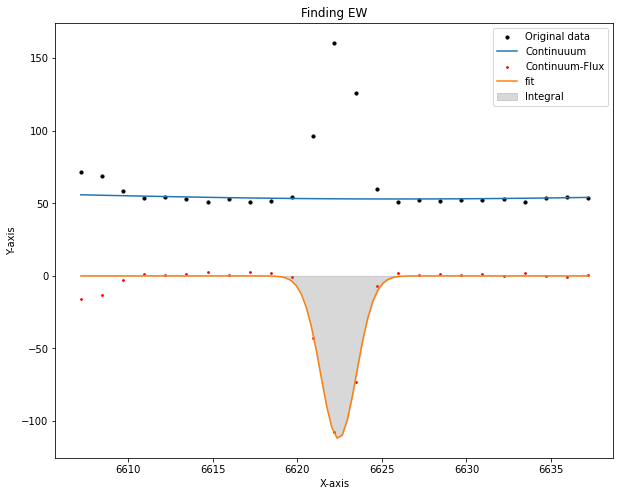

EW= -11.018458152674233  at (i,j)= 8 , 8


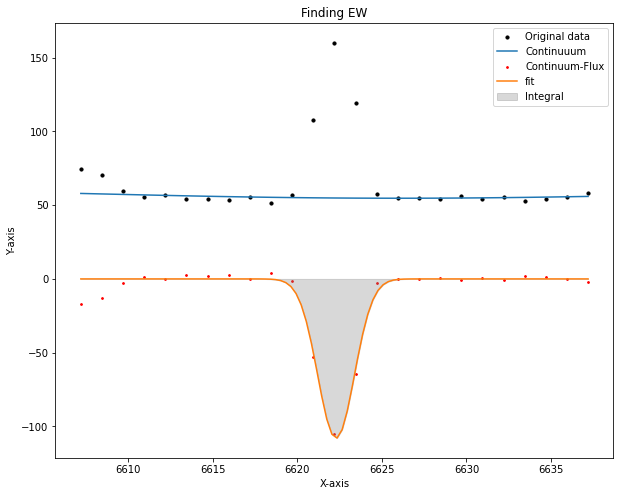

EW= -10.573643579893181  at (i,j)= 8 , 9


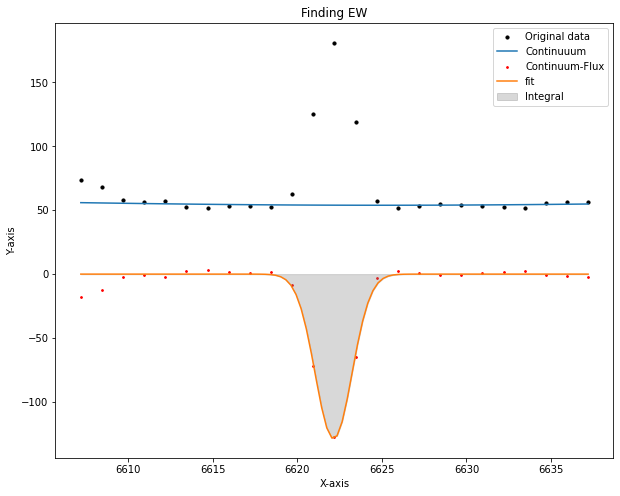

EW= -12.871103911636878  at (i,j)= 8 , 10


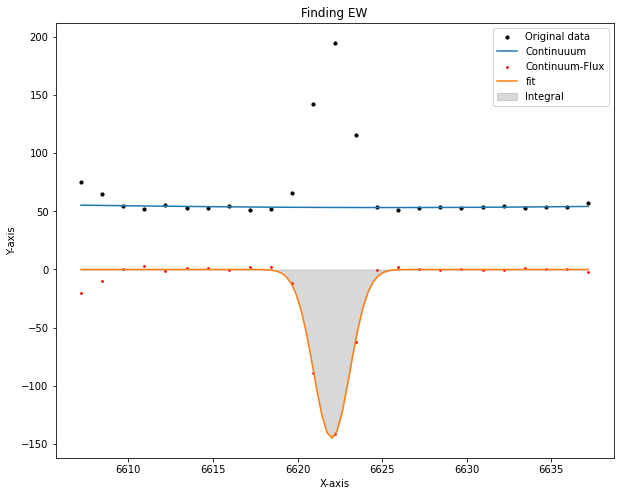

EW= -14.463914244317195  at (i,j)= 8 , 11


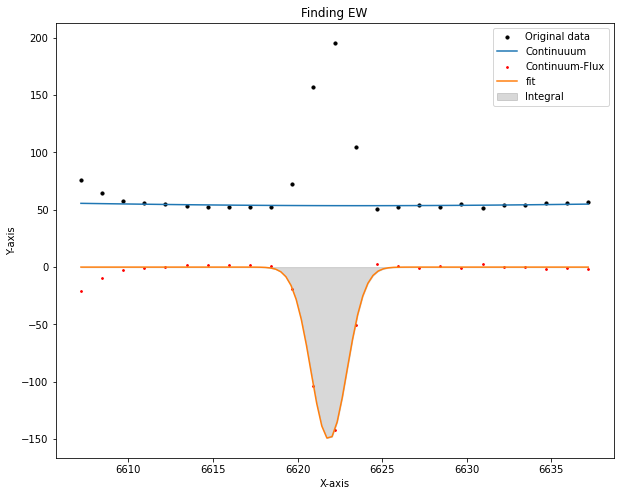

EW= -14.725206498824303  at (i,j)= 8 , 12


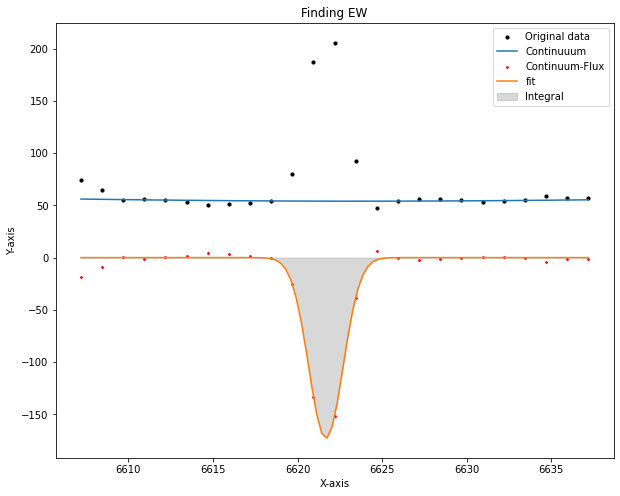

EW= -16.086974520049065  at (i,j)= 8 , 13


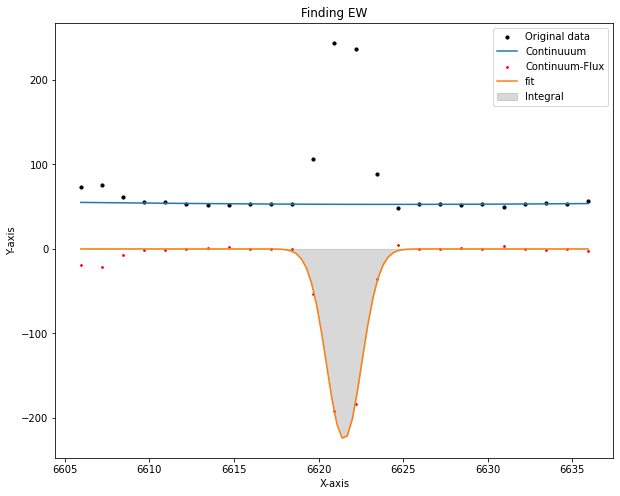

EW= -21.95515884734397  at (i,j)= 8 , 14


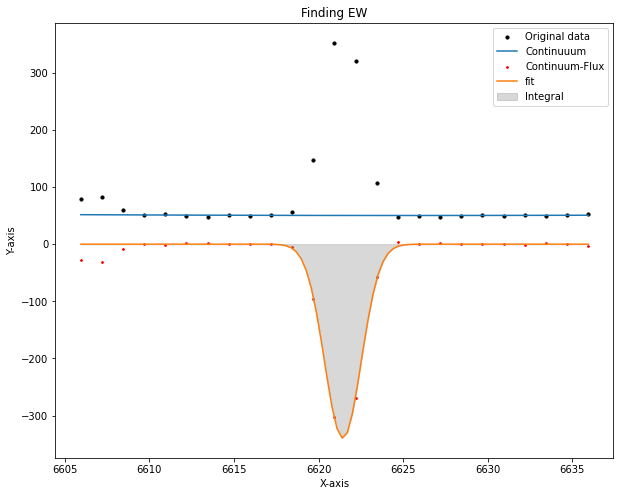

EW= -36.32372275584035  at (i,j)= 8 , 15


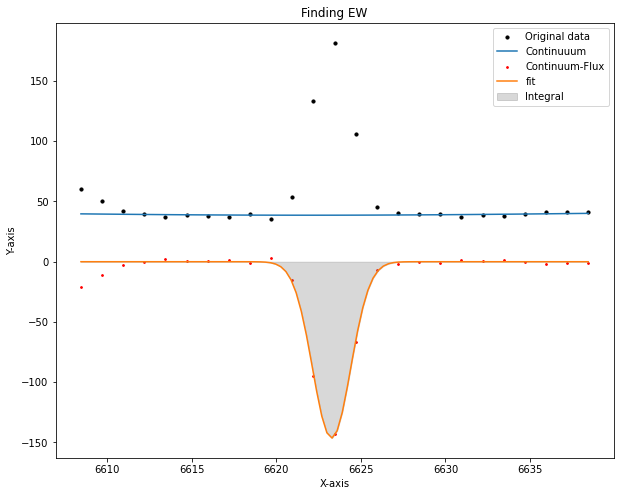

EW= -21.161584497747413  at (i,j)= 9 , 0


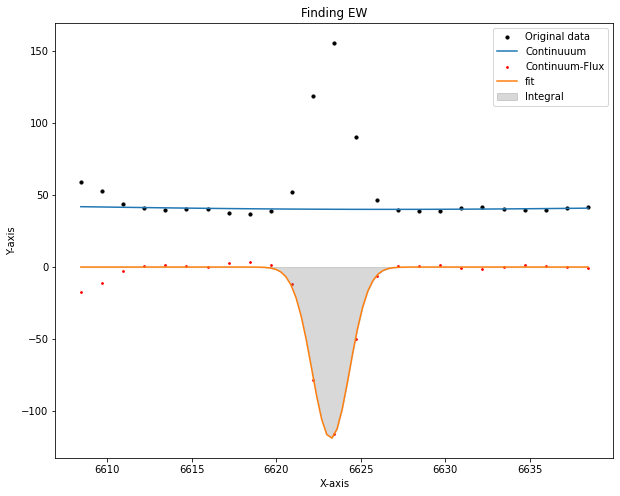

EW= -16.29240151618569  at (i,j)= 9 , 1


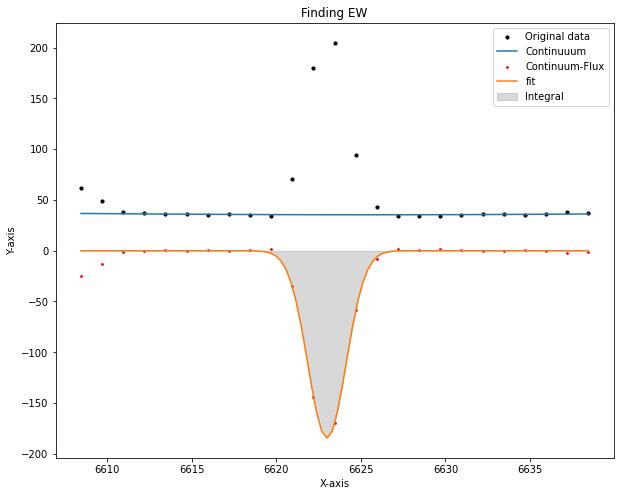

EW= -29.085908140056432  at (i,j)= 9 , 2


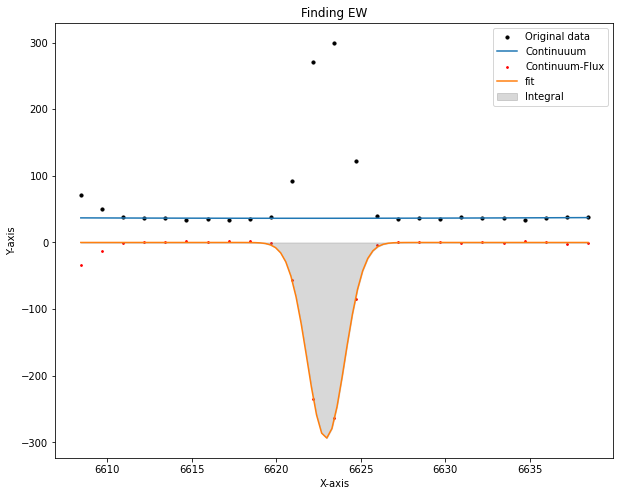

EW= -44.340643478523596  at (i,j)= 9 , 3


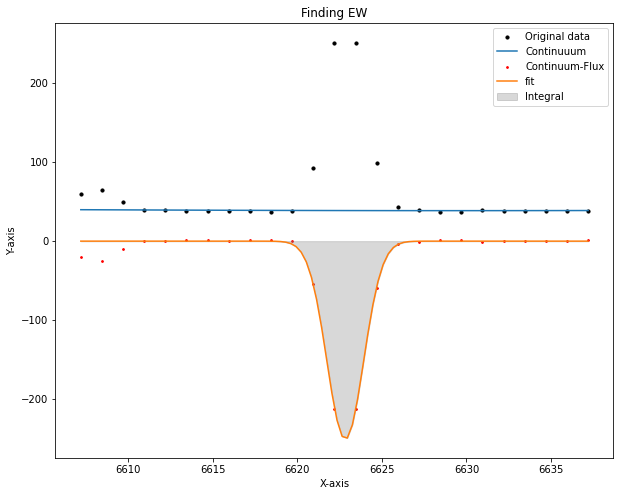

EW= -34.86922764926169  at (i,j)= 9 , 4


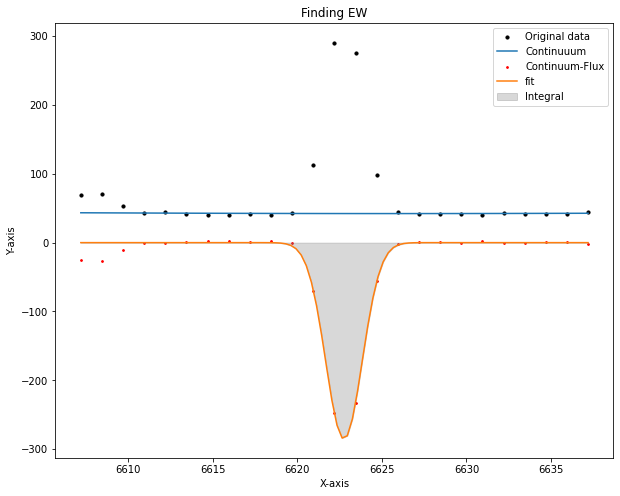

EW= -36.05669423290655  at (i,j)= 9 , 5


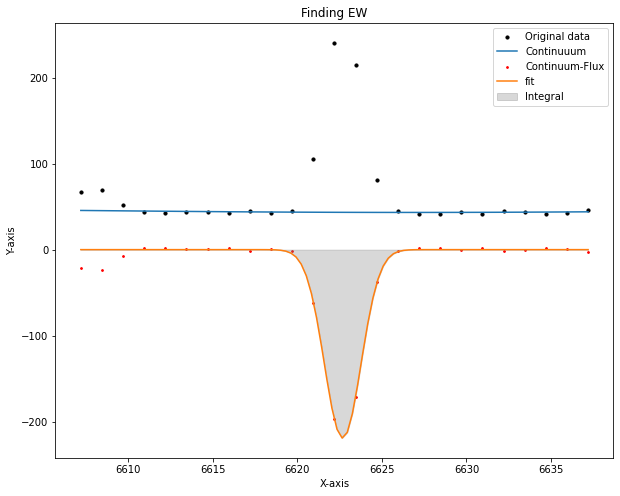

EW= -27.18880346515734  at (i,j)= 9 , 6


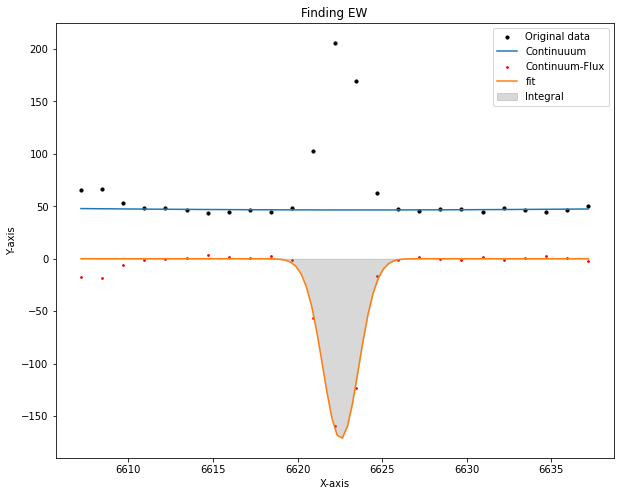

EW= -19.297404013134724  at (i,j)= 9 , 7


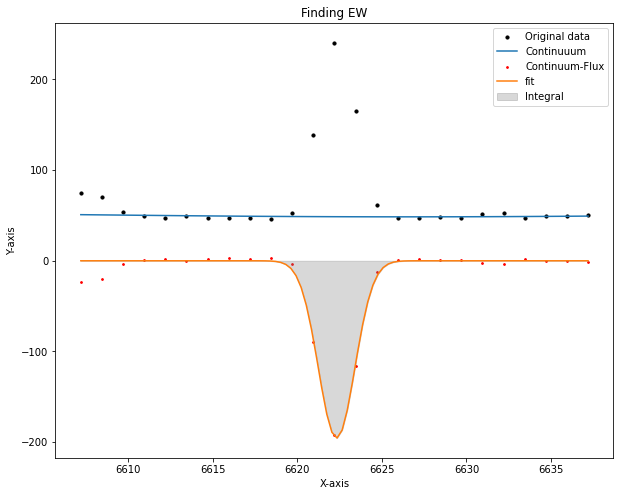

EW= -21.519423768692324  at (i,j)= 9 , 8


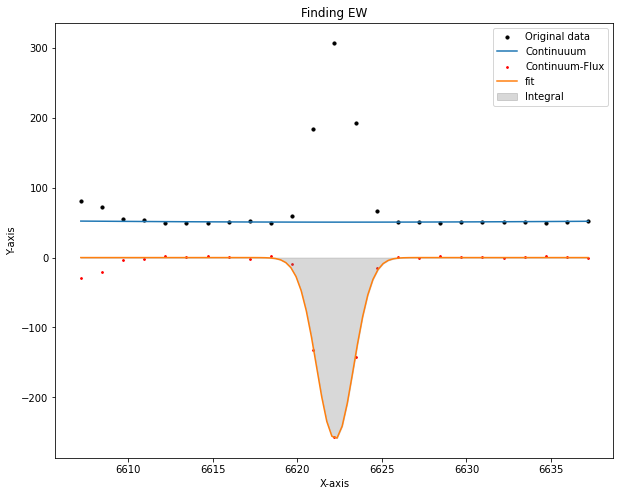

EW= -27.640756741166115  at (i,j)= 9 , 9


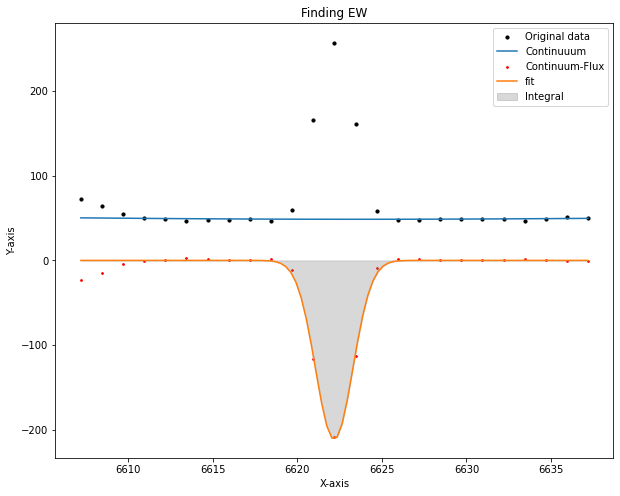

EW= -23.790147699771843  at (i,j)= 9 , 10


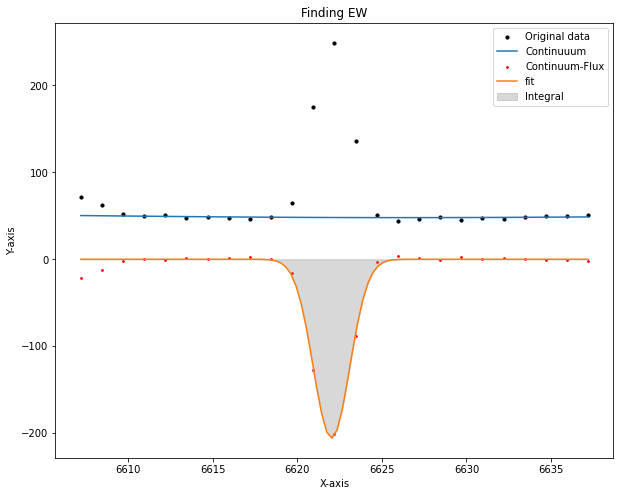

EW= -22.867029598745056  at (i,j)= 9 , 11


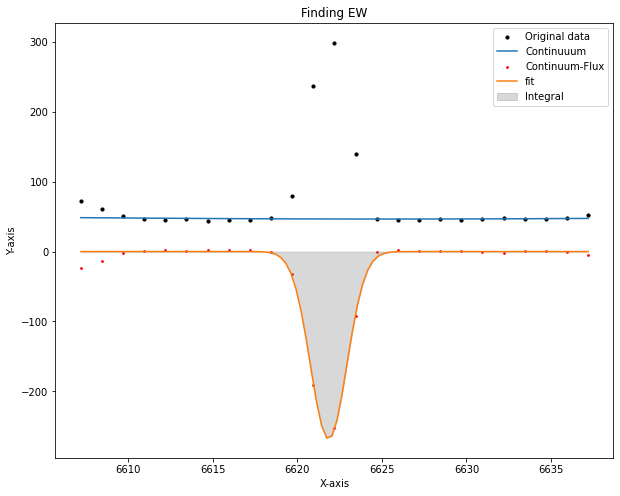

EW= -30.67968860863855  at (i,j)= 9 , 12


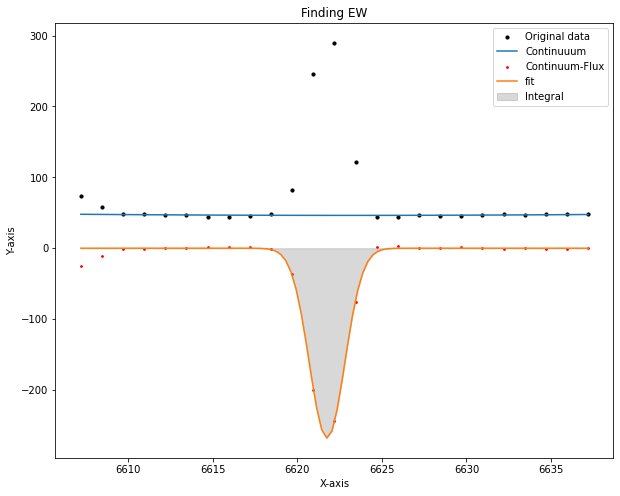

EW= -30.017199520422157  at (i,j)= 9 , 13


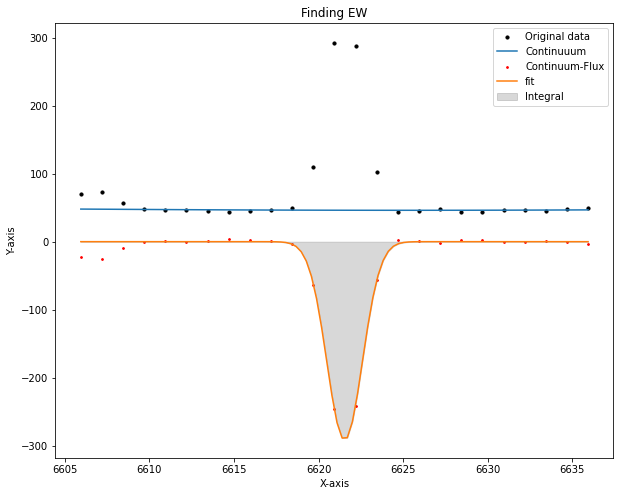

EW= -32.88962947204103  at (i,j)= 9 , 14


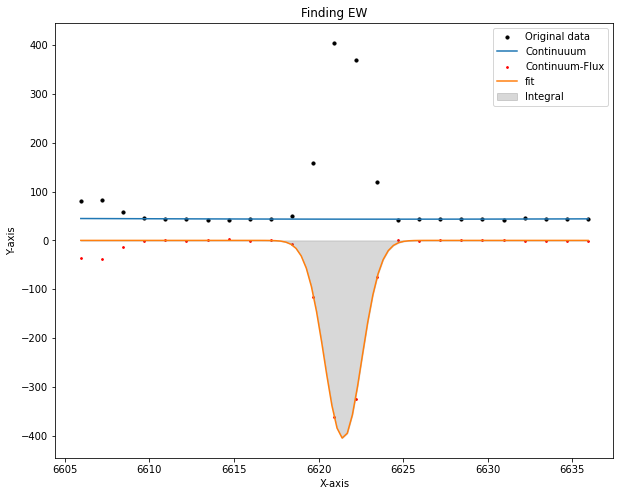

EW= -50.68763332495572  at (i,j)= 9 , 15


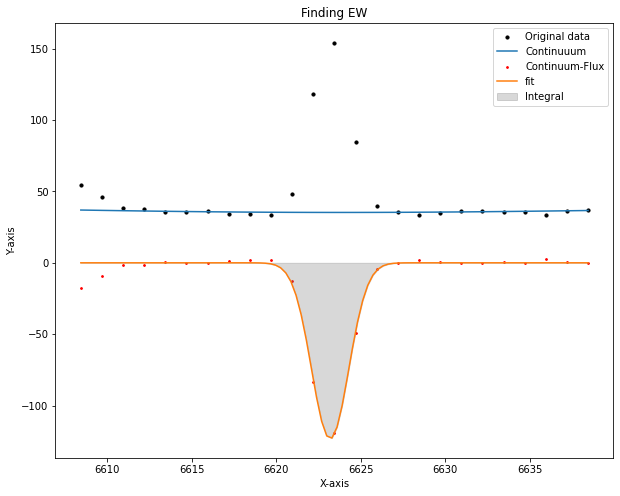

EW= -19.017983112067284  at (i,j)= 10 , 0


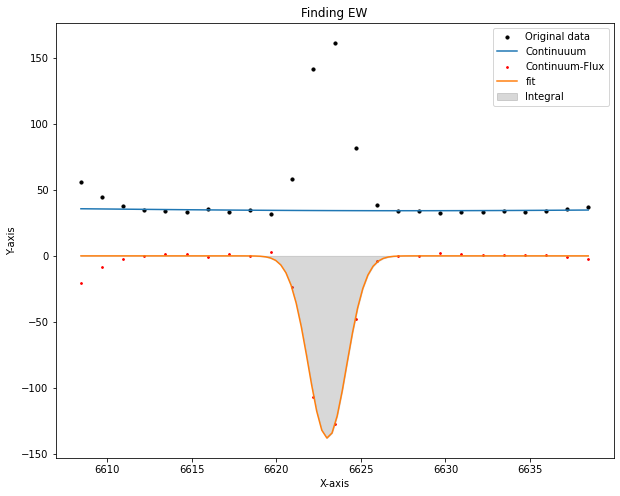

EW= -22.492187879463014  at (i,j)= 10 , 1


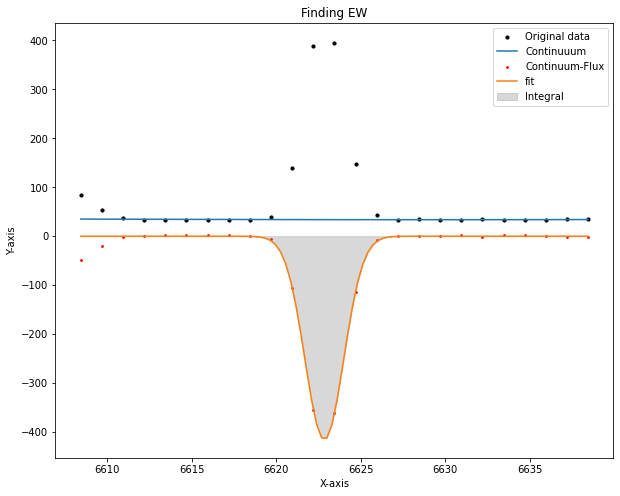

EW= -69.74656440644081  at (i,j)= 10 , 2


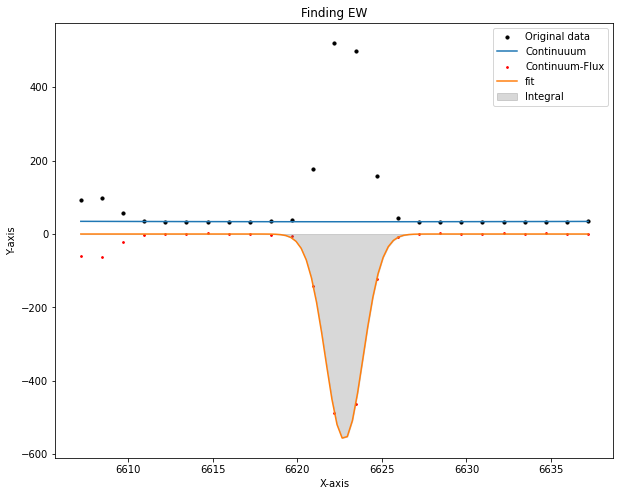

EW= -91.62142793468381  at (i,j)= 10 , 3


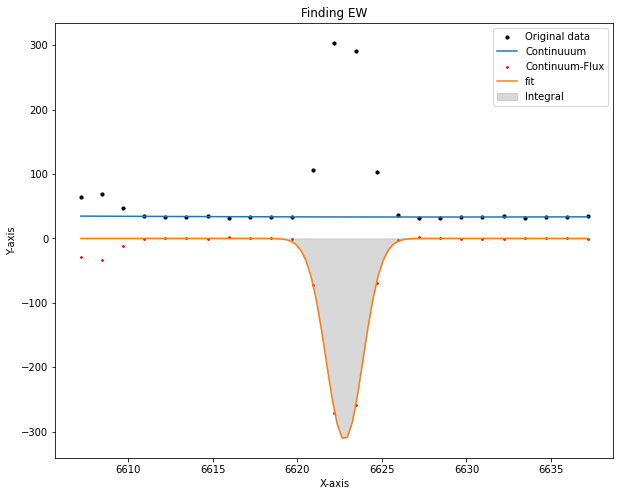

EW= -50.600216115455  at (i,j)= 10 , 4


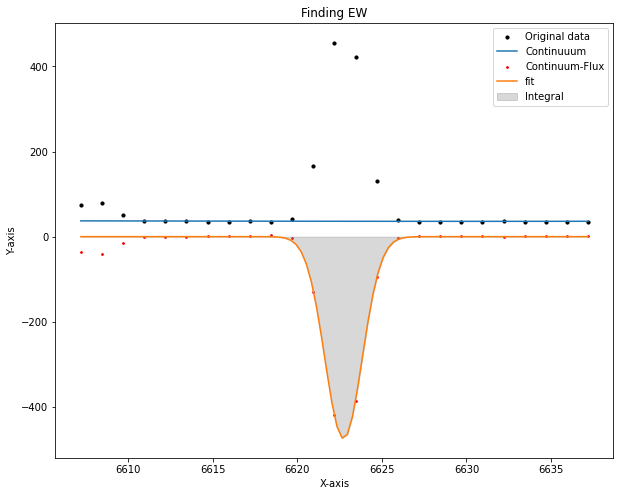

EW= -71.77813367698116  at (i,j)= 10 , 5


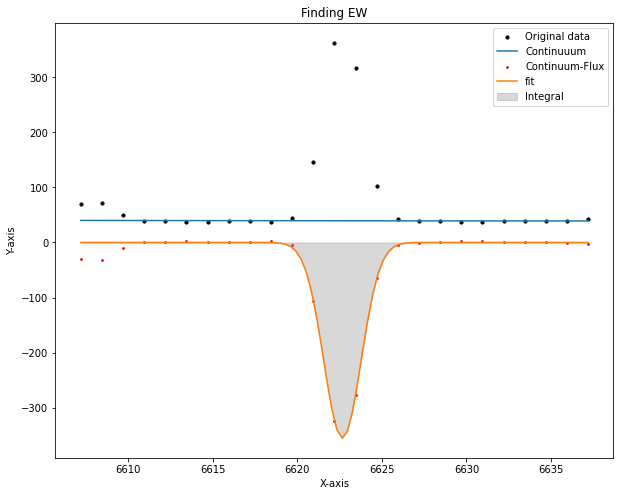

EW= -49.235658284674344  at (i,j)= 10 , 6


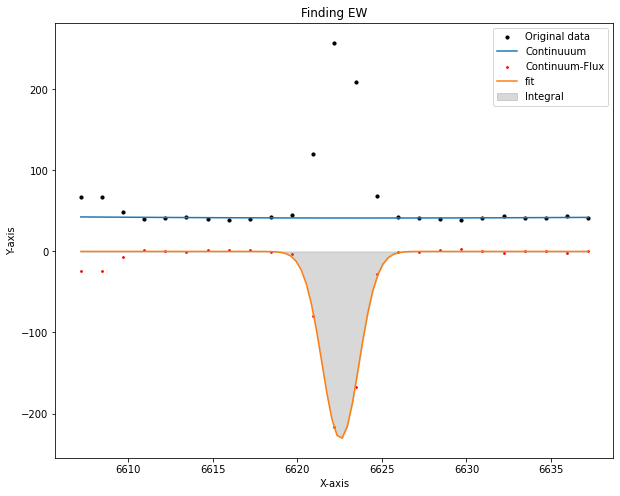

EW= -30.05758309449052  at (i,j)= 10 , 7


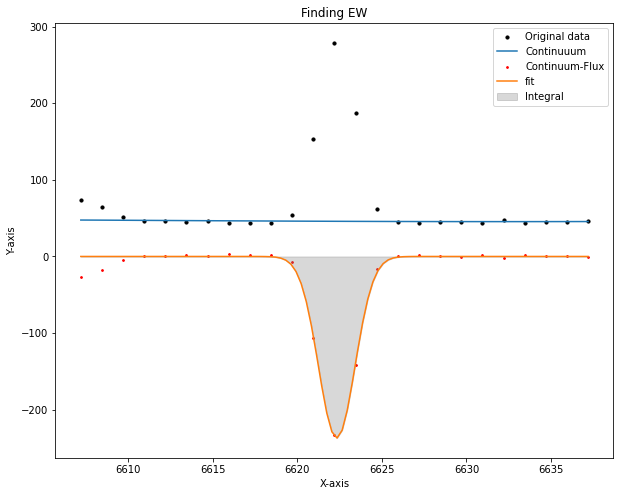

EW= -27.66158955062219  at (i,j)= 10 , 8


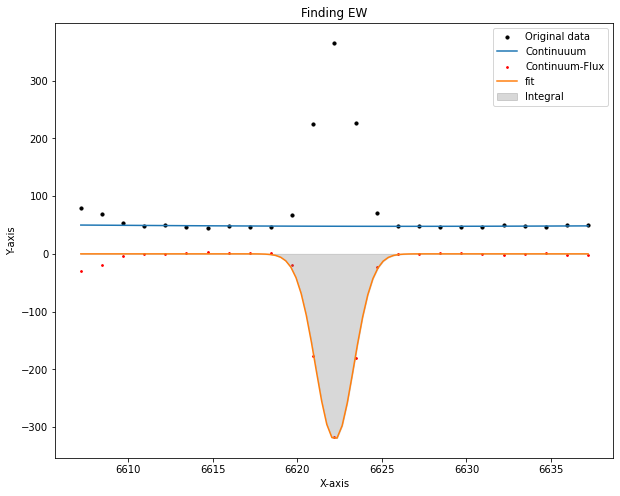

EW= -37.61698072094214  at (i,j)= 10 , 9


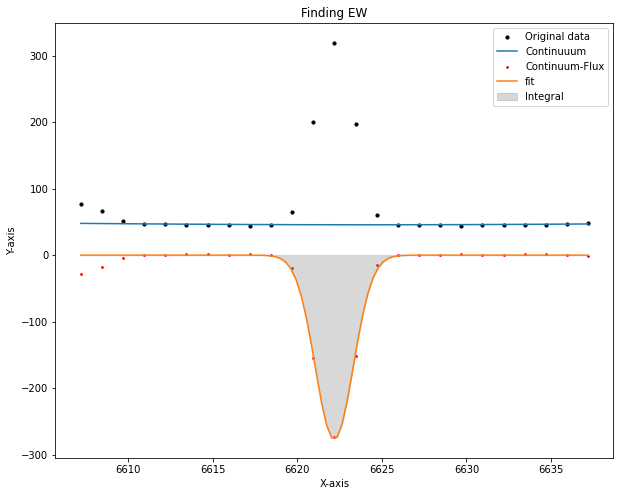

EW= -33.7927676567561  at (i,j)= 10 , 10


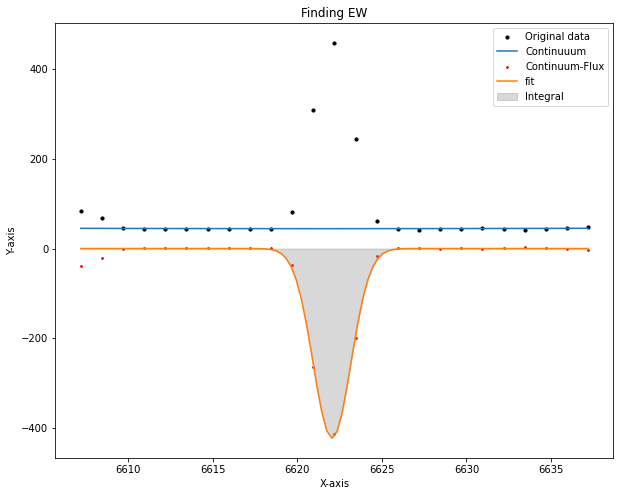

EW= -52.80901245659587  at (i,j)= 10 , 11


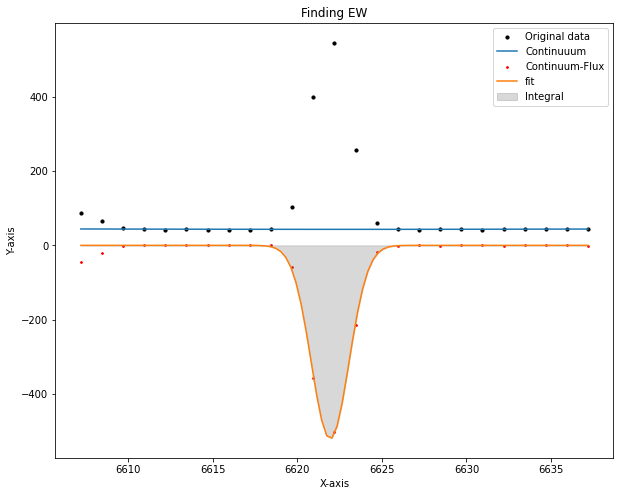

EW= -66.70278051747341  at (i,j)= 10 , 12


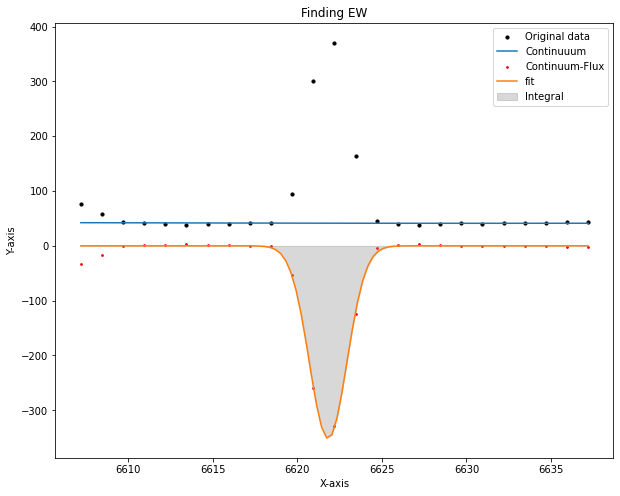

EW= -46.79253743317477  at (i,j)= 10 , 13


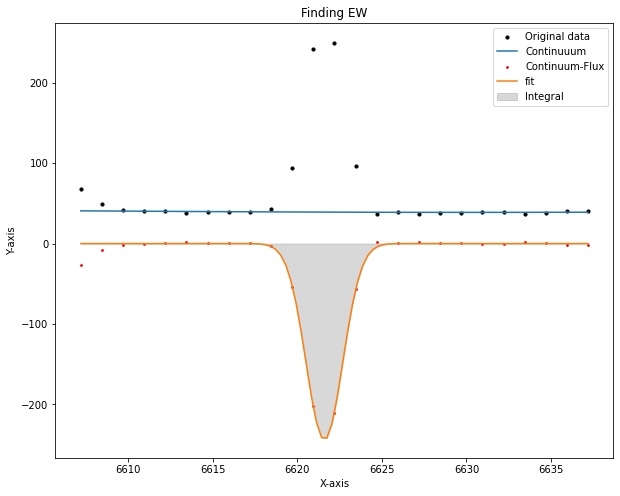

EW= -33.608988414301386  at (i,j)= 10 , 14


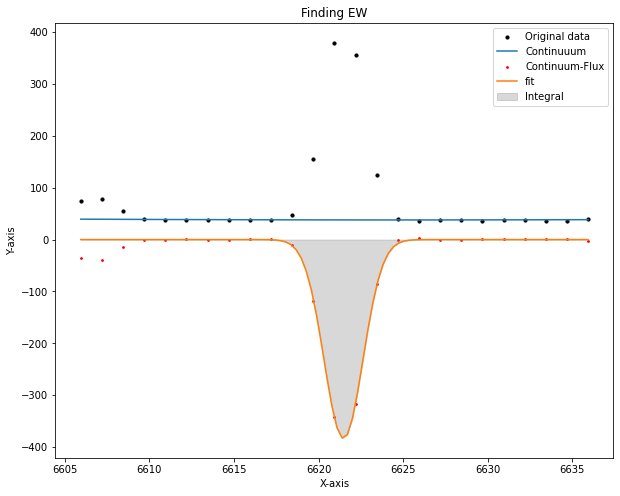

EW= -57.638604562390405  at (i,j)= 10 , 15


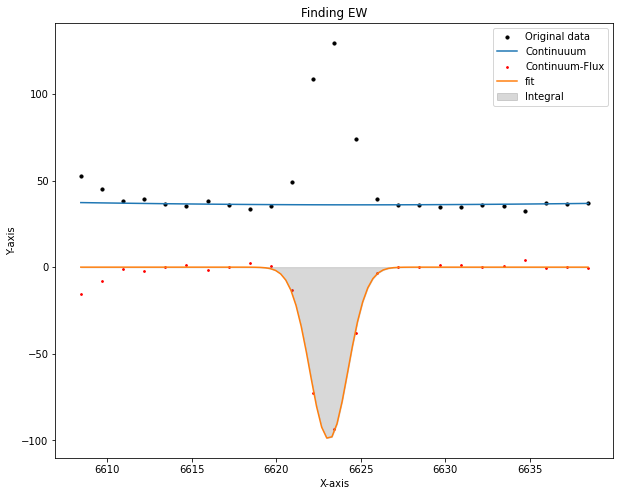

EW= -15.319397021757204  at (i,j)= 11 , 0


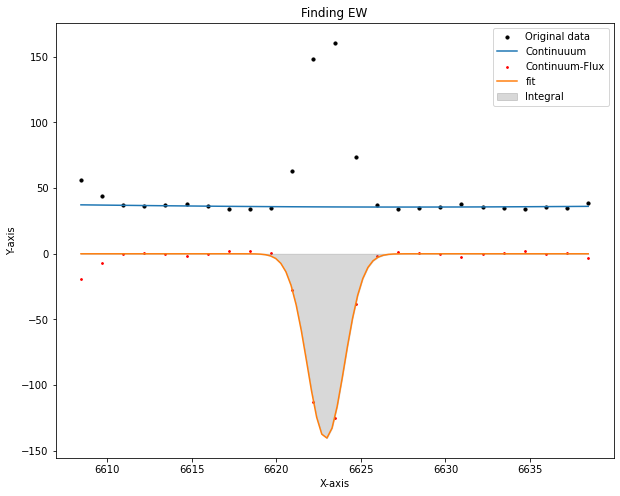

EW= -21.35476965223576  at (i,j)= 11 , 1


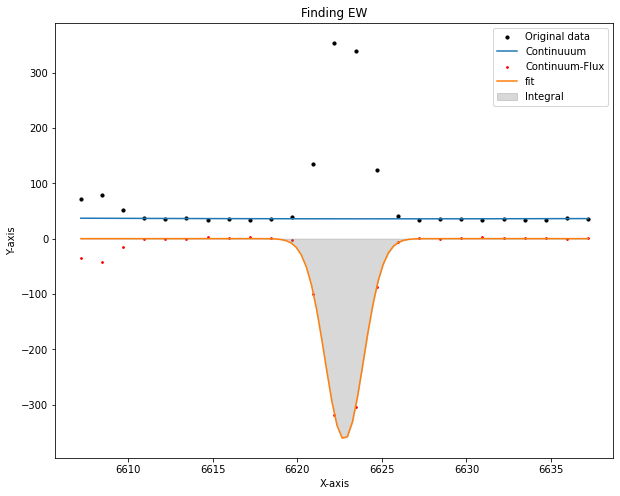

EW= -57.00524123606666  at (i,j)= 11 , 2


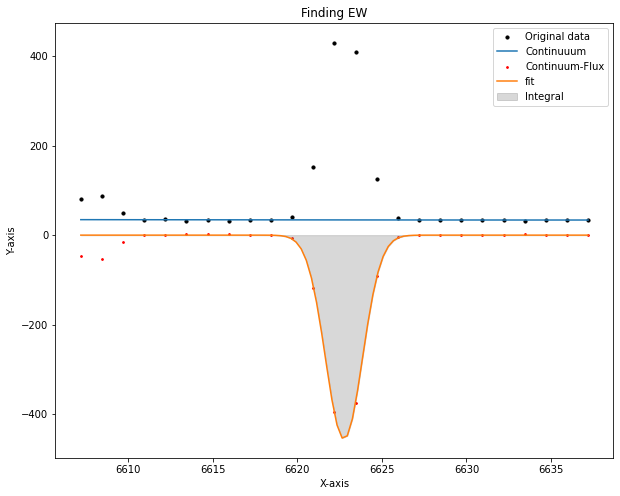

EW= -72.52336999108773  at (i,j)= 11 , 3


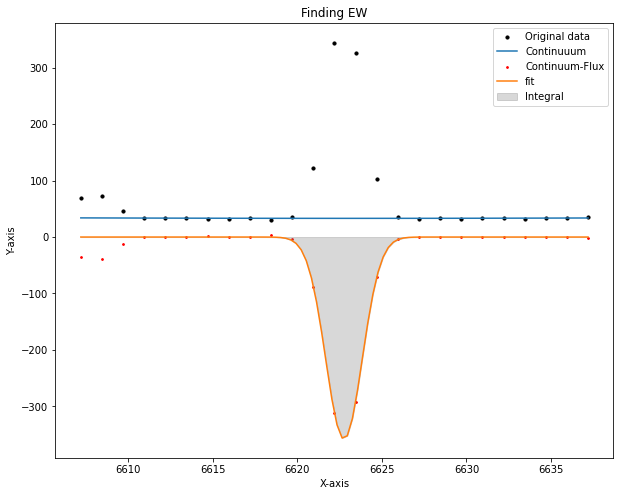

EW= -57.80939888020538  at (i,j)= 11 , 4


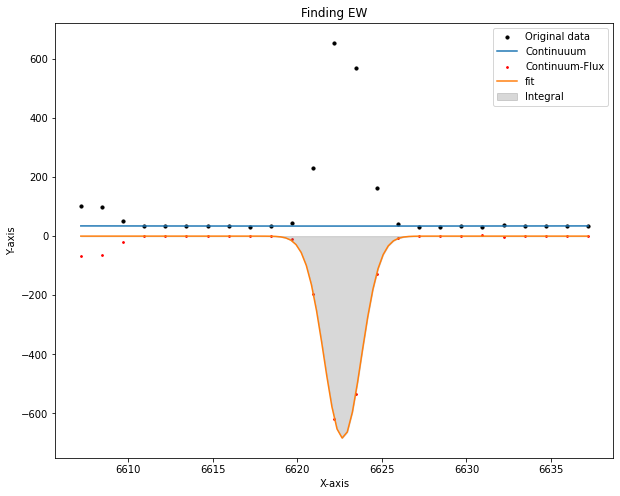

EW= -109.160992021487  at (i,j)= 11 , 5


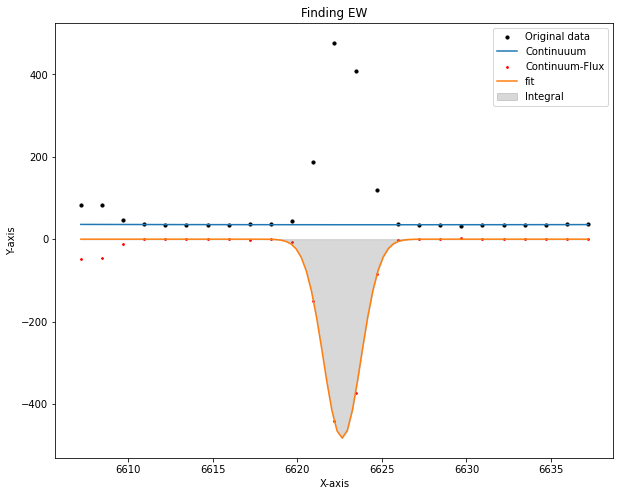

EW= -75.69400361849233  at (i,j)= 11 , 6


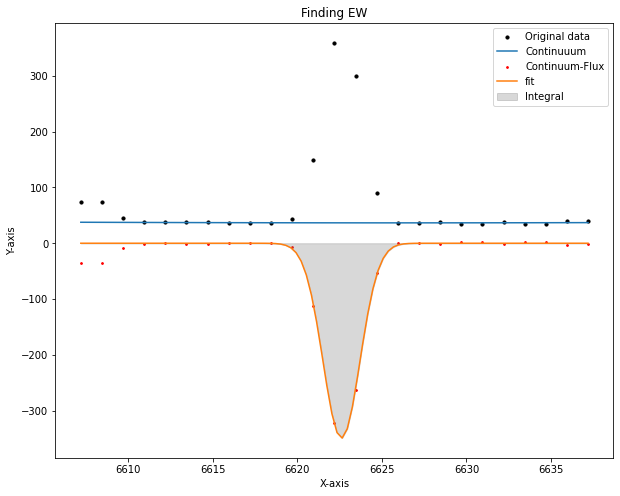

EW= -51.762235405021656  at (i,j)= 11 , 7


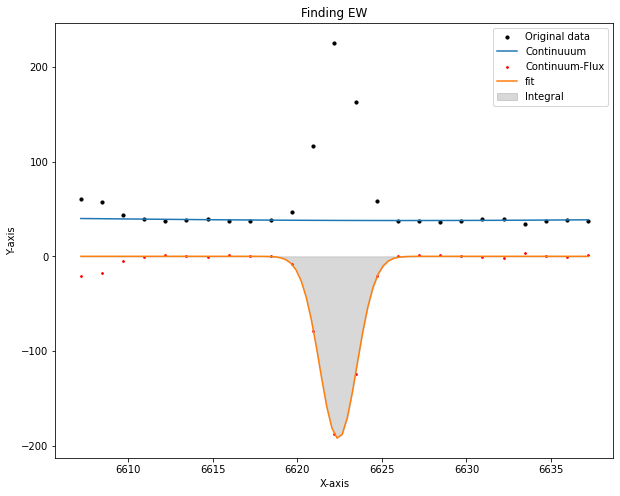

EW= -27.562153581299135  at (i,j)= 11 , 8


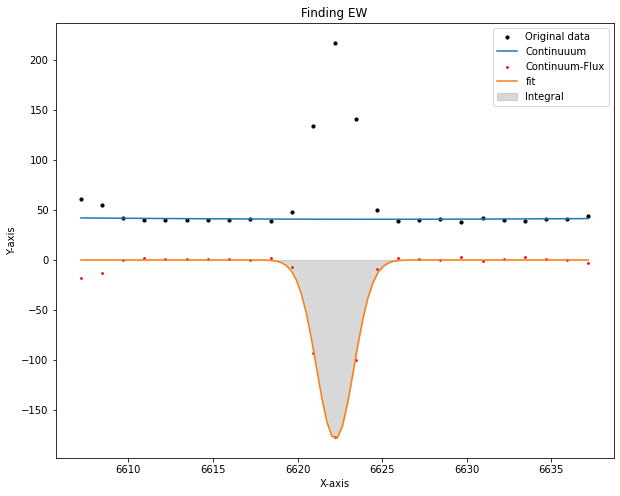

EW= -23.938663603444446  at (i,j)= 11 , 9


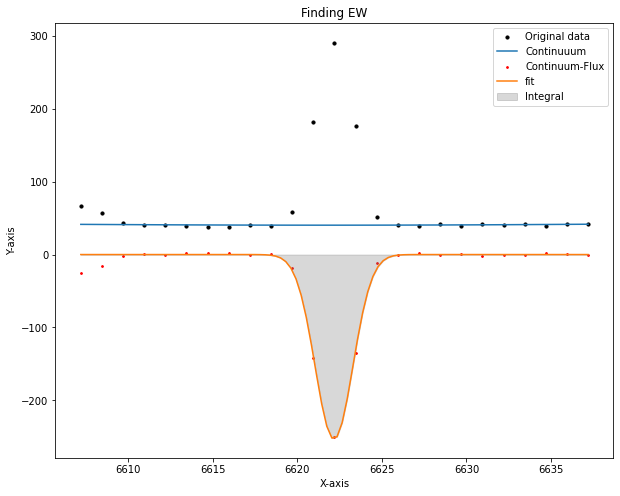

EW= -34.81753142088031  at (i,j)= 11 , 10


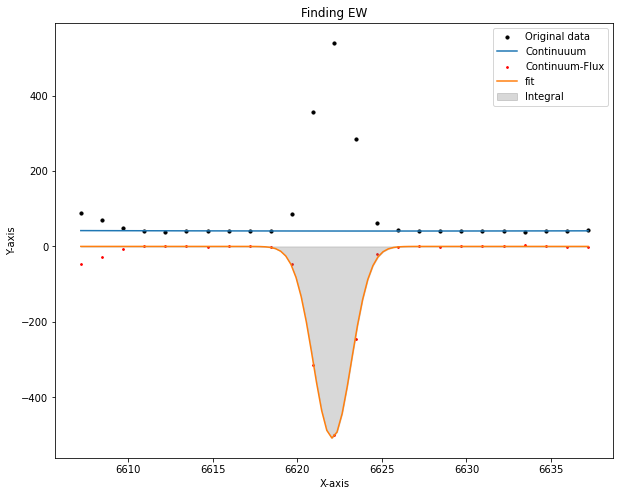

EW= -69.30058691761761  at (i,j)= 11 , 11


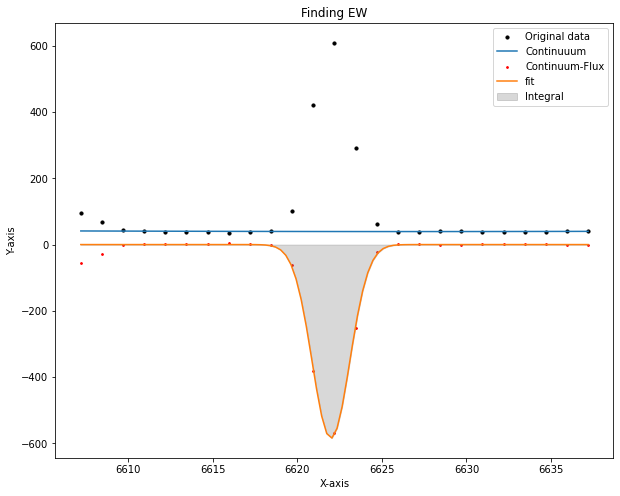

EW= -81.79211416436047  at (i,j)= 11 , 12


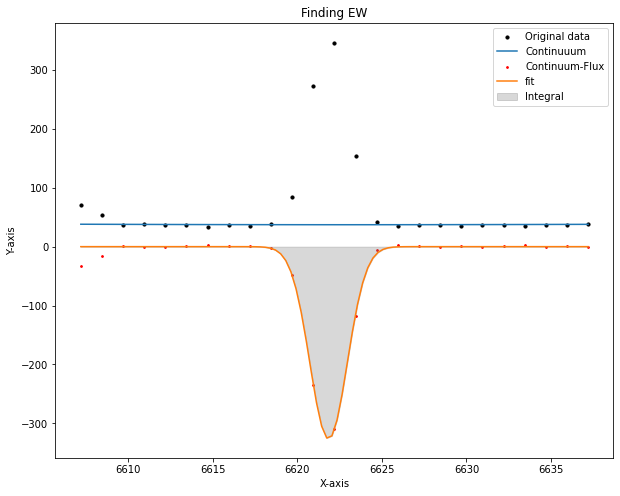

EW= -48.04442834460133  at (i,j)= 11 , 13


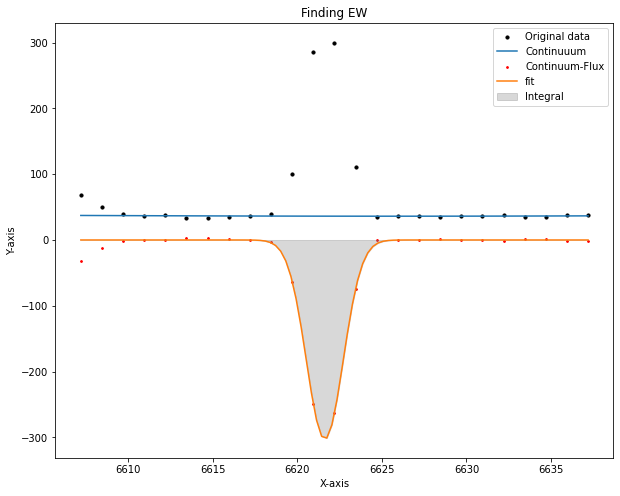

EW= -45.08667082671667  at (i,j)= 11 , 14


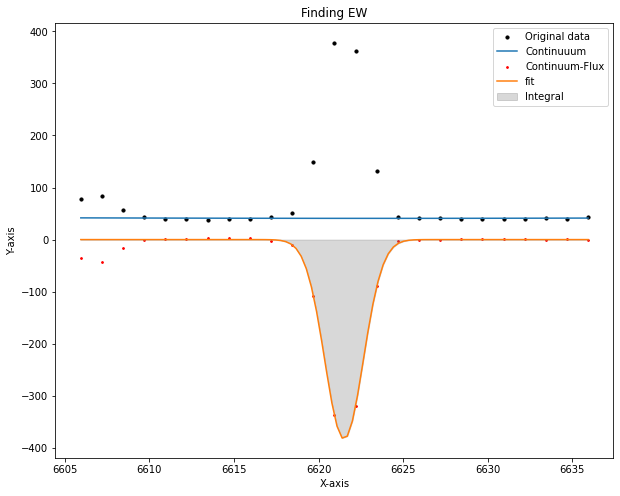

EW= -53.01357377979379  at (i,j)= 11 , 15


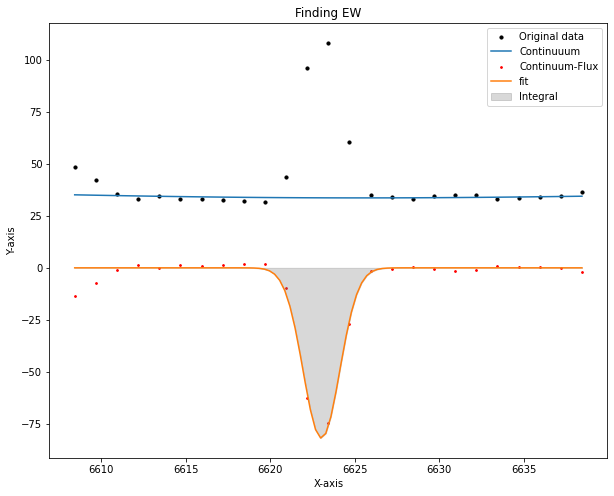

EW= -13.045803067917031  at (i,j)= 12 , 0


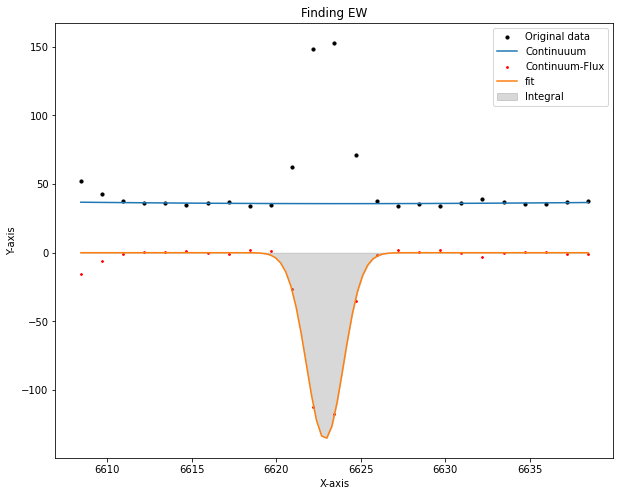

EW= -20.473486420998615  at (i,j)= 12 , 1


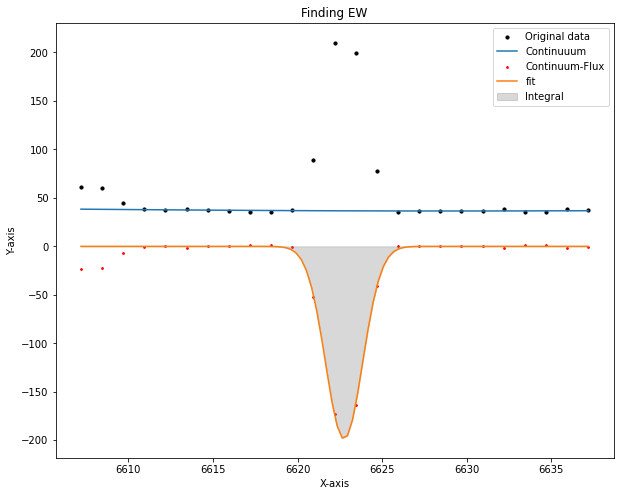

EW= -29.396480629709956  at (i,j)= 12 , 2


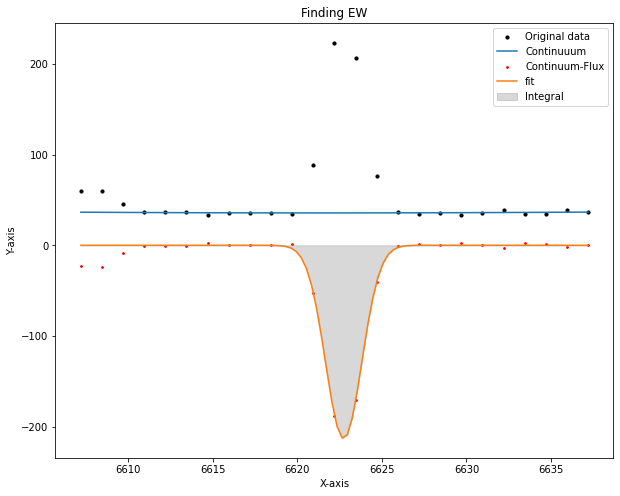

EW= -31.7143169300968  at (i,j)= 12 , 3


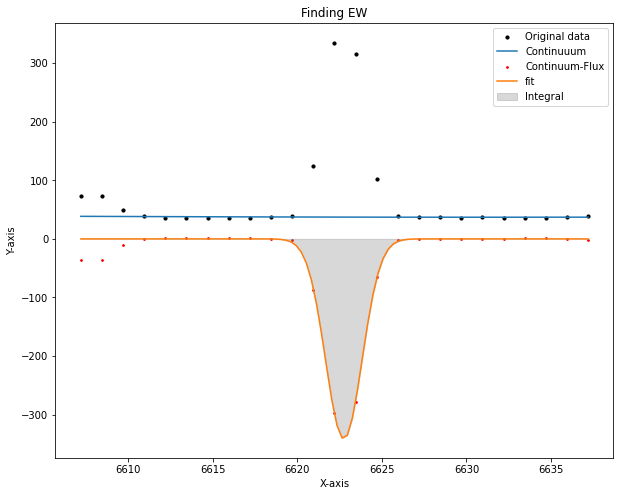

EW= -49.13278133229113  at (i,j)= 12 , 4


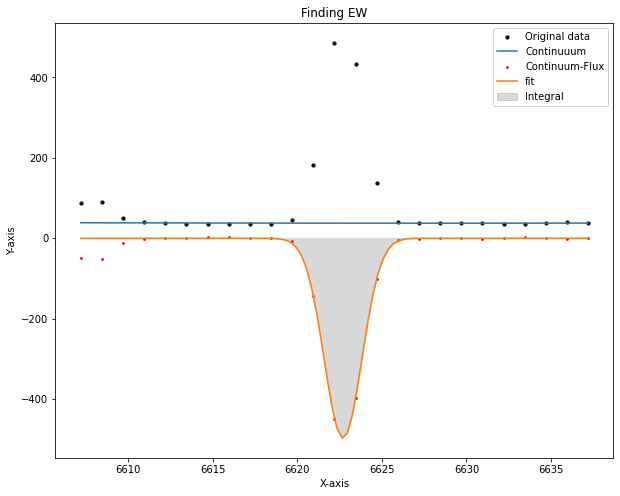

EW= -73.42687271972494  at (i,j)= 12 , 5


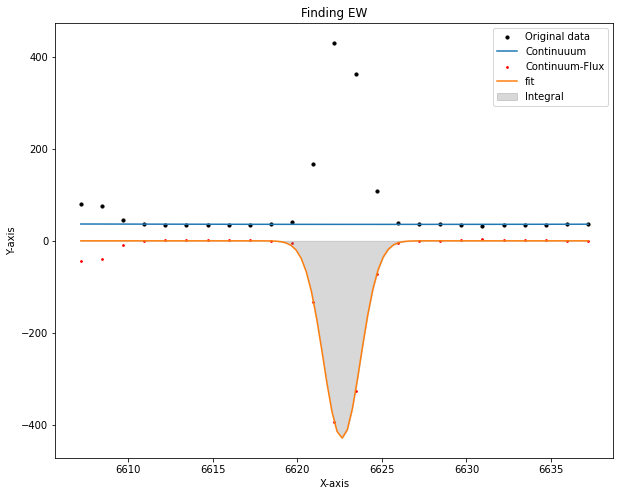

EW= -65.04713496305877  at (i,j)= 12 , 6


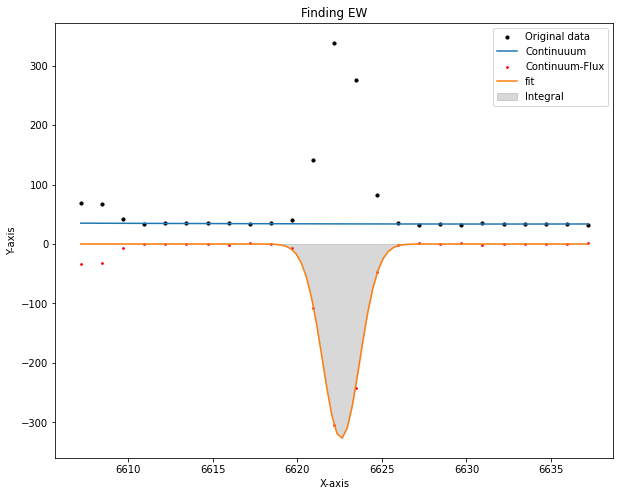

EW= -52.32472329118922  at (i,j)= 12 , 7


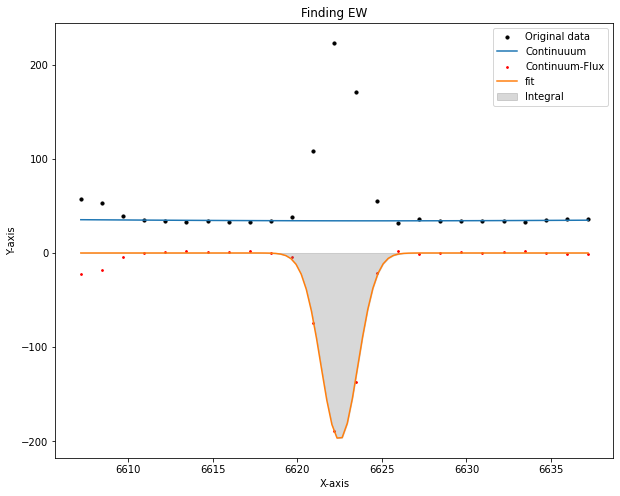

EW= -31.206173071088568  at (i,j)= 12 , 8


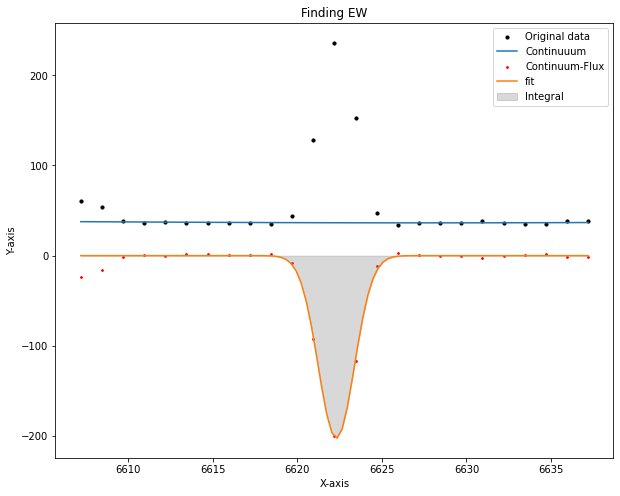

EW= -29.408793264750276  at (i,j)= 12 , 9


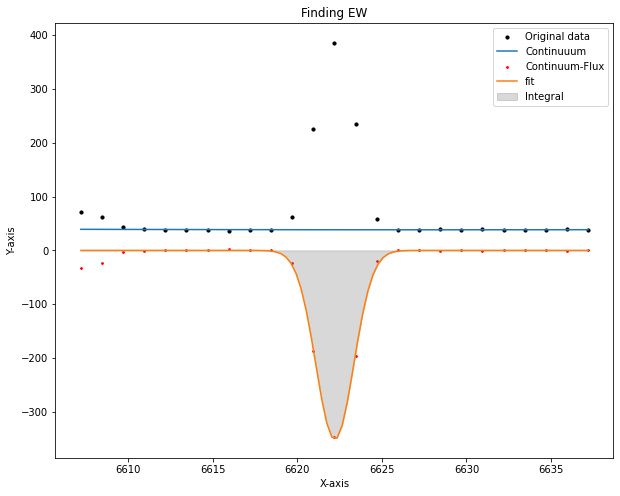

EW= -50.74918014029964  at (i,j)= 12 , 10


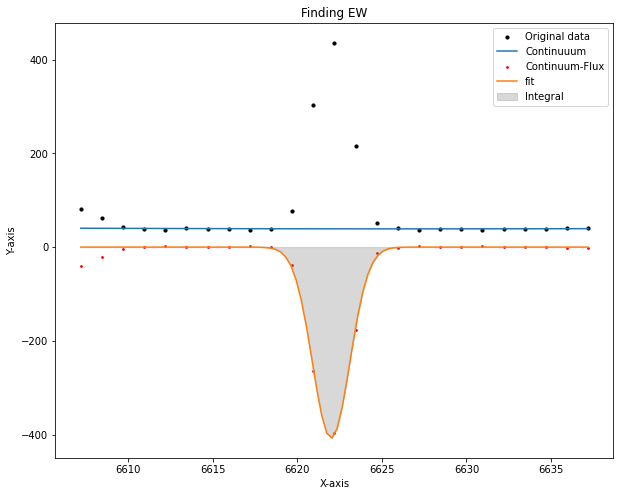

EW= -57.159129336178204  at (i,j)= 12 , 11


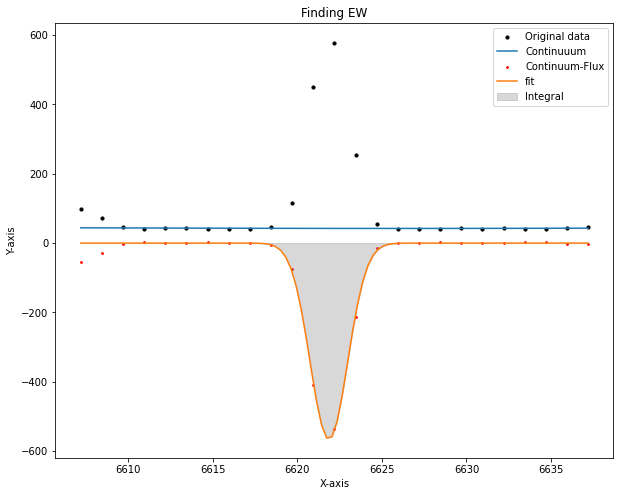

EW= -73.66787869223752  at (i,j)= 12 , 12


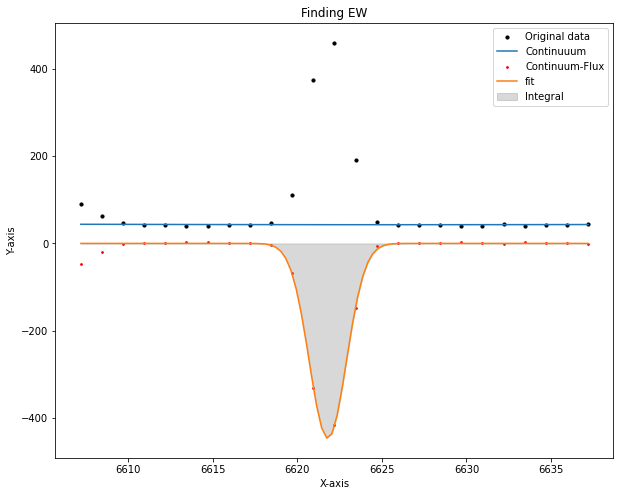

EW= -56.70167735089832  at (i,j)= 12 , 13


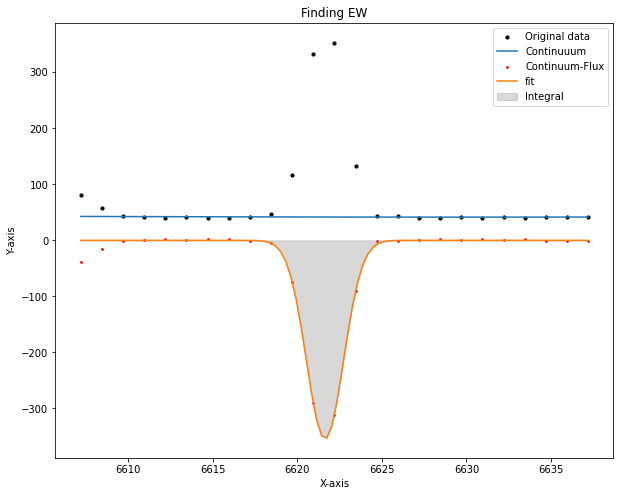

EW= -46.28020814975985  at (i,j)= 12 , 14


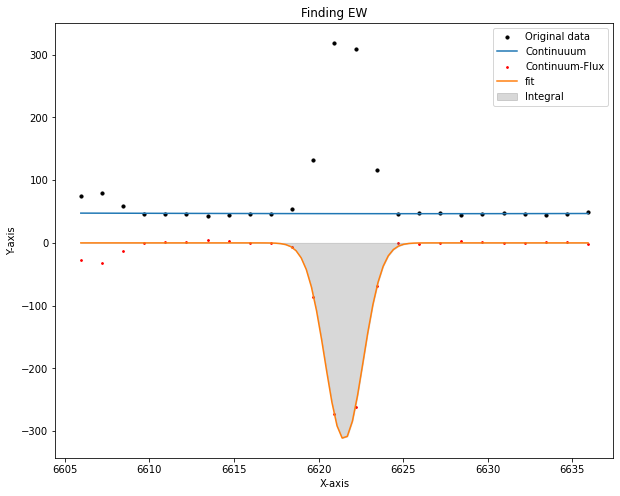

EW= -37.291912478381185  at (i,j)= 12 , 15


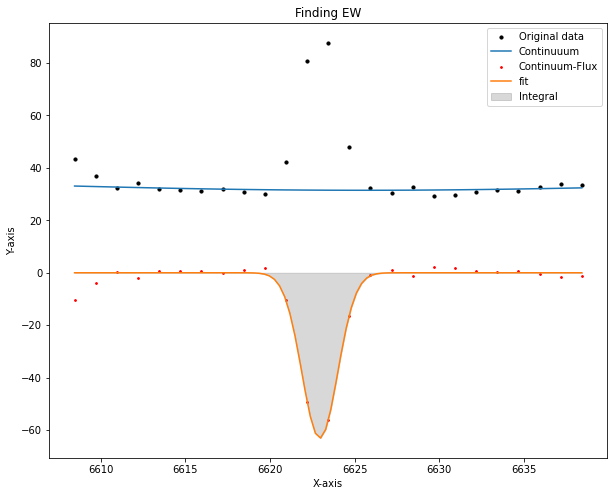

EW= -10.500687337743496  at (i,j)= 13 , 0


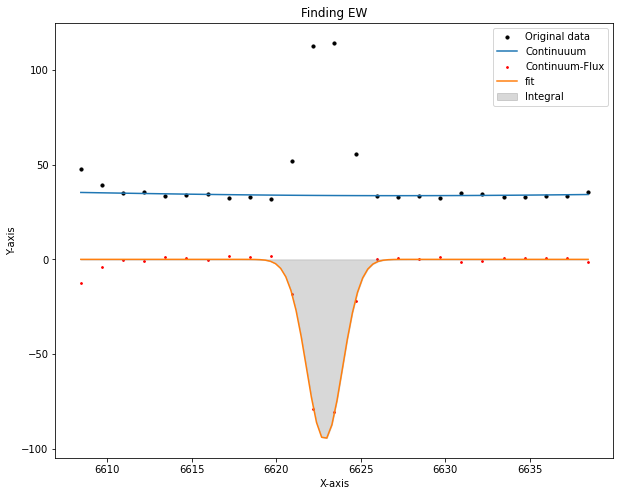

EW= -14.817345144883523  at (i,j)= 13 , 1


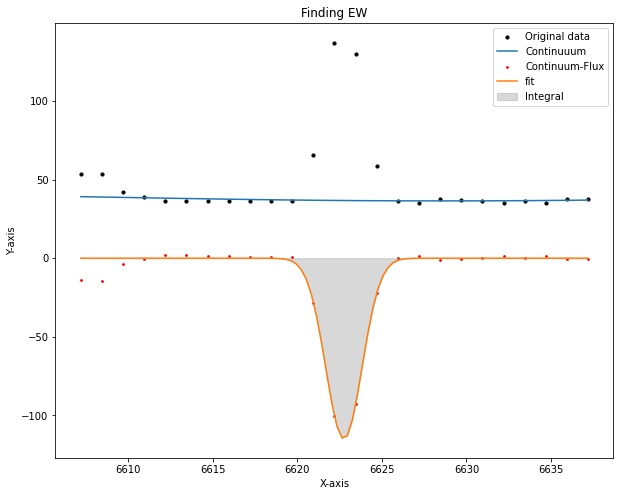

EW= -16.65672593164349  at (i,j)= 13 , 2


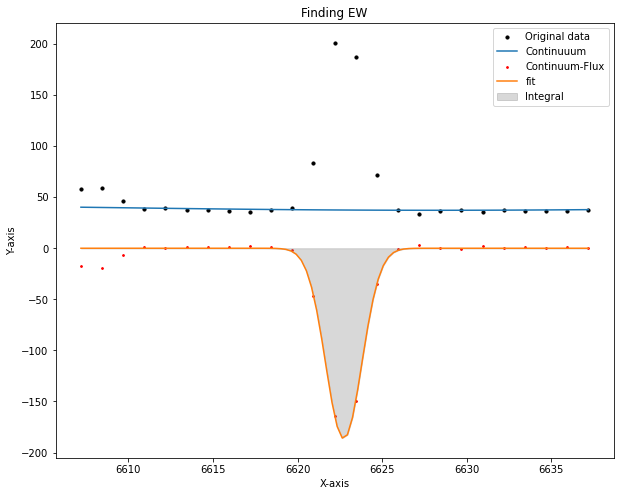

EW= -26.42773731788077  at (i,j)= 13 , 3


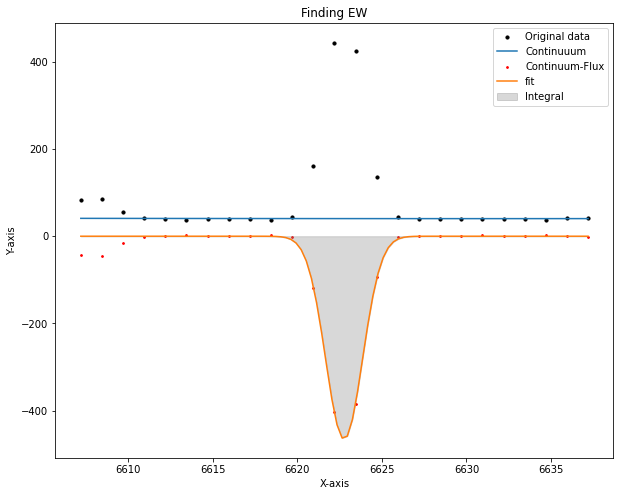

EW= -62.29495743535999  at (i,j)= 13 , 4


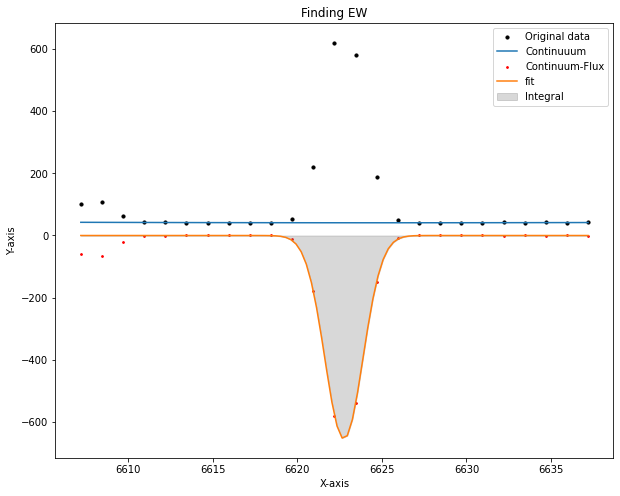

EW= -89.0231605242103  at (i,j)= 13 , 5


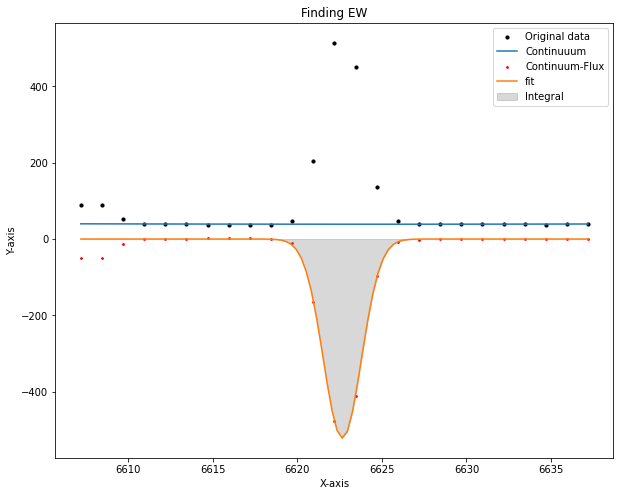

EW= -74.73977697894794  at (i,j)= 13 , 6


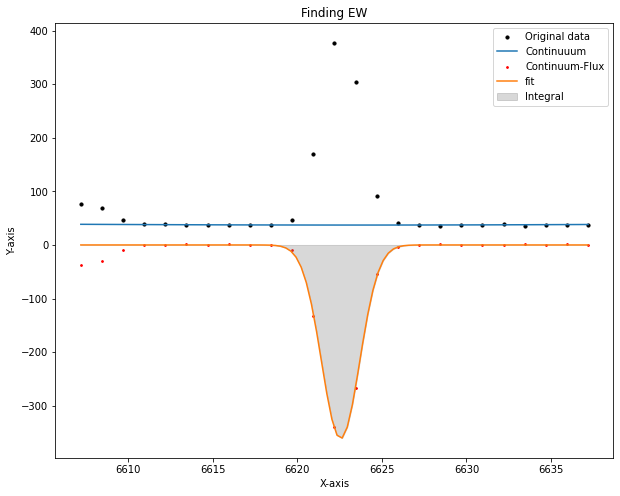

EW= -54.149324889523825  at (i,j)= 13 , 7


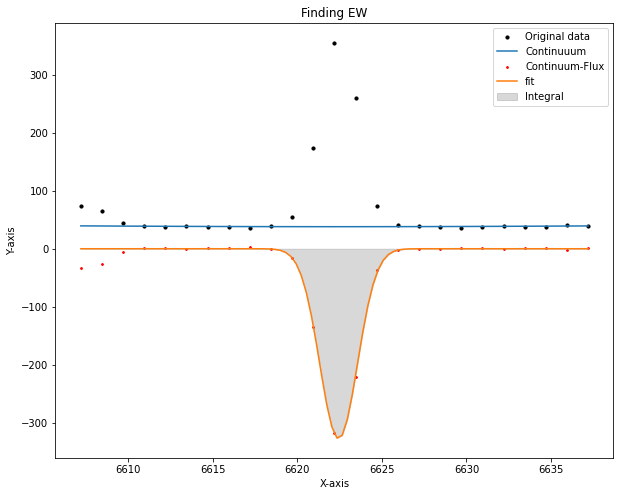

EW= -47.688638777412905  at (i,j)= 13 , 8


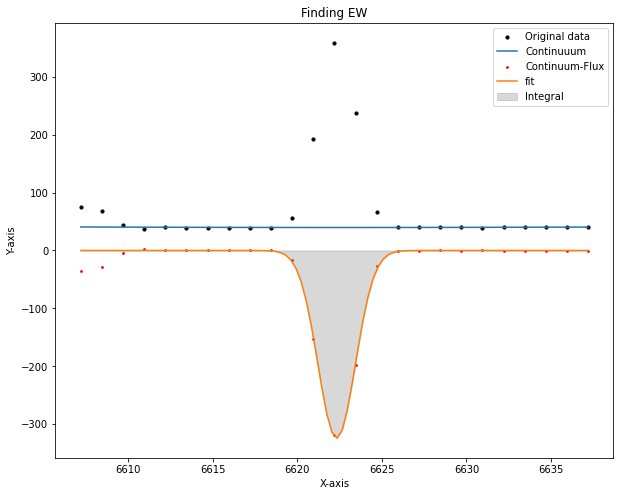

EW= -44.961839814474494  at (i,j)= 13 , 9


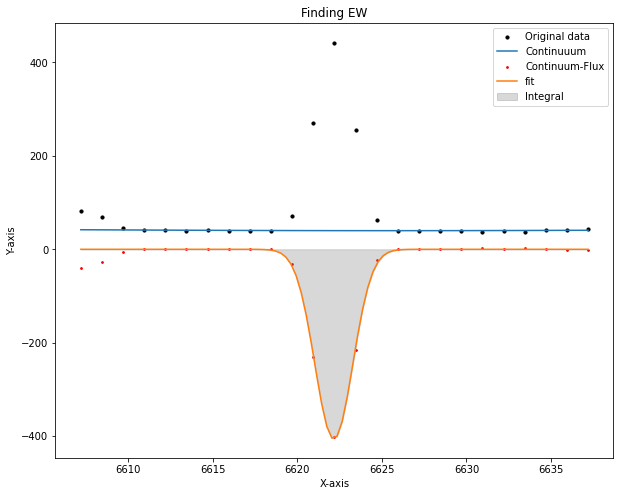

EW= -56.667736815030125  at (i,j)= 13 , 10


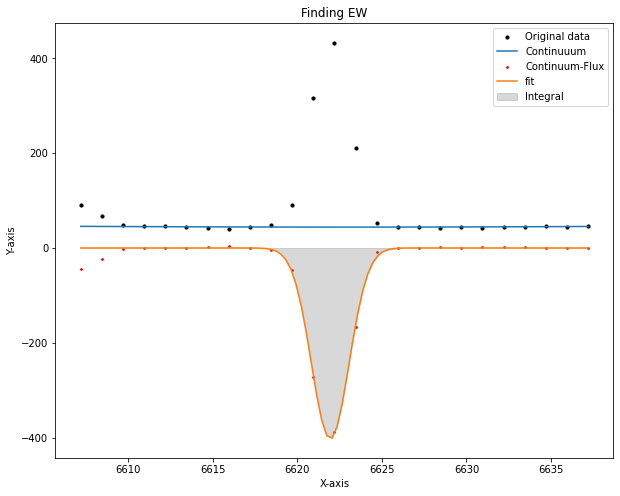

EW= -50.41644071504881  at (i,j)= 13 , 11


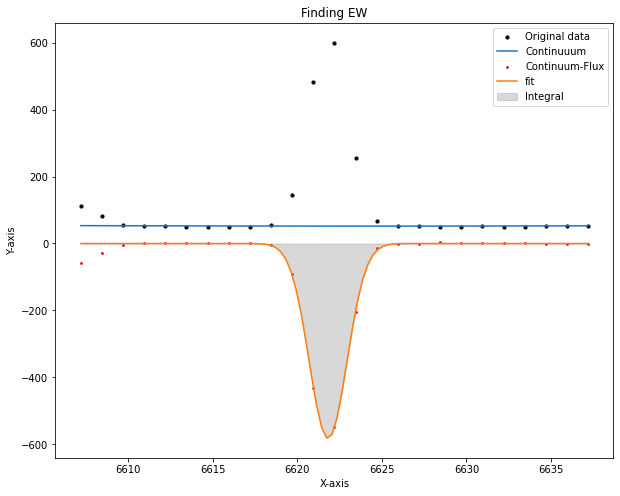

EW= -61.936913965930714  at (i,j)= 13 , 12


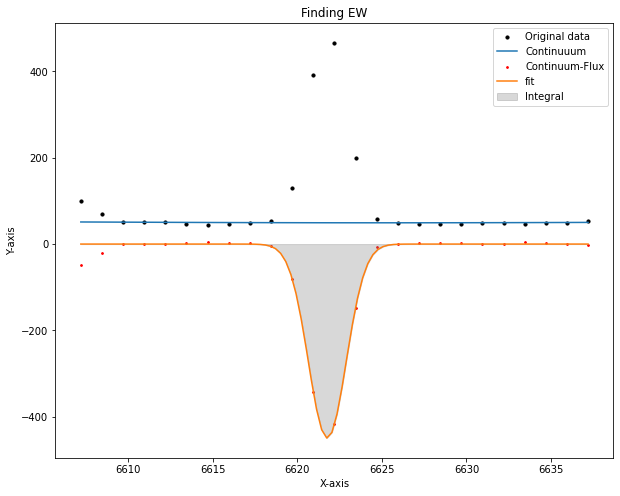

EW= -50.593714600910744  at (i,j)= 13 , 13


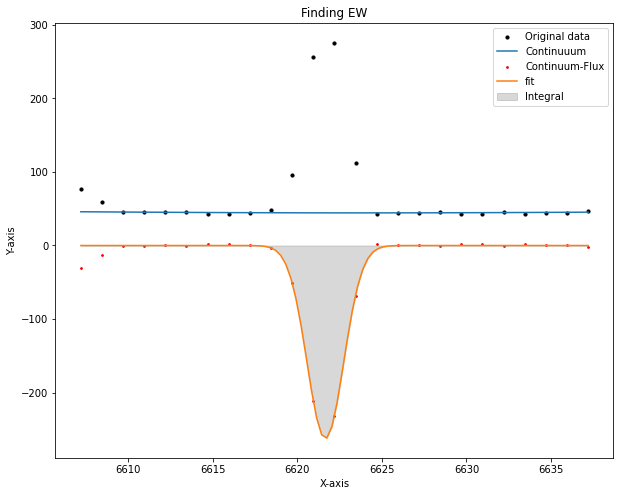

EW= -31.772474734185696  at (i,j)= 13 , 14


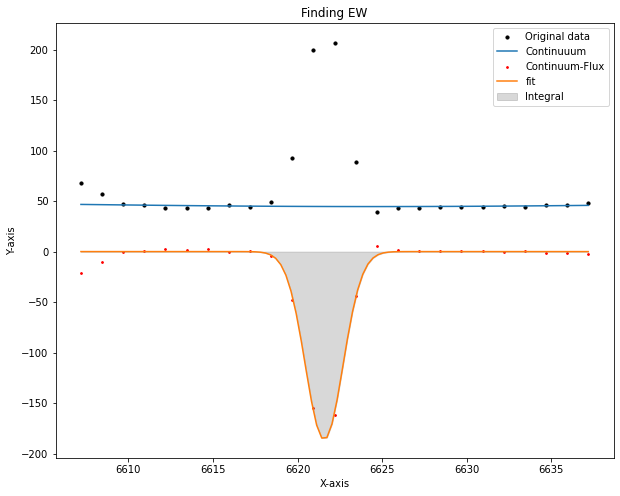

EW= -22.978433177549675  at (i,j)= 13 , 15


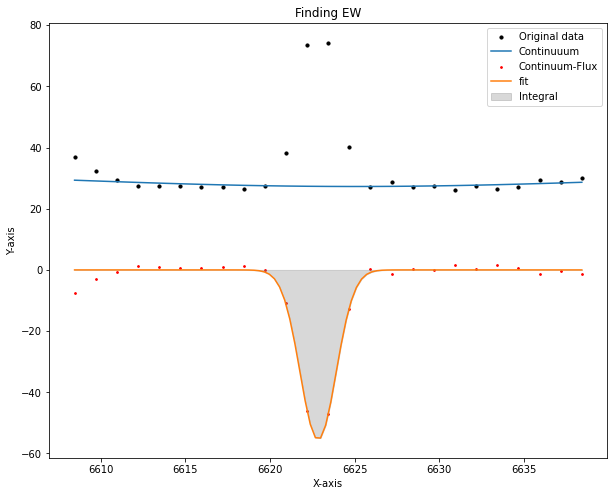

EW= -10.709803706025241  at (i,j)= 14 , 0


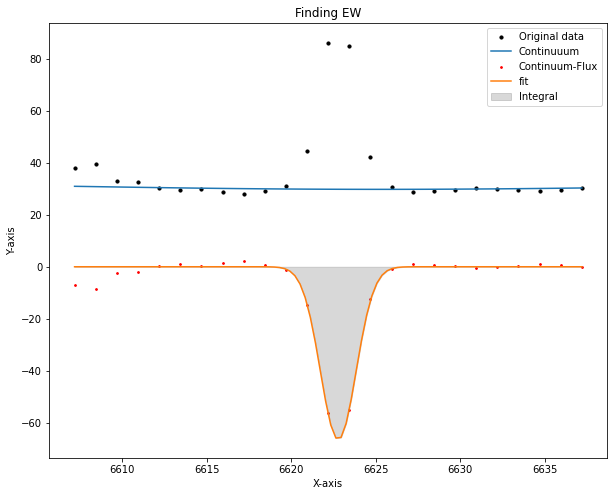

EW= -11.661219649008645  at (i,j)= 14 , 1


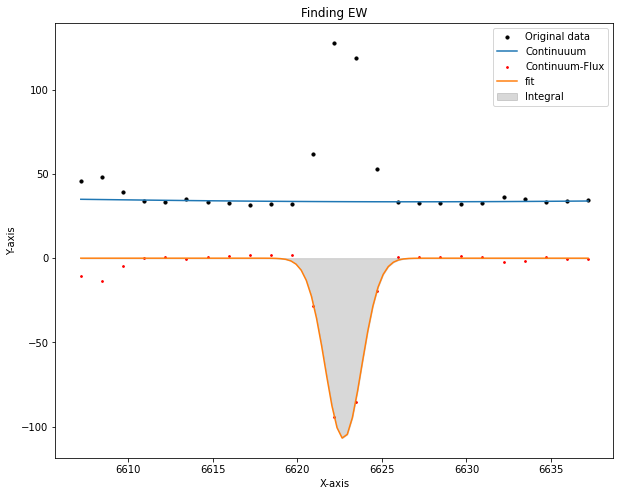

EW= -16.97292844086868  at (i,j)= 14 , 2


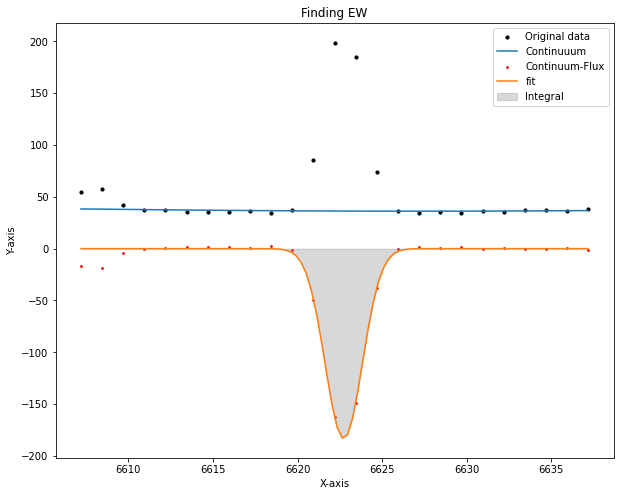

EW= -27.57940639257972  at (i,j)= 14 , 3


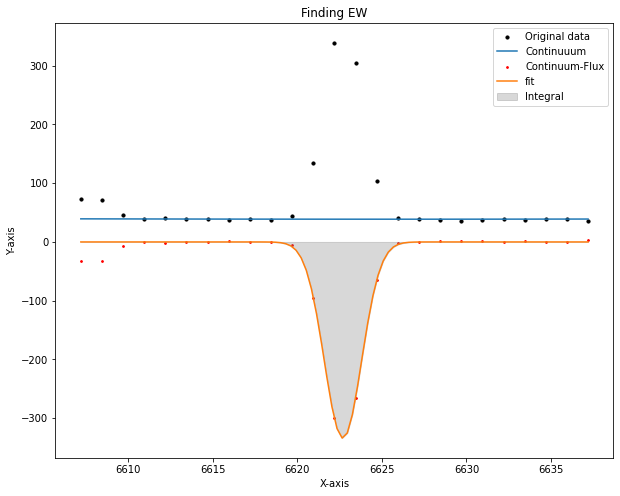

EW= -47.17253209482053  at (i,j)= 14 , 4


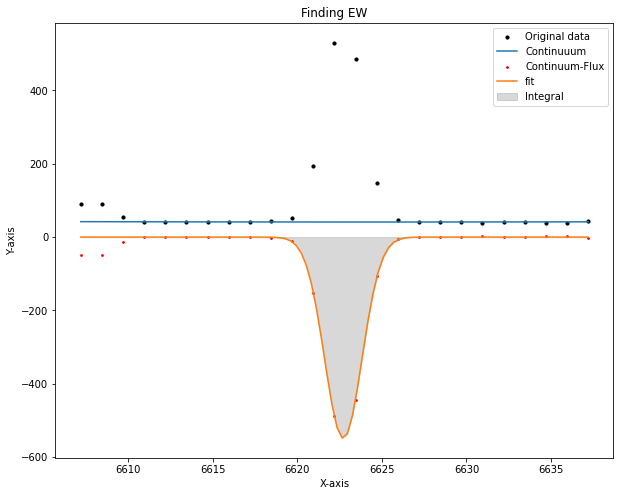

EW= -72.99642891577298  at (i,j)= 14 , 5


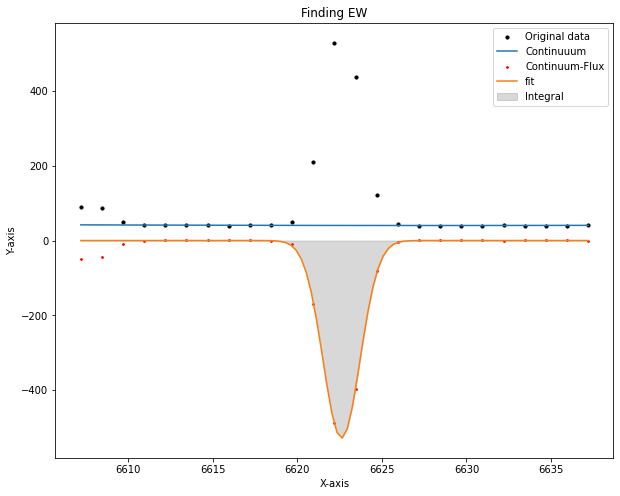

EW= -71.08932605717274  at (i,j)= 14 , 6


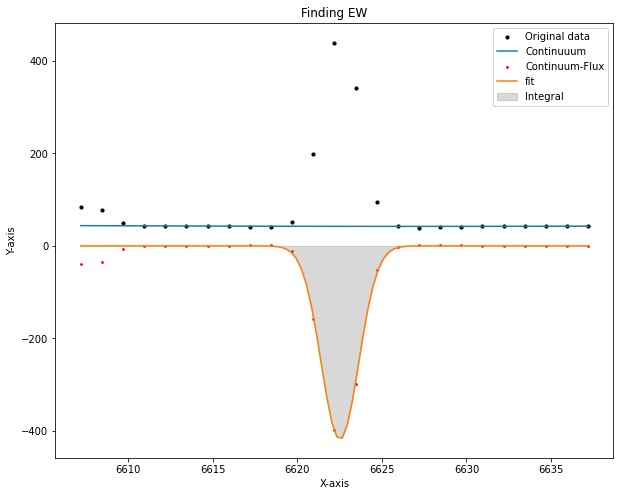

EW= -54.236419203786866  at (i,j)= 14 , 7


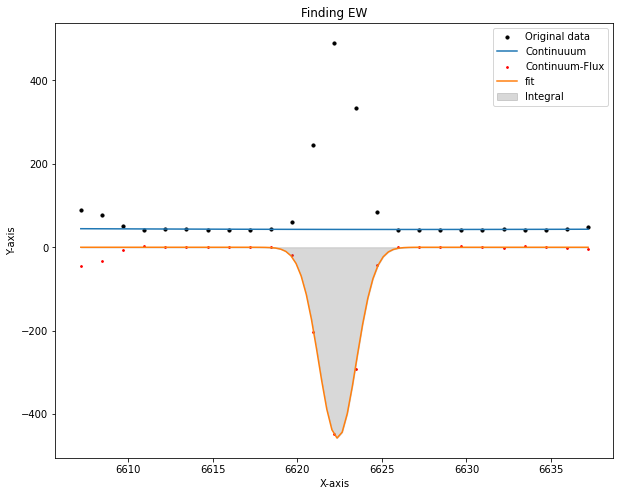

EW= -58.60432721628021  at (i,j)= 14 , 8


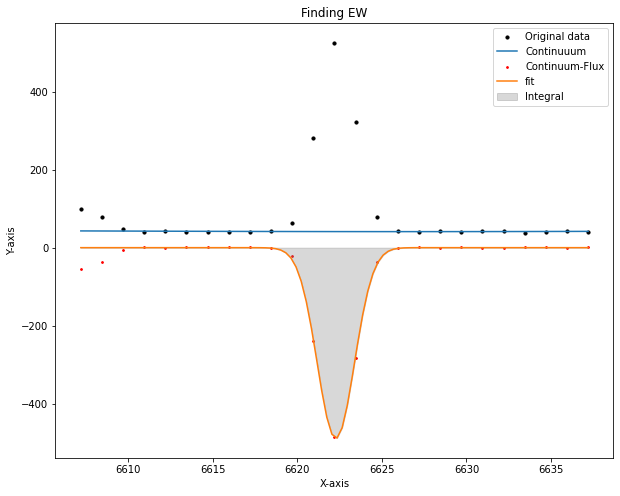

EW= -64.78815165290672  at (i,j)= 14 , 9


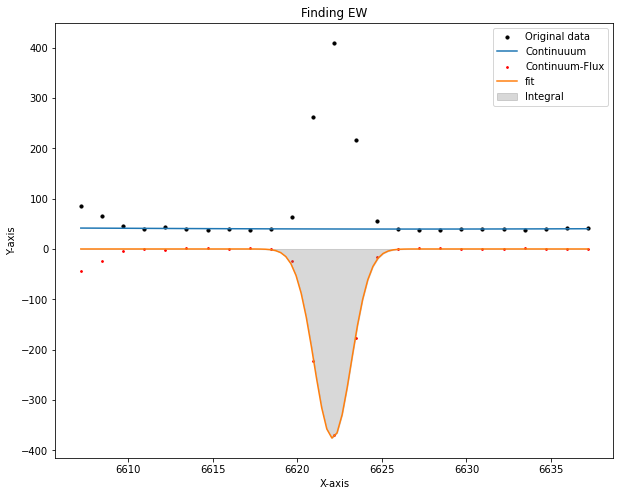

EW= -51.300777162816146  at (i,j)= 14 , 10


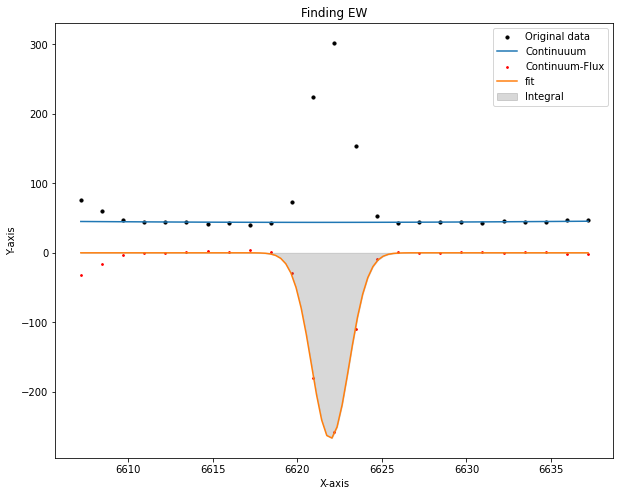

EW= -33.494848398088536  at (i,j)= 14 , 11


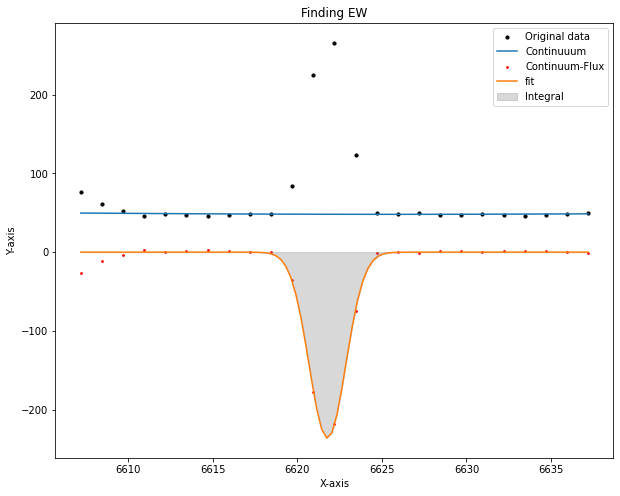

EW= -26.398658868217677  at (i,j)= 14 , 12


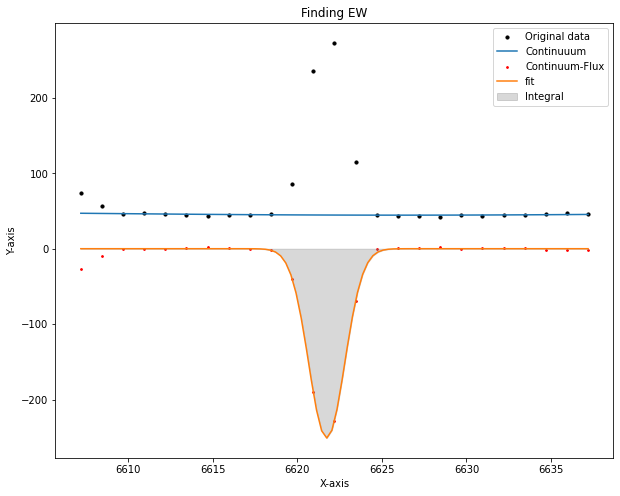

EW= -29.68126237409167  at (i,j)= 14 , 13


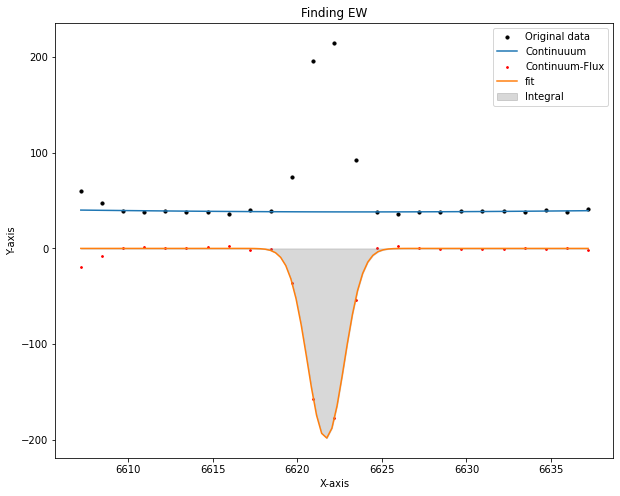

EW= -27.87667451615135  at (i,j)= 14 , 14


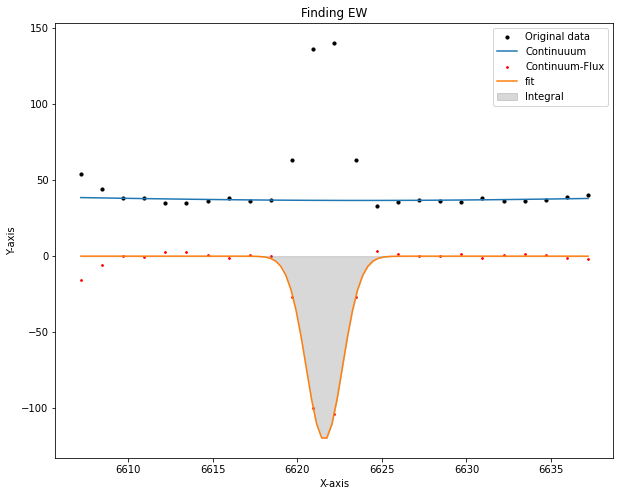

EW= -17.46087040110454  at (i,j)= 14 , 15


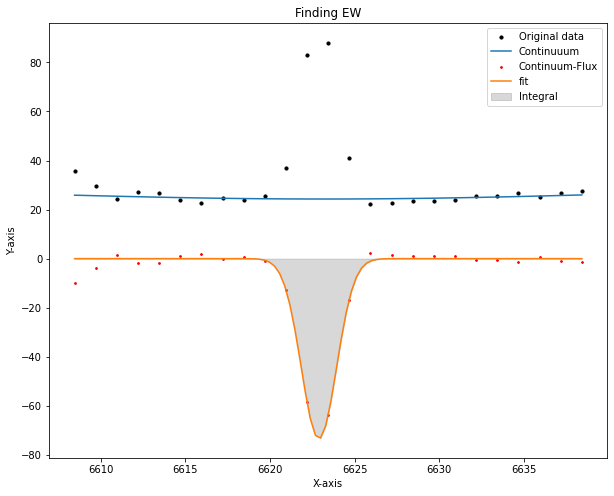

EW= -15.59535062361304  at (i,j)= 15 , 0


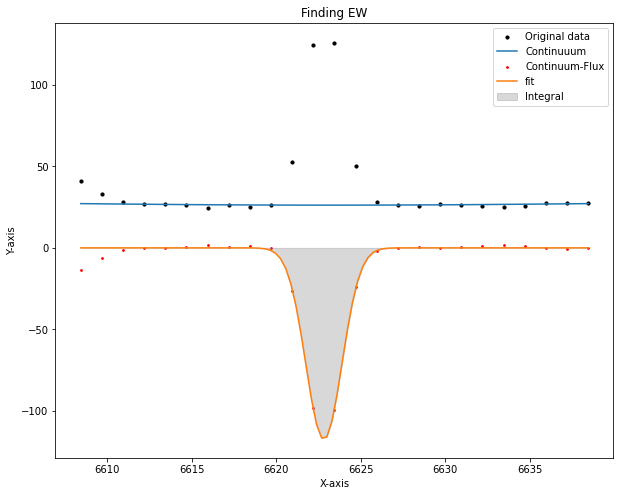

EW= -23.76797826458564  at (i,j)= 15 , 1


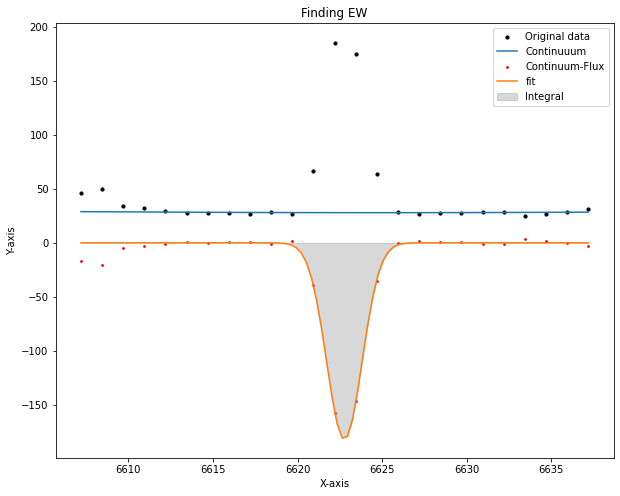

EW= -33.894164731805624  at (i,j)= 15 , 2


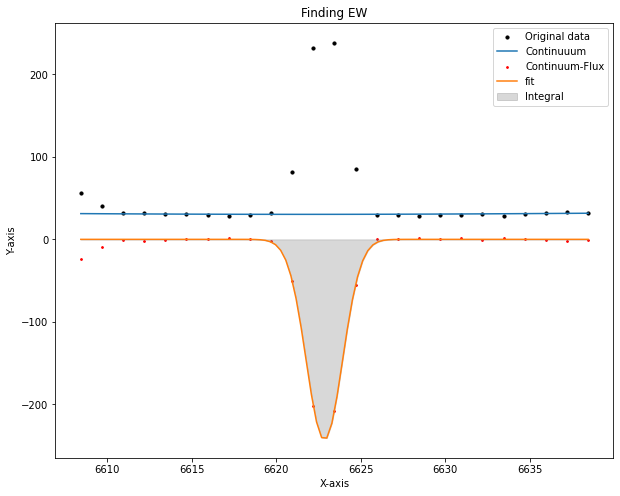

EW= -42.61074995345895  at (i,j)= 15 , 3


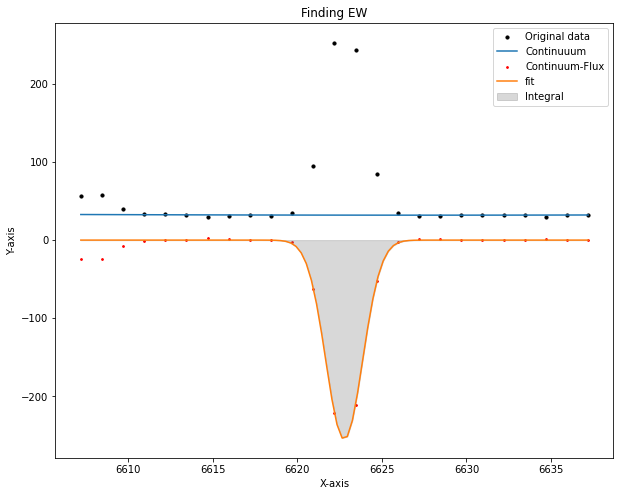

EW= -42.95646363821766  at (i,j)= 15 , 4


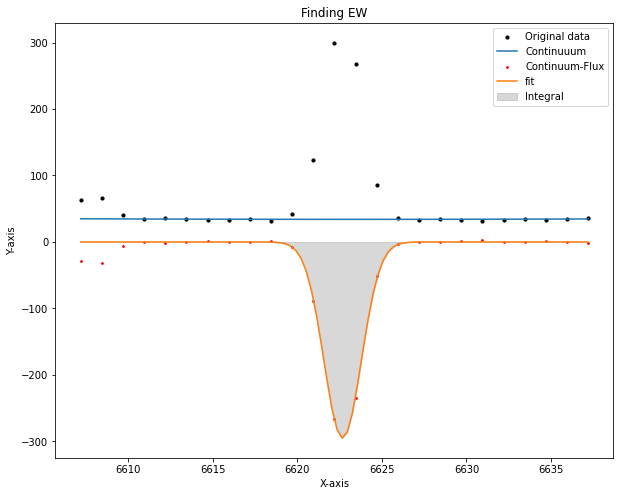

EW= -47.49620604677048  at (i,j)= 15 , 5


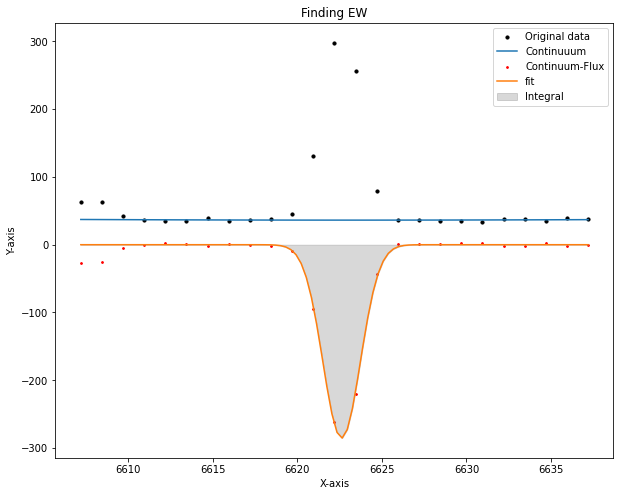

EW= -43.245213608557776  at (i,j)= 15 , 6


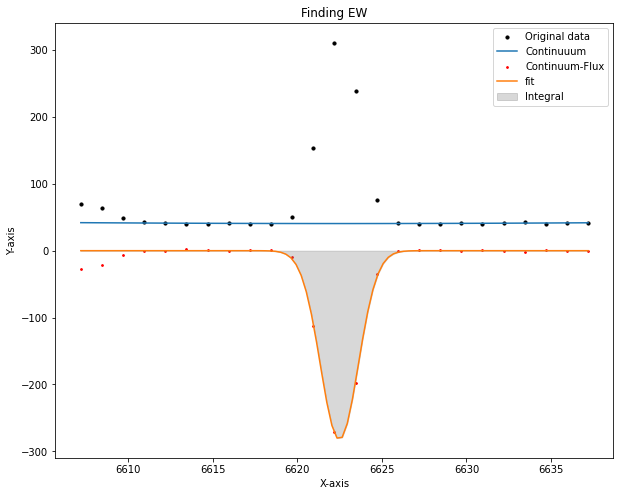

EW= -38.62070753411851  at (i,j)= 15 , 7


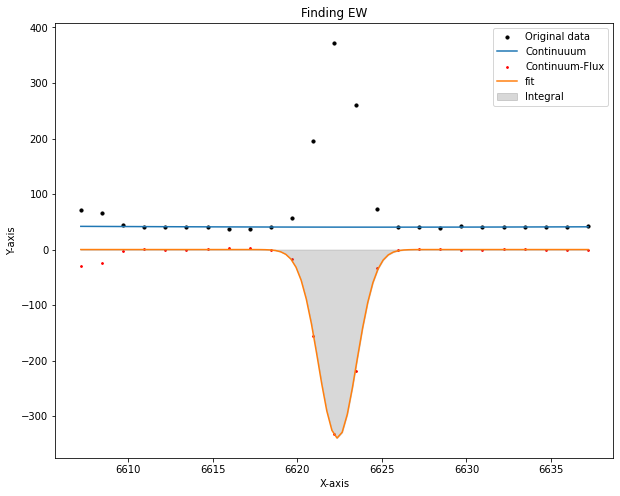

EW= -46.97010696526304  at (i,j)= 15 , 8


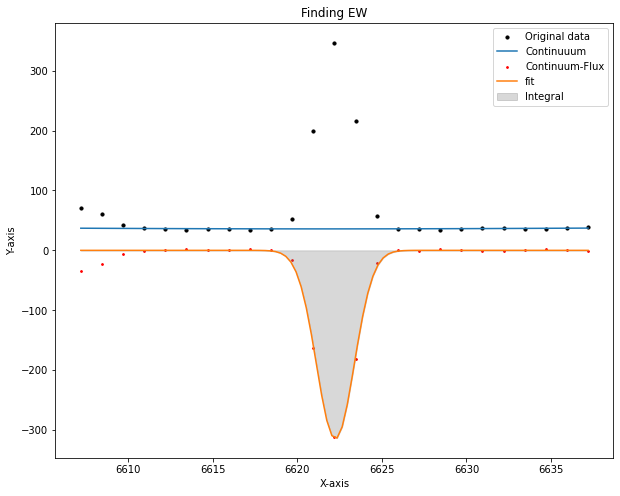

EW= -48.59723222427462  at (i,j)= 15 , 9


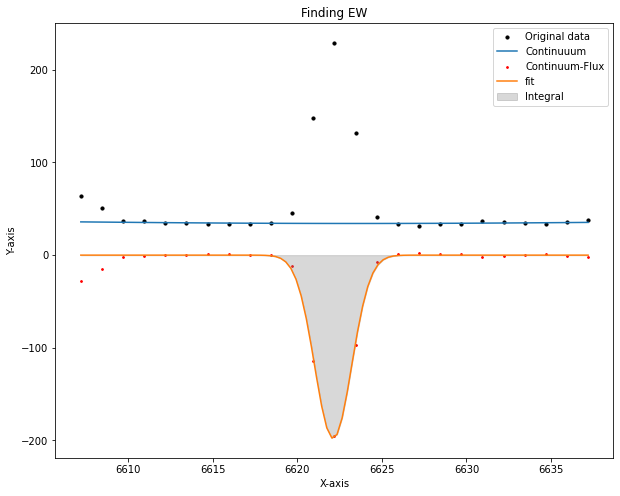

EW= -31.325215897770775  at (i,j)= 15 , 10


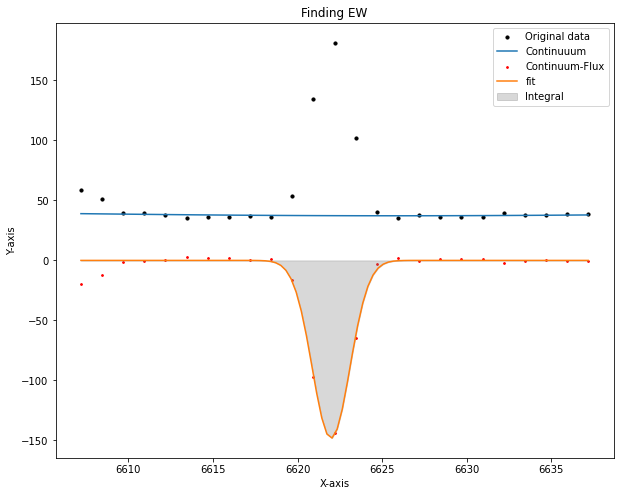

EW= -21.913500943951313  at (i,j)= 15 , 11


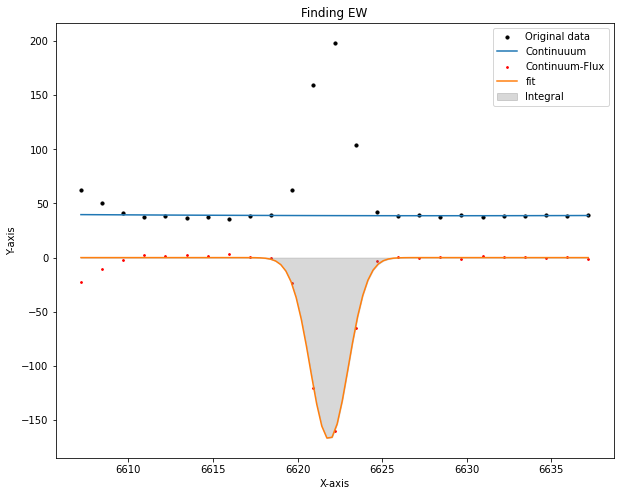

EW= -24.097121366404956  at (i,j)= 15 , 12


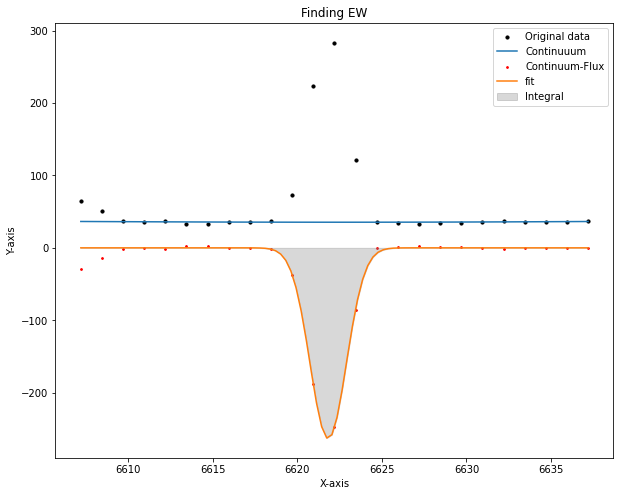

EW= -39.70075926114612  at (i,j)= 15 , 13


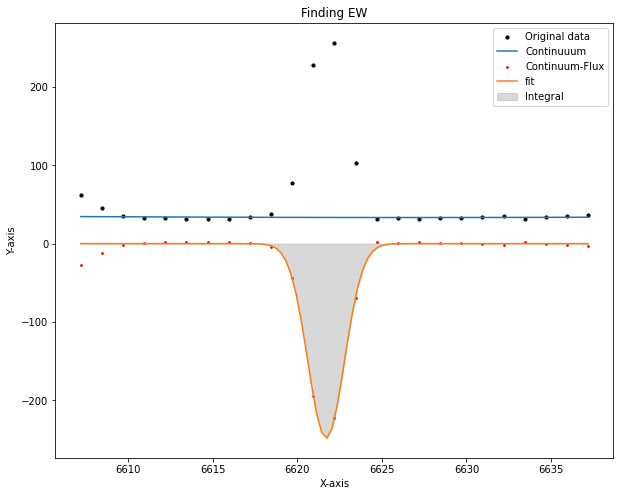

EW= -39.890528113590584  at (i,j)= 15 , 14


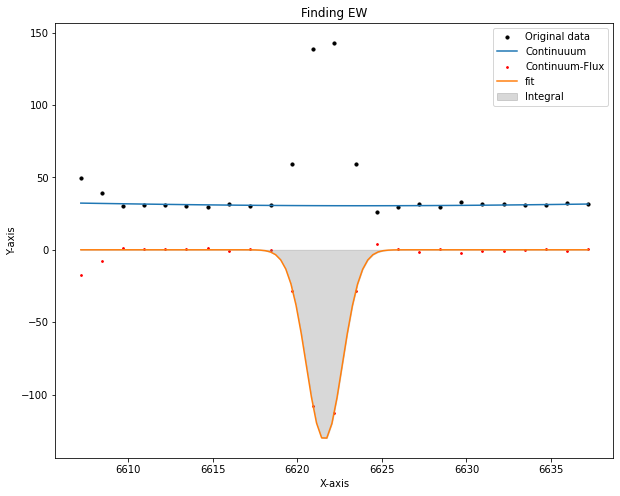

EW= -22.743151713360863  at (i,j)= 15 , 15


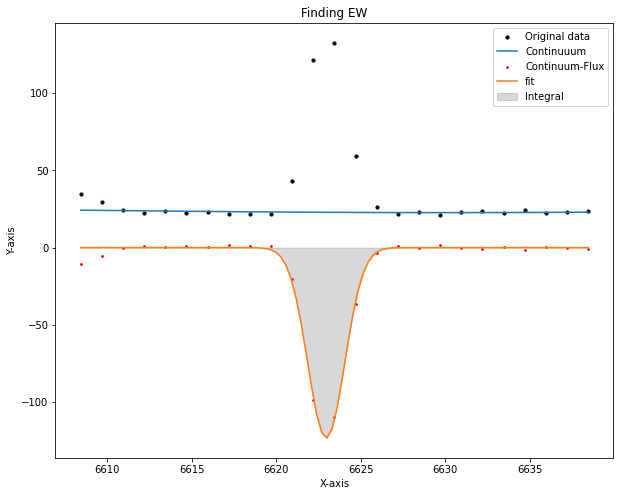

EW= -29.29677822938398  at (i,j)= 16 , 0


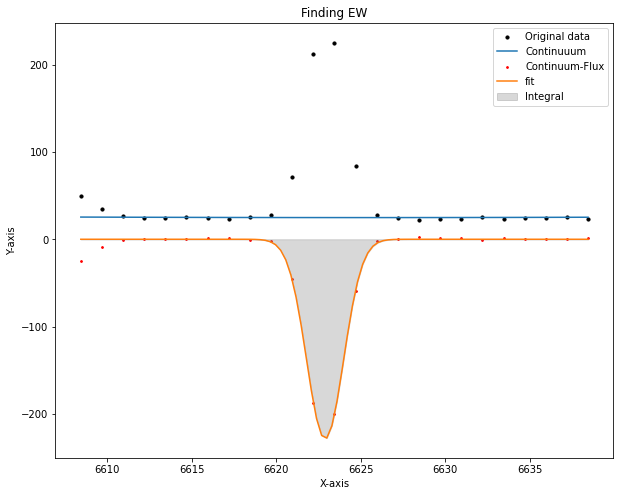

EW= -49.83546692220271  at (i,j)= 16 , 1


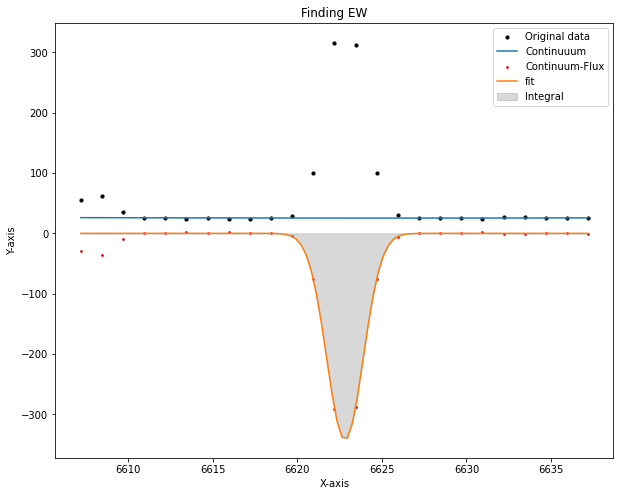

EW= -72.10270025532604  at (i,j)= 16 , 2


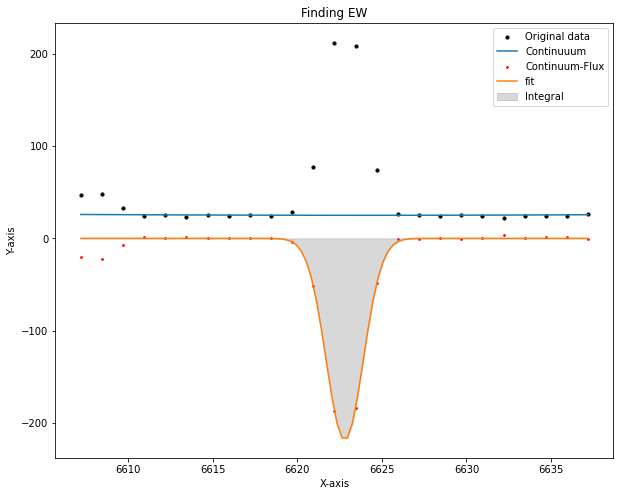

EW= -47.35590195485397  at (i,j)= 16 , 3


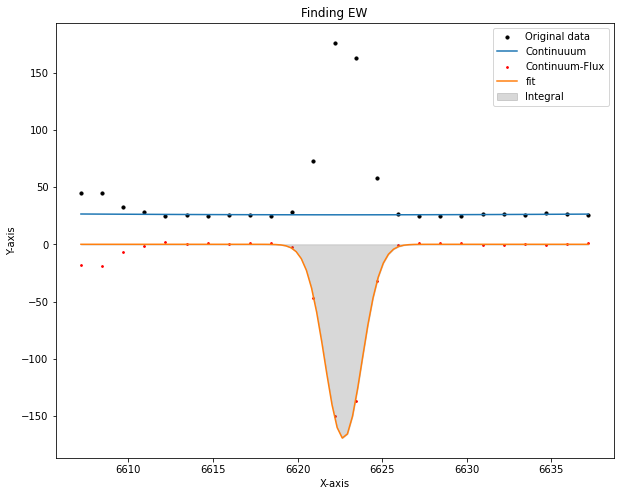

EW= -35.66929524733491  at (i,j)= 16 , 4


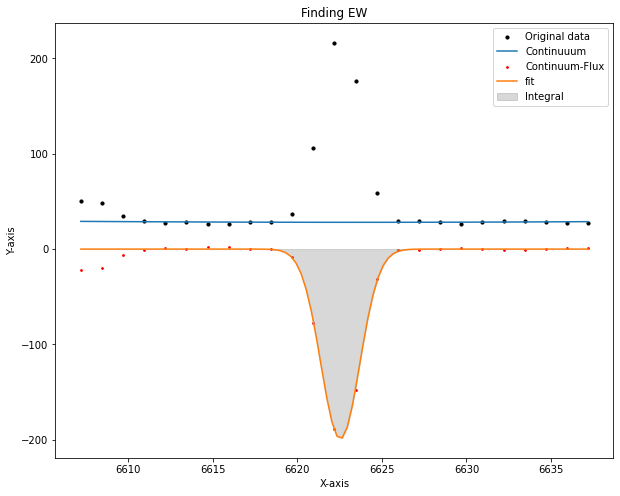

EW= -40.36644472621401  at (i,j)= 16 , 5


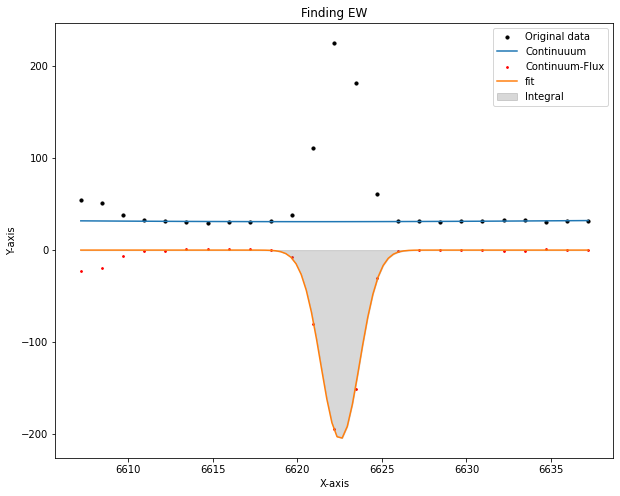

EW= -37.51584129677315  at (i,j)= 16 , 6


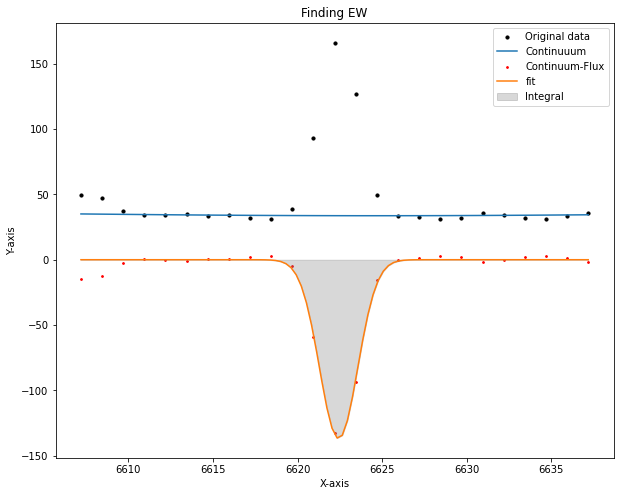

EW= -22.734483187771612  at (i,j)= 16 , 7


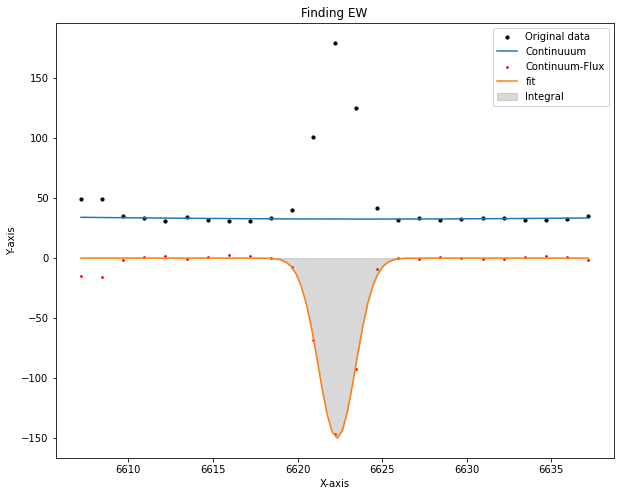

EW= -25.069863441837594  at (i,j)= 16 , 8


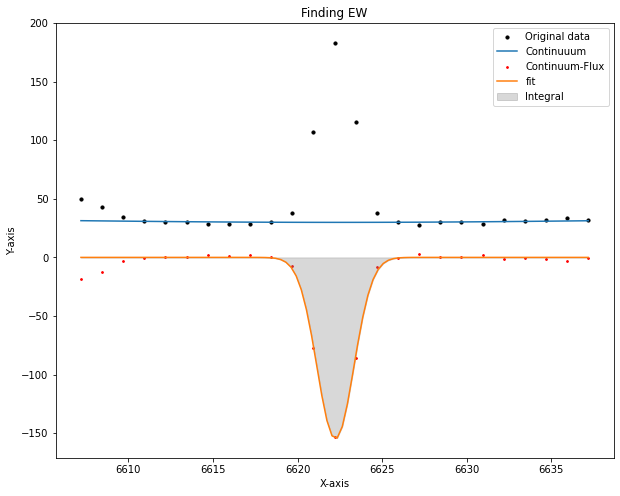

EW= -27.914895113791992  at (i,j)= 16 , 9


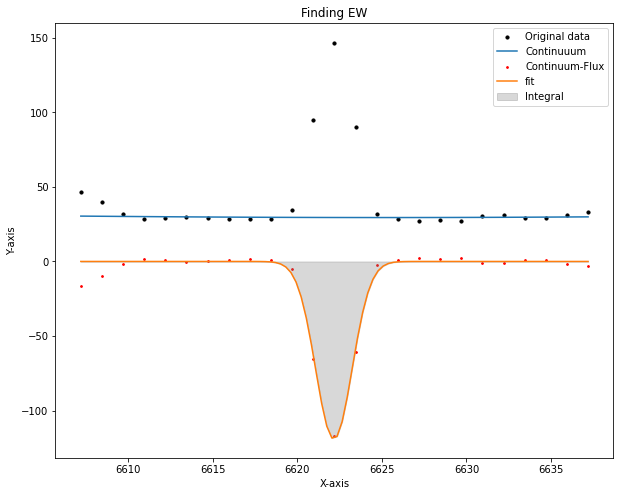

EW= -21.608568168729427  at (i,j)= 16 , 10


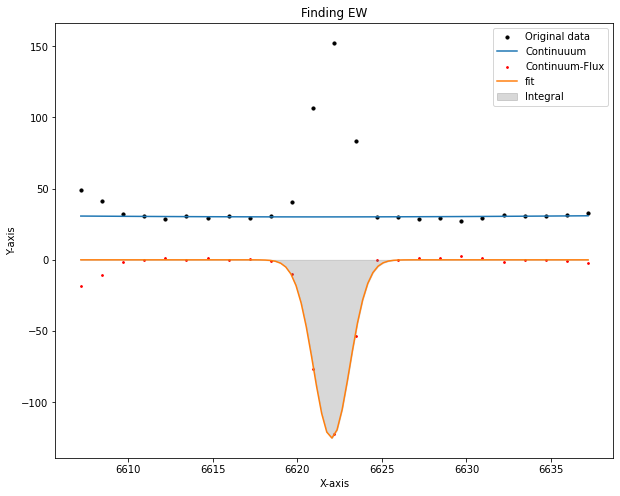

EW= -21.9616973660562  at (i,j)= 16 , 11


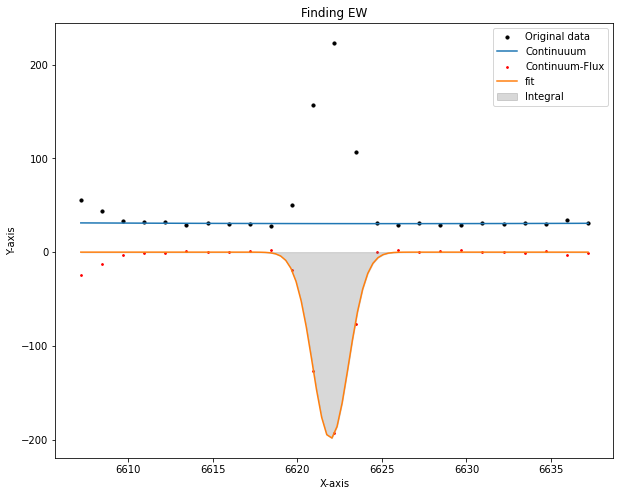

EW= -34.34753459226071  at (i,j)= 16 , 12


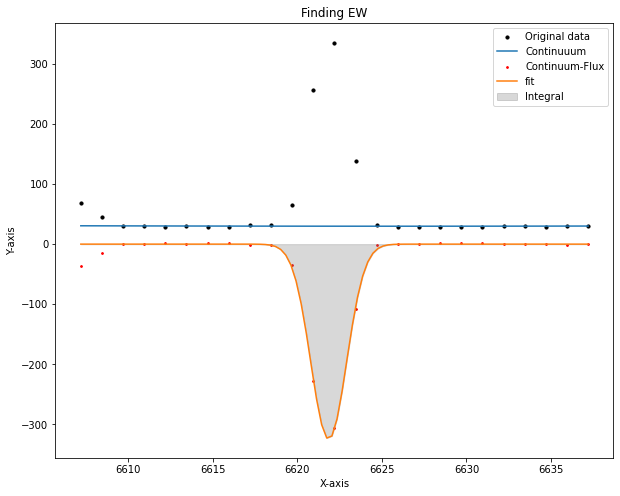

EW= -57.04736934557415  at (i,j)= 16 , 13


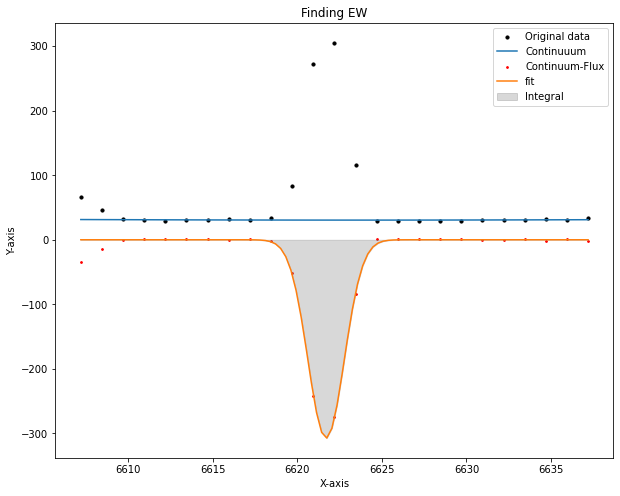

EW= -53.74040817154764  at (i,j)= 16 , 14


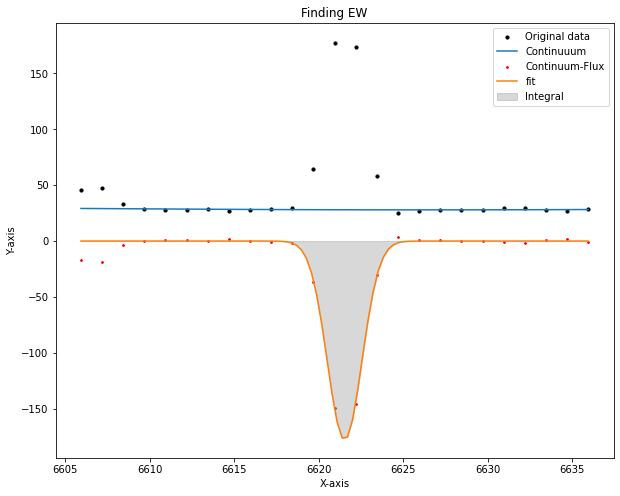

EW= -32.251802230826215  at (i,j)= 16 , 15


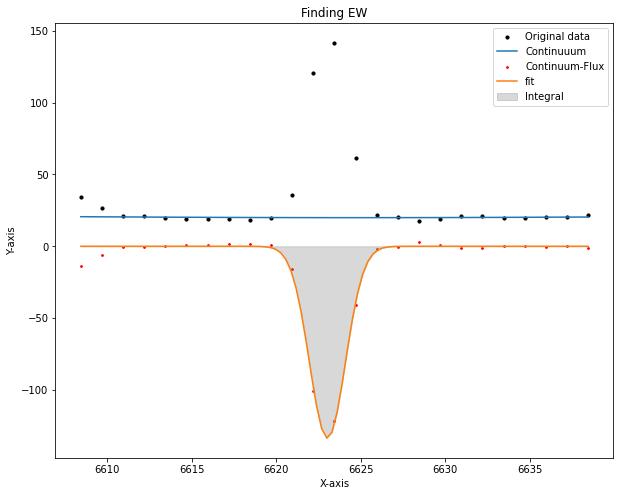

EW= -35.36580637874833  at (i,j)= 17 , 0


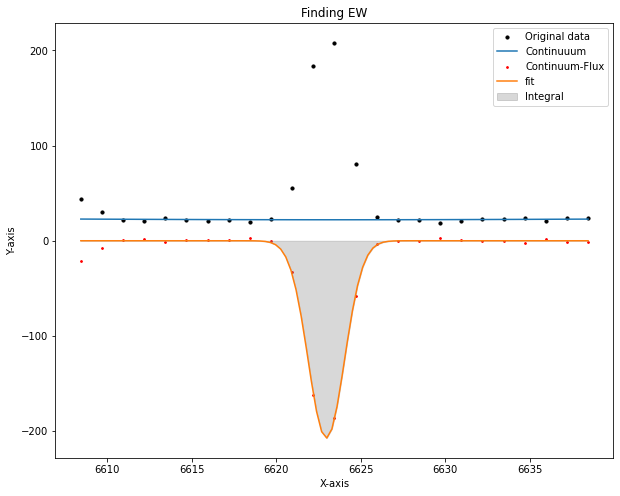

EW= -50.04380039227793  at (i,j)= 17 , 1


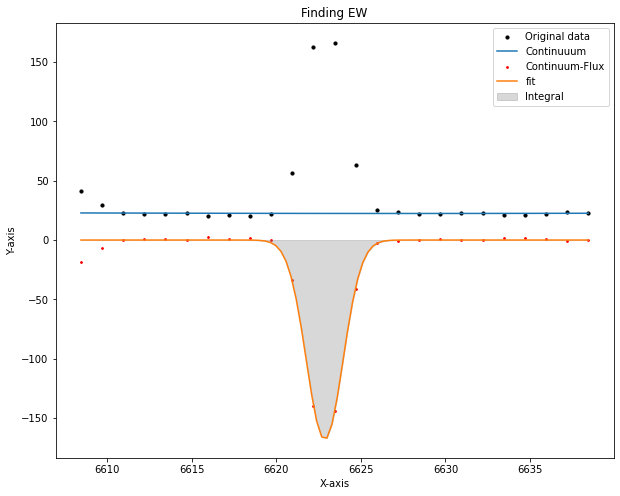

EW= -40.171953417416475  at (i,j)= 17 , 2


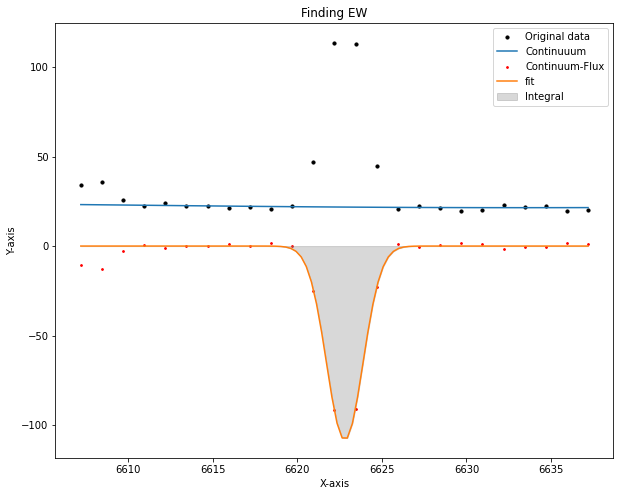

EW= -26.49555216794112  at (i,j)= 17 , 3


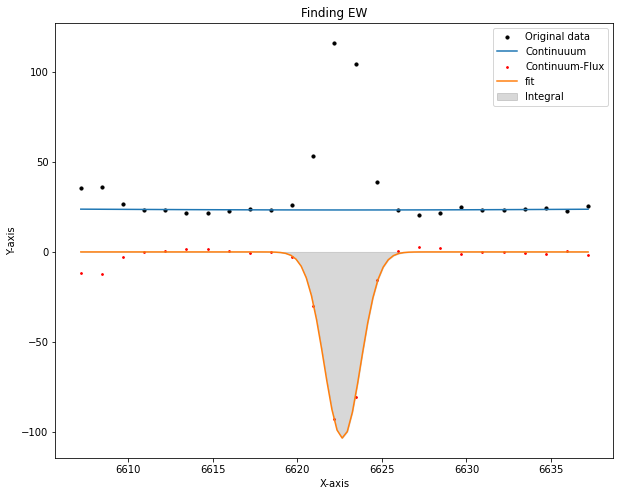

EW= -23.704926437298074  at (i,j)= 17 , 4


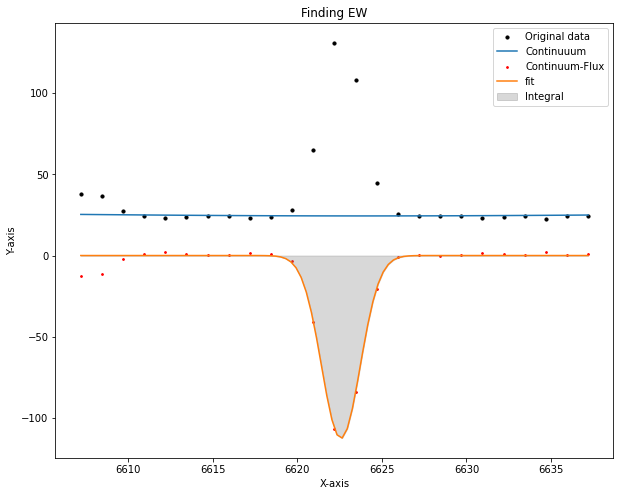

EW= -26.137652710272125  at (i,j)= 17 , 5


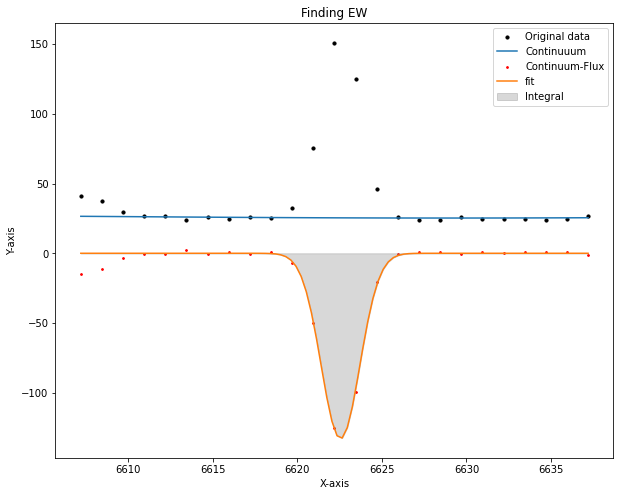

EW= -29.637733292443976  at (i,j)= 17 , 6


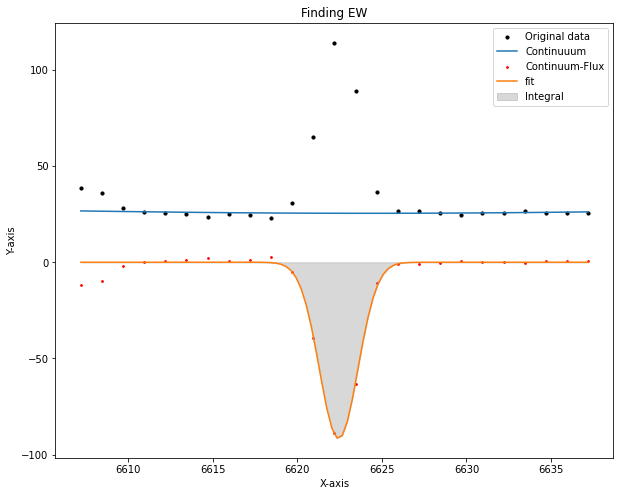

EW= -20.34139857087424  at (i,j)= 17 , 7


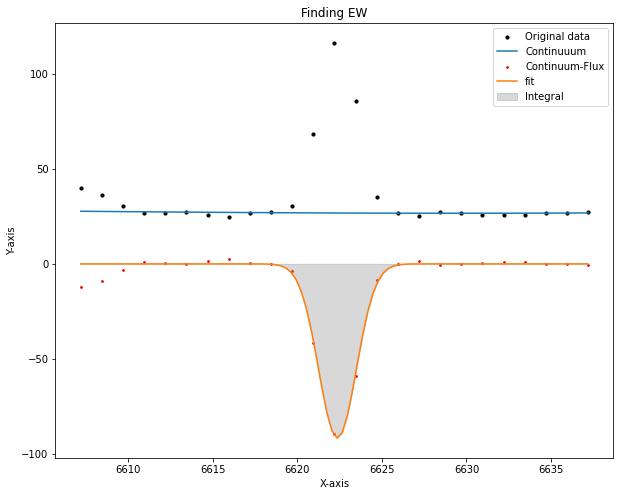

EW= -18.937685507536305  at (i,j)= 17 , 8


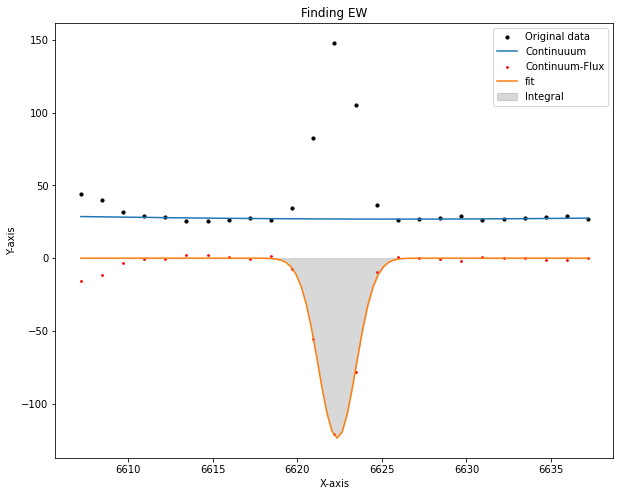

EW= -25.284050398620348  at (i,j)= 17 , 9


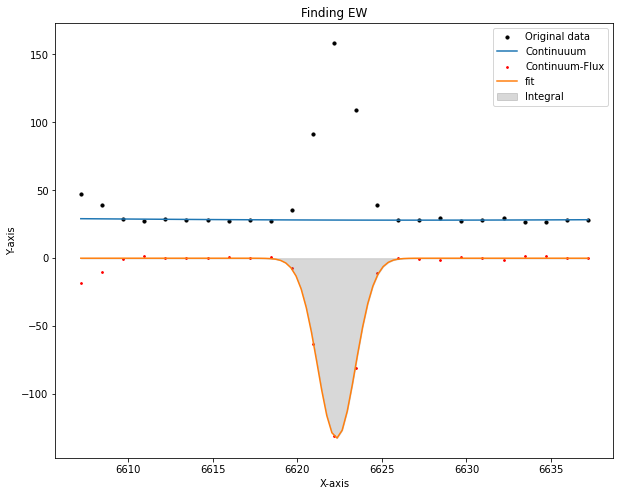

EW= -26.042581946507127  at (i,j)= 17 , 10


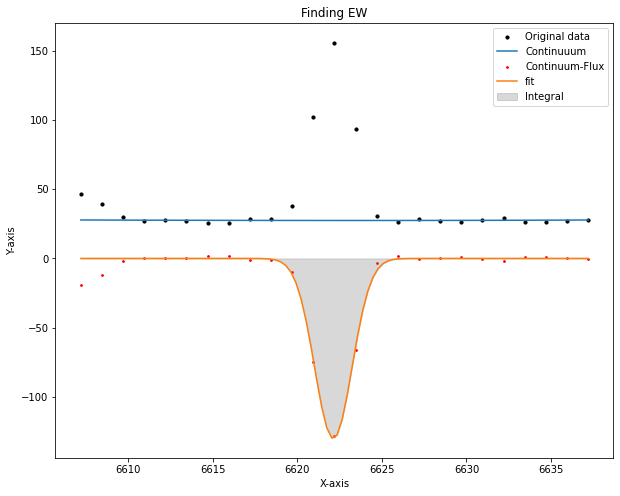

EW= -26.040266311865864  at (i,j)= 17 , 11


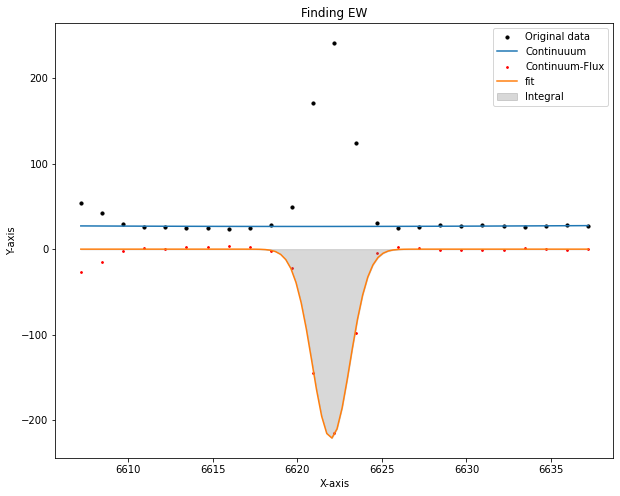

EW= -45.951928282477134  at (i,j)= 17 , 12


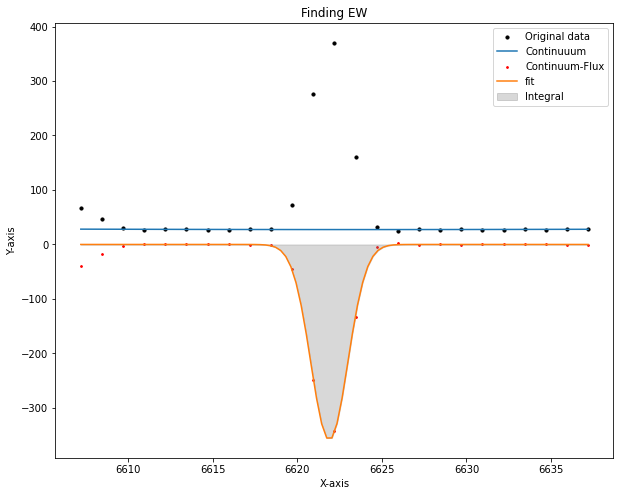

EW= -70.98025558227322  at (i,j)= 17 , 13


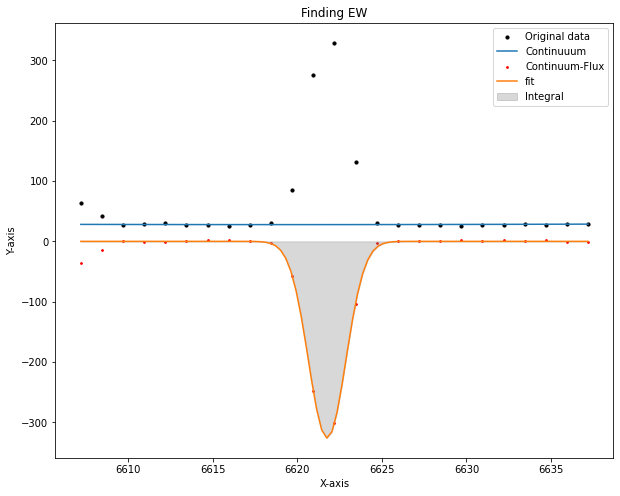

EW= -64.38621602668374  at (i,j)= 17 , 14


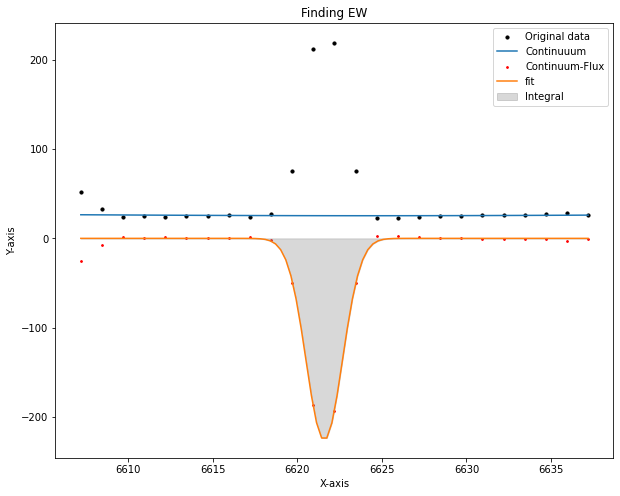

EW= -47.41372360121388  at (i,j)= 17 , 15


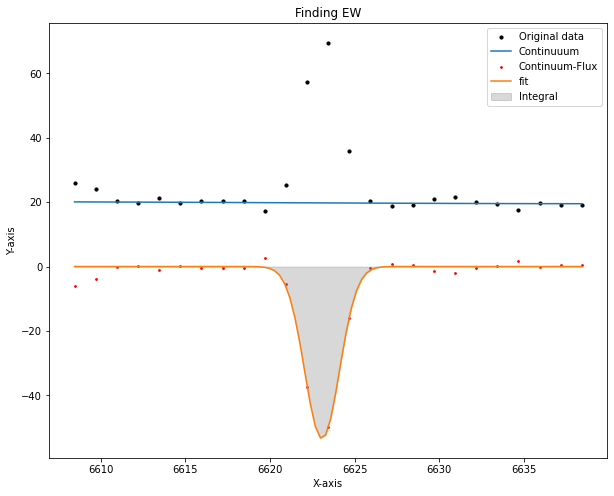

EW= -13.82812005076994  at (i,j)= 18 , 0


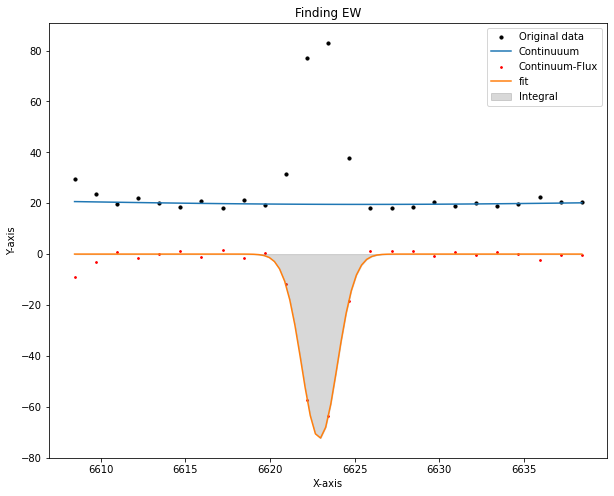

EW= -19.287407881008974  at (i,j)= 18 , 1


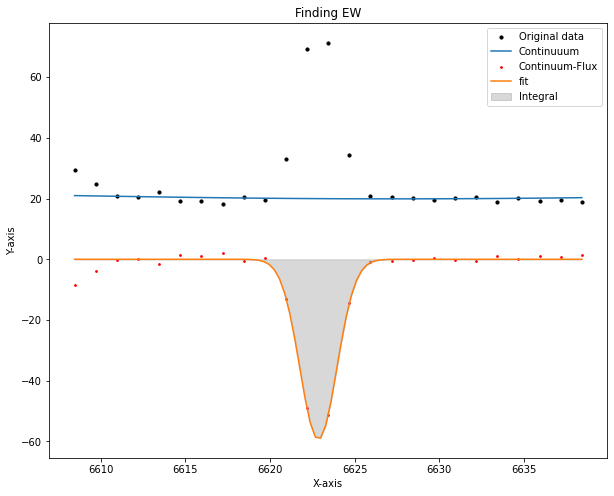

EW= -16.06223514298923  at (i,j)= 18 , 2


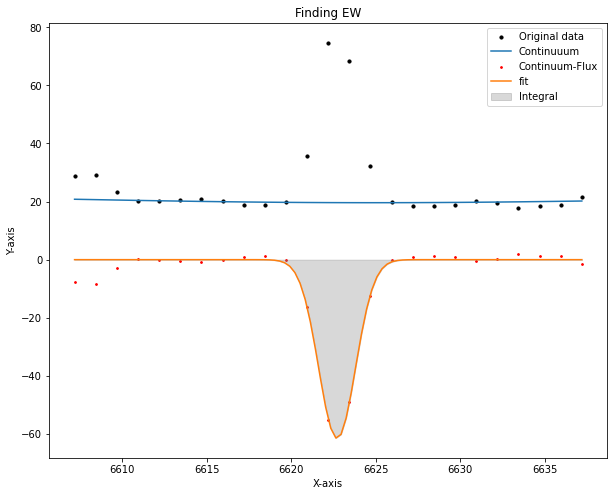

EW= -16.939228621191106  at (i,j)= 18 , 3


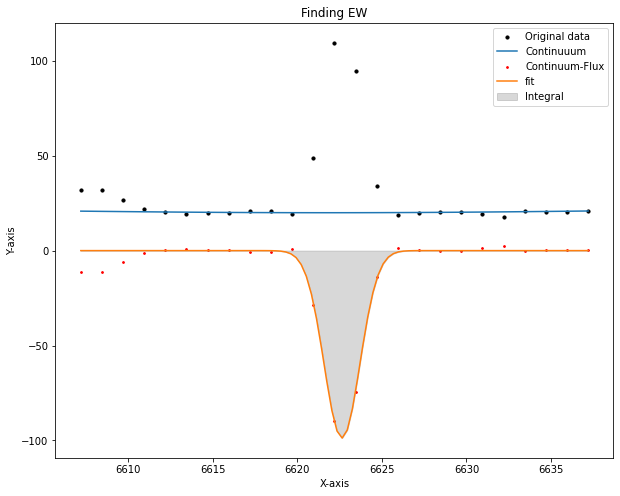

EW= -25.966606825004465  at (i,j)= 18 , 4


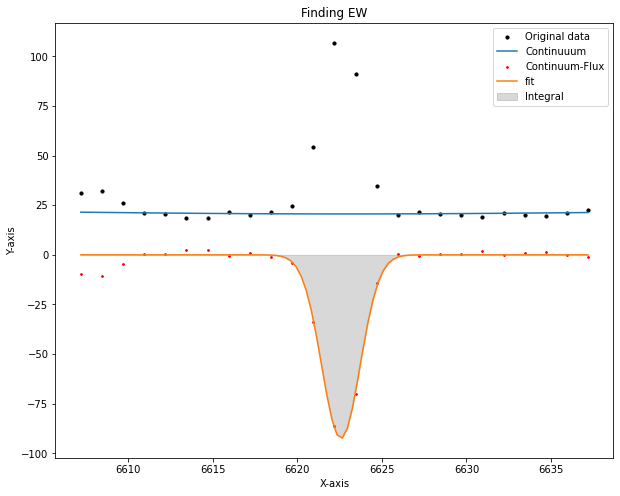

EW= -25.205921177199603  at (i,j)= 18 , 5


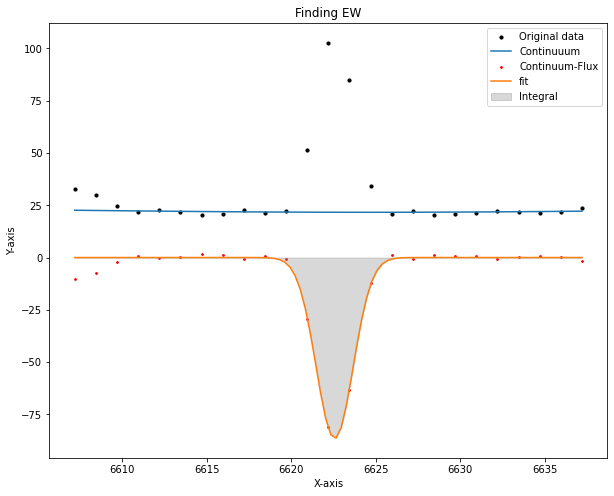

EW= -21.63330975541186  at (i,j)= 18 , 6


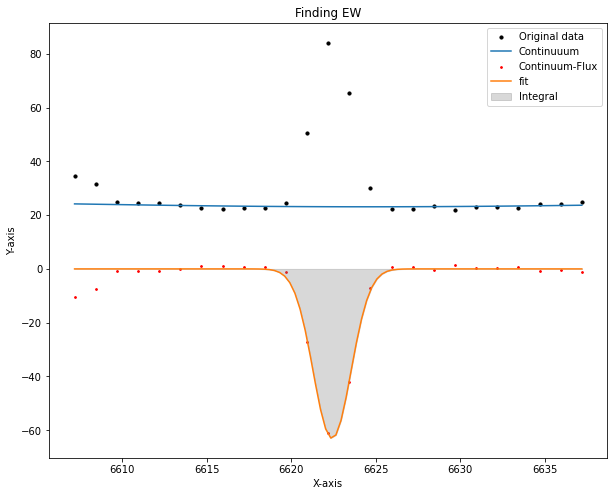

EW= -15.097971591657528  at (i,j)= 18 , 7


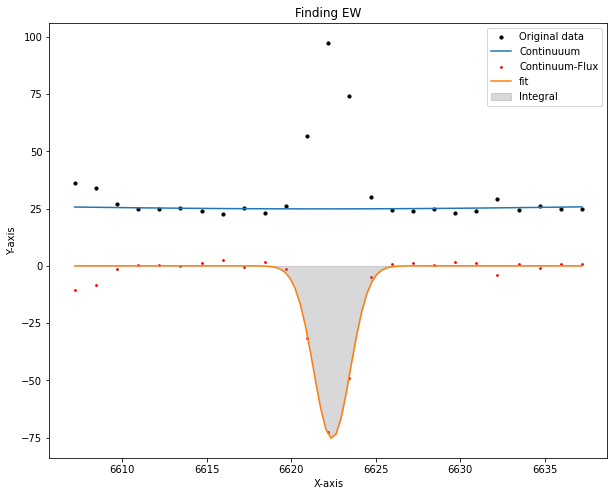

EW= -16.228063229764693  at (i,j)= 18 , 8


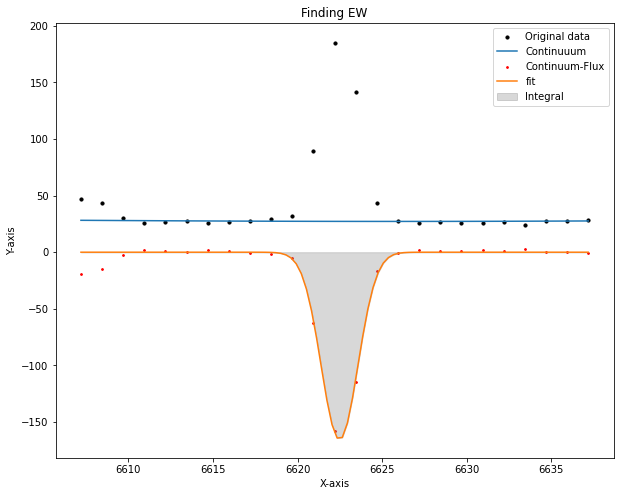

EW= -32.73403835002991  at (i,j)= 18 , 9


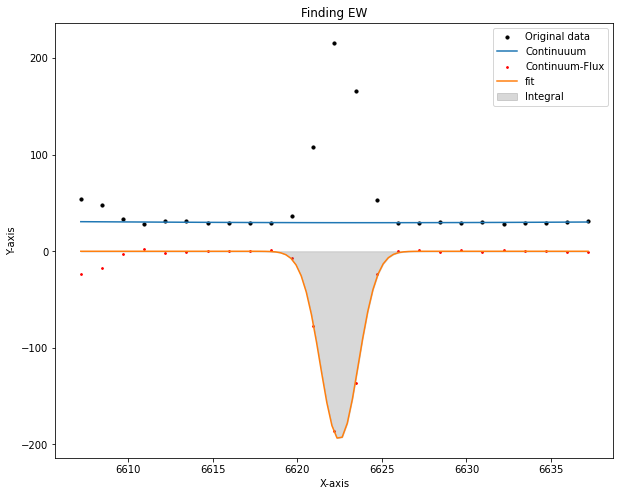

EW= -36.45542209094462  at (i,j)= 18 , 10


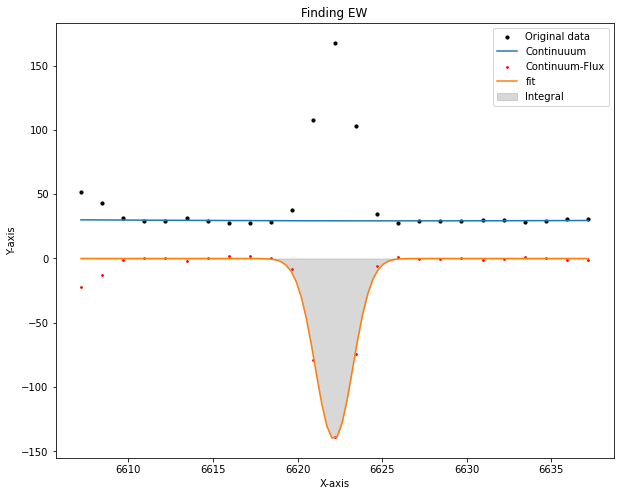

EW= -26.267471423365837  at (i,j)= 18 , 11


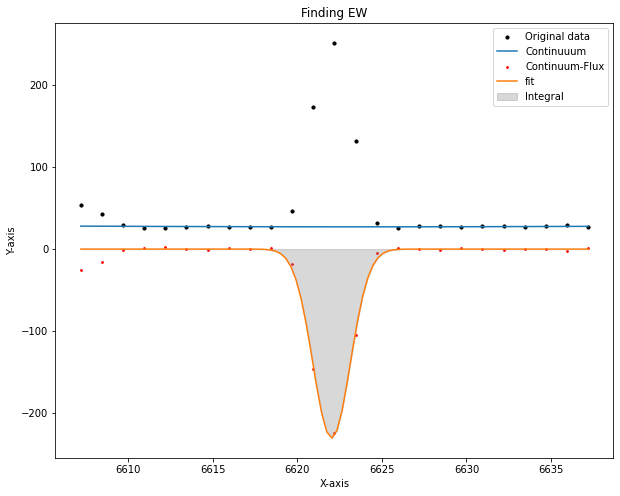

EW= -46.481730981178444  at (i,j)= 18 , 12


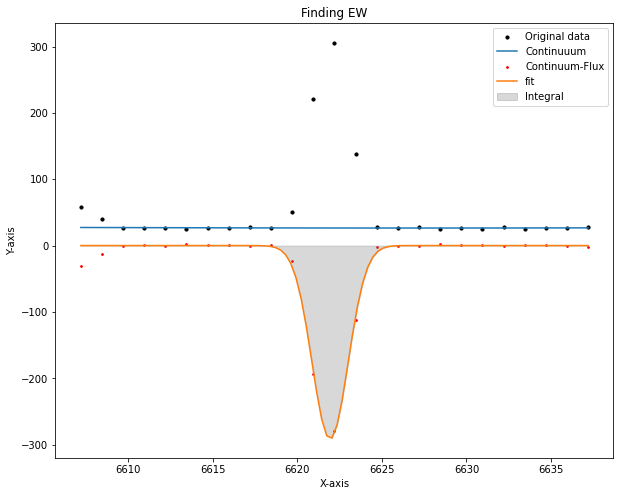

EW= -58.275664289493136  at (i,j)= 18 , 13


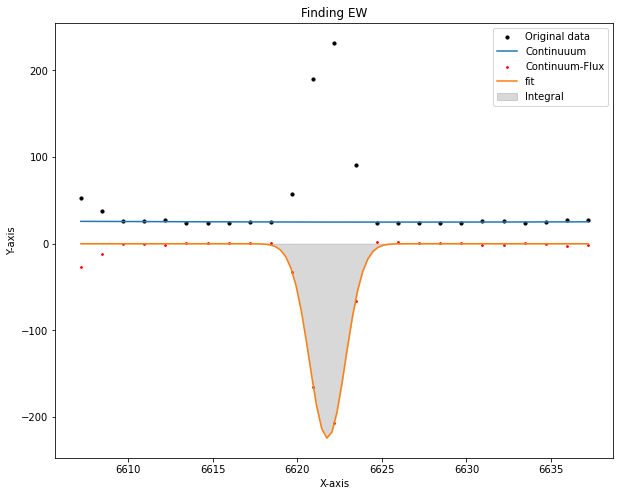

EW= -47.2091647344141  at (i,j)= 18 , 14


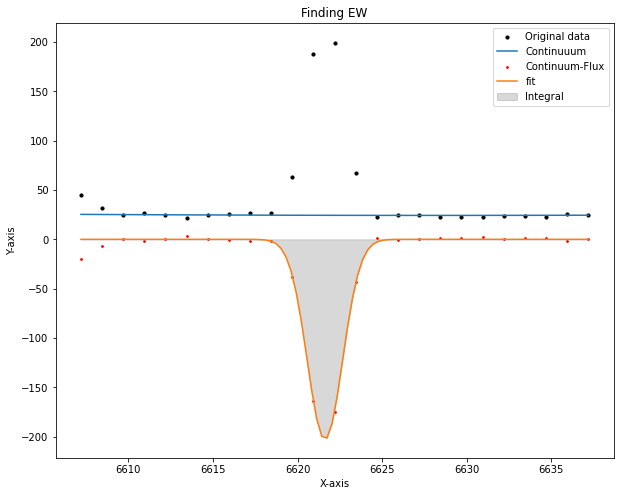

EW= -43.11848918224321  at (i,j)= 18 , 15


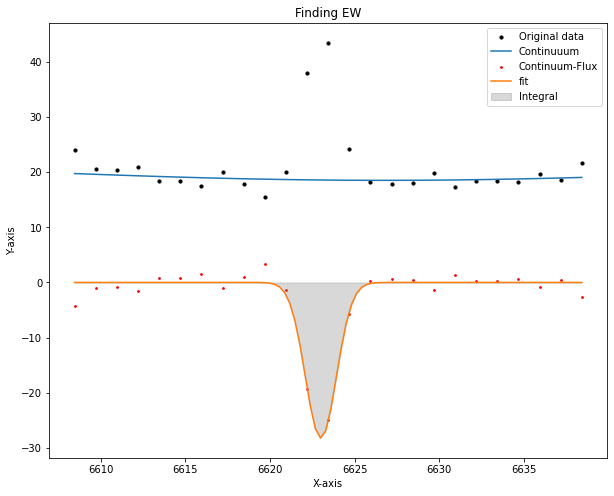

EW= -6.911290624352217  at (i,j)= 19 , 0


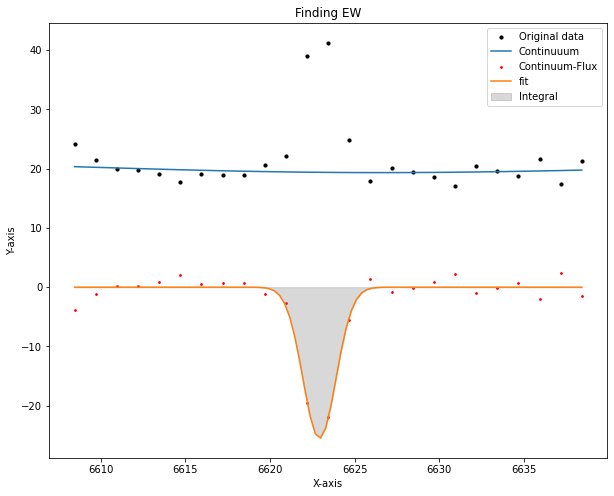

EW= -6.37912629720094  at (i,j)= 19 , 1


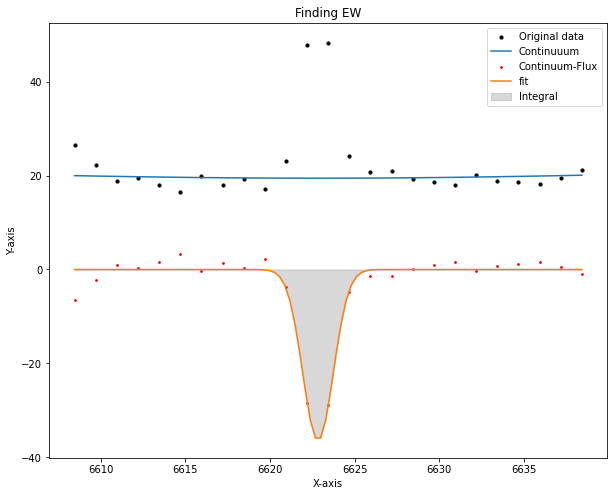

EW= -8.37368625544399  at (i,j)= 19 , 2


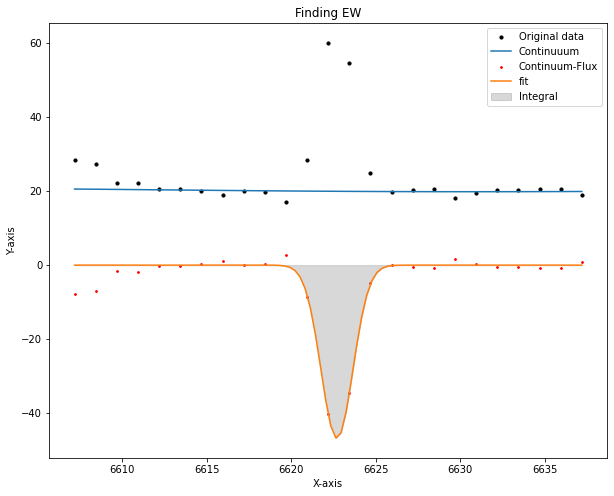

EW= -10.959184965683297  at (i,j)= 19 , 3


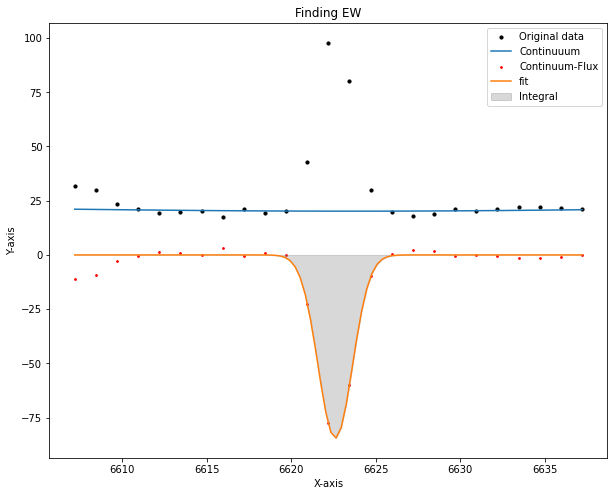

EW= -21.071987841341226  at (i,j)= 19 , 4


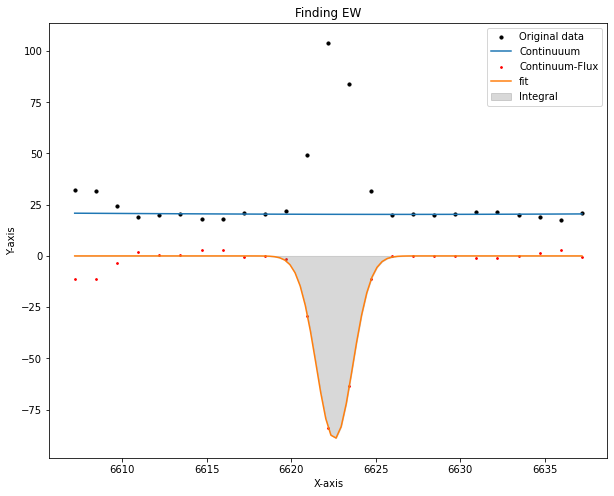

EW= -23.285267590976577  at (i,j)= 19 , 5


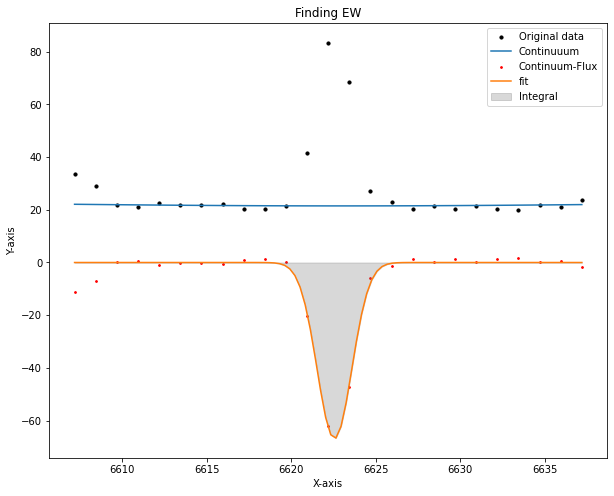

EW= -15.826869749235367  at (i,j)= 19 , 6


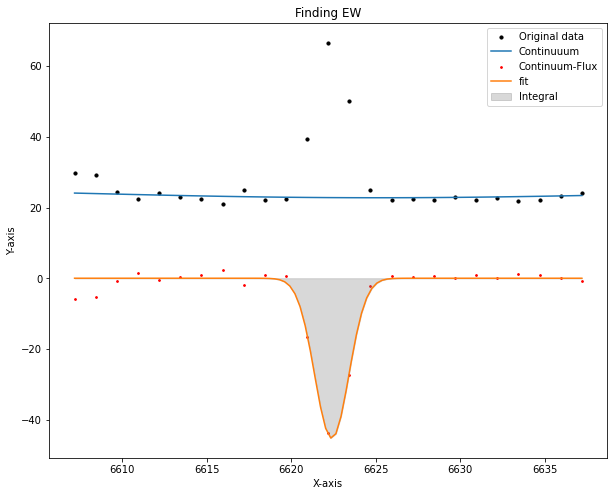

EW= -9.940178778595989  at (i,j)= 19 , 7


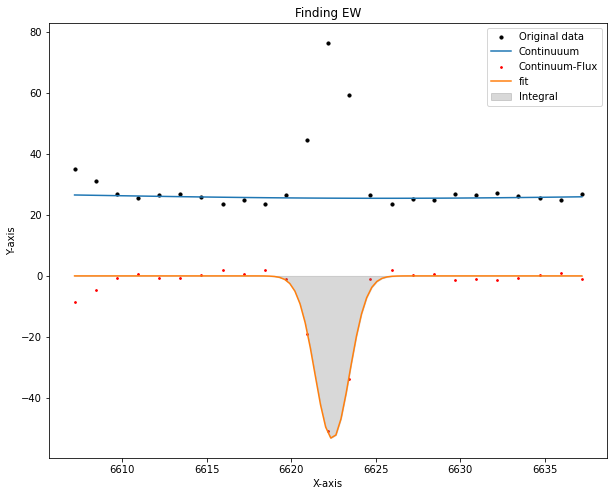

EW= -10.546977230215978  at (i,j)= 19 , 8


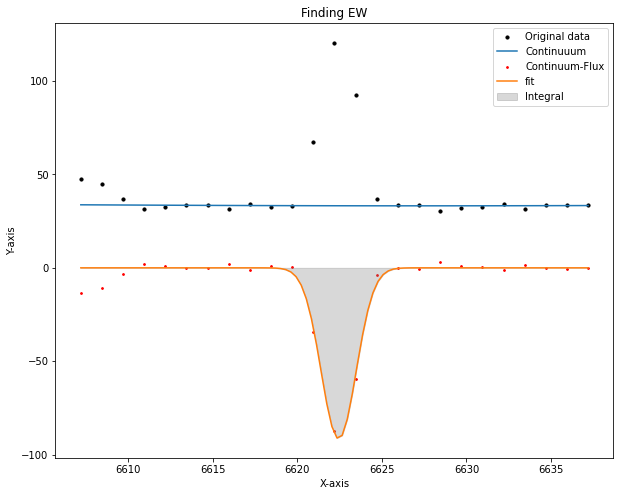

EW= -14.141736028450715  at (i,j)= 19 , 9


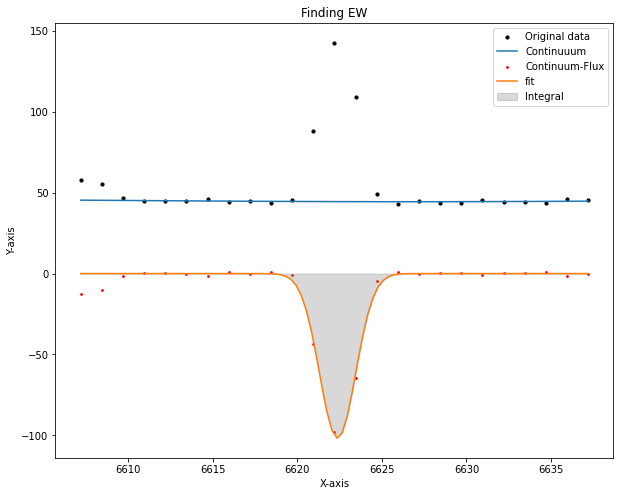

EW= -12.128477570535471  at (i,j)= 19 , 10


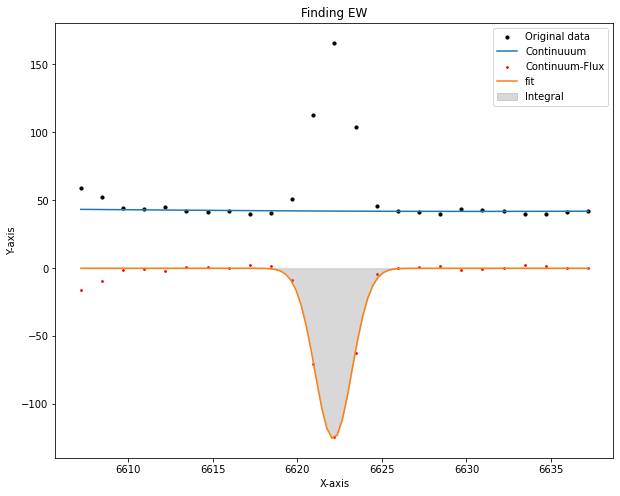

EW= -16.112190281541228  at (i,j)= 19 , 11


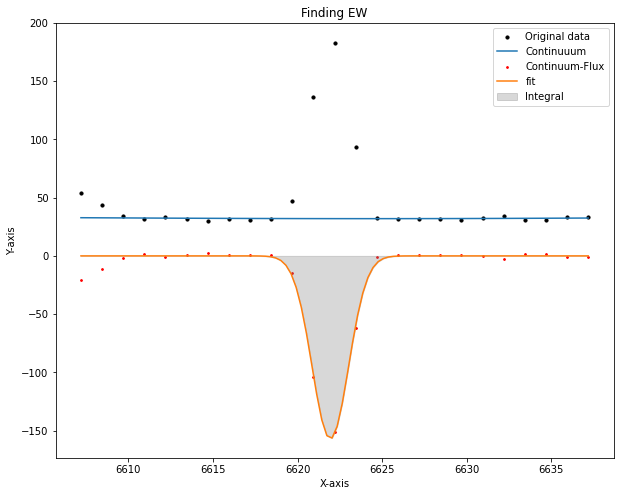

EW= -26.240174990185576  at (i,j)= 19 , 12


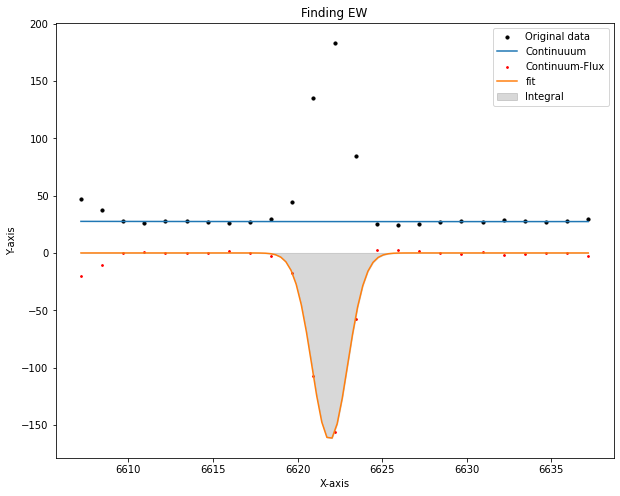

EW= -30.989189301448132  at (i,j)= 19 , 13


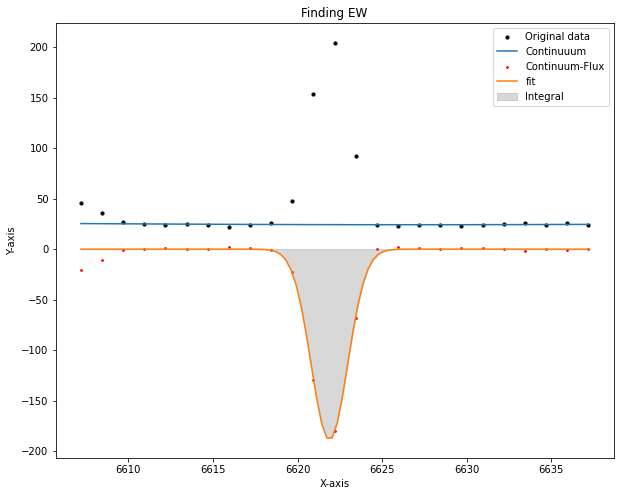

EW= -41.56963850130283  at (i,j)= 19 , 14


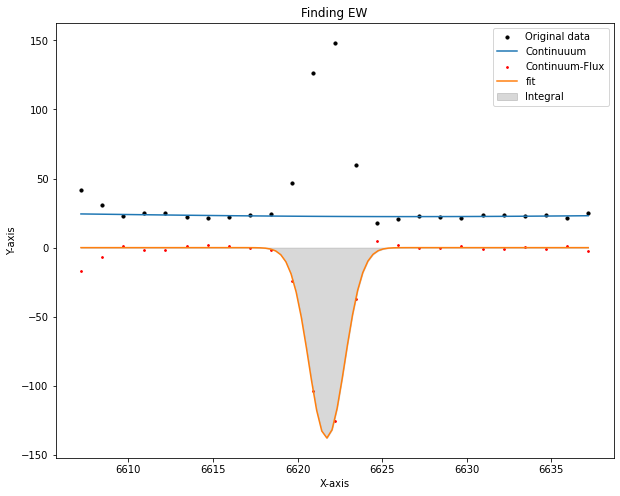

EW= -32.04094671689234  at (i,j)= 19 , 15


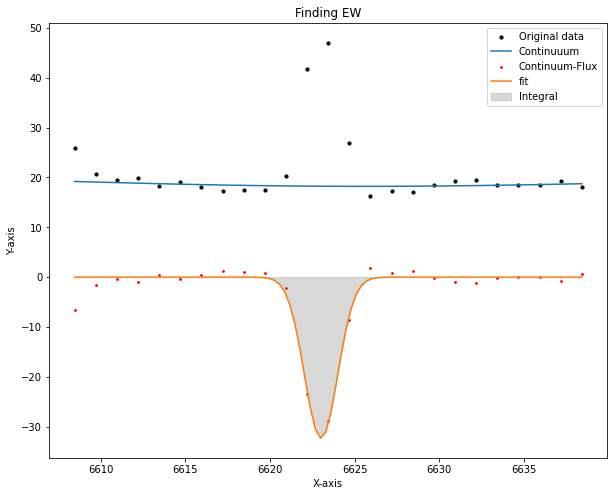

EW= -8.636603487135794  at (i,j)= 20 , 0


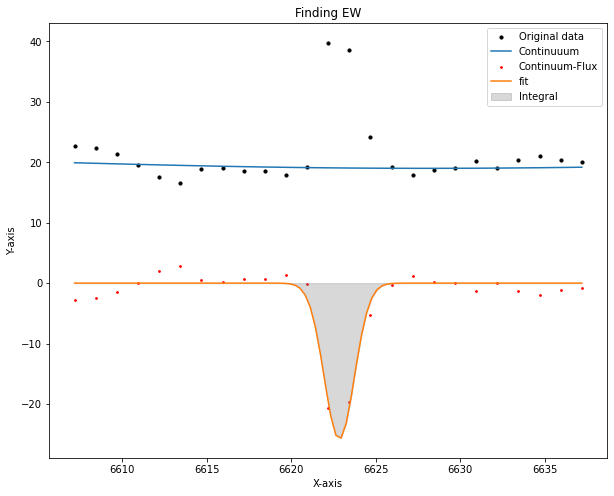

EW= -5.966546348044765  at (i,j)= 20 , 1


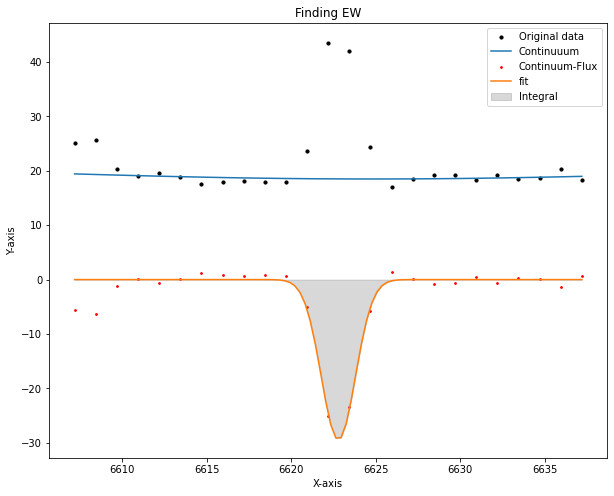

EW= -7.973538224849877  at (i,j)= 20 , 2


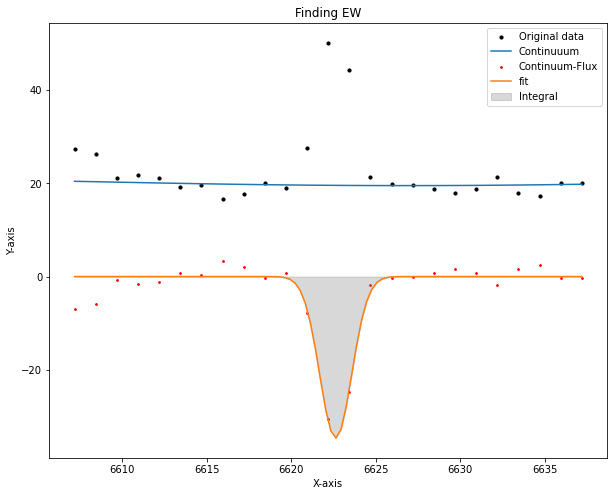

EW= -8.330873062690603  at (i,j)= 20 , 3


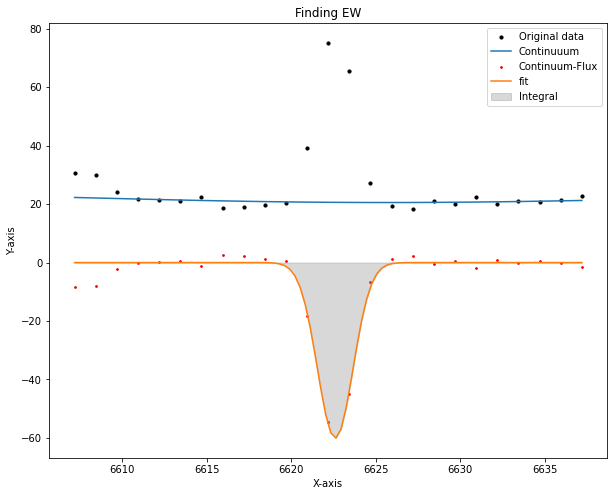

EW= -15.191077649926928  at (i,j)= 20 , 4


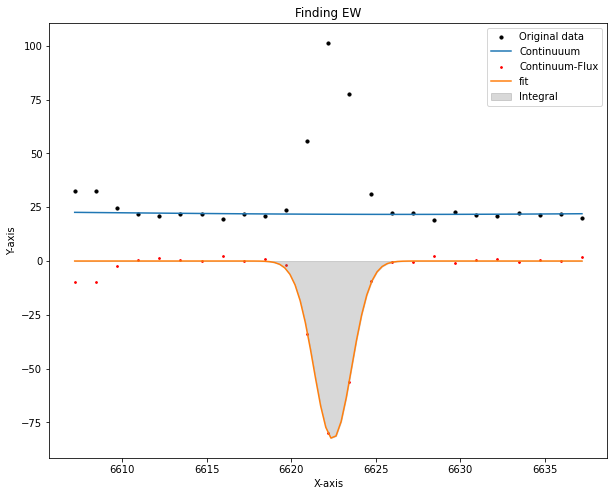

EW= -20.940476594071605  at (i,j)= 20 , 5


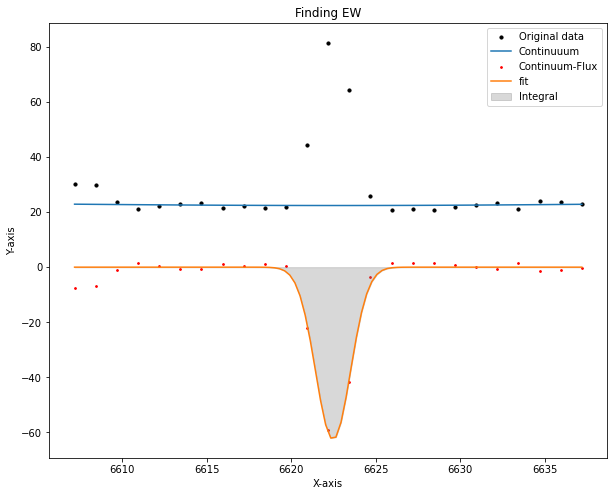

EW= -14.293456163250818  at (i,j)= 20 , 6


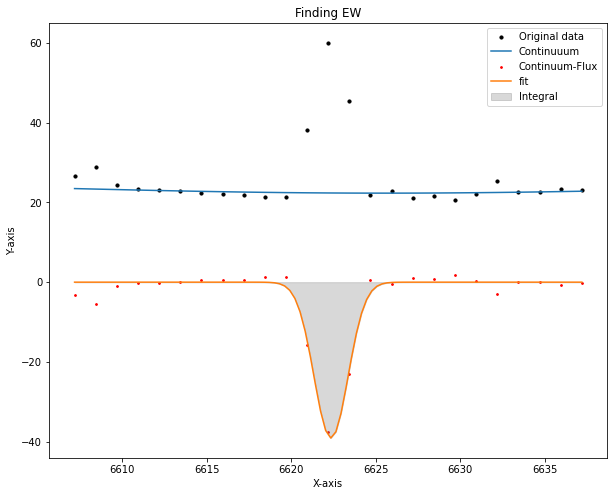

EW= -8.719153536585281  at (i,j)= 20 , 7


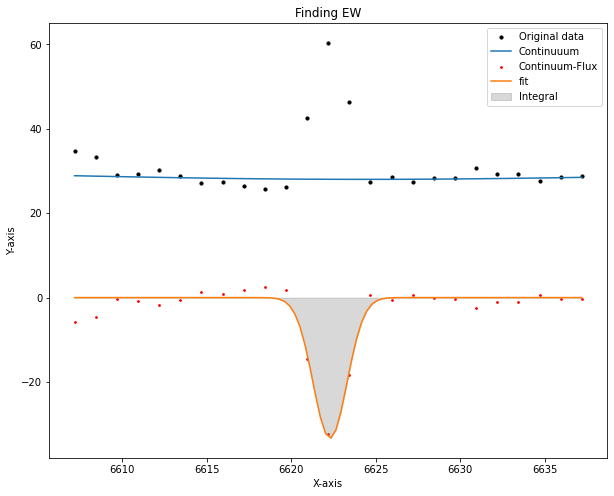

EW= -5.910691840453474  at (i,j)= 20 , 8


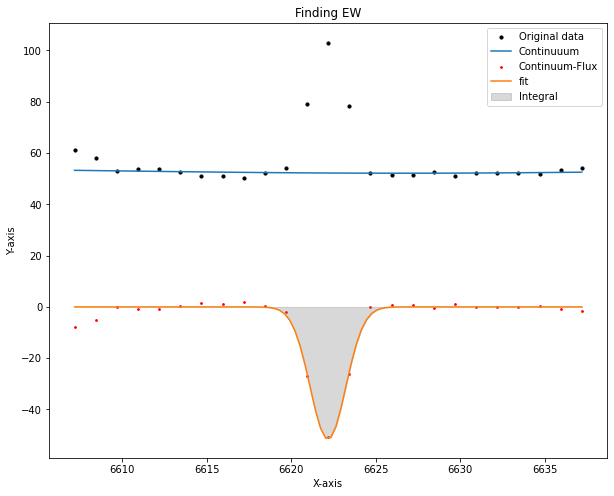

EW= -5.1693327755990595  at (i,j)= 20 , 9


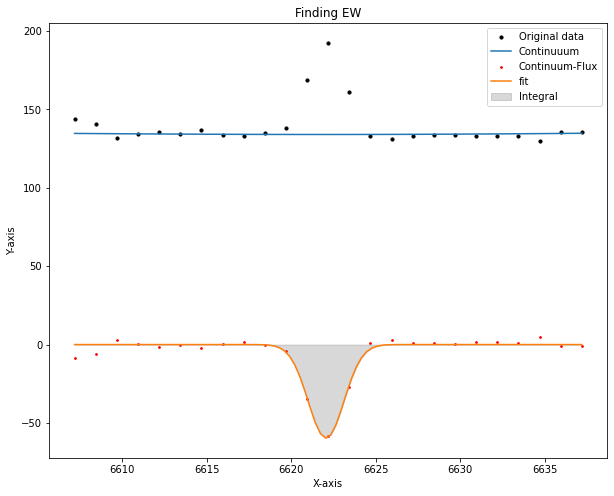

EW= -2.33951052007663  at (i,j)= 20 , 10


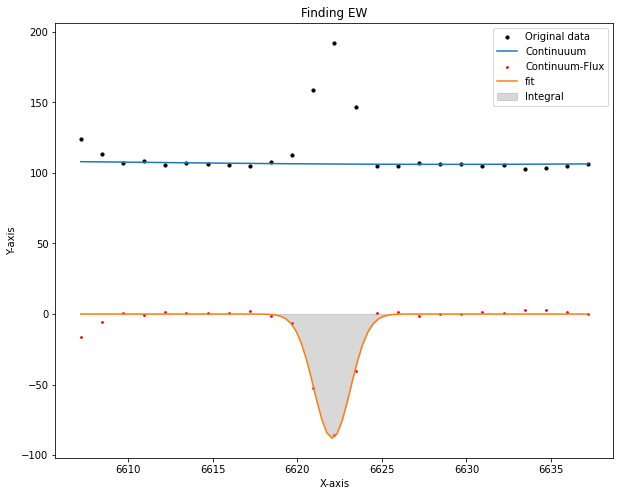

EW= -4.405752749517476  at (i,j)= 20 , 11


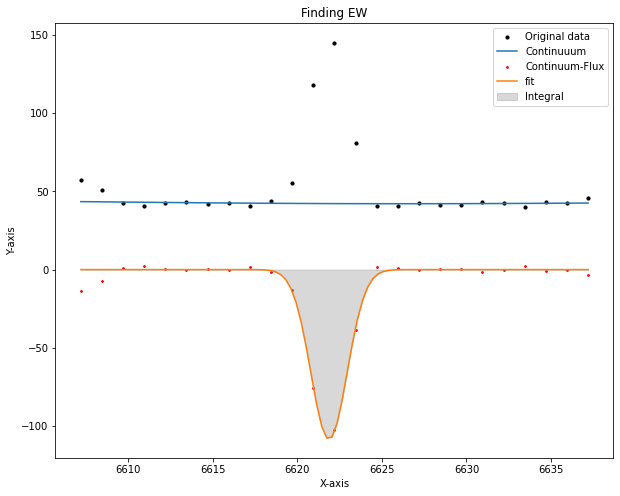

EW= -13.700597597647564  at (i,j)= 20 , 12


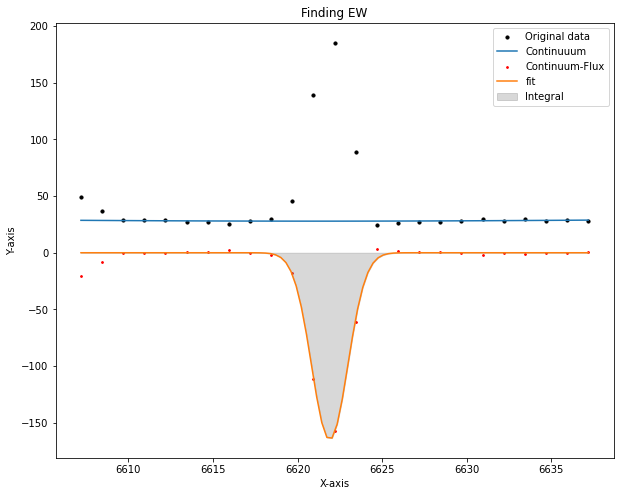

EW= -31.30590620116154  at (i,j)= 20 , 13


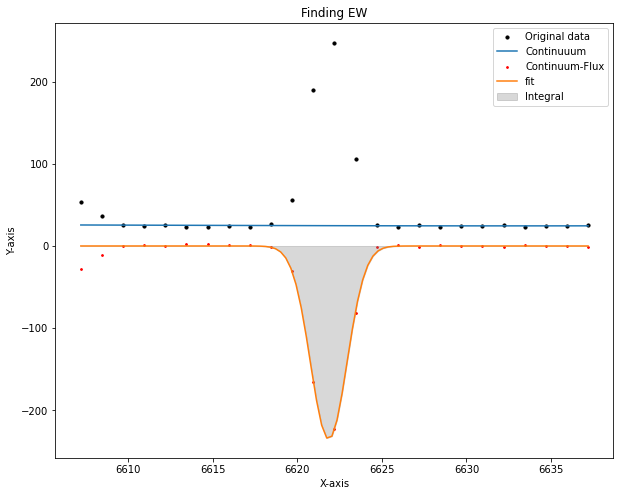

EW= -50.8479696220804  at (i,j)= 20 , 14


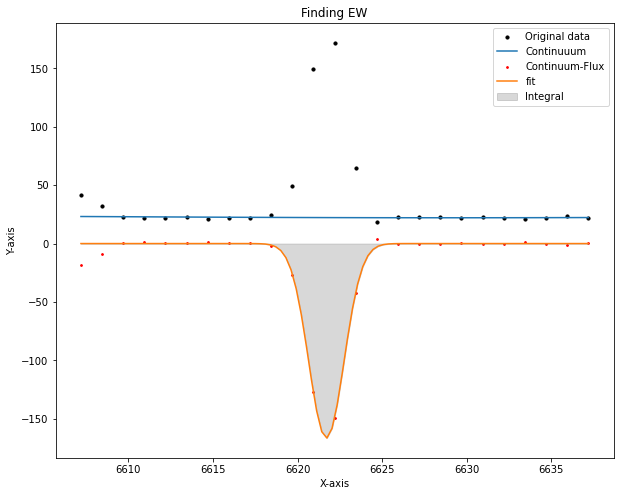

EW= -38.832085682484916  at (i,j)= 20 , 15


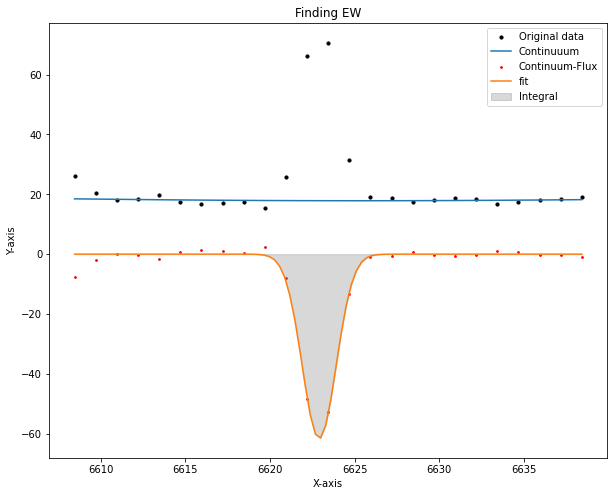

EW= -17.158960081388592  at (i,j)= 21 , 0


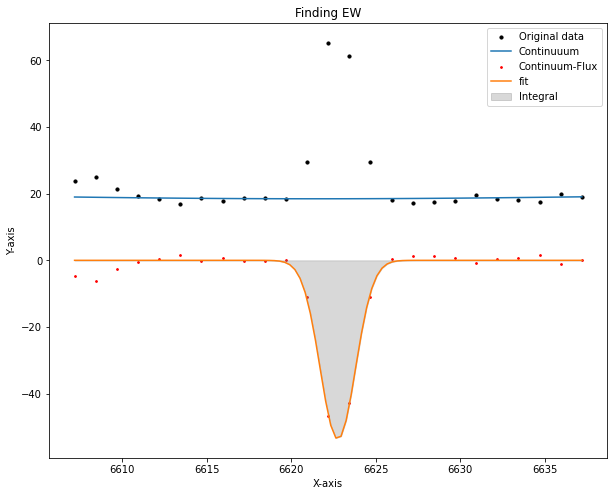

EW= -15.044258517776846  at (i,j)= 21 , 1


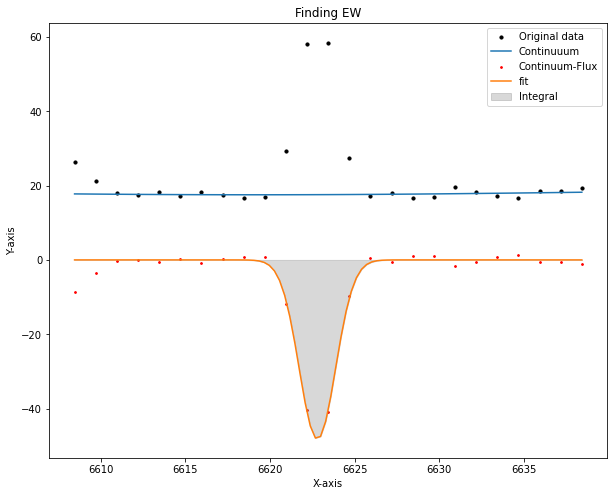

EW= -14.651270417938356  at (i,j)= 21 , 2


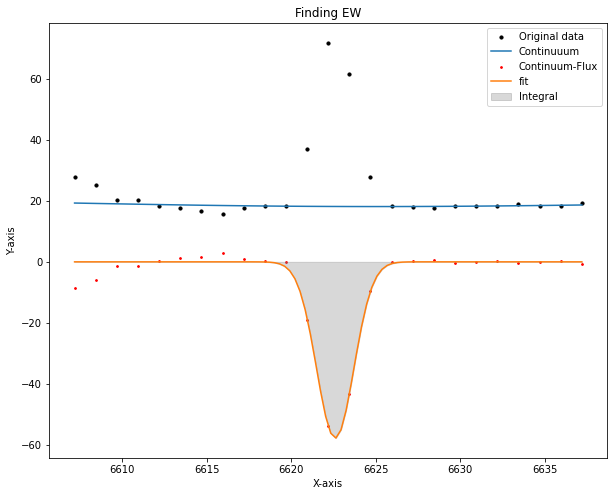

EW= -17.390625510902215  at (i,j)= 21 , 3


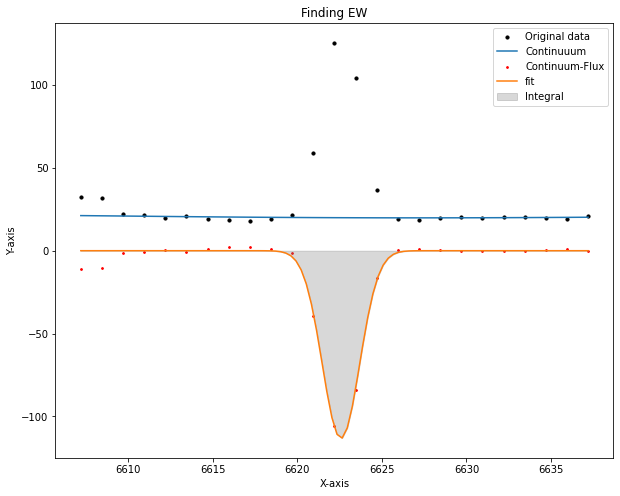

EW= -31.10987584342834  at (i,j)= 21 , 4


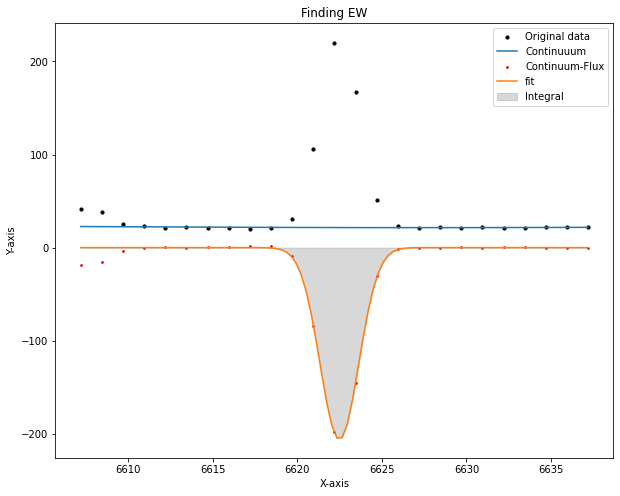

EW= -54.24602711671355  at (i,j)= 21 , 5


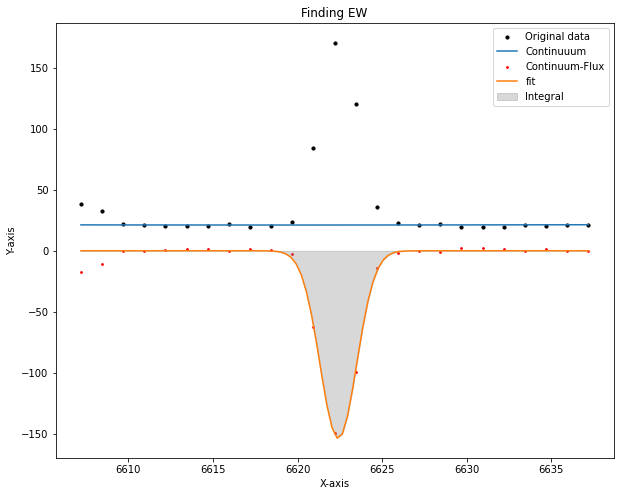

EW= -39.081969622855695  at (i,j)= 21 , 6


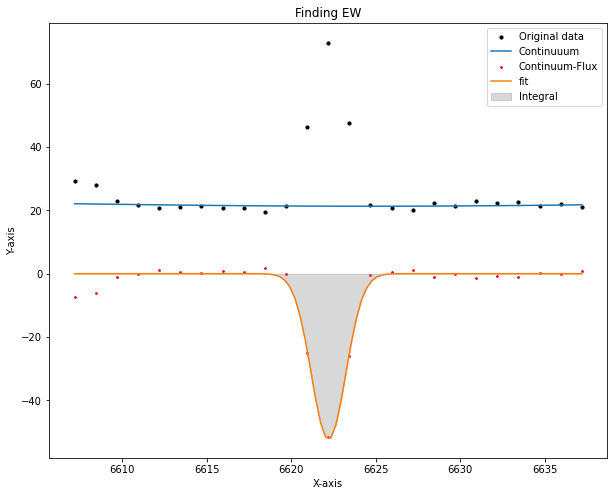

EW= -12.398154520424  at (i,j)= 21 , 7


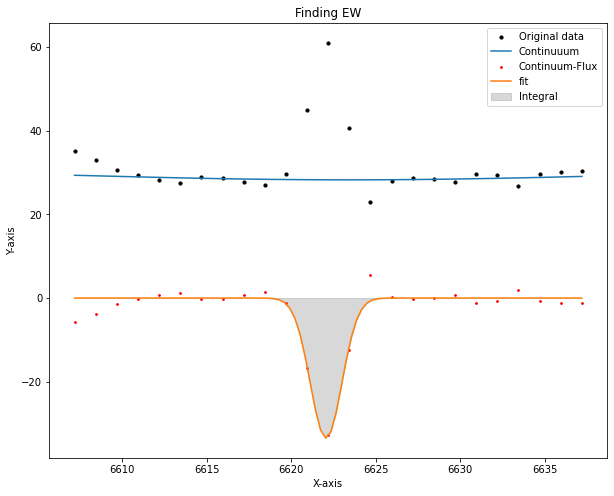

EW= -5.510581294143187  at (i,j)= 21 , 8


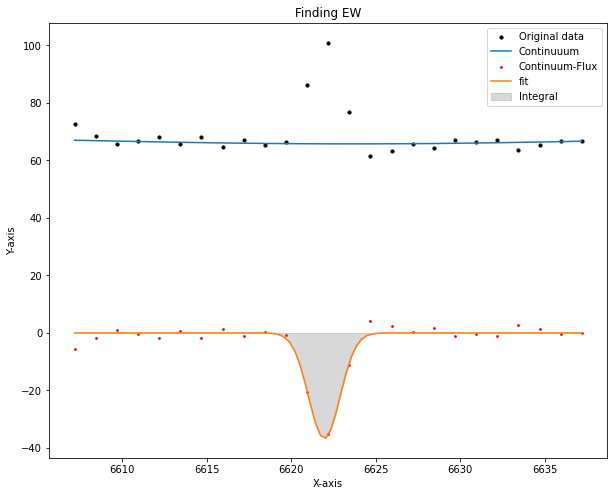

EW= -2.571984935554661  at (i,j)= 21 , 9


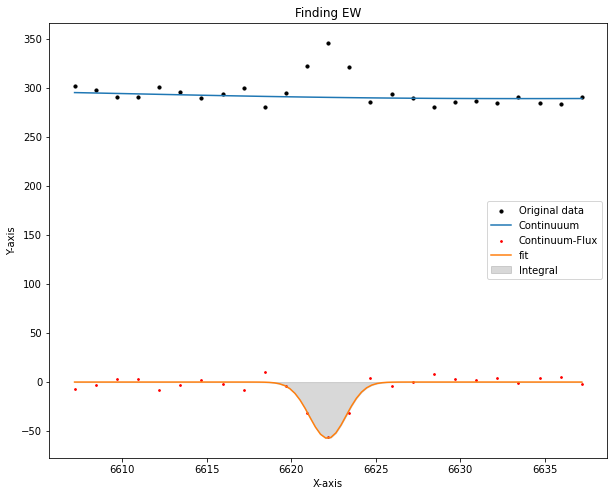

EW= -1.0595724275810348  at (i,j)= 21 , 10


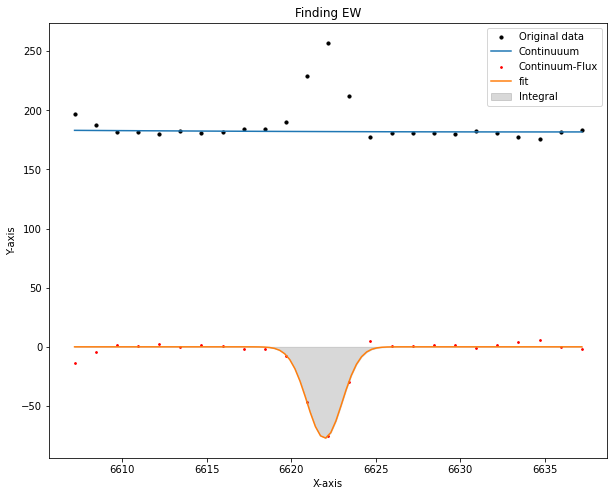

EW= -2.1857426755906437  at (i,j)= 21 , 11


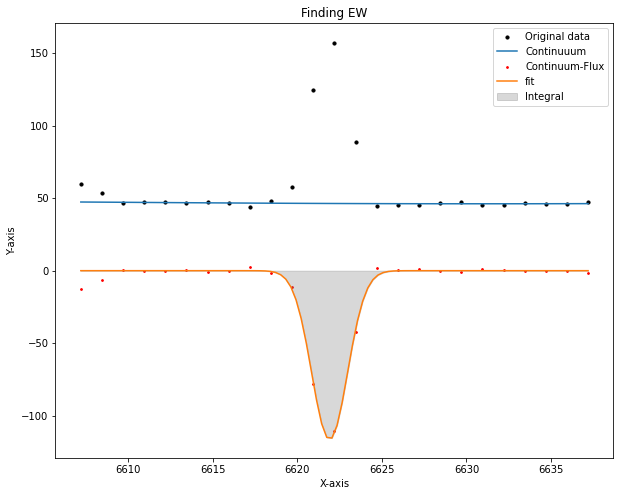

EW= -13.192830009204348  at (i,j)= 21 , 12


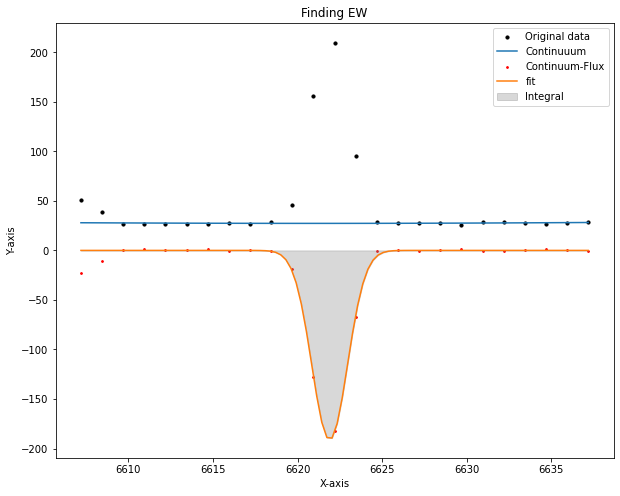

EW= -36.635176251310895  at (i,j)= 21 , 13


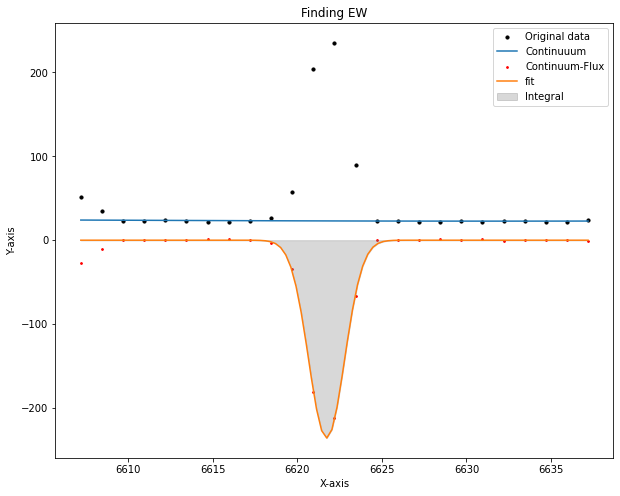

EW= -53.931131253235826  at (i,j)= 21 , 14


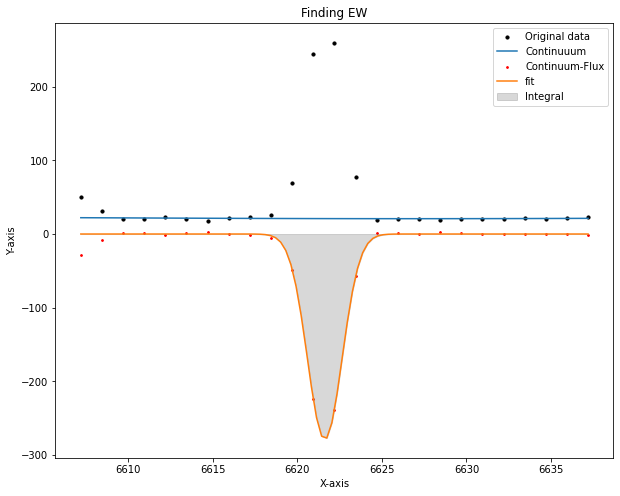

EW= -67.8328320323878  at (i,j)= 21 , 15


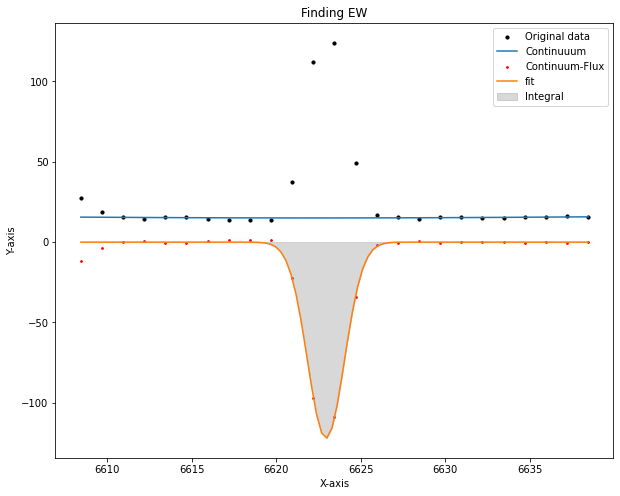

EW= -43.81387310907105  at (i,j)= 22 , 0


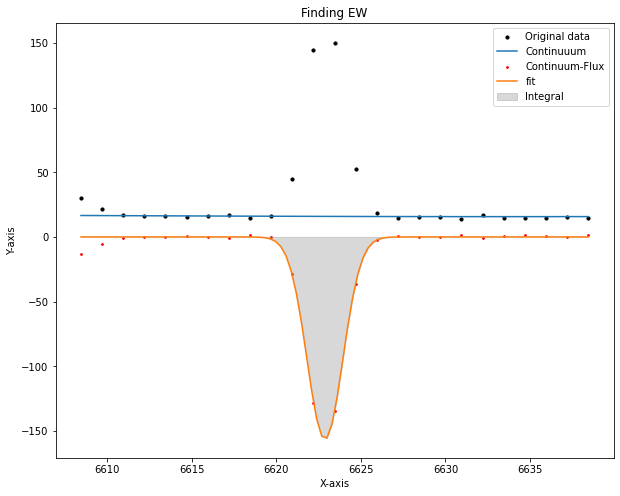

EW= -51.71374607682852  at (i,j)= 22 , 1


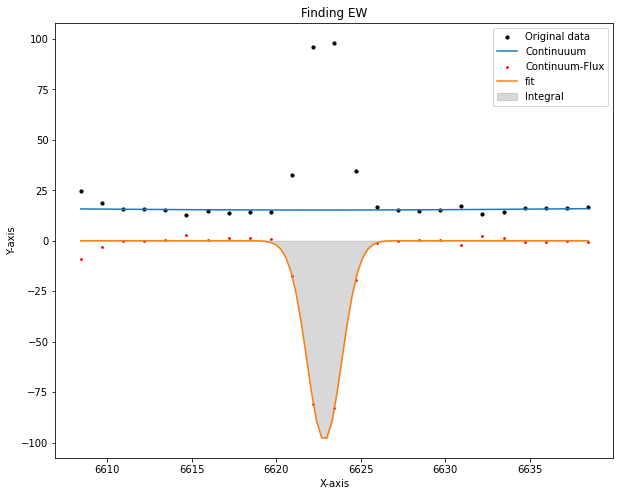

EW= -32.961466157402235  at (i,j)= 22 , 2


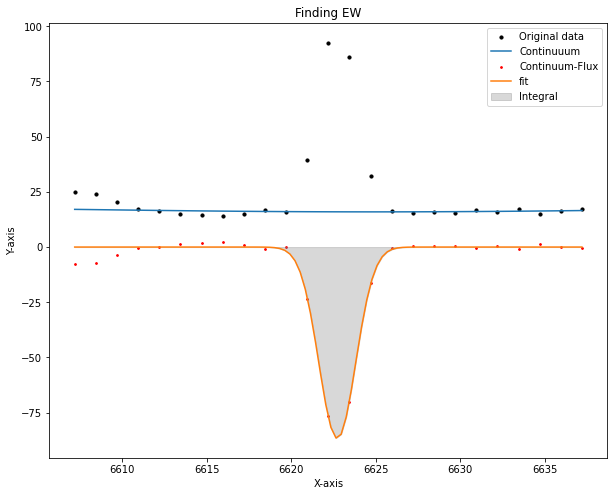

EW= -29.33870860860281  at (i,j)= 22 , 3


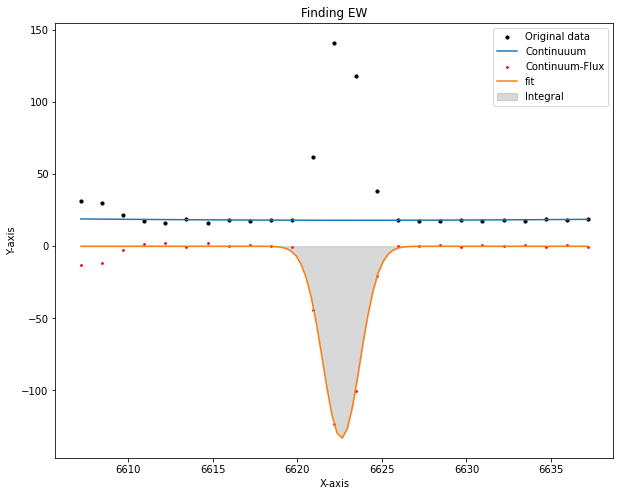

EW= -40.25259688386364  at (i,j)= 22 , 4


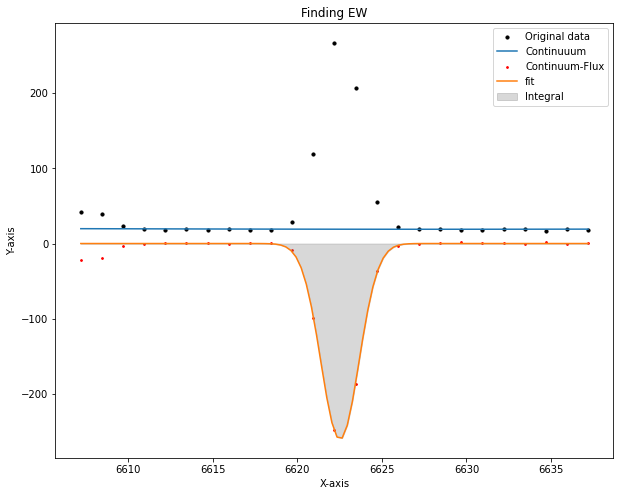

EW= -76.23774041023083  at (i,j)= 22 , 5


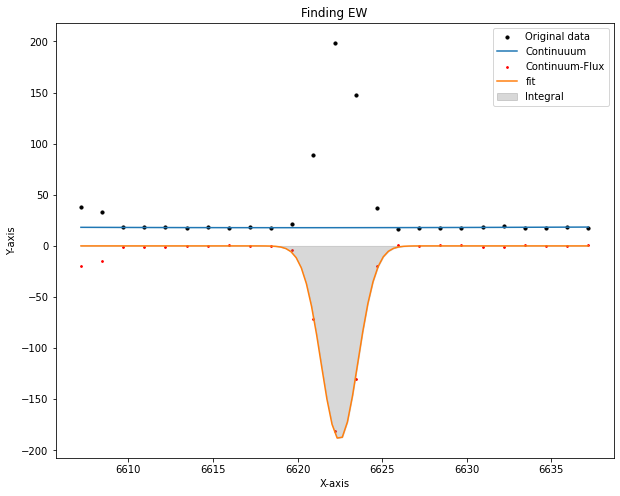

EW= -57.00614425313039  at (i,j)= 22 , 6


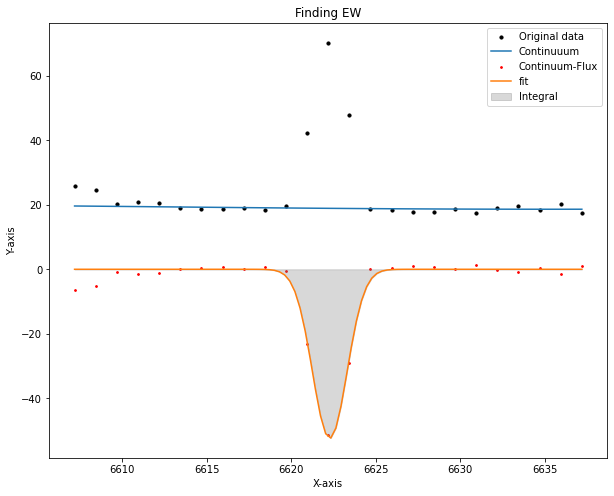

EW= -14.093904090928588  at (i,j)= 22 , 7


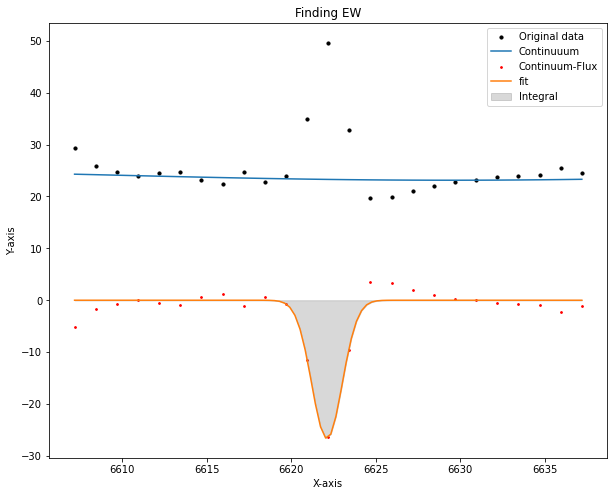

EW= -5.111153305283792  at (i,j)= 22 , 8


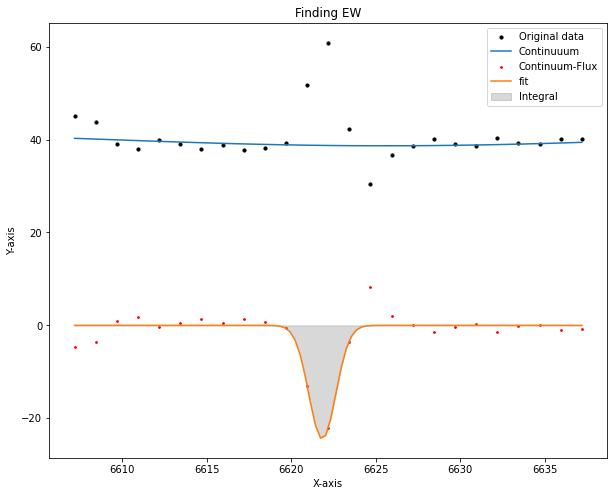

EW= -2.4953246600620123  at (i,j)= 22 , 9


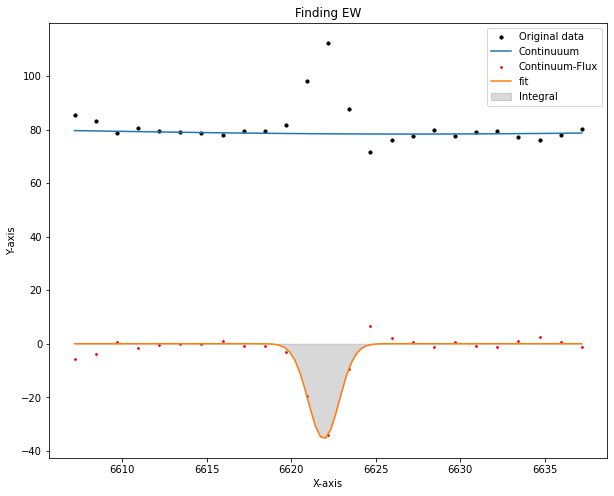

EW= -2.0467538745446836  at (i,j)= 22 , 10


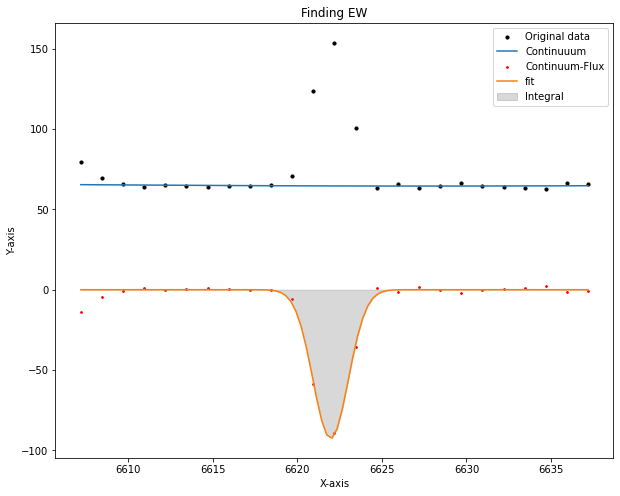

EW= -7.425121323965031  at (i,j)= 22 , 11


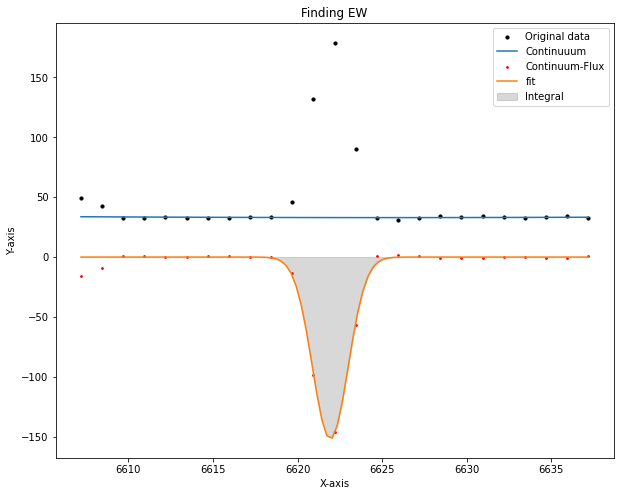

EW= -24.07528954690742  at (i,j)= 22 , 12


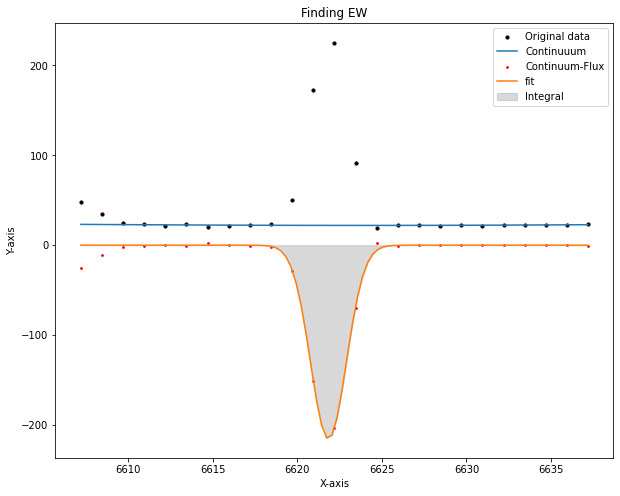

EW= -51.413294482403785  at (i,j)= 22 , 13


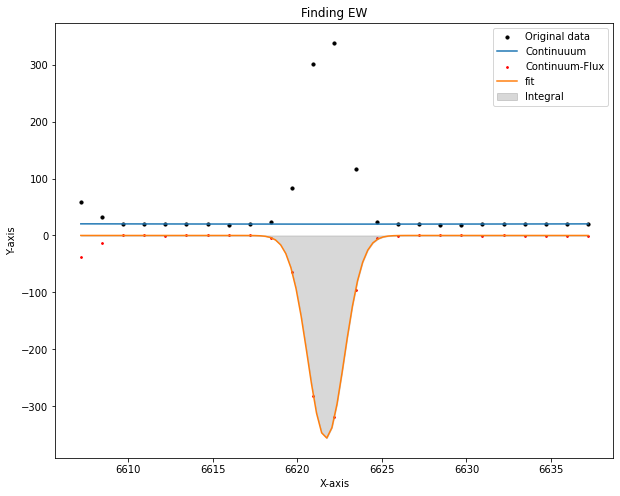

EW= -95.6742987766908  at (i,j)= 22 , 14


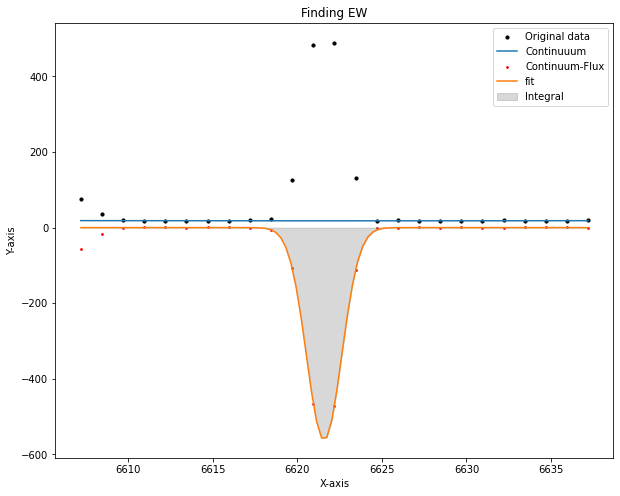

EW= -160.86806982826928  at (i,j)= 22 , 15


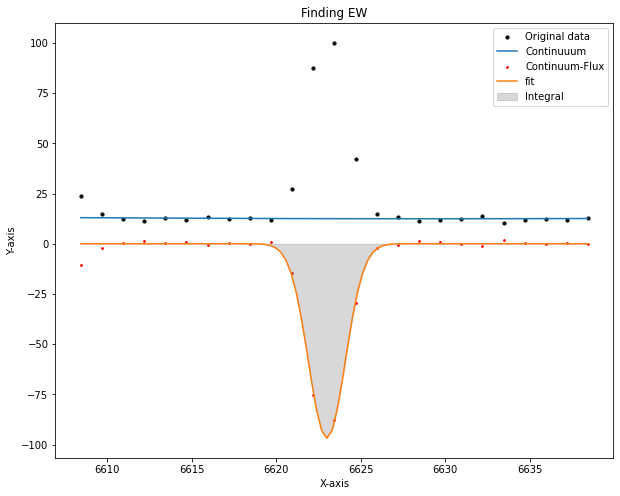

EW= -41.842065936247884  at (i,j)= 23 , 0


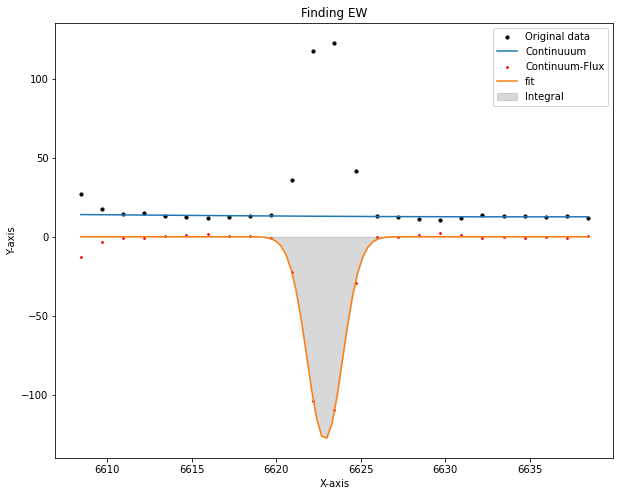

EW= -51.41870039437388  at (i,j)= 23 , 1


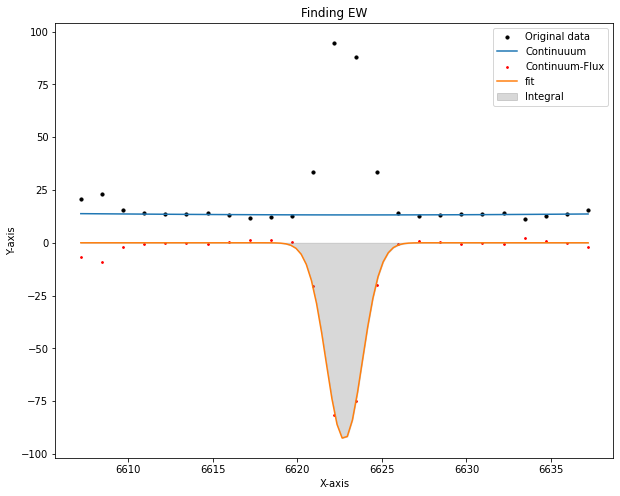

EW= -37.36223843333976  at (i,j)= 23 , 2


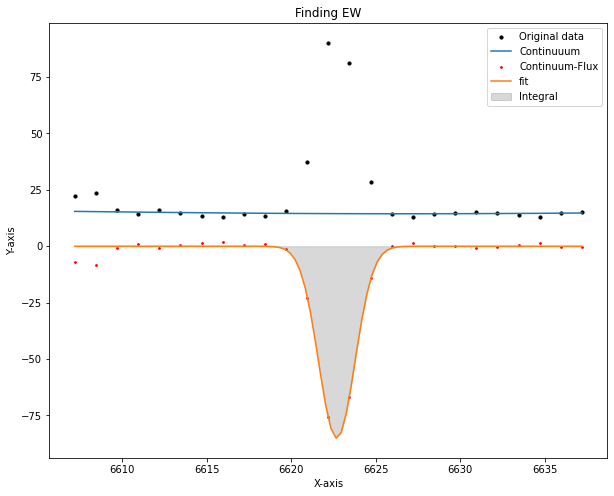

EW= -31.206778088854062  at (i,j)= 23 , 3


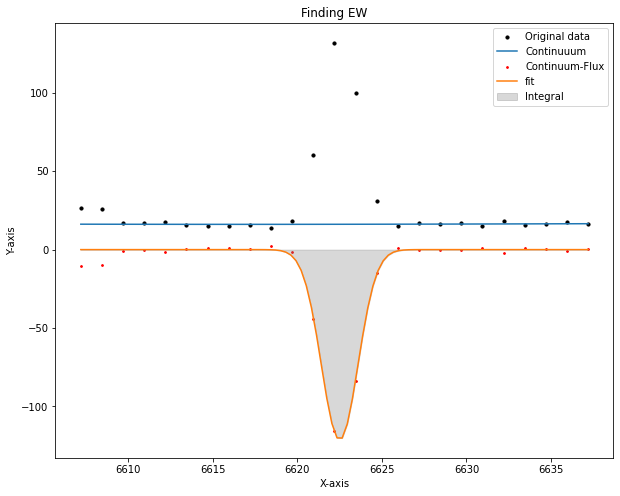

EW= -40.34025539917759  at (i,j)= 23 , 4


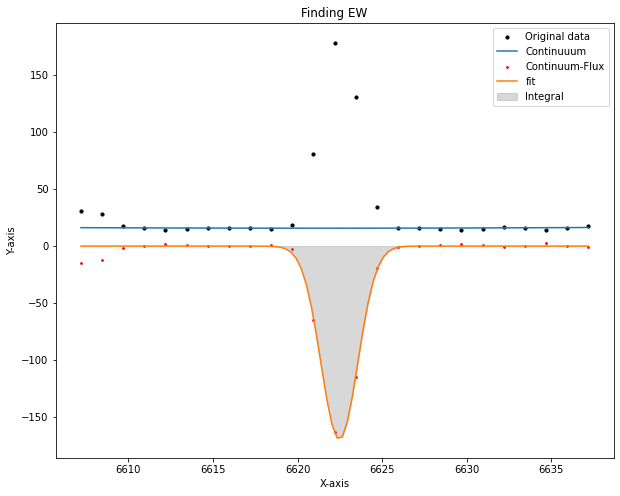

EW= -58.26924143614685  at (i,j)= 23 , 5


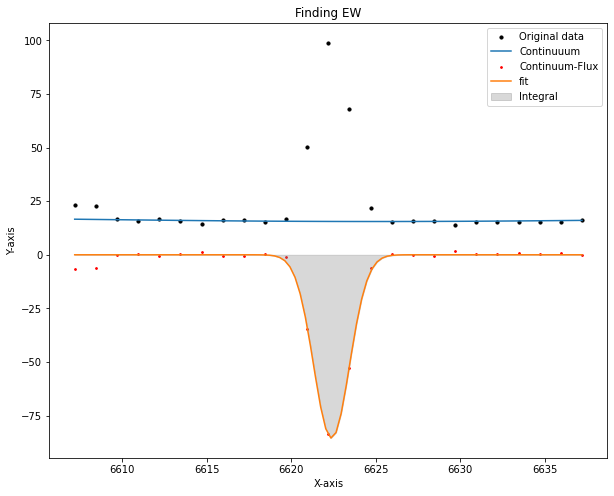

EW= -28.82405606767652  at (i,j)= 23 , 6


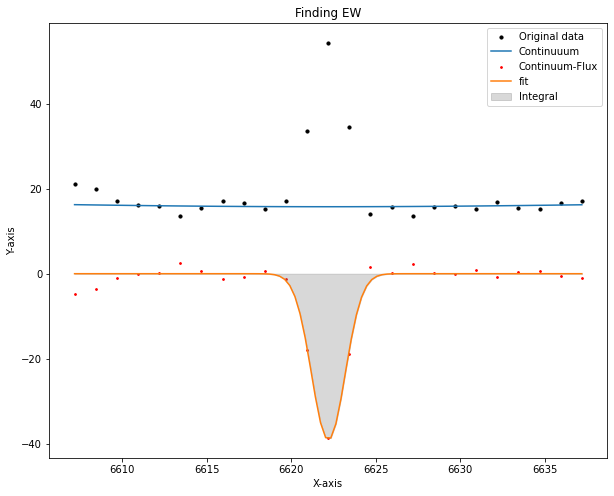

EW= -12.213356541567002  at (i,j)= 23 , 7


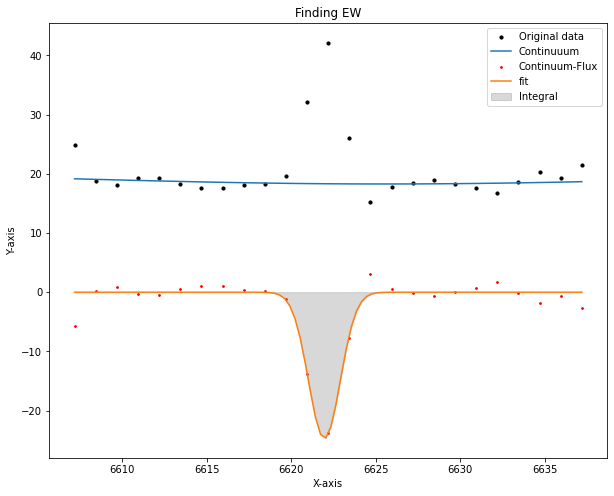

EW= -6.292275347884022  at (i,j)= 23 , 8


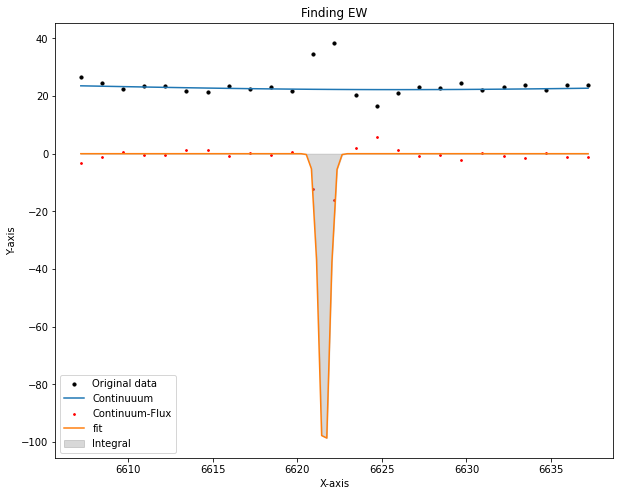

EW= -7.590774500464504  at (i,j)= 23 , 9


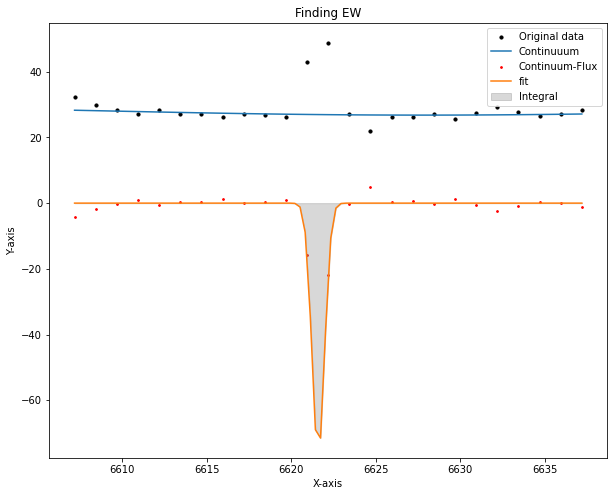

EW= -5.244472511841883  at (i,j)= 23 , 10


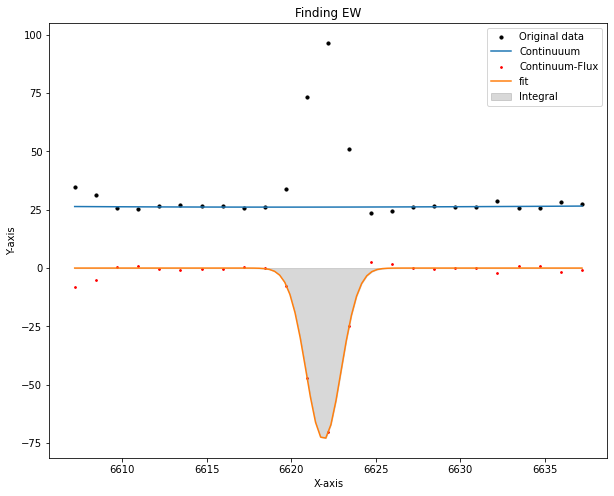

EW= -14.33895357814762  at (i,j)= 23 , 11


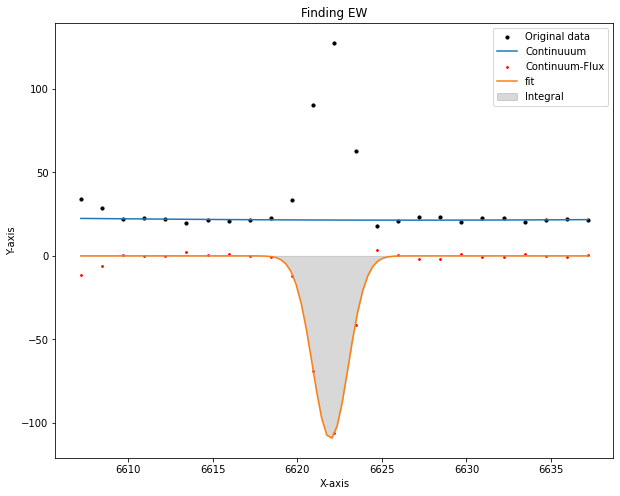

EW= -26.624658692394817  at (i,j)= 23 , 12


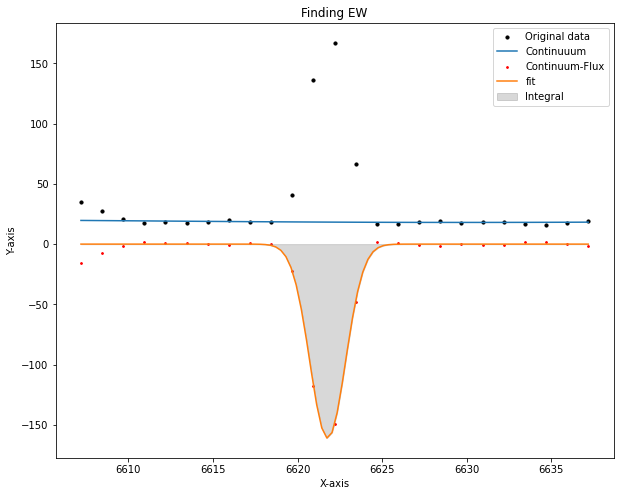

EW= -46.184185312458055  at (i,j)= 23 , 13


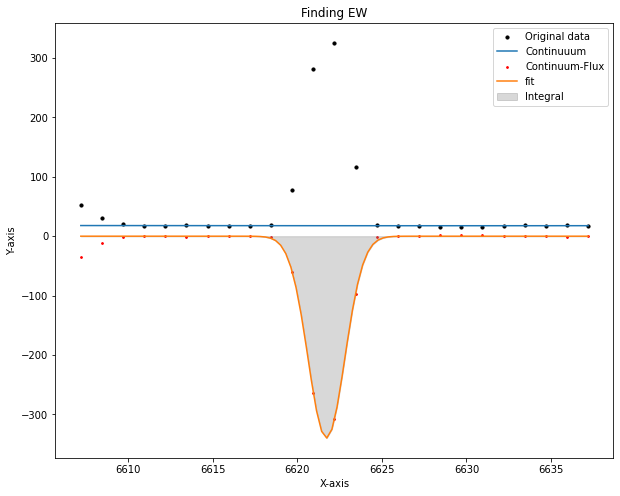

EW= -103.70107147111263  at (i,j)= 23 , 14


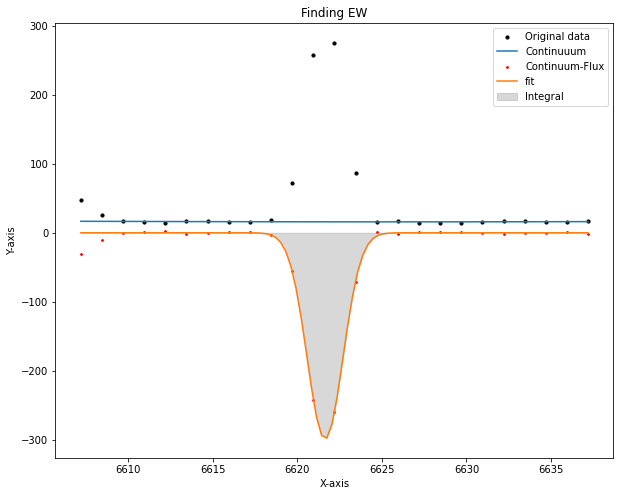

EW= -98.99098775995714  at (i,j)= 23 , 15


In [75]:
map=EW_map_parametric(binned_region,wave,halpha_obs)

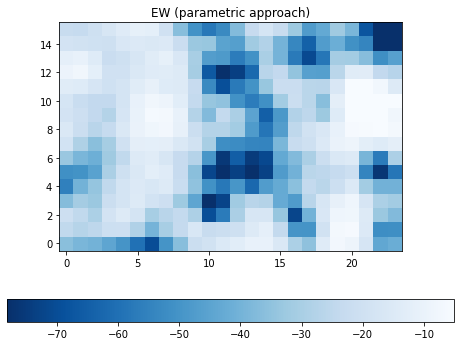

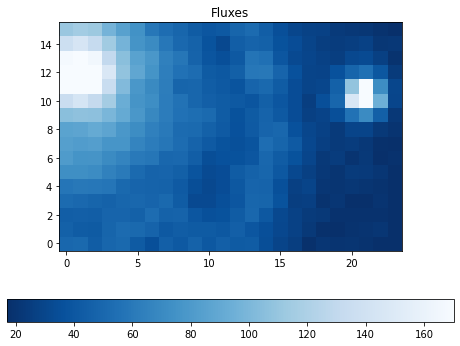

In [76]:
data= np.transpose(map)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

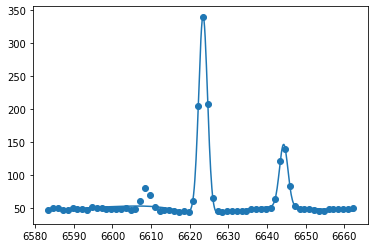

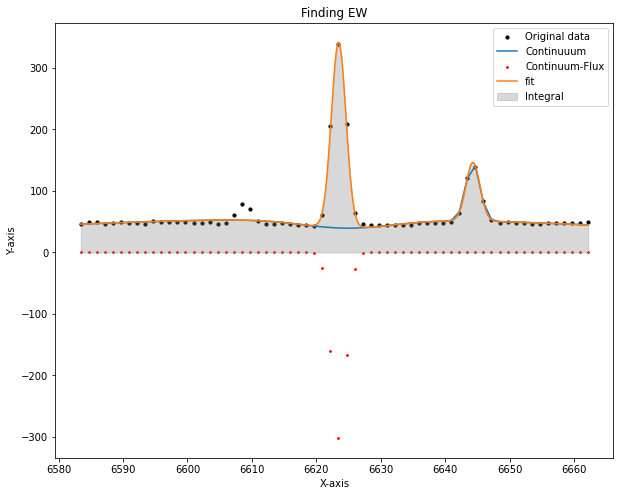

EW= -42.489231710198524  at (i,j)= 0 , 0


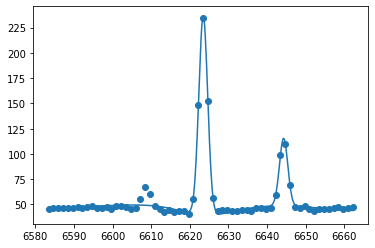

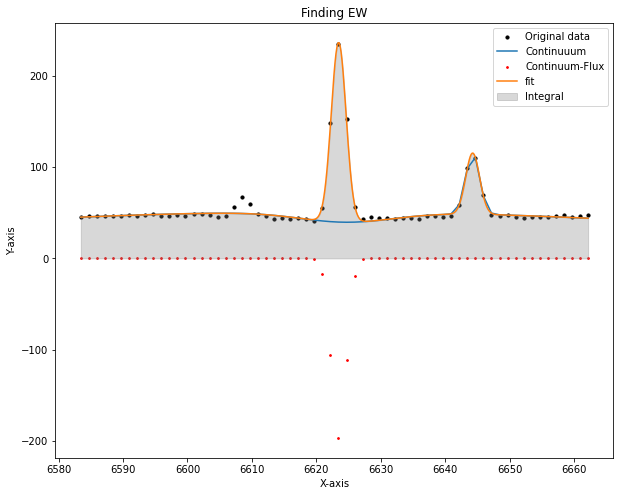

EW= -28.038466830384984  at (i,j)= 0 , 1


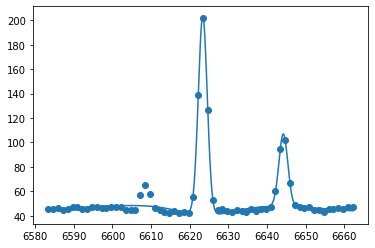

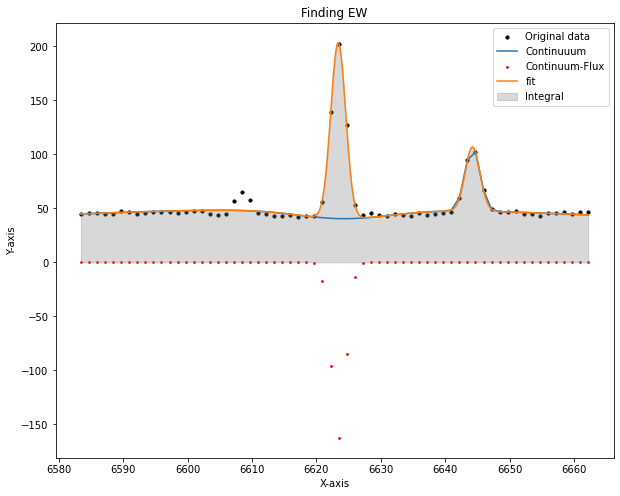

EW= -22.979549782069792  at (i,j)= 0 , 2


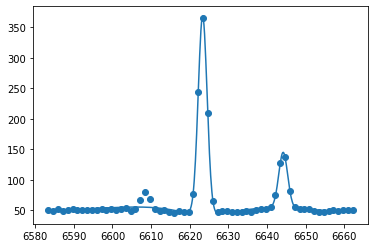

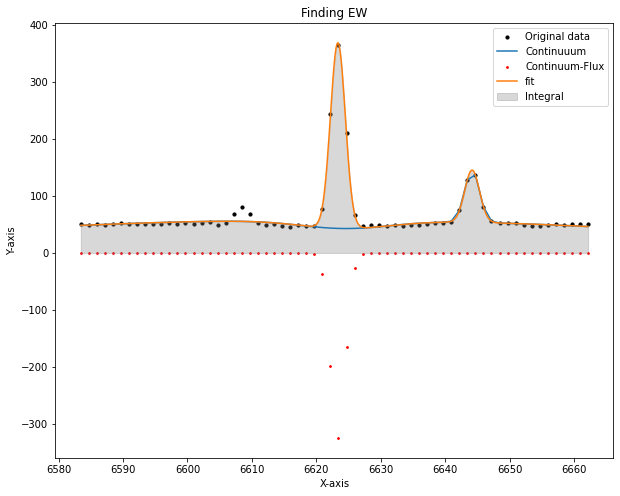

EW= -43.17278397579276  at (i,j)= 0 , 3


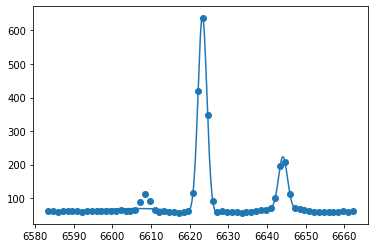

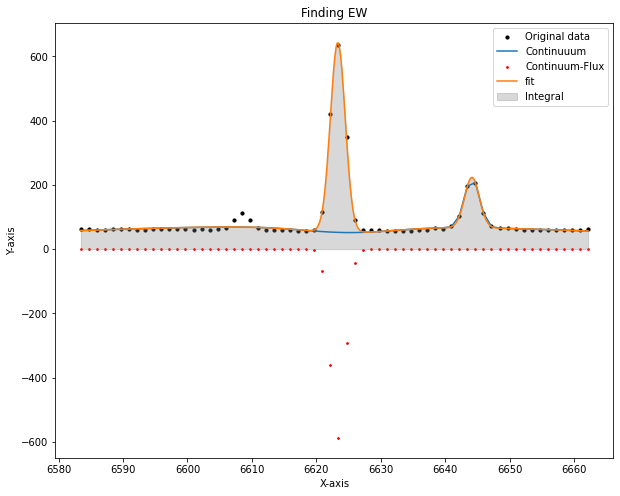

EW= -64.34592109422232  at (i,j)= 0 , 4


KeyboardInterrupt: 

In [156]:
map=EW_map_parametric(binned_region,wave,halpha_obs,method=1)

## EW - non parametric approach

In [267]:
x_chopped,y_chopped=chop_data(wave,binned_region[:,10,10],halpha_obs-50,halpha_obs+50)

# smooth data
y_smooth=smooth_spectra(y_chopped,kernel_size=3)

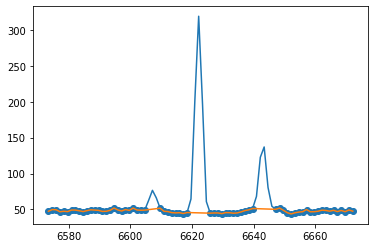

In [268]:
plt.plot(x_chopped,y_smooth)
x,y=filterout_peaks(x_chopped,y_smooth)
plt.scatter(x,y)

kernel = cosine_kernel(3)
cont = convolve(y, kernel, mode='same')

plt.plot(x,cont)

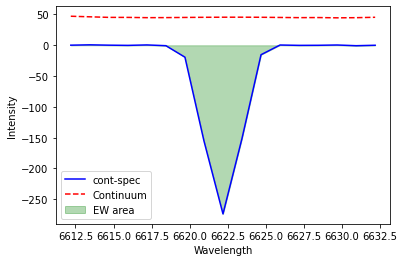

Integral of area over continuum divided by continuum: -16.86


In [270]:
max=np.argmax(y_smooth)
bound1=x_chopped[max]-10
bound2=x_chopped[max]+10
x,y=chop_data(x_chopped,y_smooth,bound1,bound2)


# continuum
x_cont,y_cont=filterout_peaks(x_chopped,y_smooth)

kernel = cosine_kernel(4)
cont = convolve(y_cont, kernel, mode='same')
interp=interp1d(x_cont, cont, kind='cubic')



continuum = interp(x)



# Compute the excess intensity above the continuum
excess_intensity = (continuum-y)/continuum

# Integrate the excess intensity (area over the continuum)
area_over_continuum = simps(excess_intensity, x)
#continuum_summed = simps(continuum_fit(x), x)


plt.plot(x, continuum-y, label="cont-spec", color="blue")
plt.plot(x, continuum, label="Continuum", linestyle="dashed", color="red")
plt.fill_between(x, continuum-y, 0, alpha=0.3, color="green", label="EW area")
plt.xlabel("Wavelength")
plt.ylabel("Intensity")
plt.legend()
plt.show()

print(f"Integral of area over continuum divided by continuum: {area_over_continuum:.2f}")


## EW map - non parametric approach

In [277]:
map_NP=EW_map_non_parametric(binned_region,wave,halpha_obs,kernel_size=3,plots=False)

Integral of area over continuum divided by continuum: -18.76
Integral of area over continuum divided by continuum: -14.10
Integral of area over continuum divided by continuum: -10.77
Integral of area over continuum divided by continuum: -19.37
Integral of area over continuum divided by continuum: -26.35
Integral of area over continuum divided by continuum: -23.98
Integral of area over continuum divided by continuum: -15.73
Integral of area over continuum divided by continuum: -8.77
Integral of area over continuum divided by continuum: -7.26
Integral of area over continuum divided by continuum: -7.91
Integral of area over continuum divided by continuum: -9.15
Integral of area over continuum divided by continuum: -6.75
Integral of area over continuum divided by continuum: -4.68
Integral of area over continuum divided by continuum: -5.45
Integral of area over continuum divided by continuum: -9.16
Integral of area over continuum divided by continuum: -11.30
Integral of area over continuum 

Integral of area over continuum divided by continuum: -24.70
Integral of area over continuum divided by continuum: -27.45
Integral of area over continuum divided by continuum: -31.03
Integral of area over continuum divided by continuum: -23.73
Integral of area over continuum divided by continuum: -22.37
Integral of area over continuum divided by continuum: -18.83
Integral of area over continuum divided by continuum: -5.62
Integral of area over continuum divided by continuum: -7.87
Integral of area over continuum divided by continuum: -8.36
Integral of area over continuum divided by continuum: -11.51
Integral of area over continuum divided by continuum: -28.56
Integral of area over continuum divided by continuum: -46.46
Integral of area over continuum divided by continuum: -38.95
Integral of area over continuum divided by continuum: -27.02
Integral of area over continuum divided by continuum: -23.21
Integral of area over continuum divided by continuum: -23.26
Integral of area over conti

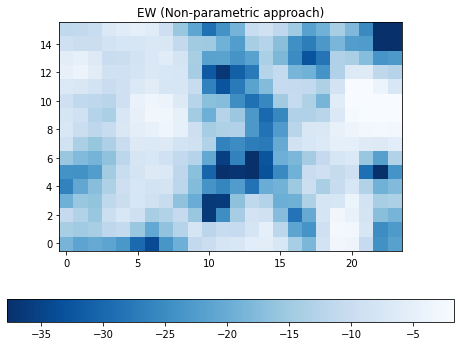

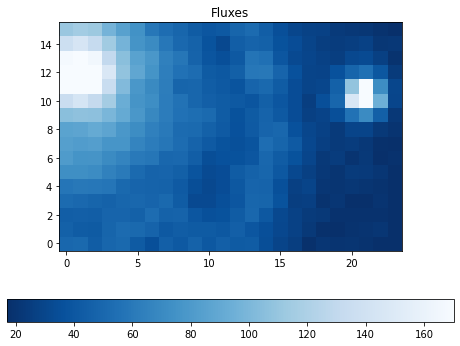

In [278]:
data= np.transpose(map_NP)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("EW (Non-parametric approach)")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

In [279]:
map_diff=abs(map_NP-map)

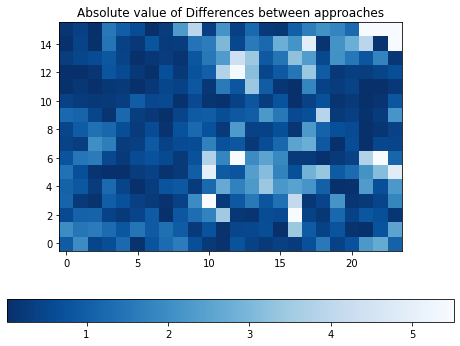

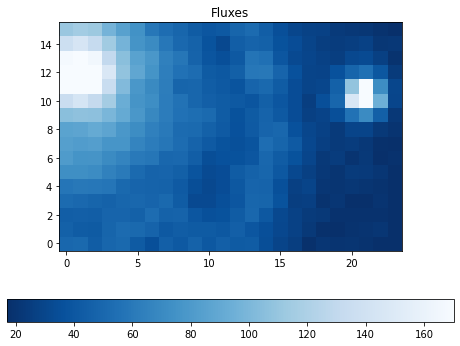

In [280]:
data= np.transpose(map_diff)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Absolute value of Differences between approaches")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

# Velocity maps

In [335]:
spec=region[:,10,10]

# chop data
x_chopped,y_chopped=chop_data(wave,spec,halpha_obs-40,halpha_obs+40)
            
# smooth data
y_smooth=smooth_spectra(y_chopped,3)
            
# fit to continuum
cont=continuum(x_chopped,y_smooth)[0]

In [336]:
velocity(x_chopped,y_chopped,cont,halpha)

2953.612206594574

In [338]:
halpha

6563

In [344]:
map=velocity_map(binned_region,wave,halpha_obs,halpha,kernel_size=3)

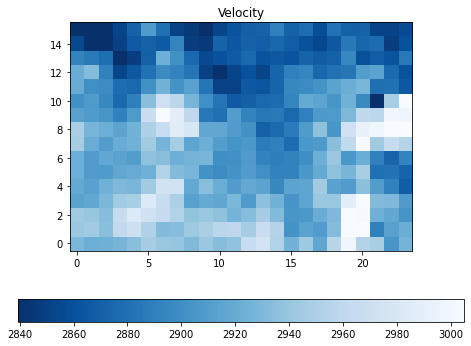

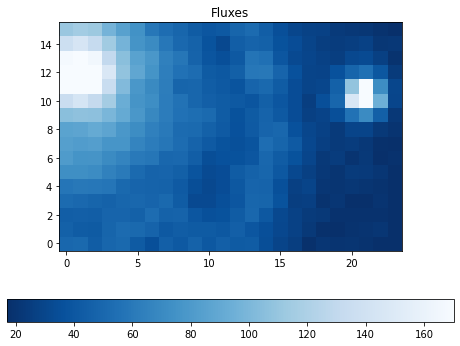

In [347]:
data= np.transpose(map)
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
cmap = plt.cm.Blues_r.copy()
cmap.set_bad(color='yellow')
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap=cmap,origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Velocity")
plt.show()


###


data=binned_region[100]
lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(8, 6))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")
plt.title("Fluxes")
plt.show()

# Voronoi binning

goal: reach a chosen constant S/N per bin

I will choose noise to be a constant, the standard deviation of the pixel values divided by 50.

In [25]:
header;


selection=findWavelengths(wave, 5000)
selection[1]
cube[selection[1]]

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype='>f4')

In [24]:
len(final_x)

NameError: name 'final_x' is not defined

what should I use for the parameter pixelsize? Do i knwo the pixel scale of the cubes?

In [ ]:
from vorbin.voronoi_2d_binning import voronoi_2d_binning

data=cube[selection[1]]
x_len=len(data)
y_len=len(data[0])

#creating arrays of grid x_positions and y_positions

x=range(0,x_len)
y=range(0,y_len)
final_x=[]
final_y=[]
final_signal=[]
j=0
for yy in y:
    i=0
    for xx in x:
        i+=1
        if i%100==0 & j%100==0:
            final_x.append(xx)
            final_y.append(yy)
            final_signal.append(data[xx,yy])
    j+=1
        


target_sn = 10 #whats a good target S/N?

final_x=np.array(final_x)
final_y=np.array(final_y)
final_signal=np.array(final_signal)

# Create a mask that is True where the values are not NaN
mask = ~np.isnan(final_x) & ~np.isnan(final_y) & ~np.isnan(final_signal)

# Apply the mask to filter out NaN values
#print(final_x, final_y, final_signal)2
final_x = final_x[mask]
final_y = final_y[mask]
final_signal = final_signal[mask]

# Print out the filtered arrays to check
#print(final_x, final_y, final_signal)


std_dev=np.nanstd(data)
noise = np.full(shape=len(final_signal),fill_value=std_dev/50)

# Compute Voronoi bins
out=voronoi_2d_binning(final_x, final_y, final_signal, noise, target_sn, plot=True,pixelsize=1)

plt.show();

## Spectra at Hα

In [240]:
z=0.009213

halpha_rest=6562.8
halpha_obs=6562.8*(1+z)
wave_selection=[]

wavelen,index=findWavelengths(wave, halpha_obs)

#plot_image(cube[index],wavelen,index,'Blues_r')


data=cube[index]

In [241]:
from astropy.stats import sigma_clipped_stats,gaussian_sigma_to_fwhm

from photutils import DAOStarFinder

mean, median, std = sigma_clipped_stats(data, sigma=5.0,maxiters=5) 
print((mean, median, std))

daofind = DAOStarFinder(fwhm=50, threshold=10.*std)

sources = daofind(data)

print("     Found %i stars in image " %len(sources))

(39.827423, 13.7210865, 63.754784)
     Found 6 stars in image 


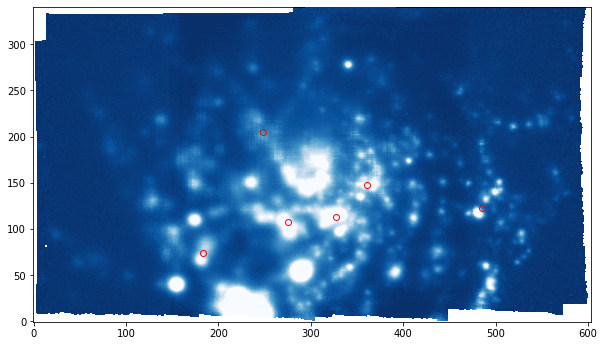

In [242]:

lo,up = np.nanpercentile(data,2),np.nanpercentile(data,98)
plt.figure(figsize=(10, 8))
plt.imshow(data,cmap='Blues_r',origin='lower',clim=(lo,up))
        
        
plt.plot(sources["xcentroid"],sources["ycentroid"],'or',mfc='none');

In [245]:
#defining (x,y) where we want to observe the spectra

i_brightest=np.argsort(sources['flux'])[0]

x_pos=int(sources[i_brightest][1])
y_pos=int(sources[i_brightest][2])

plotting spectra

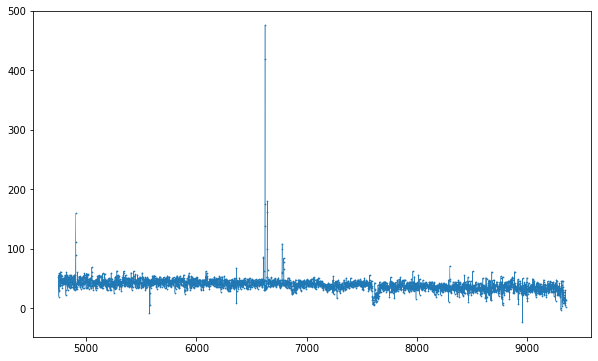

In [246]:
specdata=cube[:,y_pos,x_pos]

plt.figure(figsize=(10,6))

plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

Text(0.5, 1.0, 'Zoom in Halpha emission region')

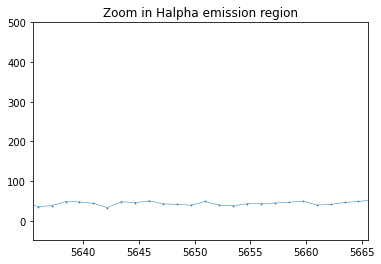

In [253]:
plt.plot(wave,specdata,linewidth=0.5,alpha=0.95)
plt.scatter(wave,specdata,s=0.5)

plt.xlim(halpha_obs-15,halpha_obs+15)
#plt.ylim(-20,90)
plt.title("Zoom in Halpha emission region")

fitting a Gaussian

In [64]:
bound1=int(findWavelengths(wave, 6618)[1])
bound2=int(findWavelengths(wave, 6625)[1])

In [66]:
x = wave[bound1:bound2]
y = specdata[bound1:bound2]

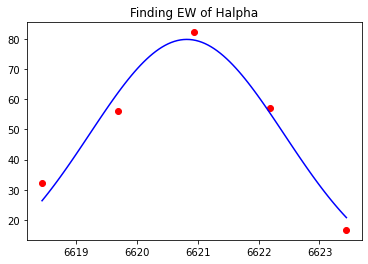

Fitted Amplitude (A): 79.7570857754474
Fitted Mean (mu): 6620.82077366716
Fitted Standard Deviation (sigma): 1.5989482179390269


In [67]:
initial_guess = [max(y), x[np.argmax(y)], 1]

params, covariance = curve_fit(gaussian, x, y, p0=initial_guess)
A_fit, mu_fit, sigma_fit = params


x_fit = np.linspace(min(x), max(x), 100)
y_fit = gaussian(x_fit, params[0], params[1], params[2])

plt.scatter(x, y, label="Data", color="red")
plt.plot(x_fit, y_fit, label="Gaussian Fit", color="blue")

plt.title("Finding EW of Halpha")
plt.show()


# Print fitted parameters
print(f"Fitted Amplitude (A): {A_fit}")
print(f"Fitted Mean (mu): {mu_fit}")
print(f"Fitted Standard Deviation (sigma): {sigma_fit}")

Integral using Simpson's rule: 281.6268


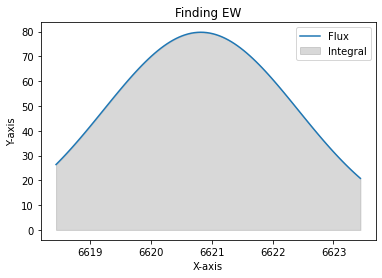

In [77]:

from scipy.integrate import simps

x = np.linspace(x_fit[0],x_fit[len(x_fit)-1], 100)  

# Compute the integral using Simpson's rule
integral_simps = simps(y_fit, x)

print(f"Integral using Simpson's rule: {integral_simps:.4f}")

# Plot the curve
plt.plot(x, y_fit, label="Flux")
plt.fill_between(x, y_fit, alpha=0.3, color='gray', label="Integral")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.title("Finding EW")
plt.show()


## Using Specutils

In [79]:
#from astropy.io import fits

from astropy import units as u

from astropy.visualization import quantity_support

quantity_support()  # for getting units on the axes below  

<astropy.visualization.units.quantity_support.<locals>.MplQuantityConverter at 0x7f656aa54e80>

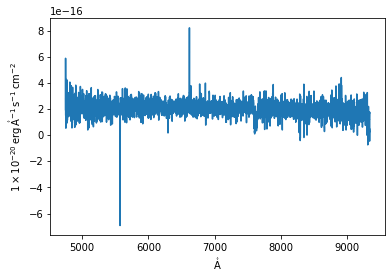

In [80]:
from specutils import Spectrum1D

lamb = wave * u.AA 

flux = specdata * 10**-17 * u.Unit(str(header["BUNIT"])) #taking the units from the header of the cube

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

f, ax = plt.subplots()  

ax.step(spec.spectral_axis, spec.flux) 
#ax.set_xlim(halpha_obs-15,halpha_obs+15)

Calculating SNR of the spectra

In [81]:
from specutils.analysis import snr_derived

snr_derived(spec)

<Quantity 4.432747>

In [82]:
import warnings

from specutils.fitting import fit_generic_continuum

with warnings.catch_warnings():  # Ignore warnings

    warnings.simplefilter('ignore')

    #normalizing by continuum estimate
    cont_norm_spec = spec / fit_generic_continuum(spec)(spec.spectral_axis) 

In [130]:
fit_generic_continuum.param_names

AttributeError: 'function' object has no attribute 'param_names'

ESTE ajuste está onde? fit_generic_continuum

(6598.263076399999, 6648.263076399999)

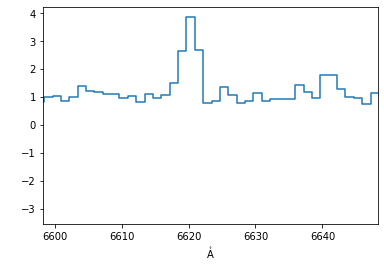

In [83]:
f, ax = plt.subplots()  

ax.step(cont_norm_spec.wavelength, cont_norm_spec.flux)  

ax.set_xlim((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm)  

In [84]:
from specutils import SpectralRegion

from specutils.analysis import equivalent_width

equivalent_width(cont_norm_spec, regions=SpectralRegion((halpha_obs-25)/10 * u.nm,(halpha_obs+25)/10 * u.nm))

<Quantity -11.53433117 Angstrom>

### Slicing a spectra into a particular region of interest

In [85]:
from specutils.manipulation import spectral_slab

ss = spectral_slab(cont_norm_spec, 5000.*u.AA, 5003.*u.AA)
ss

<Spectrum1D(flux=<Quantity [1.0896934 , 0.89806395]> (shape=(2,), mean=0.99388); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [5000.94238281 5002.19238281] Angstrom> (length=2))>

### Calculating Moments

In [86]:
from specutils.analysis import moment

m = moment(spec, order=1) 

m.shape  


print(m)

6953.192735554875 Angstrom


## Line Finding

In [87]:
cont_norm_spec; #continuum normalized spectra

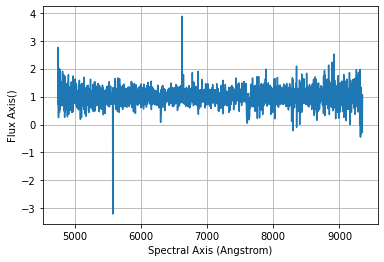

In [88]:
plt.plot(cont_norm_spec.spectral_axis, cont_norm_spec.flux) 

plt.xlabel('Spectral Axis ({})'.format(cont_norm_spec.spectral_axis.unit)) 

plt.ylabel('Flux Axis({})'.format(cont_norm_spec.flux.unit)) 

plt.grid(True)

Estimating uncertainty

In [89]:
ss = spectral_slab(cont_norm_spec, (halpha_obs-10)*u.AA, (halpha_obs+10)*u.AA) 
ss

<Spectrum1D(flux=<Quantity [0.83285743, 1.13031769, 0.9865351 , 1.07730173, 1.52001143,
           2.64860749, 3.87609295, 2.69161481, 0.78927651, 0.85823559,
           1.35906313, 1.08187466, 0.78013955, 0.85364203, 1.13819795,
           0.84613211]> (shape=(16,), mean=1.40437); spectral_axis=<SpectralAxis 
   (observer to target:
      radial_velocity=0.0 km / s
      redshift=0.0)
  [6613.44238281 6614.69238281 6615.94238281 ... 6629.69238281 6630.94238281
 6632.19238281] Angstrom> (length=16))>

In [90]:
from specutils.manipulation import noise_region_uncertainty

noise_region = SpectralRegion(0*u.um, 3*u.um)

cont_norm_spec = noise_region_uncertainty(ss, noise_region)

from specutils.fitting import find_lines_threshold

lines = find_lines_threshold(ss, noise_factor=3)  

lines[lines['line_type'] == 'emission']


If you want to suppress this warning either type 'specutils.conf.do_continuum_function_check = False' or see http://docs.astropy.org/en/stable/config/#adding-new-configuration-items for other ways to configure the warning. [specutils.analysis.flux]


line_center,line_type,line_center_index
Angstrom,,
float64,str8,int64
6620.9423828125,emission,6


### Parameter Estimation

our specdata is in units 10**(-20) erg / (Angstrom s cm2) so we have to convert it to Jy using:

1 Jy = 10**(-23) erg/(cm^2)

In [91]:
(str(header["BUNIT"]))

'10**(-20)*erg/s/cm**2/Angstrom'

In [92]:
"""auxspec=specdata*10**(20) #this is in erg / (Angstrom s cm2)
auxspec=specdata*10**(20)*10**(-10) #this is in erg / ( s cm2)"""
auxspec=specdata*halpha_obs**2/(3.34*10**(-19))

In [93]:
lamb = wave * u.AA 
flux = auxspec * u.Unit(str('Jy')) 

spec = Spectrum1D(spectral_axis=lamb, flux=flux)

In [99]:
from specutils import SpectralRegion

from specutils.fitting import estimate_line_parameters

from specutils.manipulation import extract_region

sub_region = SpectralRegion((halpha_obs-25)/10 *u.um, (halpha_obs+25)/10 *u.um)

sub_spectrum = extract_region(spec, sub_region)

In [100]:
result = estimate_line_parameters(spec, models.Gaussian1D())

print(result.amplitude)

print(result.mean) 

print(result.stddev) 

Parameter('amplitude', value=1.0786672501485288e+28, unit=Jy)
Parameter('mean', value=6953.192977414863, unit=Angstrom)
Parameter('stddev', value=1309.7939786398235, unit=Angstrom, bounds=(1.1754943508222875e-38, None))


In [97]:
from astropy.modeling import models
from specutils.fitting import fit_lines
from astropy import units as u


# Fit the spectrum and calculate the fitted flux values (``y_fit``)
g_init = models.Gaussian1D(amplitude=1.1*u.Jy, mean=halpha_obs*u.um, stddev=13*u.um)
g_fit = fit_lines(spec, g_init)


y_fit = g_fit(x*u.um)

# Plot the original spectrum and the fitted.
plt.plot(spec, , label="Original spectrum")
plt.plot(spec, y_fit, label="Fit result")
plt.title('Single fit peak')
plt.grid(True)
plt.legend()

SyntaxError: invalid syntax (1266487270.py, line 14)